# Documentation for Hydra Multi-Asset Verification Test
ACTION_LIST = [['test_add', 'test_q_for_r', 'test_r_for_r','test_r_for_q', 'test_remove']]



## Model Description

The methodology for the tests is to create two universes - one for Hydra and one for Uniswap - to subsequently be able to represent sequences of actions on each side. As the Hydra system is unique in its design and has no counterpart yet for approprate comparisons the role of the benchmark will be fulfilled by assembling several Uniswaps together in a way that everything that can be done in Hydra can be accordingly reproduced. This allows next to compare the implications on both systems and ultimately assess the quantitative and qualitative differences of results and impacts on the Hydra system and its agents. 

This approach necessitates the definition and specification of two models:
   - 1 Hydra Omnipool model with one instance that is defined in line with the [Hydra Mathematical Specification](https://hackmd.io/M7OeWimITKGVxBDHGQa6gQ?view)
   - 1 Uniswap model with several instances that each are responsible for a particular mechanism
        - which of 1 instance is used for liquidity provision in asset $R_i$: this is modeled as a Uniswap of $R_i$ and $Q$
        - which of 1 instance is used for liquidity provision in asset $R_j$: this is modeled as a Uniswap of $R_j$ and $Q$
        - which of 1 instance is used for swaps between assets $R_i$ and $R_j$: this is modeled as a Uniswap of $R_i$ and $R_j$
        
![](https://i.imgur.com/yb6Zh3T.png)
        
## Test cases

A variety of testcases can be explored with this model resulting from a combination of the following parameters
   
   - Event: Add Liquidity, Remove Liquidity, Swap Asset, Swap Asset for Base
   - Asset: $R_i$, $R_j$, $R_k$, $Q$
   - Multiple Action Type: Alternating, $i$ only, $j$ only
   - Composite Action Type: Alternating, Trade Bias
   - Enable Symmetric Liquidity: True, False
    
In addition to these settings also a fee structure can be imposed:

   - Fixed Fee

## Test agents

The model specifies a number of eight agents that each have their local balances, can interact with the system and are modeled to be responsible for **one action only**. This allows to track for each testcase how the balances will develop and to show independently which events will trigger changes to local and global states. Most importantly directly and indirectly affected variables can be easily identified.

Two dataframes of agents are initialized identically for both the Uniswap and the Hydra world and then work their way through on each side according to the testcase. Afterwards the effects on both sides can be compared.

![](https://i.imgur.com/r9IAJMr.png)



## Composite Action Tests

Besides being able to test all mechanisms individually also compositions of actions can be performed. This means selecting and combining two from the above testcases and letting the respective agents take the actions repeadetly. A composition action test therefore is defined as two actions which each can be a combination of *event* and *asset* selected from the list of testcases above, for example:
- Add liquidity in $R_i$ and Add liquidity in $R_j$
- Add liquidity in $R_i$ and Swap $R_i$ for $Q$
- Remove liquidity in $R_j$ and Swap $R_i$ for $Q$
- ...

In total there would be 28 composit pairs which can be derived from this decision tree:
selecting any one of the four primitive mechanisms of: **trade in/out** or **add/remove liquidity** of some given asset and then the subsequent action could be the three remaining mechanisms of the same asset or doing anyone of the four mechanisms in another asset.  

These basic combinations can be explored before further proceeding with
- trade sizes,
- trade frequencies,
- randomization,...



## Introduction to Uniswap
>Uniswap is an automated market maker for exchanging ERC20 tokens. Anyone can become a liquidity provider, and invest in the liquidity pool of an ERC20 token. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://uniswap.io/

There are basically eight ways (_mechanisms_) in which an agent can interact with an instance of Uniswap (https://github.com/Uniswap/uniswap-v1/blob/master/contracts/uniswap_exchange.vy):
1. `addLiquidity`: deposit ETH and tokens in the liquidity pool; mint UNI tokens - "shares" of that Uniswap instance - in exchange;
1. `removeLiquidity`: burn UNI tokens; withdraw a proportional amount of ETH and tokens in exchange;
1. `ethToTokenInput`: user specifies an exact amount of ETH they send; receives corresponding amount of tokens
1. `ethToTokenOutput`: user sends some ETH and specifies an exact amount of tokens they want to buy; Uniswap refunds ETH sent in excess
1. `tokenToEthInput`: user specifies an exact amount of tokens they send; receives corresponding amount of ETH
1. `tokenToEthOutput`: user specifies an exact amount of ETH they want to buy; Uniswap takes the corresponding amount of tokens from the user account
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" (effectively a `tokenToEthInput` in instance A combined with a `ethToTokenInput` in instance B)
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Uniswap takes the corresponding amount of "token A" from the user account (effectively a `ethToTokenOutput` in instance B combined with a `tokenToEthOutput` in instance A)

## Limitations and simplifications of this model
* When triggering mechanisms, Uniswap users may include conditions they would like to apply to the transaction. For example, they could define a minimum amount of UNI tokens they wish to receive as a result of adding liquidity to the pool; or the maximum number of tokens they are willing to pay for the amount of ETH requested in a `tokenToEthOutput` operation; or a deadline after which the transaction should not be processed. **This simplified model does not account for this kind conditioning.**

* The `ethToTokenOutput`, `tokenToEthOutput` mechanisms are not implemented. **All swaps are treated as of the "input defined" type.**

* The `tokenToToken` mechanism are not implemented, as they are merely a `tokenToEth` in the context of a single Uniswap instance.

* **User _behavior_ has not been modeled**. User _actions_ are derived from the history of events of the Uniswap instance being analyzed.

## Introduction to Hydra
>Hydra is an automated market maker that generalizes the concept of Uniswap and Balancer to a) an arbitrary number of dimensions and b) a variant weight distaribution of assets in the pool that changes in accordance with action sequences in the pool. Anyone can become a liquidity provider, and invest in the 'Omnipool'. This allows other users to trade that token for other tokens at an exchange rate based on their relative availibility. When a token trade is executed, a small fee is paid to the liquidity providers that enabled the transaction.
https://hydradx.io/

There is a predefined set of (_mechanisms_) in which an agent can interact with an the Hydra Protocol :
1. `addLiquidity`: deposit a risk asset in the omnipool; mint HDX tokens - "shares" of this risk asset - in exchange;
1. `removeLiquidity`: burn HDX tokens; withdraw a proportional amount of the risk asset in exchange;
1. `tokenToTokenInput`: user specifies an exact amount of "token A" they send; receives corresponding amount of "token B" 
1. `tokenToTokenOutput`: user specifies an exact amount of "token B˜ they want to buy; Hydra takes the corresponding amount of "token A" from the user account 



## Model File structure

The folder **model** contains:

 - a file config.py: 

    This file configures the simulation experiments by setting the number of monte carlo runs, the number of timesteps for the simulation and the simulation parameters. It also aggregates the partial states and the initial state variables.
    
    The purpose of this file is to *configure and initialize* the experiment.
    
    
 - a file partial_state_update_block.py

    This file defines each partial state update block individually. This feature allows cadCAD to divide each simulation timestep into several 'blocks' where different state variables are mutated conditioned upon the policy input.
    
    In the current setting 
    - the first block maps the user action to the appropriate mechanism in the uniswap world
    - the second block maps the user action to the appropriate mechanism in the hydra world
    - the third block resolves the quantities of HDX and weights in the hydra world
    - the forth block calculates the metrics: the swap prices in the uniswap world and the pool prices in the hydra world

    This file corresponds to the system specification diagram, where each column is one partial state update block 
    
    The purpose of this file is to *define* the sequence and details of state updates for each simulation timestep. The relevant mechanisms are imported from the files in the **parts** folder
    
    
 - a file plot_utils.py

    This file defines all plot functions that can be called in the jupyter notebook to visualize the results. In general there are three types of plots:
    - plots related to the uniswap world (do not contain the word 'hydra')
    - plots related to the hydra world (contain the word 'hydra')
    - general plots applicable to both worlds (f.e Impermanent Loss)

    It also can be distinguished between plots related to global system variables and local agent variables:
    - global variables (do not contain the word 'agent')
    - local variables (contain the word 'agent')

    The purpose of this file is to *define* the way how particular properties can be plotted over time.
    

 - a file run.py

    This file *defines* the run and postprocessing methods and is used to execute the simulation run:
    - run() is used to execute the simulation and create a dataframe
    - postprocessing is used to extract relevant metrics from the simulation output in the dataframe

     The purpose of this file is to *execute* the simulation and *create* metrics.
     
     
 - a file state_variables.py

    This file *sets* the number of agents and *defines* the local (agent-level) state variables, *sets* the number of assets and *defines* the global (system-state) variables of the system, *computes* the prices of the assets and *defines* the initial state object
    - the agent states describe their holdings of assets that agents have contributed to the pool or still hold outside as well as their quantities of shares they received for their contribution
    - the global states describe the quantities of assets in the system
    - price variables are computed from the states both in the uniswap and hydra world
    - the initial state object consists of 
        - two agent dataframes, one for each world respectively
        - two sets of global variables, one for each world respectively
        - prices for each world (? is pool = prices ?)

    The purpose of this file is to *define* the global and local states of the system.
    
    
 - a file sys_params.py

    This file *contains* the system parameters and allows to select items from a list for them. Following parameters can be defined:
    - trade action type
    - liquidity action type
    - multiple asset action type
    - composite action type
    - liquidity add type (symmetry)

    In addition the following is set
    - initial values for assets 
    - hard coded fee value
    - choice of the system parameters from the list above
    

 - a folder **parts** which itself contains general files relevant for both instances, files related specifically to Uniswap and files related specifically to Hydra 
      - [action.py](model/parts/action.py)
       This is an action dictionary which drives the model. As there are no behavioral assumptions in the model yet, currently actions are prescribed actions in testing mode derived from events. However, action schema respects https://www.kaggle.com/markusbkoch/uniswap-ethdai-exchange as much as possible, allowing for future analysis against uniswap transaction datasets.
        This file contains a function called 'actionDecoder' which takes its inputs from the file sys_params.py and maps those encoded events to agent actions. At first an arbitrary action dictionary is defined which then is adapted according to the choices of system parameters. In particular relevant are the parameter definitions of the asset, the composite and whether there is a trade or liquidity event defined.
        
    - [uniswap.py](model/parts/uniswap.py)
     Reads in action output and directs the action to the appropriate Uniswap mechanism for each corresponding Uniswap instance. Currently there are two instances in place, namely the R_i<>Q pair and the R_j<>Q pair. Both instances have their respective requisite state variables: UNI_Qx, UNI_Rx, and UNI_Sx.

    - [utils.py](model/parts/utils.py)
    Computes the state update for each Uniswap state variable and outputs the updated global state variables.
        
     - [agent_utils.py](model/parts/agent_utils.py)
     Computes the corresponding agent local state for each Uniswap agent resolving their action and outputs the updates local state variables.

      -  [hydra.py](model/prts/hydra.py)
     Reads in action output and directs the action to the appropriate Hydra mechanism for each state variable: Q, Sq, and pool.
    
      - [hydra_utils.py](model/parts/hydra_utils.py)
     Computes the state update for each Hydra state variable

    -  [asset_utils.py](model/parts/asset_utils.py)
     Computes the state update for each Reserve Asset in a Hydra Omnipool

    -  [hydra_agent_utils_class.py](model/parts/hydra_agent_utils_class.py)
     Computes the corresponding agent local state for each Hydra agent resolving their action and outputs the updates local state variables.
     
     #### The interrelations between the files are shown here:
     
    ![](https://i.imgur.com/mNhfQE4.png)



# Testcase Definition

#### Simulation Settings
- There are 100 timesteps for each simulation run
- Each testcase has 100 MC runs with different randomized variables
- Block 1 randomizes starting liquidity balances (explained below in section 'Block 1')



#### Agent Activities - Action Sequence

There are two agents acting during the simulation. The trading agent performs "R-for-R" trades of equal size but varying direction over most simulation timesteps. The liquidity agent provides liquidity to the pool at timestep 10 and removes the liquidity from the pool at timestep 90.

##### Trading agent

- One Agent performs random "R-for-R" trades during the simulation. 
- The direction of the trade is a random coin flip for each timestep.
- The size of the trade is fixed at $1000$ for each timestep.
- The agent does not act at timestep 10 nor timestep 90.

##### Liquidity agent

- One Agent provides liquidity in Asset "i" to the pool 
- He provides the liquidity at timestep 10
- He removes the liquidity at timestep 90
- He does not act at other timesteps

#### Block 1:

| #   |   Run   | a  | $\mu_i$ |          $\sigma_i$          | $\mu_j$ |          $\sigma_j$          | $\mu$ | $\sigma$ | Total runs         |
| --- |:-------:|:-------:|:-------:|:----------------------------:|:-------:|:----------------------------:| ----- | -------- | ------------------ |
| 1   | 001-100 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 2   | 101-200 |   0.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 3   | 201-300 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 4   | 301-400 |    1    |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$  | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |
| 5   | 401-500 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 2$  |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 2$  | $1.000$ | $0$      | $100$ |
| 6   | 501-600 |   1.5   |   $100.000$   | $\frac{\mu_i}{\sigma_i}= 50$ |   $100.000$   | $\frac{\mu_j}{\sigma_j}= 50$ | $1.000$ | $0$      | $100$ |

All tests in block 1 are performed as 100 **MonteCarlo Experiments** with the following randomization:
- The initial balances of the liquidity pools are drawn randomly for each MC run from the same lognormal distribution with $\mu_i$ and $\mu_j$ fixed at $100000$
    - The underlying mean for the lognormal liquidity draw is $\log{100000}$
    - The underlying standard deviation for the lognormal liquidity draw is $\sqrt{\log{1 + \frac{2000^2}{100000^2}}}$
- The action sequence of the agents is randomized in that sense that:
    - For each individual MC run the sequence is identical for the Uniswap and Hydra side of the model. For each timestep of the simulation exactly the same event takes place on both sides.
    - For each individual MC run the trading directions are randomized for each timestep. Therefore the event sequence for each run will be different.
    - For all MC runs the trading amount is always equal to $1000$




# Testcase in this notebook


This notebook documents the results of the following experiment:
- Settings from Block 1 as outlined above
- Testcases **2**, **4** and **6**
- Sweep over three values for $a \in \{0.5, 1, 1.5 \}$ with a fixed $\mu$-to-$\sigma$-ratio of $50$.

The experiment result dataframe is saved into a pickle file and analyzed throughout this notebook.

## Run Model

The following command lines import all packages, experiments and run the model 

This is the execution of cadcad. This writes the config object, does the execution and returns the rdf - which is a data object that shows the rows and columns of results in a dataframe

Here is one additional option as well. The postprocessing causes the index of the results to be every forth because of the cadcad architecture where the partial state updates are the substeps. With this option selected we see only the end of each timestep - the last substep. Therefore only final results are shown. To get a line for each substep the postprocessing needs to be deactivated. 

In [1]:
from model.config_wrapper import ConfigWrapper

from model import run_wrapper
from cadCAD import configs

# parametric_experiment = ConfigWrapper()
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']
# parametric_experiment.get_config()

running file: config_wrapper.py
end of file: config_wrapper.py
running file: run_wrapper.py
end of file: run_wrapper.py


In [2]:
# import model as model


In [3]:
# parametric_experiment = ConfigWrapper(model)


In [4]:
# del configs[:]

# parametric_experiment.append()

In [5]:
# get_keys = parametric_experiment.get_config()
# get_keys[0]['M']

In [6]:
# Dependences
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Experiments
from model import run
from model.parts.utils import *
from model.plot_utils import *

pd.options.display.float_format = '{:.2f}'.format

%matplotlib inline

# df = run.run()
# rdf = run.postprocessing(df)
# rdf = df # debugging substeps
# pd.set_option("mode.chained_assignment", None)


running file: run.py
running file: state_variables.py
running file: initialize_liquidity.py
end of file: initialize_liquidity.py
running file: asset_utils.py
end of file: asset_utils.py
end of file: state_variables.py
running file: partial_state_update_block.py
end of file: action_list.py
end of file: partial_state_update_block.py
running file: sim_setup.py
end of file: sim_setup.py
[102513.07919145  99311.49114414 103289.36311277 107907.47516136
  98836.78217111  98836.8632545  108210.8396583  103909.25524514
  97681.39567448 102748.19189447  97710.96299701  97699.67501518
 101216.39487923  90882.35636359  91741.80142467  97229.42162275
  95064.94010846 101582.64927056  95564.10889559  93186.14722757
 107598.51912228  98878.1631456  100338.00021993  93128.21875062
  97316.44990982 100555.8056843   94410.89003523 101895.05002056
  97043.27335419  98553.01252306  97038.09499273 109697.46842654
  99932.57873647  94851.98731243 104195.7937909   94081.93986744
 101049.13135016  90671.93084

Omni_P_RQi ================== 0.09241218376621953
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 108210.83965830287, 'S': 10000, 'W': 10000, 'P': 0.09241218376621953, 'dP': 0}, 'j': {'R': 109883.48942634628, 'S': 10000, 'W': 10000, 'P': 0.09100548273635678}, 'k': {'R': 109883.48942634628, 'S': 10000, 'W': 10000, 'P': 0.09100548273635678}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09623781805006797
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 103909.25524514152, 'S': 10000, 'W': 10000, 'P': 0.09623781805006797, 'dP': 0}, 'j': {'R': 100876.16025662293, 'S': 10000, 'W': 10000, 'P': 0.09913144963647107}, 'k': {'R': 100876.16025662293, 'S': 10000, 'W': 10000, 'P': 0.09913144963647107}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09623781805006797
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.

Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 91741.80142466674, 'S': 10000, 'W': 10000, 'P': 0.10900156574984461, 'dP': 0}, 'j': {'R': 99043.40029631108, 'S': 10000, 'W': 10000, 'P': 0.1009658389158965}, 'k': {'R': 99043.40029631108, 'S': 10000, 'W': 10000, 'P': 0.1009658389158965}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10900156574984461
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 91741.80142466674, 'S': 10000, 'W': 10000, 'P': 0.10900156574984461, 'dP': 0}, 'j': {'R': 99043.40029631108, 'S': 10000, 'W': 10000, 'P': 0.1009658389158965}, 'k': {'R': 99043.40029631108, 'S': 10000, 'W': 10000, 'P': 0.1009658389158965}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10284952674922163
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97229.42162274636, 'S': 10000, '

Omni_P_RQi ================== 0.10113456482069816
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98878.16314559751, 'S': 10000, 'W': 10000, 'P': 0.10113456482069816, 'dP': 0}, 'j': {'R': 95557.5986771451, 'S': 10000, 'W': 10000, 'P': 0.10464892523917871}, 'k': {'R': 95557.5986771451, 'S': 10000, 'W': 10000, 'P': 0.10464892523917871}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10113456482069816
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98878.16314559751, 'S': 10000, 'W': 10000, 'P': 0.10113456482069816, 'dP': 0}, 'j': {'R': 95557.5986771451, 'S': 10000, 'W': 10000, 'P': 0.10464892523917871}, 'k': {'R': 95557.5986771451, 'S': 10000, 'W': 10000, 'P': 0.10464892523917871}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10113456482069816
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'p

Omni_P_RQi ================== 0.09814019422908063
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101895.05002056363, 'S': 10000, 'W': 10000, 'P': 0.09814019422908063, 'dP': 0}, 'j': {'R': 97209.94026980558, 'S': 10000, 'W': 10000, 'P': 0.10287013830319269}, 'k': {'R': 97209.94026980558, 'S': 10000, 'W': 10000, 'P': 0.10287013830319269}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09814019422908063
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101895.05002056363, 'S': 10000, 'W': 10000, 'P': 0.09814019422908063, 'dP': 0}, 'j': {'R': 97209.94026980558, 'S': 10000, 'W': 10000, 'P': 0.10287013830319269}, 'k': {'R': 97209.94026980558, 'S': 10000, 'W': 10000, 'P': 0.10287013830319269}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.1030468125647614
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>

Omni_P_RQi ================== 0.09597316394621358
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104195.79379090095, 'S': 10000, 'W': 10000, 'P': 0.09597316394621358, 'dP': 0}, 'j': {'R': 95509.6860968243, 'S': 10000, 'W': 10000, 'P': 0.10470142253281367}, 'k': {'R': 95509.6860968243, 'S': 10000, 'W': 10000, 'P': 0.10470142253281367}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09597316394621358
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104195.79379090095, 'S': 10000, 'W': 10000, 'P': 0.09597316394621358, 'dP': 0}, 'j': {'R': 95509.6860968243, 'S': 10000, 'W': 10000, 'P': 0.10470142253281367}, 'k': {'R': 95509.6860968243, 'S': 10000, 'W': 10000, 'P': 0.10470142253281367}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10629032537051664
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {

Omni_P_RQi ================== 0.10057955344999182
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99423.78601802007, 'S': 10000, 'W': 10000, 'P': 0.10057955344999182, 'dP': 0}, 'j': {'R': 92281.73090248562, 'S': 10000, 'W': 10000, 'P': 0.10836381049860269}, 'k': {'R': 92281.73090248562, 'S': 10000, 'W': 10000, 'P': 0.10836381049860269}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10057955344999182
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 99423.78601802007, 'S': 10000, 'W': 10000, 'P': 0.10057955344999182, 'dP': 0}, 'j': {'R': 92281.73090248562, 'S': 10000, 'W': 10000, 'P': 0.10836381049860269}, 'k': {'R': 92281.73090248562, 'S': 10000, 'W': 10000, 'P': 0.10836381049860269}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.10151595456865903
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

Omni_P_RQi ================== 0.10920940360846627
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 91567.20639050141, 'S': 10000, 'W': 10000, 'P': 0.10920940360846627, 'dP': 0}, 'j': {'R': 101495.0624438623, 'S': 10000, 'W': 10000, 'P': 0.09852696041771565}, 'k': {'R': 101495.0624438623, 'S': 10000, 'W': 10000, 'P': 0.09852696041771565}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10920940360846627
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 91567.20639050141, 'S': 10000, 'W': 10000, 'P': 0.10920940360846627, 'dP': 0}, 'j': {'R': 101495.0624438623, 'S': 10000, 'W': 10000, 'P': 0.09852696041771565}, 'k': {'R': 101495.0624438623, 'S': 10000, 'W': 10000, 'P': 0.09852696041771565}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09839363346941248
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>:

config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98466.77848448475, 'S': 10000, 'W': 10000, 'P': 0.10155709523467027, 'dP': 0}, 'j': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}, 'k': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10155709523467027
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 98466.77848448475, 'S': 10000, 'W': 10000, 'P': 0.10155709523467027, 'dP': 0}, 'j': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}, 'k': {'R': 102395.93809449964, 'S': 10000, 'W': 10000, 'P': 0.09766012388861708}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09835834117823271
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101669.05907735114, 'S': 10000, 'W': 10000, '

config_param a value =============  0.5
Omni_P_RQi ================== 0.09602122415440219
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104143.64207563105, 'S': 10000, 'W': 10000, 'P': 0.09602122415440219, 'dP': 0}, 'j': {'R': 104931.62290986086, 'S': 10000, 'W': 10000, 'P': 0.09530015568891252}, 'k': {'R': 104931.62290986086, 'S': 10000, 'W': 10000, 'P': 0.09530015568891252}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09602122415440219
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 104143.64207563105, 'S': 10000, 'W': 10000, 'P': 0.09602122415440219, 'dP': 0}, 'j': {'R': 104931.62290986086, 'S': 10000, 'W': 10000, 'P': 0.09530015568891252}, 'k': {'R': 104931.62290986086, 'S': 10000, 'W': 10000, 'P': 0.09530015568891252}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09344756807597604
Initial Q HDX: 20000.0
config_init_s

Omni_P_RQi ================== 0.09247948463690465
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 108132.09047673935, 'S': 10000, 'W': 10000, 'P': 0.09247948463690465, 'dP': 0}, 'j': {'R': 101719.30806103669, 'S': 10000, 'W': 10000, 'P': 0.09830975250047413}, 'k': {'R': 101719.30806103669, 'S': 10000, 'W': 10000, 'P': 0.09830975250047413}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09247948463690465
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 108132.09047673935, 'S': 10000, 'W': 10000, 'P': 0.09247948463690465, 'dP': 0}, 'j': {'R': 101719.30806103669, 'S': 10000, 'W': 10000, 'P': 0.09830975250047413}, 'k': {'R': 101719.30806103669, 'S': 10000, 'W': 10000, 'P': 0.09830975250047413}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.11398600581305049
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.As

Omni_P_RQi ================== 0.10262355865021014
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97443.5123038829, 'S': 10000, 'W': 10000, 'P': 0.10262355865021014, 'dP': 0}, 'j': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.0976179726144399}, 'k': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.0976179726144399}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.10262355865021014
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 97443.5123038829, 'S': 10000, 'W': 10000, 'P': 0.10262355865021014, 'dP': 0}, 'j': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.0976179726144399}, 'k': {'R': 102440.15248602668, 'S': 10000, 'W': 10000, 'P': 0.0976179726144399}}}
config_param a value =============  1
Omni_P_RQi ================== 0.10262355865021014
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {

Omni_P_RQi ================== 0.09746787458326636
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102597.90769785429, 'S': 10000, 'W': 10000, 'P': 0.09746787458326636, 'dP': 0}, 'j': {'R': 92709.88486477257, 'S': 10000, 'W': 10000, 'P': 0.10786336337906238}, 'k': {'R': 92709.88486477257, 'S': 10000, 'W': 10000, 'P': 0.10786336337906238}}}
config_param a value =============  1
Omni_P_RQi ================== 0.09746787458326636
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 102597.90769785429, 'S': 10000, 'W': 10000, 'P': 0.09746787458326636, 'dP': 0}, 'j': {'R': 92709.88486477257, 'S': 10000, 'W': 10000, 'P': 0.10786336337906238}, 'k': {'R': 92709.88486477257, 'S': 10000, 'W': 10000, 'P': 0.10786336337906238}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09951608984665197
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'

Omni_P_RQi ================== 0.09853121616812884
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101490.67867929784, 'S': 10000, 'W': 10000, 'P': 0.09853121616812884, 'dP': 0}, 'j': {'R': 95679.57969596233, 'S': 10000, 'W': 10000, 'P': 0.10451550928397316}, 'k': {'R': 95679.57969596233, 'S': 10000, 'W': 10000, 'P': 0.10451550928397316}}}
config_param a value =============  1.5
Omni_P_RQi ================== 0.09870400956050585
Initial Q HDX: 20000.0
config_init_state  <class 'model.parts.asset_utils.Asset'>: {'pool': {'i': {'R': 101313.00688316995, 'S': 10000, 'W': 10000, 'P': 0.09870400956050585, 'dP': 0}, 'j': {'R': 100771.10359654446, 'S': 10000, 'W': 10000, 'P': 0.09923479691198807}, 'k': {'R': 100771.10359654446, 'S': 10000, 'W': 10000, 'P': 0.09923479691198807}}}
config_param a value =============  0.5
Omni_P_RQi ================== 0.09870400956050585
Initial Q HDX: 20000
config_init_state  <class 'model.parts.asset_utils.As

In [7]:
(data, tensor_field, sessions) = run_wrapper.run(drop_midsteps=True)

experiments = data



                  ___________    ____
  ________ __ ___/ / ____/   |  / __ \
 / ___/ __` / __  / /   / /| | / / / /
/ /__/ /_/ / /_/ / /___/ ___ |/ /_/ /
\___/\__,_/\__,_/\____/_/  |_/_____/
by cadCAD

Execution Mode: local_proc
Configuration Count: 100
Dimensions of the first simulation: (Timesteps, Params, Runs, Vars) = (100, 16, 3, 22)
Execution Method: local_simulations
SimIDs   : [0, 0, 0, 1, 1, 1, 2, 2, 2, 3, 3, 3, 4, 4, 4, 5, 5, 5, 6, 6, 6, 7, 7, 7, 8, 8, 8, 9, 9, 9, 10, 10, 10, 11, 11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16, 17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22, 22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27, 28, 28, 28, 29, 29, 29, 30, 30, 30, 31, 31, 31, 32, 32, 32, 33, 33, 33, 34, 34, 34, 35, 35, 35, 36, 36, 36, 37, 37, 37, 38, 38, 38, 39, 39, 39, 40, 40, 40, 41, 41, 41, 42, 42, 42, 43, 43, 43, 44, 44, 44, 45, 45, 45, 46, 46, 46, 47, 47, 47, 48, 48, 48, 49, 49, 49, 50, 50, 50, 51, 51, 51, 52, 52, 52, 53, 

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109552.55 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 7926.461351858766 from reserve 136391.51407275797
**********
H_chosen_agent delta_Ri =  -8429.25103487102
H_agent r out =  89987.82595071518
**********
Q ADDED INTO POOL: 1000 to existing amount 20694.333222305035
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8429.25103487102 from reserve 95500.9051421683

delta_Ri =  7919.900378830372
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109233.04 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7989.357326962485
H_agent r out =  109233.04112677935
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0

H_chosen_agent  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46783.19 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5261.533586338631
H_agent r out =  46783.18936659074
**********
Q ADDED INTO POOL: 1000 to existing amount 30324.484493874596
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5261.533586338631 from reserve 110464.58504107477
**********
 **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65990.64 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6793.056844914786
H_agent r out =  65990.63815019849
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 129106.80 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s

H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 41738.960212236634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3232.5429452754247 from reserve 105446.39896244243
**********

H_agent r out =  28208.929376020722
**********
Q ADDED INTO POOL: 1000 to existing amount 33593.87933270864
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3909.508003715618 from reserve 94890.32505050475
**********
H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4181.889208400161 from reserve 116304.5493294387
**********
H_chosen_agentH_chosen_agentdelta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142836.98 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5522.530996893927
H_agent r out =  142836.98310782682
**********
Q ADDED INTO POOL: 1000 to existing amount 31154.56649999982
**********
****


delta_Ri = delta_Ri =  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3035.0881182340427 from reserve 88389.53943663492
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14145.67 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -4099.581562697758
H_agent r out =  45130.99125645582
**********
Q ADDED INTO POOL: 1000 to existing amount 35654.42676987547
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4099.581562697758 from reserve 107967.77342756762
**********2652.5693414937095delta_Ri =  -2994.7146221510907
H_agent r out = 
H_agent r out =  157449.2641319605
**********
 
Q ADDED INTO POOL: 1000 to existing amount 45070.46471928645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2652.5693414937095 from reserve 95387.59912254286
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -340.17 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2672.5693225512955
H_agent r out =  -340.16506227573655
**********
Q ADDED INTO POOL: 1000 to existing amount 39944.05656699185
**********

delta_Ri = delta_Ri = -3738.535854413258H_chosen_agent
 H_chosen_agent3178.1784892606406
H_agent r out =  177639.69614009504
**********
Q ADDED INTO POOL: 1000 to existing amount 37974.45327960011
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3178.1784892606406 from reserve 91671.79500404384
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3141.99 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2453.5009104076644
H_agent r out =  3141.993335801

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26502.89 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  -2448.327707556246
H_agent r out =  25554.88891989442
**********
Q ADDED INTO POOL: 1000 to existing amount 45682.563773494265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2448.327707556246 from reserve 89067.96811134752
**********
H_chosen_agent-2470.2074054266327
H_agent r out =  -5579.865019585828
**********
Q ADDED INTO POOL: 1000 to existing amount 41167.247454584525
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2470.2074054266327 from reserve 79630.97463871699
**********
  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180817.87 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 


H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12873.38 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********delta_Ri =  -3173.567287477311
H_agent r out =  16628.036176284004
**********
Q ADDED INTO POOL: 1000 to existing amount 40104.60048230417
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3173.567287477311 from reserve 98917.39928905308
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1981.5374162322664 from reserve 80021.09727769287
**********
H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174409.89 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2378.348836161189
H_agent r out =  174409.88816376036
**********
Q ADDED INTO POOL: 1000 to existing amount 45830.4462352948

********** ********** 

POOL RESERVE ONE REMOVING ASSET i in amount 2072.089599583202 from reserve 72859.50422645759
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179093.13 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10097.16 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186484.80 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agentdelta_Ri =  2184.387733123709
H_agent r out =  179093.12916645044
**********
Q ADDED INTO POOL: 1000 to existing amount 47401.451026023846
**********
**********
POOL RESERVE ONE REMOVIN

-2742.703488366184
**********
Q ADDED INTO POOL: 1000 to existing amount 43290.82198764045
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2170.740517879574 from reserve 74606.04653978578
**********
H_chosen_agentH_chosen_agent  delta_Ri =  -1234.478994030564
H_agent r out =  -24887.80863939619
**********
Q ADDED INTO POOL: 1000 to existing amount 52062.89308877573
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1234.478994030564 from reserve 52793.58703508785
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25775.53 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204463.06 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  H_chosen_agentH_chosen_agent    m  

 H_chosen_agent**********-799.2393692124756   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31751.22 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211991.07 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2333.7203191322437
H_agent r out =  211991.06514464738
**********
H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 42676.4485442109
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2333.7203191322437 from reserve 78320.42599949152
**********POOL RESERVE ONE REMOVING ASSET i in amount 1541.8964303114583 from reserve 72483.83949391427
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192894.92 110000.00 110000.00 170

-1197.4084746931771
H_agent r out =  -29721.013159884107
**********
Q ADDED INTO POOL: 1000 to existing amount 52690.48879637169
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1197.4084746931771 from reserve 51960.38251459993
**********
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 2084.0229597645875 from reserve 76475.83116245933
**********
H_chosen_agentH_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220828.96 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2058.298803570167
H_agent r out =  220828.96367807654
**********
Q ADDED INTO POOL: 1000 to existing amount 44811.252609625764
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2058.298803570167 from reserve 73482.52746606233
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195789.

H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1602.6423347226971 from reserve 73897.83136196012
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6579.58 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2127.9619219377423
H_agent r out =  -6579.575874549773
**********
Q ADDED INTO POOL: 1000 to existing amount 45609.272029664826   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34327.91 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1038.794386564031
H_agent r out =  -34327.91425293446
**********
Q ADDED INTO POOL: 1000 to existing amount 55841.562671573636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1038.794386564031 from reserve 48353.48142154958
**********
H_chosen_agent 
H_chosen_ag

0 130000.00 180000.00 160000.00  **********Q ADDED INTO POOL: 1000 to existing amount 49547.47066444768
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1953.8164366016945 from reserve 79026.62777962988
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206672.38 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1912.0651377653635
H_agent r out =  -24723.02237918962
**********
Q ADDED INTO POOL: 1000 to existing amount 48945.9217451784
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1912.0651377653635 from reserve 76566.34073357946
**********
delta_Ri = 
delta_Ri =  -1595.641490657446
H_agent r out =  -10896.097227813294
**********
Q ADDED INTO POOL: 1000 to existing amount 54178.076308075346
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1595.641490657446 from reserve 71616.9819636398
**********
H_chosen

0 130000.00 180000.00 160000.00  
POOL REMOVE LIQUIDITY weight fraction of pool = 0.235333803358457


delta_Ri =  -1503.6853360763334
H_agent r out =  -14017.800532086221
**********
Q ADDED INTO POOL: 1000 to existing amount 55510.76483510338
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1503.6853360763334 from reserve 69495.27865936687
**********
delta_Ri = 154914.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28551.31 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1811.2166759094075
H_agent r out =  -28551.311819092258
**********
Q ADDED INTO POOL: 1000 to existing amount 41432.847954830664 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1811.2166759094075 from reserve 58870.528834926
**********
-9773.526263564594
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
*********

H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35182.91 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  **********

********** delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41107.34 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1886.0386172873882 from reserve 77617.0013857004
**********
H_chosen_agent  -1844.9864031243494
H_agent r out =  -20014.445255130366
**********
Q ADDED INTO POOL: 1000 to existing amount 48229.066790944395
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1844.9864031243494 from reserve 71822.33691598142
**********
-1430.458201549336
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 234527.26 110000.00 103000.00

**********H_agent r out =  -38074.580390048635
**********
Q ADDED INTO POOL: 1000 to existing amount 45367.6529447958
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1435.9972943433067 from reserve 52347.26026396963
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 215746.28 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = H_chosen_agent
delta_Ri =  1444.0629949231231
H_agent r out =  215746.27784273663
**********
Q ADDED INTO POOL: 1000 to existing amount 57623.28972482879
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1444.0629949231231 from reserve 70090.58541176676
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1532.7608262505648 from reserve 48528.46595823239  H_chosen_agent
 100000.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.0

H_chosen_agent
********** 154968.0

H_chosen_agent addliq - Sq delta Sq 8007.430157511572
addliq - Sq delta S 8007.430157511571
POOL ADD LIQUIDITY Timestep ===  10 delta W  9783.691426926296
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34899.47 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224956.17 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===  90 delta W   delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221882.52 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1628.520031214812
H_agent r out =  221882.5207728816
**********
Q ADDED INTO POOL: 1

delta_Ri =   -4319.4962686937115
H_agent r out =  52312.98426638219
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64984.99 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4298.207626951301
H_agent r out =  64984.98915964016
**********
Q ADDED INTO POOL: 1000 to existing amount 24706.4118701381
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4298.207626951301 from reserve 67296.48030377898
**********

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90916.99 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 35992.02567937324
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4319.4962686937115 from reserve 115220.45942774574
**********
addliq - Sq delta Sq154622.0 
9698.5515464

H_chosen_agent56684.77346612733    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230850.81 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 38682.425315397064
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3732.195528504174 from reserve 110996.26461026614
**********
H_chosen_agent

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33894.49 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19113.20 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2580.091436387779
H_agent r out =  19113.20365688541
**********
Q ADDED INTO POOL: 1000 to existing 

 H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234822.89 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1243.675377460549
H_agent r out =  234822.8899576409
**********
Q ADDED INTO POOL: 1000 to existing amount 49973.23203243194
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1243.675377460549 from reserve 50833.890248552016
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118308.39 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57236.83 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3685.9060763522953
H_agent r out =  572

H_chosen_agentH_chosen_agent **********
delta_Ri =  4747.975505242342
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4485.89 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50040.31 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2091.158438603028
H_agent r out =  4485.894941230812
**********
Q ADDED INTO POOL: 1000 to existing amount 45835.73869071872
**********
**********
 
delta_Ri =  -3477.515260699911
H_agent r out =  50040.31439056744
**********
Q ADDED INTO POOL: 1000 to existing amount 39671.237788807484
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3477.515260699911 from reserve 106877.17764507074
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74906.40 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
**********H_agent r out = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22286.36 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
H_chosen_agent

 delta_Ri =  -6497.673272496069
H_agent r out =  74906.40286436927
**********
Q ADDED INTO POOL: 1000 to existing amount 29570.462641093858
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6497.673272496069 from reserve 133654.59475883545
**********
delta_Ri = 138911.07995869312 POOL RESERVE ONE REMOVING ASSET i in amount 3051.0205666449115 from reserve 100022.86406984726
**********

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   361.79 110000.00 115000

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1840.3908915352242 from reserve 77604.97018647616
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 46325.908440300336
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2033.6576773506047 from reserve 75292.47035174248
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16453.09 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155513.20 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4667.614721392588
H_agent r out =  155513.2027556181
**********
Q ADDED INTO POOL: 1000 to existing amount 32360.074363920325
H_chosen_agent    m  r_i_out    r_i_in         h       q_

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11246.23 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46649.81 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -5207.642138042513
H_agent r out =  46649.81026764612
**********
Q ADDED INTO POOL: 1000 to existing amount 31910.102379286443
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5207.642138042513 from reserve 119398.0021621123
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23695.57 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2505.2144810320897
H_agent r out =  23695.56950044496

H_chosen_agent-1944.9618193069714H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28087.01 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3808.9979862328496
H_agent r out =  28087.01091238643
**********
Q ADDED INTO POOL: 1000 to existing amount 35693.61900055521
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3808.9979862328496 from reserve 101835.2028068526
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15471.54 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out =  -128.0524261912592
**********
Q ADDED INTO POOL: 1000 to existing amount 48776.18125044363
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1944.9618193069714 from reserve 76779.4227351723
**********
delta_Ri = H_chosen_ag

H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183997.82 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  3305.791862150111
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199410.55 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   183997.8154480005
**********
Q ADDED INTO POOL: 1000 to existing amount 36613.83486271044
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3305.791862150111 from reserve 90838.96672311131
**********
 -2962.157278254192
H_agent r out =  10888.863564838895
**********
Q ADDED INTO POOL: 1000 to existing amount 39200.4315139055
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2962.157278254192 from reserve 89637.05545930506
**********

 H_chosen_agent delta_Ri

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193308.67 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6954.90 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1958.37 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2807.502951120144
H_agent r out =  2493.0417422844434
**********

delta_Ri = H_chosen_agent 2725.0004899991745
H_agent r out =  202182.8479133887
**********
Q ADDED INTO POOL: 1000 to existing amount 41229.70100891387
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2725.0004899991745 from reserve 87498.54776109545
**********
Q

0 130000.00 180000.00 160000.00  -997.3733190886176 
198924.39574601108
**********
Q ADDED INTO POOL: 1000 to existing amount 39852.08965387577delta_Ri = 
H_agent r out = H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18239.16 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4365.81 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1429.4259164304972
154574.0
delta_Ri =  -1983.2955959437977
H_agent r out =  -4365.8054988047825
**********
Q ADDED INTO POOL: 1000 to existing amount 49474.92484994406
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1983.2955959437977 from reserve 80471.05775569854
**********
H_chosen_agent
 2272.462753681084
H_agent r out =  209877.911

0 130000.00 180000.00 160000.00  
delta_Ri =  -930.4368315074848
H_agent r out =  -13287.798624609462
**********
Q ADDED INTO POOL: 1000 to existing amount 67997.13906702845
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 930.4368315074848 from reserve 55023.692519529344
**********
H_chosen_agent H_chosen_agent **********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16100.55 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2173.8868823119838
H_agent r out =  -16100.552284739057
**********
Q ADDED INTO POOL: 1000 to existing amount 44176.79557447419
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2173.8868823119838 from reserve 76647.63960972712
**********
H_agent r out =  204024.56565158104
**********
Q ADDED INTO POOL: 1000 to existing amount 41436.76641595898
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 

delta_Ri =  2061.3929665465575H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109660.50 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8343.586724876359
H_agent r out =  109660.49765317643
**********
Q ADDED INTO POOL: 1000 to existing amount 20770.855706478924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8343.586724876359 from reserve 96248.7575919651
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16087.56 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210738.95 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  H_chosen_agentH_chosen_agent
 
delta_Ri =  2

0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214430.98 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent -28752.138200798174   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140604.65 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1661.4435156452528
H_agent r out =  -21234.951033485453
**********
delta_Ri = 
delta_Ri =  3938.738512260505
H_agent r out =  140604.65391297865
**********
Q ADDED INTO POOL: 1000 to existing amount 25770.855706478924
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214762.06 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** delta_Ri = 
delta_Ri =


**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21697.95 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221782.78 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  
delta_Ri =  H_agent r out =  -29676.404272341224
**********
Q ADDED INTO POOL: 1000 to existing amount 47406.28337112967
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1820.0823527919226 from reserve 70071.78762212495
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33145.58 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out

 H_chosen_agent delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26003.72 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  221477.4372160062delta_Ri = 
 
 **********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33224.27 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1499.8209349538872
H_agent r out =  -26003.721579009863
**********
Q ADDED INTO POOL: 1000 to existing amount 46182.985326478156
H_chosen_agent-893.9832228969169
H_agent r out =  -24360.207044240295
**********
Q ADDED INTO POOL: 1000 to existing amount 69207.07012490944
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 893.9832228969169 from reserve 53951.28409989852
**********
H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 51558.836368706914
 H

H_chosen_agent H_chosen_agent 

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28614.07 110000.00 79000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -845.4632353938281
H_agent r out =  -28614.069826754563
**********
Q ADDED INTO POOL: 1000 to existing amount 58714.71598579334
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 845.4632353938281 from reserve 42136.021753692956
**********
delta_Ri =  2968.756011995336
H_agent r out =  165316.79922182433
**********
Q ADDED INTO POOL: 1000 to existing amount 43334.91885217498
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2968.756011995336 from reserve 101592.45602331722
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36324.14 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri =  -1323.75281823541
H_agent r out =  -39843.398021640045
**********
Q ADDED INTO POOL: 1000 to existing amount 47915.65658526523
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1323.75281823541 from reserve 51116.24718081381
**********
 -7568.2941356098445
H_agent r out =  81269.45335580237
H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 228279.61 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 21327.023256123666
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7568.2941356098445 from reserve 90558.81646857143
**********
H_chosen_agent delta_Ri =  1256.3040487247795
H_agent r out =  233227.03363226465
**********
Q ADDED INTO POOL: 1000 to existing amount 53357.622529097236
**********
**********
POOL RESERVE ONE REMOVING AS

H_chosen_agent delta_Ri =  7009.015726468131
H_agent r out =  118349.79567929838
**********
Q ADDED INTO POOL: 1000 to existing amount 22000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7009.015726468131 from reserve 89557.67948206517
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55909.72 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4916.778252698467
H_agent r out =  55909.72321329764
**********
Q ADDED INTO POOL: 1000 to existing amount 32753.788933454332
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4916.778252698467 from reserve 115199.08632606671
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57890.10 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63239.08 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6795.7969032885185
H_agent r out =  82710.02644393695
**********
Q ADDED INTO POOL: 1000 to existing amount 21635.36988874715
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6795.7969032885185 from reserve 83420.98944094905
**********

 delta_Ri =  -5496.000226196612
H_agent r out = H_chosen_agent 
delta_Ri =  1341.6230087857546
H_agent r out =  237189.22363993703
**********
Q ADDED INTO POOL: 1000 to existing amount 41842.88468676606
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1341.6230087857546 from reserve 43903.91327764744
**********
48613.72800107312 H_chosen_agent63239.08343091201
**********
Q ADDED INTO POOL: 1000 to existing amount 31171.59273369119
**********
**********
POOL RESERVE 

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238030.09 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1427.250046037089
H_agent r out =  238030.087292435
**********
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 45448.21077495333  H_chosen_agent 
-3433.850258323181
H_agent r out =  34640.01482200404
**********
Q ADDED INTO POOL: 1000 to existing amount 37251.67405776827
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3433.850258323181 from reserve 95929.3779347731
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189871.05 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40658.43 110000.00 130000.00 170000.00 150000.00

delta_Ri =  -4293.662285710866
H_agent r out =  55263.52288150334
**********
Q ADDED INTO POOL: 1000 to existing amount 34932.71932609268
**********
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26823.57 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 7823.764533209573 from reserve 93092.2264575118
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 150269.65 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 4293.662285710866 from reserve 109974.48587851545
  2042.4587632161456
H_agent r out =  193858.86863601746
**********
Q ADDED INTO POOL: 1000 to existing amount 50250.33798667738
**********
**********
POOL RESERVE ONE REMOVING

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69423.68 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent  delta_Ri =  -5965.040775862715
H_agent r out =  69423.68483678938
**********
Q ADDED INTO POOL: 1000 to existing amount 30329.02979546646
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16858.87 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16142.95 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  -2737.142971734978
H_agent r out =  16142.94583208522
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 5965.040775862715 from

0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 32329.02979546646H_chosen_agent
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6265.52 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207036.40 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2587.222087414637
H_agent r out =  10714.116797590747
**********
Q ADDED INTO POOL: 1000 to existing amount 41390.977766080105
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2587.222087414637 from reserve 83003.4799103598
**********
**********


**********
POOL RESERVE ONE REMOVING ASSET i in amount 4962.292724128422 from reserve 115866.42225323254
**********
delta_Ri = delta_Ri =  -2549.7397549539137
H_agent r ou

0 130000.00 180000.00 160000.00  H_chosen_agent 

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 176736.41 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3871.47 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  3214.532390051726
H_agent r out =  176736.4122522929
**********
Q ADDED INTO POOL: 1000 to existing amount 40905.20423945878
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3214.532390051726 from reserve 102171.06290907065
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3292.80 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen

0 130000.00 180000.00 160000.00   
-3896.0609872231003
H_agent r out =  35328.49015337621
**********
Q ADDED INTO POOL: 1000 to existing amount 36122.04034018203
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3896.0609872231003 from reserve 105841.56934482933
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35583.08 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3745.2403306748297
H_agent r out =  35583.081615850715
**********
Q ADDED INTO POOL: 1000 to existing amount 35770.40685892447
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3745.2403306748297 from reserve 100419.86378696254
**********
delta_Ri = **********H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4832.38 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  

0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  1819.8391017685337
H_agent r out =  220659.36133808998
**********
Q ADDED INTO POOL: 1000 to existing amount 52642.063061791814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1819.8391017685337 from reserve 79249.89390705158
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14458.19 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
-15992.013643083263 
**********
Q ADDED INTO POOL: 1000 to existing amount 51767.4380439862
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1653.3682987253276 from reserve 70218.82601521962
**********
-1798.347524645159
**********POOL RESERVE ONE REMOVING ASSET i in amount 1810.0917489068875 from reserve 69219.32554402006
delta_Ri =  
 -2890.643062938154
H_agent r out =  14458.186127268906
**********
Q ADDED INTO POOL: 1000 to e

H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 53642.063061791814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1738.0681776816073 from reserve 77430.05480528304
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15684.14 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  8794.307864093242
**********
Q ADDED INTO POOL: 1000 to existing amount 41327.389267180086
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2725.756081457239 from reserve 88307.38705554637
**********
Q ADDED INTO POOL: 1000 to existing amount 48149.81970447016   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3851.36 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1663.0907632295791
H_agent r out =  -3851.3604874940415
*****

H_chosen_agentdelta_Ri =  -1888.6090237191463
H_agent r out =  -16622.052790101436
**********
Q ADDED INTO POOL: 1000 to existing amount 46719.94268200853
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1888.6090237191463 from reserve 70667.31032266762
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7636.20 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2479.6503129363227
H_agent r out =  7636.1953848324465
**********
Q ADDED INTO POOL: 1000 to existing amount 41784.68033201914
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2479.6503129363227 from reserve 81472.9775559443
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18510.66 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16000

0 130000.00 180000.00 160000.00  H_chosen_agent 
 
H_chosen_agent delta_Ri =  1640.0445288952992
H_agent r out =  221259.94814740977
delta_Ri =  -1414.239149497401
H_agent r out =  -28362.100129187576
**********
Q ADDED INTO POOL: 1000 to existing amount 55148.567967622854
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13403.63 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1496.969095319596
H_agent r out =  -13403.63437819857
**********
Q ADDED INTO POOL: 1000 to existing amount 52255.19157462729
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1496.969095319596 from reserve 64307.32861881356
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25437.63 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226010.50 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 47919.96740444875
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1749.1779334429748 from reserve 68243.47525441773
**********
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 45006.83104100948
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2191.076404719176 from reserve 79079.15273929514
**********

H_chosen_agent delta_Ri =  1476.7401044119583   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32469.36 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1283.4749779875333
H_agent r out =  -32469.361090944712
   m   r_i_out    r_i_in         h       q_i       s_i  s

90addliq - Sq delta Sq 9086.303839237427
addliq - Sq delta S 9086.30383923743
POOL ADD LIQUIDITY Timestep ===  10 delta W    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35923.94 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = delta_Ri =  -1051.0012801649953 delta_Ri =  1329.9750598958005
H_agent r out =  231560.33234814476
**********
Q ADDED INTO POOL: 1000 to existing amount 58219.45530347239
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1329.9750598958005 from reserve 65347.14281321876
**********
11578.24090541459
delta W  

H_agent r out = delta_Ri =  8811.924155877554 delta S  4473
POOL REMOVE LIQUIDITY share fraction of pool = 0.167825306632379
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20730754963555875
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20730754963555875
 -38393.933388074
**********
Q ADDED INTO POOL: 1000 to existin

-2054.700465566832H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39152.39 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41432.48 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -973.6370981260778
H_agent r out =  -41432.47526954336
**********
Q ADDED INTO POOL: 1000 to existing amount 53896.27396690462
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 973.6370981260778 from reserve 43425.034799267116
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22917.73 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1385.2527474805731
H_agent r out 

0 130000.00 180000.00 160000.00  H_chosen_agent   
delta_Ri =  -1832.6492832050335
H_agent r out =  -30723.149508114522
**********
Q ADDED INTO POOL: 1000 to existing amount 38566.60212470622
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1832.6492832050335 from reserve 54290.05390790534
**********
154595.0   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25716.15 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 50041.809901642024
**********
H_chosen_agent
delta_Ri =  -1440.1071297934075
H_agent r out =  -25716.14974731856

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  9736.310408569117 delta S **********
POOL RESERVE ONE REMOVING ASSET i in amount 1681.739649352331 from reserve 69191.80795604976
 H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90335.68 110000.0


H_chosen_agent8477.35859785454POOL RESERVE ONE REMOVING ASSET i in amount 7961.614223695412 from reserve 93686.49715443904H_chosen_agent
**********
  delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239257.66 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   POOL REMOVE LIQUIDITY Timestep === -1505.6409103566843
H_agent r out =  110241.80338660176
**********
Q ADDED INTO POOL: 1000 to existing amount 20908.223424160482
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8477.35859785454 from reserve 98969.0362717011
**********


delta_Ri =  1225.555196344926
H_agent r out =  239257.66498876995
**********
Q ADDED INTO POOL: 1000 to existing amount 50543.369991990556
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1225.555196344926 from reserve 50793.34437513909
**********
 90 delta W  8257.961828414476 delta S  4629
POOL REMOVE LIQUIDITY sha

**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 132216.06 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5352.595370158225**********

POOL RESERVE ONE REMOVING ASSET i in amount 5221.058469400516 from reserve 75284.59736075807
**********
H_chosen_agent 
H_agent r out =  132216.05832385132
**********
Q ADDED INTO POOL: 1000 to existing amount 23777.740659758394
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5352.595370158225 from reserve 77994.78133445155
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9480.629234948754 from reserve 99836.8632545033
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33044.24 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1972.2100219750882
H_agent r out =  -33044.2446

POOL ADD LIQUIDITY Timestep === H_chosen_agentdelta_Ri =       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82686.74 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********7805.420947728288
H_agent r out =  109448.9139277403
**********
Q ADDED INTO POOL: 1000 to existing amount 20798.913524113545
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7805.420947728288 from reserve 90262.0490692718
**********
 
10 delta W  11311.433105132184
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142357.86 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4282.397949269719
H_agent r out =  142357.85870231024
**********
Q ADDED INTO POOL: 1000 to existing amount 36887.9508685852
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4

H_chosen_agent**********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90658.93 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8070.745517297415
H_agent r out =  90658.93153905185
**********
Q ADDED INTO POOL: 1000 to existing amount 20759.82612570227
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8070.745517297415 from reserve 91970.42268319066
**********
delta_Ri =  -3515.4328750725963
H_agent r out =  34272.25401077901
**********
Q ADDED INTO POOL: 1000 to existing amount 36914.302007480066
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3515.4328750725963 from reserve 97020.44590524519
**********
 -7366.868273685574   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154340.17 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 28650.887939639484H_chosen_agent H_chosen_agentH_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6822.111007229513 from reserve 134000.41167743306
********** H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161322.45 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75177.03 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 136155.76 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5345.978097444711
H_agent r out =  136155.76282042917
**********
Q ADDED INTO POOL: 

0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164671.34 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -3584.5033990059123
H_agent r out =  42683.23700646939
**********

delta_Ri =  3264.8454637244363
H_agent r out =  164671.33572684752
**********
Q ADDED INTO POOL: 1000 to existing amount 40834.74429262234
**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3264.8454637244363 from reserve 103539.50393145533
**********

Q ADDED INTO POOL: 1000 to existing amount 37358.06728577236
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3584.5033990059123 from reserve 100520.1002609727
**********
H_chosen_agentH_chosen_agent  delta_Ri =   -5504.566030307882
H_agent r out =  62757.38514577459
**********
Q ADDED INTO POOL: 1000 to existing amount 31321.54040609466
**********
**********
POOL RESERVE 

0 130000.00 180000.00 160000.00  **********H_chosen_agent  
 -5019.481629407142   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6598.75 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6786.74 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  -2429.5761262795836
H_agent r out =  6598.751580598992
**********

Q ADDED INTO POOL: 1000 to existing amount 42377.90236487015
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2429.5761262795836 from reserve 80346.94347506517
**********


 delta_Ri =  2922.18827043925
H_agent r out =  169931.932835106
**********
Q ADDED INTO POOL: 1000 to existing amount 43457.29846566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2922.18827043925

 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31276.71 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2610.7564167414744
H_agent r out =  176767.4164165919
**********
Q ADDED INTO POOL: 1000 to existing amount 44520.03113366212
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2610.7564167414744 from reserve 92443.42324171096
**********
**********

delta_Ri =  -4730.841389712233
H_agent r out =  31276.709310144277
**********
Q ADDED INTO POOL: 1000 to existing amount 32480.584985779515
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4730.841389712233 from reserve 111184.18447150785
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29478.06 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    

0 130000.00 180000.00 160000.00   delta_Ri = -3301.810370254874H_agent r out = 
3724.72203192264 H_chosen_agent
-2019.8251845214397H_chosen_agent 
delta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 184180.49 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  H_agent r out = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14501.22 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3168.9803539772074 H_agent r out = delta_Ri = -13006.610592339983
 
delta_Ri =  -3429.6944669615195
H_agent r out =  14501.220131186246
**********
Q ADDED INTO POOL: 1000 to existing amount 36480.58498577951
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3429.6944669615195 from reserve 94408.6952925498
**********
 delta_Ri = 26930.893584084784
168297.6554195

H_chosen_agentH_chosen_agent H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12425.56 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17681.06 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2816.6400595282075
H_agent r out =  17681.05962529096
**********
Q ADDED INTO POOL: 1000 to existing amount 39841.3222721647
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2816.6400595282075 from reserve 85992.5507694298
**********

H_agent r out = delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18855.68 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1344.5503

 187665.86255802825
**********
Q ADDED INTO POOL: 1000 to existing amount 40159.37584063661
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2740.202697293917 from reserve 85045.10043898383
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3254.09 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12163.30 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2657.8560928821016
H_agent r out =  12163.302447849426
**********
Q ADDED INTO POOL: 1000 to existing amount 40716.662075810134
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2657.8560928821016 from reserve 83474.79359198827
**********

delta_Ri =  -1169.8804342916724
H_agent r out =  -25329.42820297774
**********
Q ADDED I

H_chosen_agentH_agent r out = H_chosen_agent  **********
 207246.25136638127
**********
Q ADDED INTO POOL: 1000 to existing amount 53523.3418296668
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1734.01143582889 from reserve 77043.11174638783
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1435.78 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -1926.4831728160643
H_chosen_agentH_chosen_agent H_agent r out =  1435.7801280141955
**********
Q ADDED INTO POOL: 1000 to existing amount 47336.030283590684
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1926.4831728160643 from reserve 73272.6433825175
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208980.26 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.

0 130000.00 180000.00 160000.00   
delta_Ri =  1978.427002963858
H_agent r out =  204619.0062789644
**********
Q ADDED INTO POOL: 1000 to existing amount 45547.89600632835
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1978.427002963858 from reserve 72091.95671804772
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27206.13 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5802.87 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1616.1475556952396
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2013.06 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

H_chosen_agent
delta_Ri =  1676.1091948631854
H_agent r out =  215568.371071464
POOL RESERVE ONE REMOVING ASSET i in amount 1635.0625579413734 from reserve 67417.84469753224  
**********
H_chosen_agent1807.2734415245138
H_agent r out =  214507.04707283838
**********
Q ADDED INTO POOL: 1000 to existing amount 51538.03903191858
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1807.2734415245138 from reserve 76703.79258546449
**********
**********delta_Ri = 
Q ADDED INTO POOL: 1000 to existing amount 54268.15712994462
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1676.1091948631854 from reserve 75720.99204130513
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34992.34 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -954.0095806568546
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \


H_chosen_agent ********** -31506.98356920705
**********
Q ADDED INTO POOL: 1000 to existing amount 53669.49896594836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1335.0468954352616 from reserve 59241.208325259126
********** H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221387.27 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
POOL RESERVE ONE REMOVING ASSET i in amount 1569.2955908286688 from reserve 63546.70218879121
**********
H_chosen_agent 1603.4565916931635-8979.54290464028
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********


 **********
POOL RESERVE ONE 

0 130000.00 180000.00 160000.00  H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 50133.219608836145
**********
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218214.17 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1296.551652802894
H_agent r out = 
 H_chosen_agent-34204.42282409182    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14871.09 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 53394.52876382989
**********
**********
addliq - Sq delta Sq delta_Ri =  1492.218404294797
H_agent r out =  218214.16834282523POOL RESERVE ONE REMOVING ASSET i in amount 1559.4935395881648 from reserve 63681.030470981714
**********

7766.957944345665delta_Ri =  -1384.4289700232496
H_agent r

0 130000.00 180000.00 160000.00  H_chosen_agent POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8756.498976293722 delta S  4730
POOL REMOVE LIQUIDITY share fraction of pool = 0.15689431199095644
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19114215037575488
POOL REMOVE LIQUIDITY weight fraction of pool = 0.1911421503757549
154730.0

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20265.22 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1435.8918770807004
H_agent r out =  -20265.217890264135
**********
Q ADDED INTO POOL: 1000 to existing amount 51811.76571917868
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1435.8918770807004 from reserve 61046.27325387469
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232145.09 110000.00 97000.00 170000.00 150000.00 0.0

**********
H_agent r out = H_chosen_agentH_chosen_agentH_chosen_agent       m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236618.52 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1444.2092118418398
H_agent r out =  236618.51595370463
**********
Q ADDED INTO POOL: 1000 to existing amount 47682.90102389833
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1444.2092118418398 from reserve 55715.94979822576
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229886.03 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1151.7616807671704
H_agent r out =  229886.0335608704
**********
Q ADDED INTO POOL: 1000 to existing amount 56688.564043072765
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q

0 130000.00 180000.00 160000.00  
 235464.77249831604
**********
Q ADDED INTO POOL: 1000 to existing amount 58979.29682055378
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1047.1218251913303 from reserve 52246.19049869609
**********

delta_Ri = **********delta_Ri =  -6188.58292164498
H_agent r out =  84403.30187181558
**********
Q ADDED INTO POOL: 1000 to existing amount 21717.29188224426
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6188.58292164498 from reserve 78145.10329648232
**********
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78214.72 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 50515.59346906642H_chosen_agent 
 -1668.473024874822
H_agent r out =  -27454.617375960992
**********
Q ADDED INTO POOL: 1000 to existing amount 40644.02608375733
**********
**********
POOL RES

delta_Ri =  addliq - Sq delta Sq6320.104318021906 H_chosen_agentH_chosen_agent  
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43464.56 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4744.3320244965635
H_agent r out =  43464.560752949685
**********
Q ADDED INTO POOL: 1000 to existing amount 32232.69440587842
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4744.3320244965635 from reserve 108680.95563218051
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12405.16 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2148.1318424440587
 H_agent r out =  12405.156031007411
**********
Q ADDED INTO POOL: 1000 to existing amount 45279.05585820265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 21

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6195.11 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36352.92 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 5272.16762892791 from reserve 113535.66133039919   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59716.84 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00

0 130000.00 180000.00 160000.00   -1749.3658671492317
H_agent r out =  706.085977354513
**********
Q ADDED INTO POOL: 1000 to existing amount 49154.386571560244
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1749.3658671492317 from reserve 70417.04897436664
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26160.92 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149816.28 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4106.8663445893735
H_agent r out =  66371.43974342705
**********
Q ADDED INTO POOL: 1000 to existing amount 24793.151044368184
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4106.8663445893735 from reserve 63436

addliq - Sq delta Sqdelta_Ri =  -3004.0625578665517
H_agent r out =  15854.171899819292
**********
Q ADDED INTO POOL: 1000 to existing amount 37965.47539059826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3004.0625578665517 from reserve 86070.56677905013
**********
-4137.569510040355   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 157726.55 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  3807.364870045263********** H_agent r out = 
POOL RESERVE ONE REMOVING ASSET i in amount 3132.2624663051774 from reserve 97120.5359510271
**********

  67211.97130361838H_chosen_agentH_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4388.08 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i 


 POOL RESERVE ONE REMOVING ASSET i in amount 3058.158163550351 from reserve 103147.20882253167H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51245.01 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
addliq - Sq delta S 9848.962080818483
POOL ADD LIQUIDITY Timestep ===  10 delta W  12532.889185633447
89322.44057991996
**********
Q ADDED INTO POOL: 1000 to existing amount 20727.822836756117
**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8793.255707834358 from reserve 99920.95970219762
**********
**********
 H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4794.69 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  

H_chosen_agent H_chosen_agent
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23083.86 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3912.7259865895116   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2136.62 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2287.1127869691286
H_agent r out =  23083.855972836434
**********
Q ADDED INTO POOL: 1000 to existing amount 45128.99081724625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2287.1127869691286 from reserve 82825.6573975032
**********

delta_Ri =  -2119.83153418468
H_agent r out =  -2136.617119705241
**********
Q ADDED INTO POOL: 1000 to existing amount 43308.93175551492
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2119.83153418468 from reserve 72079.777

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15835.40 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11874.96 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164260.66 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2510.2286752706405
H_agent r out =  164260.66168993883
**********
Q ADDED INTO POOL: 1000 to existing amount 46283.84100287441
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2510.2286752706405 from reserve 93321.98758061892
**********


delta_Ri =  -1268.4966879906215
H_agent r ou

0 130000.00 180000.00 160000.00  
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42908.18 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =    H_chosen_agent-1560.0910331418136
H_agent r out = 

12428.25622371678   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50463.39 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4724.562699300183
H_agent r out =  50463.3938162801
**********
Q ADDED INTO POOL: 1000 to existing amount 34098.46205246648
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4724.562699300183 from reserve 117061.91293855777
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190787.64 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in     

-4326.973205982003
H_agent r out =  41304.10150448364
**********
Q ADDED INTO POOL: 1000 to existing amount 35180.66879188251
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4326.973205982003 from reserve 111902.62062676132
**********
H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 1976.013137694095 from reserve 82676.08409748613
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37644.53 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28141.48 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6419.95 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.

   delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30473.24 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  36977.12829850164H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25637.23 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 35468.30599382202
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4228.543031831896 from reserve 110575.6474207793
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202728.97 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18965.74 1

0 130000.00 180000.00 160000.00   H_chosen_agent-2017.1444115762613
H_agent r out =  16948.29822099301
**********
Q ADDED INTO POOL: 1000 to existing amount 48966.52201196062
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2017.1444115762613 from reserve 80013.23832945594
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25054.76 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1889.5197639791713
H_agent r out =  204553.52415489545
**********
Q ADDED INTO POOL: 1000 to existing amount 44743.58085529444
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1889.5197639791713 from reserve 67328.83220868956
**********
 delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29007.17 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18390.80 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  192231.1314306019
**********
Q ADDED INTO POOL: 1000 to existing amount 56757.63507495068
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1517.7544064834724 from reserve 72351.51783995586
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18783.15 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3203.765893957463
H_agent r out =  18390.797772053214
**********
Q ADDED INTO POOL: 1000 to existing amount 39273.40056643371
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3203.765893957463 from reserve 95989.3168943309
**********
Q ADDED INTO POOL: 1000 to existing amount 50009.65133060003
**********
*****

-1922.035801286595 delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 57122.35469096548

H_agent r out =  6971.191108691887
**********
Q ADDED INTO POOL: 1000 to existing amount 49899.782640765865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1922.035801286595 from reserve 78036.13121715482
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11063.09 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
H_chosen_agent delta_Ri =  
 **********1498.16002855156-1577.5010700184491
H_agent r out =  -11063.08730500197
**********
Q ADDED INTO POOL: 1000 to existing amount 52428.46907040367
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1577.5010700184491 from reserve 68678.71411966483
**********

H_chosen_agentH_chosen_agent 154621.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12338.48 110000.00 1130

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201187.08 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1358.0557839529988
H_agent r out =  201187.0752409806
**********
Q ADDED INTO POOL: 1000 to existing amount 59446.45483780937
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1358.0557839529988 from reserve 68395.57402957714
**********
Q ADDED INTO POOL: 1000 to existing amount 44567.424644966515H_chosen_agent 
**********100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19898.29541665668
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9373.681224981014 from reserve 98699.67501518092
**********
 
H_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217994.29 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000

 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76376.24 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -5543.110913549171
H_agent r out =  76376.23768795817
**********
Q ADDED INTO POOL: 1000 to existing amount 22898.29541665668
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5543.110913549171 from reserve 75075.9127031391
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2095.51 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  9410.141020518064

H_chosen_agent    m  r


    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207994.39 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent H_chosen_agentH_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2150.13 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  1366.0504663701188
H_agent r out =  207994.39355950206
**********
Q ADDED INTO POOL: 1000 to existing amount 59292.97601504914
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1366.0504663701188 from reserve 68588.2557110557
********** addliq - Sq delta S 
delta_Ri =  -1307.5807233403937
H_agent r out =  2150.1308239774016
**********
Q ADDED INTO POOL: 1000 to existing amount 58369.253950073886
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1307.

delta_Ri = H_chosen_agent 1354.9028779883192
H_agent r out =  229685.418508814
**********
Q ADDED INTO POOL: 1000 to existing amount 40755.02010061853
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1354.9028779883192 from reserve 42860.3043060337
**********
 Q ADDED INTO POOL: 1000 to existing amount 61769.159161155716
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1143.380028458541 from reserve 60483.07532314162
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18977.68 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1560.545897618347
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 211935.45 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         

1254.6286501051804-2639.656009321504H_chosen_agent


H_agent r out =  39103.63611110736
**********
Q ADDED INTO POOL: 1000 to existing amount 45219.022885781895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2639.656009321504 from reserve 94803.3111262883
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82094.11 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36463.98 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23538.39 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7439.5520001114

delta_Ri =  3259.454535484326    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219509.08 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1163.6813388769392   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29359.39 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  158598.95826718397
**********
Q ADDED INTO POOL: 1000 to existing amount 40604.98490775972
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3259.454535484326 from reserve 102617.43661204682
**********

delta_Ri =  1231.2240236902992
H_agent r out =  219509.0790574206
**********
Q ADDED INTO POOL: 1000 to existing amount 61933.00554930517
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1231.2240236902992 from reserve 65073.57021313717
**********
H_chosen_agent    m   r_i

H_chosen_agent H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71486.40 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1170.8902514779975 from reserve 63442.38925465496
**********
********** 
delta_Ri =  -5646.486798568691
H_agent r out =  71486.39797871267
**********
Q ADDED INTO POOL: 1000 to existing amount 30663.66623587842
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5646.486798568691 from reserve 122368.75434229767
**********
H_chosen_agentH_chosen_agent 167851.8356539966 H_chosen_agent 

**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -12006.51 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1071.8295144173628
H_agent r out =  -12006.51173600327
*******

0 130000.00 180000.00 160000.00  

**********
Q ADDED INTO POOL: 1000 to existing amount 58884.07466784822
**********
delta_Ri =  -4147.479635350216
H_agent r out =  34774.92468590087
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22954.71 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1459.4315516492313
H_agent r out =  -22954.71099056678
**********
Q ADDED INTO POOL: 1000 to existing amount 45970.939950133084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1459.4315516492313 from reserve 53514.1582074107
**********

 **********
Q ADDED INTO POOL: 1000 to existing amount 33675.21717446293
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4147.479635350216 from reserve 101004.34630864719
**********
H_chosen_agent **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224311.15 110000.00 88000.00 1700

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39725.24 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3405.186718991827
H_agent r out =  39725.23897189563
**********
Q ADDED INTO POOL: 1000 to existing amount 36735.707669317606
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3405.186718991827 from reserve 94607.59533548061
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -37763.65 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1141.428873215645
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17205.74 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i

H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229295.51 110000.00 84000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38905.08 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1472.0094137103615
H_agent r out =  -38905.078821671916
**********
Q ADDED INTO POOL: 1000 to existing amount 44465.47068146336

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10802.35 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1730.0705626213057
H_agent r out =  10802.34648091476
**********
Q ADDED INTO POOL: 1000 to existing amount 53514.7688742508
**********
**********
POOL RESERVE ONE REMOVING ASS

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43083.31 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1246.6849967616115
H_agent r out =  -43083.307724032136
**********
Q ADDED INTO POOL: 1000 to existing amount 47465.47068146336
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1246.6849967616115 from reserve 47578.467437629486
**********
 9072.275918293455POOL REMOVE LIQUIDITY share fraction of reserve = 0.19904009180561938
POOL REMOVE LIQUIDITY weight fraction of pool = 0.19904009180561938
 
H_chosen_agent -2584.1420830322986
H_agent r out =  19378.575775591726
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82911.90 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_

0 130000.00 180000.00 160000.00  
delta_Ri =  6212.858930001125
H_agent r out =  125594.7243843148
**********
Q ADDED INTO POOL: 1000 to existing amount 22736.474136179768
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24674.67 110000.00 81000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -921.2562900706955
H_agent r out =  -24674.669603591334
**********
Q ADDED INTO POOL: 1000 to existing amount 56175.584375133396
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 921.2562900706955 from reserve 43568.9266380286
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6212.858930001125 from reserve 84003.79473796287
H_chosen_agent H_chosen_agent delta_Ri =  -2282.7144466426826
H_agent r out =  14368.02378667527
**********
Q ADDED INTO POOL: 1000 to existing amount 42765.438384564935
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amou


delta_Ri =  1667.6081176514554
H_agent r out =  204153.1575346712
**********
Q ADDED INTO POOL: 1000 to existing amount 52907.0404148921
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1667.6081176514554 from reserve 73063.2373445596
**********


**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28179.42 110000.00 77000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
-2182.964634497705
H_agent r out =  -3415.989044906721
**********
Q ADDED INTO POOL: 1000 to existing amount 42662.46810224892
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2182.964634497705 from reserve 72813.43257783959
**********

delta_Ri = H_chosen_agent  -819.1611449273963   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1554.77 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3640.67 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agentdelta_Ri = delta_Ri = 
H_chosen_agent -1581.7714604967698
H_agent r out =  -3640.6665587251537
**********
Q ADDED INTO POOL: 1000 to existing amount 55482.24437920668
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1581.7714604967698 from reserve 73059.0084564558
**********
 -6104.125537422224
H_agent r out =  83980.4668896331
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6104.125537422224 from reserve 77166.61411719854
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61929.66 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6057.84011

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166086.02 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3086.645965762065
H_agent r out =  166086.01593280165
**********
Q ADDED INTO POOL: 1000 to existing amount 39249.104130575484
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3086.645965762065 from reserve 92978.92417566136
**********
H_chosen_agent H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16144.67 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215287.37 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.

     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57430.91 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2849.9628745362147
H_agent r out =  57430.90568136929
**********
Q ADDED INTO POOL: 1000 to existing amount 44959.87442257878
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2849.9628745362147 from reserve 101617.05290893473
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172060.67 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6095.70 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2769.8337731365827
H_agent r out =  172060.66868715838
*********

H_agent r out = H_chosen_agent  172208.01144023848
**********
Q ADDED INTO POOL: 1000 to existing amount 38799.72356260356
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3484.4304952903235 from reserve 103390.50768203924
**********
delta_Ri =  -4027.428595099415
H_agent r out =  26815.94637688614
**********
Q ADDED INTO POOL: 1000 to existing amount 34884.87317744988
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4027.428595099415 from reserve 104398.59564744393
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23532.38 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 2557.571890223818 from reserve 84511.84616028938
**********

delta_Ri =  -1732.9201234419415
H_agent r out =  -23532.382178057524
**********
Q ADDED INTO POOL: 1000 to existing amount 46636.50038267498
**********
**

0 130000.00 180000.00 160000.00   2920.9642606665275
H_agent r out =  182062.98782923748
**********
Q ADDED INTO POOL: 1000 to existing amount 41483.9140499634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2920.9642606665275 from reserve 94535.53129304024
**********
H_chosen_agent-18723.588623796226
H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26907.76 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -3674.2057566193444
H_agent r out =  19061.09780500456
**********
Q ADDED INTO POOL: 1000 to existing amount 36075.80587439991
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3674.2057566193444 from reserve 99643.74707556237
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46249.39 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j  

155065.0 

H_chosen_agent H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191193.51 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2014.1898927988898
H_agent r out =  191193.5118495165
**********
Q ADDED INTO POOL: 1000 to existing amount 46279.14496587871
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2014.1898927988898 from reserve 74871.42825894646
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14132.93 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep ===  90 delta W   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28675.28 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

0 130000.00 180000.00 160000.00  
delta_Ri =  -1228.3042252586865
H_agent r out =  -25609.825844797386
**********
Q ADDED INTO POOL: 1000 to existing amount 51288.71333405111
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1228.3042252586865 from reserve 51577.7309068241H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19150.52 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2530.596074125878
H_agent r out =  -2107.913256236856
**********
Q ADDED INTO POOL: 1000 to existing amount 41520.198577210795
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2530.596074125878 from reserve 82474.73601432094
**********
H_chosen_agent
**********
H_chosen_agent
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35070.13 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in  

  H_chosen_agent90 100000.0 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206033.67 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta W 
delta_Ri =  1977.1298133638409
H_agent r out =  206033.67342965765
**********
Q ADDED INTO POOL: 1000 to existing amount 48333.68266527229
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1977.1298133638409 from reserve 77564.84569262003
**********
addliq - Sq delta Sq  ********** 8412.074105820246
addliq - Sq delta S 8412.074105820246
POOL ADD LIQUIDITY Timestep ===  10 delta W  10256.543539208467
H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 19605.706123154152
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9819.312737967397 from reserve 101699.67501518092
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22101.59 110000.

********** 
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 4074.199452181431 from reserve 111977.2796249022
**********
6141.1636946183635
POOL ADD LIQUIDITY Timestep ===  10 delta W  6530.974029069013
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26445.21 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13700.26 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209939.10 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38032.23 110000.00 99000.0

 **********

H_agent r out =  21994.41408949643
**********
Q ADDED INTO POOL: 1000 to existing amount 50135.23058411231
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217491.83 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1712.0170609316178
H_agent r out =  217491.82923322922
**********
Q ADDED INTO POOL: 1000 to existing amount 51214.8961258367
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1712.0170609316178 from reserve 72106.68988904847
**********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 2159.3594860684816 from reserve 88180.56131706186
**********
********************   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219203.85 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE

**********H_agent r out = 
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13496.12 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  3862.684499237691
H_agent r out =  163381.5494425575
**********
Q ADDED INTO POOL: 1000 to existing amount 34596.187927804516
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3862.684499237691 from reserve 98318.12557262341
**********
 Q ADDED INTO POOL: 1000 to existing amount 19481.138134812358H_chosen_agent 
**********
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118813.83 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7210.252387186457
H_agent r out =  118813.82900082346
**********
Q ADDED INTO POOL: 1000 to existing amount 27957.145018392974
**********
***

0 130000.00 180000.00 160000.00  delta_Ri =  971.8292430164959
H_agent r out =  224273.0603928694
**********
Q ADDED INTO POOL: 1000 to existing amount 62372.8866539031
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 971.8292430164959 from reserve 51791.87971559353
**********


delta_Ri =  3443.8607346086947
H_chosen_agent H_agent r out = delta_Ri =  170964.9801172899
**********
 -2624.0623347538035
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11501.60 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 36064.67265091754H_chosen_agent H_chosen_agentH_chosen_agent 
delta_Ri =  -2138.2029765427746
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67066.05 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


0 130000.00 180000.00 160000.00  delta_Ri =  -2078.174031090745
H_chosen_agent delta W  9239.745849893945 delta S  4424
 H_agent r out = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11785.22 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2309.8544692616397
H_agent r out =  11785.221164842384
**********
Q ADDED INTO POOL: 1000 to existing amount 45280.99963451901
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2309.8544692616397 from reserve 84001.61604407318
**********
POOL REMOVE LIQUIDITY share fraction of pool = 0.1584830032860079delta_Ri = H_chosen_agent 
 -1619.4897003924914
H_agent r out =  -35533.083689714185
**********
Q ADDED INTO POOL: 1000 to existing amount 40732.964225613425
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1619.4897003924914 from reserve 51500.350686146056
**********
H_agent r out = POOL REMOVE LIQ

0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40283.59 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1512.3481878572657
H_agent r out =  -40283.58711391519
**********
Q ADDED INTO POOL: 1000 to existing amount 41823.638386729246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1512.3481878572657 from reserve 49749.847261945055
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5060.36 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2111.532163782954
H_agent r out =  5060.358151544872
**********
Q ADDED INTO POOL: 1000 to existing amount 46926.88666128251
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2111.532163782954 from 

delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200305.34 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2594.94 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1159.4993338211243
delta_Ri =  
H_agent r out =  241867.2201786501
**********
Q ADDED INTO POOL: 1000 to existing amount 50470.762148282935
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1159.4993338211243 from reserve 47971.29669087614
**********
H_chosen_agentH_chosen_agent 
H_chosen_agentdelta_Ri =  -1856.1028287994532
H_agent r out =  -2594.942920739515
**********
Q ADDED INTO POOL: 1000 to existing amount 53254.31406812783
**********
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_

 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6362.14 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69533.81 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5717.685145248409
H_agent r out =  69533.81405657735
**********
Q ADDED INTO POOL: 1000 to existing amount 30857.72967607638
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5717.685145248409 from reserve 123097.92295216689
**********

H_chosen_agent delta_Ri =  -1649.261874483891H_chosen_agentH_chosen_agent 
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90111.80 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186486.95 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3223.921995721755
H_agent r out = 
delta_Ri =  -2521.6423338181667
H_agent r out =  5237.6877942297915
**********
Q ADDED INTO POOL: 1000 to existing amount 39046.737871072924
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2521.6423338181667 from reserve 74979.48921889655
**********
 H_chosen_agentH_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8011.40 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1758.9266720548003
H_agent r out =  -8011.400178399658
**********
Q ADDED INTO POOL: 1000 to existing amount 50516.55031018343
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1758.

**********
H_agent r out =  -13229.069539700437
**********
Q ADDED INTO POOL: 1000 to existing amount 51792.418664477904
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1654.7697891461855 from reserve 70987.32533953038

H_chosen_agent addliq - Sq delta SH_chosen_agent 7121.265858474594
POOL ADD LIQUIDITY Timestep ===  10 delta W  8316.721556199689
H_chosen_agent********** 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61957.43 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 2932.490528512883 from reserve 85518.59304718116
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22504.27 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1397.0021581233862
H_agent r out =  -22504.267462040196
*******

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24862.88 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2730.0457697990755
H_agent r out =  24862.879018111125
**********
Q ADDED INTO POOL: 1000 to existing amount 40235.66589164506
**********
**********
H_agent r out = delta_Ri =   **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6310.313022072273 from reserve 79005.11917517247
**********
-4151.47808125053POOL RESERVE ONE REMOVING ASSET i in amount 2730.0457697990755 from reserve 84426.98791370066-19589.328408808506Q ADDED INTO POOL: 1000 to existing amount 40870.90202943862H_chosen_agent
**********
 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22132.83 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2558.90242

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204153.42 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2577.29748794097
H_agent r out =  204153.4181301659
**********
Q ADDED INTO POOL: 1000 to existing amount 40192.967850356734
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2577.29748794097 from reserve 80076.00349258042
**********

delta_Ri =  -2372.8143667168993
H_agent r out =  17048.56346686105
**********
Q ADDED INTO POOL: 1000 to existing amount 42438.029581124545
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2372.8143667168993 from reserve 78612.67236245058
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42740.20 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16000

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentH_chosen_agentH_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 137180.28 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = delta_Ri =       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209335.43 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1226.4668966322367   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25430.25 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12383.54 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.

delta_Ri =  1070.8391433372274
H_agent r out =  233420.44295627467
**********
Q ADDED INTO POOL: 1000 to existing amount 56974.1567070815
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1070.8391433372274 from reserve 51279.23205890631
**********
7495.337517952808
**********
Q ADDED INTO POOL: 1000 to existing amount 41797.22331638828
**********
H_chosen_agent**********H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32429.93 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162447.55 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216697.44 110000.00 113000.00 170000.00 150000.00 0.00 12000

 H_chosen_agentH_chosen_agent H_chosen_agent 168040.5443796447
**********
Q ADDED INTO POOL: 1000 to existing amount 42533.408956453044
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2667.679824710918 from reserve 89145.60284792072
**********
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21387.67 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2460.466032259548
H_agent r out =  21387.67047653403
**********
Q ADDED INTO POOL: 1000 to existing amount 44055.59894367027
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2460.466032259548 from reserve 86452.61058499695
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235559.27 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1186.1353502752734
H

Q ADDED INTO POOL: 1000 to existing amount 43531.636113771565delta_Ri =  -5032.190612902117
H_agent r out = 
**********
**********delta_Ri =   1058.88295880146
H_agent r out =  237865.20197710514
**********
Q ADDED INTO POOL: 1000 to existing amount 45916.598312089474
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1058.88295880146 from reserve 38975.995153575546
**********
72347.74823601522H_chosen_agent
H_chosen_agent
 **********
Q ADDED INTO POOL: 1000 to existing amount 32818.614918857624
**********
**********POOL RESERVE ONE REMOVING ASSET i in amount 2215.096906702744 from reserve 75812.98587861526
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227460.00 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  1855.7704097660246
H_agent r out =  227459.9977006347
**********
Q ADDED INTO POOL: 1000 to existing amount 45626.897020240795
****

 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 241831.69 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 4697.6038112535425delta_Ri =  
delta_Ri =  905.6887016908798
H_agent r out =  241831.68747855822
**********
Q ADDED INTO POOL: 1000 to existing amount 48860.808312831155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 905.6887016908798 from reserve 36009.50965212248
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 232737.93 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   2238.365527272152
H_agent r out =  180634.46113214144
**********
Q ADDED INTO POOL: 1000 to existing amount 45542.468388631976
**********
**********
delta_Ri =  1631.5760324182083
H_agent r out =  232737.93386783038
**********
Q ADDED INTO POOL: 1000 

H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9519.925595721194
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19701.7065688633
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9519.925595721194 from reserve 100699.67501518092
**********
 delta_Ri = 
 1696.4410561531167
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11388.25 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1892.3254647733697
H_agent r out =  -11388.252503999556
**********
Q ADDED INTO POOL: 1000 to existing amount 48121.16168049222
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1892.325464773

 **********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75413.41 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent **********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 115767.22 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6242.446519438911
H_agent r out =  115767.22328002169
**********
Q ADDED INTO POOL: 1000 to existing amount 21716.341119315806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6242.446519438911 from reserve 77974.57814464506
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18488.66 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1640.4140514741896
H_agent r out =  -18488

delta_Ri = H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5229.96 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1522.399391786087
H_agent r out =  -5229.956264511691
**********
Q ADDED INTO POOL: 1000 to existing amount 53447.31740762912
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1522.399391786087 from reserve 67834.98384395122
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31461.50 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55223.79 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2655.2053300763746
H_agent r

H_agent r out = H_chosen_agent  H_chosen_agent 47058.49236308514
**********
Q ADDED INTO POOL: 1000 to existing amount 36866.87392335651
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3716.8977298667696 from reserve 103758.16737826607
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 132162.27 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27475.51 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27360.62 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -1316.1483622417152
H_agent r out =  -

0 130000.00 180000.00 160000.00  
delta_Ri =  -1253.6079111347215
H_agent r out =  -13562.207435530358
**********
Q ADDED INTO POOL: 1000 to existing amount 57939.19601148919
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1253.6079111347215 from reserve 61502.73267293255
**********
-28676.772376709196 
**********
Q ADDED INTO POOL: 1000 to existing amount 53745.322557181265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1302.3091621195902 from reserve 57887.3365188803
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202470.83 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1642.6500573157446
H_agent r out =  202470.83302458568
**********
Q ADDED INTO POOL: 1000 to existing amount 51537.07963442382
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1642.6500573157446 from rese

0 130000.00 180000.00 160000.00   H_chosen_agent 
delta_Ri = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32415.41 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2752.1532061721323
H_agent r out =  30390.393841266006
**********
Q ADDED INTO POOL: 1000 to existing amount 41301.15397532431
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2752.1532061721323 from reserve 89090.0688564469
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207265.64 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17175.57 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_cho

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19511.51 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52777.26 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   Q ADDED INTO POOL: 1000 to existing amount 43288.38300866661   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208736.15 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1449.8842012844116
H_chosen_agentdelta_Ri =  -1914.7138435597367

H_agent r out =  208736.15073709562
**********
Q ADDED INTO POOL: 1000 to existing amount 54233.10332702137
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1449.8842012844116

H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214298.35 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  
delta_Ri =  1297.9441835724097
H_agent r out =  214298.3464294571
**********
Q ADDED INTO POOL: 1000 to existing amount 56768.91276735486
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1297.9441835724097 from reserve 61887.800798108336
**********
 -1187.392499218465H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36841.93 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   596.50 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
del

155368.0
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 179326.64 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  H_chosen_agent 
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 216923.70 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1531.2304363578235
H_agent r out =  216923.69572318695
**********
Q ADDED INTO POOL: 1000 to existing amount 53020.70734354346
**********
 delta_Ri =  9066.158760032109
-1649.8878232971238
1968.6616486542446**********H_agent r out =  -2912.9067696389966
**********
Q ADDED INTO P


delta_Ri =  1779.5146677862363
H_agent r out =  185137.1023969361
**********
Q ADDED INTO POOL: 1000 to existing amount 49899.73646594279
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1779.5146677862363 from reserve 72604.69902773059
**********
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219917.94 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1399.2509912615376
H_agent r out =  219917.93540366687
**********
Q ADDED INTO POOL: 1000 to existing amount 55020.70734354346
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1399.2509912615376 from reserve 64268.21182389853
**********
H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27949.73 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -12

POOL ADD LIQUIDITY Timestep ===  10 H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9562.33 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1794.16 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222699.35 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  134363.83795992378
**********
Q ADDED INTO POOL: 1000 to existing amount 35679.65773471652
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4340.454067528086 from reserve 115200.27093566576
**********

delta_Ri =  -1703.528245471188
H_agent r out =  -1794.1586965061

H_agent r out = delta_Ri = H_chosen_agent H_chosen_agent 195249.13083006858POOL RESERVE ONE REMOVING ASSET i in amount 2343.198645478249 from reserve 84448.61414170079 3614.217879716098
H_agent r out =  146607.6681255968
**********
Q ADDED INTO POOL: 1000 to existing amount 38169.541335921356
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3614.217879716098 from reserve 104956.44076999273
**********


    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82197.85 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6914.589561127389
H_agent r out =  82197.84649758377
**********
Q ADDED INTO POOL: 1000 to existing amount 21765.102482319293
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6914.589561127389 from reserve 85780.49576814157
**********
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226550.87 1

H_agent r out = H_chosen_agent
  
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75283.26 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent-12691.727963609013**********H_chosen_agent 
**********
Q ADDED INTO POOL: 1000 to existing amount 54329.39213959085
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10456.84 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 156876.48 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -6596.097703867784
H_agent r out =  75283.25693645638
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1386.5493018341492 from reserve 63007.94

Q ADDED INTO POOL: 1000 to existing amount 56343.06851333698**********2877.8176892386036
H_agent r out =  163081.64991702882
**********
Q ADDED INTO POOL: 1000 to existing amount 41602.88354341539
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2877.8176892386036 from reserve 93482.45897856072
**********


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1321.893176975711 from reserve 62465.933851742186
**********

delta_Ri =  -5785.297191560557
H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4645.39 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1895.879862704981
H_agent r out =  4645.394011084739
********** 62622.07057213185
**********
Q ADDED INTO POOL: 1000 to existing amount 30797.579276535274
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5785.297191560557 from reserve 124204

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23480.38 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24336.88 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1267.688102108986
H_agent r out =  -24336.877338402574
**********
Q ADDED INTO POOL: 1000 to existing amount 55477.02807381393
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1267.688102108986 from reserve 58545.479025182416
**********
 155275.0

delta_Ri =  -1029.3768998107782
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67913.84 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4457.590312398193
H_agen

0 130000.00 180000.00 160000.00  H_chosen_agent
  
delta_Ri =  -3230.310978234744
H_agent r out =  48404.02104986411
**********POOL RESERVE ONE REMOVING ASSET i in amount 953.6337433772738 from reserve 52171.885384066256
H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 39458.79682224601
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3230.310978234744 from reserve 98590.16827742953
**********
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 213536.66 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1189.2092864744748
H_agent r out =  213536.65830740382
**********
Q ADDED INTO POOL: 1000 to existing amount 58869.70937058195
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1189.2092864744748 from reserve 59205.143117262895
**********
H_chosen_agent**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \

H_agent r out = H_chosen_agentdelta_Ri =  1965.0889818038181
H_agent r out =  185519.7033957495
**********
Q ADDED INTO POOL: 1000 to existing amount 48309.274146804295
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1965.0889818038181 from reserve 77044.40549984008
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217120.72 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15238.55 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3505.243676501537
H_agent r out =  15238.552293791101
**********
Q ADDED INTO POOL: 1000 to existing amount 36737.014073464285
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3505.243676501537 from reserve 96116.71543938

 **********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33044.34 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  H_chosen_agent 
 H_chosen_agent 
Q ADDED INTO POOL: 1000 to existing amount 39345.53235971548
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2909.3746383911985 from reserve 87379.12407023614
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193532.00 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1865.499777996314
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223664.47 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1286.5134741652926
H_agent r out =  -18830.85462446382
**********
Q ADDED INTO POOL: 1

 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198863.15 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri = 
delta_Ri =  1612.4537469679751
H_agent r out =  198863.15377645116
********** 4087.014370208489
H_agent r out = 
Q ADDED INTO POOL: 1000 to existing amount 52321.52708607786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1612.4537469679751 from reserve 69700.95511913842
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6194.42 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5012.76 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -2302.2822728801134

**********
Q ADDED INTO POOL: 1000 to existing amount 46789.576843763614
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2085.6173079293258 from reserve 79004.17420941957
**********
-2039.6833874726628   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11374.76 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83121.27 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6613.925522520712
H_agent r out =  83121.27169731673
**********
Q ADDED INTO POOL: 1000 to existing amount 21857.765288756953
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6613.925522520712 from reserve 84459.27191724653
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208668.98 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1576.5010980229306
H_agent r out =  208668.98283036993
**********
Q ADDED INTO POOL: 1000 to existing amount 52795.33024530741
**********H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65725.19 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4350.519140389533

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1576.5010980229306 from reserve 68895.12606521964
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 37565.206048697866
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3552.737044443372 from reserve 101016.68185438652

H_agent r out =  65725.1878951314
 **********
H_chosen_agent H_agent r 

 **********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50071.69 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3350.3000062345195
H_agent r out =  50071.68710053907
**********
Q ADDED INTO POOL: 1000 to existing amount 40099.751301203905
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3350.3000062345195 from reserve 104409.68732046887
**********214960.51330441932
delta_Ri =  -1011.1638842588591
H_agent r out =  -32241.56162979859
**********
Q ADDED INTO POOL: 1000 to existing amount 52264.882538796686
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1011.1638842588591 from reserve 43856.57278338173
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 53599.74552228344
**********
H_chosen_agent 


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23559.88 110000.00 108000

POOL RESERVE ONE REMOVING ASSET i in amount 1833.6386796199029 from reserve 69007.92121242595
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 36777.65349880506
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3998.5151009862084 from reserve 109805.4134049005
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181186.78 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  155008.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8835.681008256171 delta S  5008
POOL REMOVE LIQUIDITY share fraction of pool = 0.18613960908219382
POOL REMOVE LIQUIDITY share fraction of reserve = 0.23581918839312704
POOL REMOVE LIQUIDITY weight fraction of pool = 0.23581918839312702
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   290.58 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

H_chosen_agent delta_Ri =  7750.90976151329
H_agent r out =  109348.7256985401
**********
Q ADDED INTO POOL: 1000 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7750.90976151329 from reserve 91207.07998575707
**********
 
H_agent r out =  -3472.1817792864967

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183757.12 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 50018.13477592891
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1768.3679481922372 from reserve 72713.96544827892
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -36889.04 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1581.3618261765894
H_agent r out =  -36889.036205497636

delta_Ri =  H_chosen_agent-2999.5774155333934    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 134811.57 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7019.89 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1789.8181074454965
H_agent r out =  -7019.891753057378
**********
Q ADDED INTO POOL: 1000 to existing amount 49778.75324320839
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1789.8181074454965 from reserve 73166.25547450803
**********
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20308.85 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   44

delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12561.08 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1763.27172617085
H_agent r out =  -12561.075527179306
**********
Q ADDED INTO POOL: 1000 to existing amount 50086.36206588404
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1763.27172617085 from reserve 72625.0717003861
**********
 -7554.883841412127
H_agent r out =  90872.27621262554
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
H_chosen_agent  **********H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 147394.83 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7554.883841412127 from reserve 87915.54956681436
**********
    m   

********** 
POOL RESERVE ONE REMOVING ASSET i in amount 1670.8589511505722 from reserve 68891.15255968214   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16051.05 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1739.5294084986604
H_agent r out =  -16051.04680557499
**********
Q ADDED INTO POOL: 1000 to existing amount 50366.03002843664
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1739.5294084986604 from reserve 72135.10042199043
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154563.75 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
H_chosen_agentdelta_Ri =  3337.5029122467263
H_agent r out =  
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -

0 130000.00 180000.00 160000.00   
delta_Ri =  -2164.936393588778
H_agent r out =  5400.803593660303
**********
Q ADDED INTO POOL: 1000 to existing amount 47586.0208929009
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2164.936393588778 from reserve 83738.80381359012    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142955.94 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34653.39 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  
delta_Ri =  -3241.7030564503298
H_agent r out =  34653.38620982311
**********
Q ADDED INTO POOL: 1000 to existing amount 38576.633861539296
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3241.7030564503298 from reserve 96064.27624505664
*****

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
delta_Ri =  1445.371593232357
H_agent r out =  216869.12741022432
**********
Q ADDED INTO POOL: 1000 to existing amount 53378.5464369312
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1445.371593232357 from reserve 64009.03573537318
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41385.58 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2931.1302877931785
H_agent r out =  41385.575325373225
**********
Q ADDED INTO POOL: 1000 to existing amount 42205.95673551034
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2931.1302877931785 from reserve 96428.84867956203
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25503.25 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18

H_chosen_agentH_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8757.35 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1813.585825067453
H_agent r out =  -8757.348820887912
**********
Q ADDED INTO POOL: 1000 to existing amount 51121.782429640494
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1813.585825067453 from reserve 76580.65139904189
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183043.77 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2429.9638394130384
H_agent r out =  183043.7703746471
**********
Q ADDED INTO POOL: 1000 to existing amount 45534.14861106025
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2429.9638394130384 from reserve 88512.0353

H_chosen_agent 
delta_Ri = delta_Ri =   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 190263.87 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2528.4838068099957
H_agent r out =  190263.86851217033
**********
Q ADDED INTO POOL: 1000 to existing amount 44820.53084864083
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2528.4838068099957 from reserve 90291.93717212691
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5870.41 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2273.782740773552
H_agent r out =  5870.4085987654125
**********
Q ADDED INTO POOL: 1000 to existing amount 44225.646512350766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2273.7827407735

 2371.9277569777614
H_agent r out =  177287.95613540543
**********
Q ADDED INTO POOL: 1000 to existing amount 44637.04722571395
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2371.9277569777614 from reserve 84265.05638765862
**********
delta_Ri =  -1725.623145267574
H_agent r out =  -9768.290205795594
**********
Q ADDED INTO POOL: 1000 to existing amount 50760.41166127547
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1725.623145267574 from reserve 71548.1597040223
**********
H_chosen_agent 
H_chosen_agentH_chosen_agent **********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1054.28613263569 from reserve 42982.609228784226
**********
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -584.65 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -198

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9086.807468319237 from reserve 98878.16314559751delta_Ri =  2122.2953306592376
H_agent r out =  181901.78749679818
**********
Q ADDED INTO POOL: 1000 to existing amount 46637.04722571395
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2122.2953306592376 from reserve 79651.22502626586
**********

H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4441.59 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43783.83 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3890.2244548440312
H_agent r out =  43783.82819062422
**********

delta_Ri =  -1882.4227352237335 Q ADDED INTO POOL: 1000 to existing amount 36157.54756032332
******

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7622.92 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 51659.93305660581
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188146.45 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1904.8132364792955
H_agent r out =  188146.44775986712
**********
Q ADDED INTO POOL: 1000 to existing amount 48689.28580763845
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1904.8132364792955 from reserve 75406.56476319689
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213334.75 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1763

H_chosen_agentH_agent r out = 
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216780.12 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7527.357731279949 from reserve 85998.36884717204
**********

26462.032480171238H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3295.04 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2050.591710715731
H_agent r out =  3295.0420852791035
**********
Q ADDED INTO POOL: 1000 to existing amount 48478.541269168054
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2050.591710715731 from reserve 80338.3154394679
**********
**********
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out

0 130000.00 180000.00 160000.00  delta_Ri =    H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17990.33 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1588.1123267558223
H_agent r out =  198777.68698041278
**********
Q ADDED INTO POOL: 1000 to existing amount 52401.081429367456
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1588.1123267558223 from reserve 68775.32554265122
**********
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220413.53 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57209.35 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1760.02831415

 delta_Ri =  -1431.1835576772899
H_agent r out =  -20865.973791519424
**********
Q ADDED INTO POOL: 1000 to existing amount 53290.04077242501
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1431.1835576772899 from reserve 63544.91624371411
**********H_chosen_agent**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49250.81 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3636.7719029323252
H_agent r out =  49250.81434042241
**********
Q ADDED INTO POOL: 1000 to existing amount 37853.62030414585
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3636.7719029323252 from reserve 105128.97748601994
**********
 
POOL RESERVE ONE REMOVING ASSET i in amount 1653.5193135146983 from reserve 70187.21321589539   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10463.87 110000.00 119000.00 170000.00 150000.00 0.00 1

0 130000.00 180000.00 160000.00  
delta_Ri =  -1921.5537318139961
H_agent r out =  -11371.674660899875
**********
Q ADDED INTO POOL: 1000 to existing amount 49720.435193772915
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1921.5537318139961 from reserve 77671.59869328892
**********
Q ADDED INTO POOL: 1000 to existing amount 35671.45473495947
delta_Ri =  -2845.505556635839
H_agent r out =  35952.267535588144
**********
Q ADDED INTO POOL: 1000 to existing amount 41552.55675635828
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2845.505556635839 from reserve 92830.43068118568
**********
 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4309.349685677508 from reserve 113565.80382444918
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28152.02 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1562.41395600535

H_chosen_agent**********delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  9047.56110272684
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9047.56110272684 from reserve 97316.4499098179
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212267.85 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1264.3766263245252
H_agent r out =    -2203.7431604196663   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44688.51 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18000

0 130000.00 180000.00 160000.00   
delta_Ri =  -1275.5594917529163
H_agent r out =  -29170.792556077417
**********
Q ADDED INTO POOL: 1000 to existing amount 45341.34130227563
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1275.5594917529163 from reserve 46465.04316374938
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21014.90 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6321.086901921936
delta_Ri =  -4031.1896799927404
H_agent r out =  40578.42821936121
**********
Q ADDED INTO POOL: 1000 to existing amount 36531.0003199142
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4031.1896799927404 from reserve 109706.64696997823
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 215989.03 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

 **********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 133464.52 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4386.44641212256
H_agent r out =  133464.5151580927
**********
Q ADDED INTO POOL: 1000 to existing amount 24441.45773026786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4386.44641212256 from reserve 66851.9347517252
**********
 
-1702.6176329240907addliq - Sq delta Sq 9716.41746031982
addliq - Sq delta S 9716.41746031982
POOL ADD LIQUIDITY Timestep ===  10 delta W  12359.991205318165

delta_Ri = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31706.89 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1193.4542391730804
H_agent r out =  -31706.890914053136
**********
Q ADDED INTO POOL: 1000 to exist

H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221969.00 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1236.4632277713697
H_agent r out =  221968.9996742768
**********
Q ADDED INTO POOL: 1000 to existing amount 58083.370646100426
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1236.4632277713697 from reserve 60584.0128487872
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28118.33 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36127.85 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -972.3768134782259
H_agent r out =  -3

H_chosen_agent 

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9390.08 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2302.041565138535
 **********H_agent r out = -1390.4019851635087
H_agent r out =  -31141.05258240959
**********
Q ADDED INTO POOL: 1000 to existing amount 46808.08344789831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1390.4019851635087 from reserve 52148.259684858516
**********
delta_Ri =  
 9390.07802388585
**********
Q ADDED INTO POOL: 1000 to existing amount 45149.78173856765
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2302.041565138535 from reserve 82518.29677450287
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20179.71 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00 

delta_Ri =   

delta_Ri =  -6173.056417266586
H_chosen_agent5670.605422316717
H_agent r out =  123825.10433428186
**********
Q ADDED INTO POOL: 1000 to existing amount 22657.171834066557
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5670.605422316717 from reserve 76218.16901990696
**********
Q ADDED INTO POOL: 1000 to existing amount 36623.11160026888  H_agent r out =  75064.77536587647
**********
Q ADDED INTO POOL: 1000 to existing amount 22471.185978622863
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6173.056417266586 from reserve 80959.82538644009
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1063.19 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24464.19 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143816.84 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  4352.860993223175
H_agent r out =  143816.83660235256
**********
Q ADDED INTO POOL: 1000 to existing amount 35610.28546303377
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4352.860993223175 from reserve 115226.43675183624
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6109.49 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1571.0519716386636
H_agent r out =  -6109.485475324483
**********
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 52663.81535525988
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1571.0519716386636 from reserve 68768.67767027306
*****

 **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70717.10 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5108.057786931274
H_agent r out =  70717.09721060185
**********
Q ADDED INTO POOL: 1000 to existing amount 23409.878780982097
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5108.057786931274 from reserve 73270.10973366594
**********
delta_Ri =  -1547.8203471801846
H_agent r out =  -10616.45495563929
**********
Q ADDED INTO POOL: 1000 to existing amount 52992.39531356622
**********

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13640.93 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1641.9284882032882
H_agent r out =  -13640.933265808899
**********
Q ADDED INTO POOL: 1000 to existing

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 162720.03 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent delta_Ri =  -2123.2537257448093
H_agent r out =  13675.49258286925
**********
Q ADDED INTO POOL: 1000 to existing amount 45757.67678814549
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2123.2537257448093 from reserve 78231.2982671664
**********

delta_Ri =  3513.7397230313923
H_agent r out =  162720.02813783515
**********
Q ADDED INTO POOL: 1000 to existing amount 38533.9454411502
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3513.7397230313923 from reserve 103323.24521635368
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56716.21 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_o


 POOL RESERVE ONE REMOVING ASSET i in amount 7422.263449215171 from reserve 92347.40741434072
**********
90H_agent r out = 
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 41199.66397235845
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2944.387555795179 from reserve 94454.272621066
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191013.42 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent -17871.575282284306
**********
 delta W  9462.506790188154 delta S  5312
POOL REMOVE LIQUIDITY share fraction of pool = 0.18170499690491185
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2248897361201353
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22488973612013533

delta_Ri =  2224.520704277456
H_agent r out =  191013.4216100514
**********
Q ADDED INTO POOL: 1000 to existing amount 47002.694592704516
**********
**********
POOL RES

H_chosen_agent
H_chosen_agentdelta_Ri =  -2622.5714530746436
H_agent r out =  12029.964677397618
**********
Q ADDED INTO POOL: 1000 to existing amount 42071.609216379155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2622.5714530746436 from reserve 85925.01469796123
**********
H_chosen_agent 
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28082.96 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197402.06 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 47828.992810476426
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1900.63503075818 from reserve 73979.04491542296
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   

H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201356.18 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2054.268432262986
H_agent r out =  201356.17722716372
**********
Q ADDED INTO POOL: 1000 to existing amount 48513.02950553298
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2054.268432262986 from reserve 80960.27268265412
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   136.38 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203410.45 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i     


delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7780.28 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1756.8364999411262
H_agent r out =  -7780.281373525557
**********
Q ADDED INTO POOL: 1000 to existing amount 49209.36264196823
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1756.8364999411262 from reserve 70114.76864703804
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195675.44 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   3898.4622785561655
H_agent r out =  131518.92491267907
**********
Q ADDED INTO POOL: 1000 to existing amount 25000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3898.4622785561655 from reserve 61609.29383793796
**********
H_chosen_agent H_chos

0 130000.00 180000.00 160000.00  
 H_chosen_agentH_chosen_agent delta_Ri =  1744.5616928470074
H_agent r out =  212786.50816833897
**********
Q ADDED INTO POOL: 1000 to existing amount 51817.103938846565
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1744.5616928470074 from reserve 74529.94174147889
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29416.90 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2632.659528515825
H_agent r out =  20070.80412483676
**********
Q ADDED INTO POOL: 1000 to existing amount 42966.245919998386
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2632.659528515825 from reserve 89623.81664790088
**********

delta_Ri =  -1209.959716421704
H_agent r out =  -29416.9046573703
**********
Q ADDED INTO POOL: 1000 to existing amount 48019.7374781726
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206109.89 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17957.86 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1865.4914089648248
H_agent r out =  206109.88520628243
**********
Q ADDED INTO POOL: 1000 to existing amount 49268.894137328505
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1865.4914089648248 from reserve 74933.3881479064
**********
H_chosen_agent -1189.1314369088811
delta_Ri =  -1408.228334773439
H_agent r out =  -17957.860021017863
**********
Q ADDED INTO POOL: 1000 to existing amount 54049.501181631575
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1408.228334773439 from reserve 63597.945663279315
**********
 

0 130000.00 180000.00 160000.00   **********delta_Ri = H_chosen_agentH_chosen_agent   -20800.192308194408 


**********
Q ADDED INTO POOL: 1000 to existing amount 54648.314754075815
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1371.3480338432096 from reserve 62755.61337610277
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2355.8072168438102 from reserve 84729.46211887746
-8228.330425633416
H_agent r out =  90004.77195497004
**********
Q ADDED INTO POOL: 1000 to existing amount 20708.629581737277
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8228.330425633416 from reserve 93342.77217489984
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16874.56 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21175.17 110000.00 105000.00 170000.00 150

H_chosen_agentaddliq - Sq delta S  delta_Ri =  2612.8089894830177
H_agent r out =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223740.39 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -1234.8742906752375
H_agent r out =  -26030.16272249991
**********
Q ADDED INTO POOL: 1000 to existing amount 57084.340646483615
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1234.8742906752375 from reserve 59525.64296179726
**********
7729.117303541177
POOL ADD LIQUIDITY Timestep ===  10 delta W  9039.341729164971**********H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 51827.9900773312
H_chosen_agent
delta_Ri =   
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27265.04 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amoun

H_chosen_agent -4763.846560403592
H_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4493.62 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30679.97 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1207.9162854266624
H_agent r out =  -30679.969651179388
**********
Q ADDED INTO POOL: 1000 to existing amount 57620.974873077044
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1207.9162854266624 from reserve 58875.836033117776
**********
154854.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10281.086171099694 delta S  4854
216756.6869172965   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -957.61 110000.00 113000

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174347.86 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

H_chosen_agent H_chosen_agent
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1543.3719098619508 from reserve 68073.5174821167
**********
H_chosen_agent154860.0 delta_Ri = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232697.38 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2487.6318312170024
H_agent r out =  -982.0813738645857
**********
Q ADDED INTO POOL: 1000 to existing amount 42156.51018913664
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2487.6318312170024 from reserve 81715.38705267562
**********
 
delta_Ri =  1151.1497932839804
H_agent r out =  232697.38140135826
**********
Q ADDED INTO POOL: 1000 to existing amount

0 130000.00 180000.00 160000.00  
delta_Ri =  2069.574185812012
H_agent r out =  178656.92884575579
**********
Q ADDED INTO POOL: 1000 to existing amount 49432.977555845224
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2069.574185812012 from reserve 83471.28990486123
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37616.15 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3516.903796446019
H_agent r out =  37616.14667893902
**********
Q ADDED INTO POOL: 1000 to existing amount 37735.530902184735
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3516.903796446019 from reserve 99954.14689886884
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33582.93 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_a


delta_Ri =  -1634.547211794851
H_agent r out =  -18098.710631884504
**********
Q ADDED INTO POOL: 1000 to existing amount 51996.498912737625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1634.547211794851 from reserve 70454.30189117962
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36764.07 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********  H_chosen_agent-2690.0503969564725155178.0    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82463.99 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  



H_agent r out =  24892.57312787193
**********
Q ADDED INTO POOL: 1000 to existing amount 41735.530902184735
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2690.0503969564725 from reserve 87230.57334780175
**********
P

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70709.97 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188749.52 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1874.2071321581689
H_agent r out =  188749.5244440146
**********
Q ADDED INTO POOL: 1000 to existing amount 51449.69673625258
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1874.2071321581689 from reserve 79378.6943066024
**********
delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24254.13 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
  -5426.

H_chosen_agent
 
delta_Ri =  -2044.4464812566937
H_agent r out =  10543.796074415863
**********
Q ADDED INTO POOL: 1000 to existing amount 46418.68582401488
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2044.4464812566937 from reserve 75881.79629434571
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59275.70 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1370.4428013740248
H_agent r out =  -27091.62714334541
**********
Q ADDED INTO POOL: 1000 to existing amount 55920.14195688872
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1370.4428013740248 from reserve 64461.38537971873
**********
 H_chosen_agent delta_Ri =  -4654.24124825071
H_agent r out =  59275.70108571626
**********
Q ADDED INTO POOL: 1000 to existing amount 33105.11200530558
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 465

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 119043.60 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8396.550293558352
H_agent r out =  119043.5991518829
**********
Q ADDED INTO POOL: 1000 to existing amount 26082.563201431825
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8396.550293558352 from reserve 141851.45086868075
**********
H_chosen_agent

4880delta_Ri =  1442.366785702651
Q ADDED INTO POOL: 1000 to existing amount 35862.6761127239H_agent r out =  
 
203594.55039397496
**********
Q ADDED INTO POOL: 1000 to existing amount 57294.74640526867
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1442.366785702651 from reserve 69533.66835664197
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 127440.15 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

   

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2740.49 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1676.5941264221444
H_agent r out =  -2740.4925715191293
**********
Q ADDED INTO POOL: 1000 to existing amount 50213.508957383085
**********
**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1676.5941264221444 from reserve 68597.50764841074
**********
 H_chosen_agent  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26736.80 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35126.04 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r

Q ADDED INTO POOL: 1000 to existing amount 32295.289264215917
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4406.0564656394645 from reserve 101966.69689980576
**********
H_chosen_agent47348.468763506105
 Q ADDED INTO POOL: 1000 to existing amount 38547.96931367234
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3053.1846805067275 from reserve 89259.33493196125
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35131.98 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentH_chosen_agent

 ********** 
 delta_Ri = H_chosen_agentH_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 35144.60656486585    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    

H_chosen_agent  H_chosen_agentH_agent r out =  176093.03170958493
**********
Q ADDED INTO POOL: 1000 to existing amount 35295.28926421591
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3433.4278956115663 from reserve 89802.0183109787
**********
H_chosen_agent-10862.330503347142     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 218953.17 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1083.3420385303257H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 71260.95 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_agent r out =  218953.17181996664
**********
Q ADDED INTO POOL: 1000 to existing amount 64622.69073990204
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1083.3420385303257 from reserve 60175.046930650344
****

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13975.13 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2487.989056558791
H_agent r out =  13975.130216159749
**********
Q ADDED INTO POOL: 1000 to existing amount 41618.21311744773
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2487.989056558791 from reserve 80386.02025139327
**********
 9761.424475786172H_chosen_agent delta_Ri =  2878.224336544087
H_agent r out =  185802.24863378372
**********
Q ADDED INTO POOL: 1000 to existing amount 37653.45019746928
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2878.224336544087 from reserve 82092.8013867799

**********
H_chosen_agentaddliq - Sq delta S 9761.424475786172
POOL ADD LIQUIDITY Timestep ===  10 delta W  12397.178778222793
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32358.72 110000.

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199084.68 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2273.0057019668966
H_agent r out = H_chosen_agent  199084.6847268187
**********
Q ADDED INTO POOL: 1000 to existing amount 41153.005876897856
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2273.0057019668966 from reserve 72810.36529374491
**********
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28899.11 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1373.730314212144
H_agent r out =  -18364.167605813695

delta_Ri =  -3635.428537044356
H_agent r out =  28899.1102246696
**********
Q ADDED INTO POOL: 1000 to existing amount 36992.301681444755
**********
**********
POOL RESERVE ONE R

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207788.72 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
H_chosen_agentdelta_Ri =   1935.572731957053
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21602.93 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri = 207788.7156454447   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1215.42 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   
H_chosen_agent-2200.3597688452364
H_agent r out =  -1215.4223629355838
**********
Q ADDED INTO POOL: 1000 to existing amount 44865.021559258035
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2200.3597688452364 from reserv

-1825.8604092409664delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 78184.46 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  -5250.175281715656
H_agent r out =  
  H_chosen_agent 7551.699299157036
H_agent r out =  127312.42894567532
**********
Q ADDED INTO POOL: 1000 to existing amount 27767.208348284024
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7551.699299157036 from reserve 140385.0394808649
**********
 78184.46178605797-1411.9986693228725
**********
Q ADDED INTO POOL: 1000 to existing amount 22846.881298662865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5250.175281715656 from reserve 72312.680536675
**********
-2192.8116693998545
H_agent r out =  -22526.50354492663
**********
Q ADDED INTO POOL: 1000 to existing amount 53779.6333936511
**********H_chosen_agentH_agent r out = 
 -9337.898500095926
***

**********delta_Ri =  -1276.0102993078774
H_agent r out =  -26665.53364136599
**********
Q ADDED INTO POOL: 1000 to existing amount 56058.58134340458
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1276.0102993078774 from reserve 59672.466578563864
**********
-2601.057404667888
H_chosen_agent
H_agent r out =  32760.593970510752
**********
Q ADDED INTO POOL: 1000 to existing amount 44213.579010579255H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2601.057404667888 from reserve 90798.68896323681
**********
 delta_Ri =  -2900.9457579528203
H_agent r out =  8880.1286428512
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4390.23 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 40277.33474809454 
delta_Ri =  -2006.730901051288
H_agent r out =  -4390.233884401361
**********
Q ADDED I


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18441.78 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 2727.0831137087775 from reserve 96744.928224017
 
H_agent r out =  583.3258806882441
**********
Q ADDED INTO POOL: 1000 to existing amount 42926.25991418634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2459.3942651286948 from reserve 83626.59923487704
**********
H_chosen_agent  H_chosen_agentdelta_Ri = H_chosen_agent4690.96152967419
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8294.84 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221117.58 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8561.11 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1974.4391546526374
H_agent r out =  18917.89081647741
**********
Q ADDED INTO POOL: 1000 to existing amount 49288.68197413658
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1974.4391546526374 from reserve 78955.98580920348
**********

delta_Ri =  -2061.458965265304
H_agent r out =  -8561.114522106258
**********
Q ADDED INTO POOL: 1000 to existing amount 46012.7583984757
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2061.458965265304 from reserve 76482.15883208254
**********
delta_Ri =  1407.4192849653944
H_agent r out =  225802.2669035475
**********
Q ADDED INTO POOL: 1000 to existing amount 49665.50272318802
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1407.4192849653944 from reserve 57092

H_agent r out =   190056.91155236738
**********
Q ADDED INTO POOL: 1000 to existing amount 39007.79461388451
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2866.0651304681764 from reserve 85640.55687417285
**********
H_chosen_agent-1795.6845958250474 36802.28090230292
**********
Q ADDED INTO POOL: 1000 to existing amount 49194.29682433853
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2107.82622997222 from reserve 84930.49965291993
**********

H_agent r out =  -27550.503647166104
**********
Q ADDED INTO POOL: 1000 to existing amount 39626.73952646336
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1795.6845958250474 from reserve 55107.88921618715
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14479.48 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1857.7060362588368
H_agent r out = 

delta_Ri =  -1721.6550805841946delta_Ri = 
H_agent r out =  25553.12783849446
**********
Q ADDED INTO POOL: 1000 to existing amount 53428.743624755196
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1721.6550805841946 from reserve 76681.34658911148
**********
 H_chosen_agent H_chosen_agent -2054.577940408447H_chosen_agent
H_agent r out =  5435.587998572732
**********
Q ADDED INTO POOL: 1000 to existing amount 48468.425256070674
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2054.577940408447 from reserve 80473.68299129882
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81058.66 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7280.766846961294
H_agent r out =  81058.6638124895
**********
Q ADDED INTO POOL: 1000 to existing amount 21394.829372774686
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7280.7

delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 236826.52 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1456.6654804168527
H_agent r out =  236826.51799398186
**********
Q ADDED INTO POOL: 1000 to existing amount 48965.34986286066
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1456.6654804168527 from reserve 58068.53202658177
 -1747.5647485522443
H_agent r out = 
H_agent r out = 
delta_Ri =  -1769.2190411614017
H_agent r out =  -428.56642023610607
**********
Q ADDED INTO POOL: 1000 to existing amount 51468.425256070674
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1769.2190411614017 from reserve 74609.52857248999
**********
delta_Ri =  -6463.609732230029
H_agent r out =  73777.8969655282
**********
Q ADDED INTO POOL: 1000 to existing amount 29804.729934836305
**********
**********  207136.64642364104
**

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3978.37 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55942.19 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5210.992298340154

H_chosen_agent H_chosen_agentH_agent r out =  55942.192418666076
**********
Q ADDED INTO POOL: 1000 to existing amount 32065.5449355086
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5210.992298340154 from reserve 118497.99810296325
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239717.39 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 delta_Ri =  -1744.3126790220629
H_a

H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36003.53 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri = H_agent r out =  100000.0
**********
delta_Ri =  -3799.650973354936
H_agent r out =  37307.438144121676
**********
Q ADDED INTO POOL: 1000 to existing amount 35863.14623464167
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3799.650973354936 from reserve 100863.24382841887
**********
  Q ADDED INTO POOL: 1000 to existing amount 20000-1434.515681244282
H_agent r out =  -36003.52575527524
**********
Q ADDED INTO POOL: 1000 to existing amount 43813.610581986635
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1434.515681244282 from reserve 50055.65368358007
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 242780.22 110000.00 94000.00 170000.00 150000.00 0.00 120000.

0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
H_chosen_agentH_chosen_agent**********
 Q ADDED INTO POOL: 1000 to existing amount 20877.660196656067
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7841.2006754914855 from reserve 90283.28525983637
**********


POOL RESERVE ONE REMOVING ASSET i in amount 9364.056451455683 from reserve 101895.05002056363    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217816.82 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
H_chosen_agent delta_Ri = -1703.3200117864303
H_agent r out =  -10897.0550497351
**********
Q ADDED INTO POOL: 1000 to existing amount 52237.13433159388
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1703.3200117864303 from reserve 73141.039942991
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9828.51 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5875.146359079328
H_agent r out =  76145.14906367978
**********
Q ADDED INTO POOL: 1000 to existing amount 22699.089020745818
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5875.146359079328 from reserve 80040.19908424343
**********
H_chosen_agentH_chosen_agent
 delta_Ri =  -1914.9460258060647
H_agent r out =  9828.507096769767
**********
Q ADDED INTO POOL: 1000 to existing amount 51171.78772951351
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1914.9460258060647 from reserve 80956.7258473868
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 50203.18778783174
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1500.9387337603687 from reserve 61695.0791037194
**********
    m   r_i_ou

 delta_Ri =  1957.1420514916258
H_agent r out =  191921.4791515887
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 223980.36 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3688.4341779868487
H_agent r out =  52585.3920014974
**********
Q ADDED INTO POOL: 1000 to existing amount 37819.21622777202
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3688.4341779868487 from reserve 105138.40452456151
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   912.78 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1604.4670819106411
H_agent r out =  912.7807727160896
**********
Q ADDED INTO POOL: 1000 to existing amount 55032.16552425247
**********
Q ADDED INTO POOL: 1000 to existing amount 47128.3064496758

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2669.82 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  delta_Ri = 
delta_Ri =  -1425.1685862563327
H_agent r out =  -20215.83586201979
**********
Q ADDED INTO POOL: 1000 to existing amount 56180.87538812698
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1425.1685862563327 from reserve 66822.25913070628
**********
  H_agent r out = -3212.6520900242963   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199513.01 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2024.8620137874148
H_agent r out =  2669.8197087866633
**********
Q ADDED INTO POOL: 1000 to existing amount 45466.97570353177
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2024.8620137874148 from r

H_chosen_agentdelta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36293.42 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2707.109220188746
H_agent r out =  36293.421026806
**********
Q ADDED INTO POOL: 1000 to existing amount 42496.45916647506
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2707.109220188746 from reserve 89846.4335498701
**********
  2762.0872301108625
H_agent r out =  160212.3333706158
**********
Q ADDED INTO POOL: 1000 to existing amount 43218.7963746682
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2762.0872301108625 from reserve 94198.55666461776   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -9804.53 110000.00 97000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  H_chosen_agent 


   m   r_i_out  

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6992.94 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1779.767291333639
H_agent r out =  -6992.935240410968
**********
Q ADDED INTO POOL: 1000 to existing amount 47824.60846580287
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1779.767291333639 from reserve 68562.87044388622
H_chosen_agent**********
 delta_Ri = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -12525.70 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  -1418.7637422010648
H_agent r out =  -12525.695538069085
**********
Q ADDED INTO POOL: 1000 to existing amount 57937.1912892219
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1418.7637422010648 from reserve 69602.523212547

0 130000.00 180000.00 160000.00  
**********
Q ADDED INTO POOL: 1000 to existing amount 51366.17593070241 H_chosen_agent H_chosen_agent 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174865.85 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26252.35 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1136.9611840261234 from reserve 47830.29718208294
**********
 H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12166.18 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1772.5008392111122
H_agent r out =  -121

 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1407.3467657336023 from reserve 62957.89791568428
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9203.179306925304
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19897.73739299733
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9203.179306925304 from reserve 98038.09499272605
**********
-2024.5729360407934H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17474.14 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
H_agent r out =  14939.840894270055
**********
H_agent r out =  179114.28761710462
**********
Q ADDED INTO POOL: 1000 to existing amount 49433.338038167174
**********


H_agent r out = H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 49417.45713396114-1792.7084358760164
H_agent r out =  9908.417695821605
**********
Q ADDED INTO POOL: 1000 to existing amount 52848.718212101885
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1792.7084358760164 from reserve 78803.46771638522
**********

 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 243548.84 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 
delta_Ri =  1203.4413108561614
H_agent r out =  243548.83861130767
**********
Q ADDED INTO POOL: 1000 to existing amount 54916.21339320912
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1203.4413108561614 from reserve 55148.62981523251
**********
117156.70555904949

**********
Q ADDED INTO POOL: 1000 to existing amount 21657.1540654341
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6667.

H_chosen_agentH_chosen_agent H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 1632.3993597699862 from reserve 69476.6908860201 H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62782.10 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27552.71 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 248326.56 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138623.98 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

********** H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192544.30 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  1849.6589046066938
H_agent r out =  192544.3031794522
**********
Q ADDED INTO POOL: 1000 to existing amount 50655.15289108216
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1849.6589046066938 from reserve 76866.58685578137
**********
 -10259.800015336412
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19909.561071347453
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10259.800015336412 from reserve 110697.46842654022
**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 3381.639410804427 from reserve 104925.64389434978
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -402.96 110000.00 108000.00 17000

H_chosen_agentH_chosen_agent-1663.0178764156108
H_chosen_agent 
H_chosen_agent delta_Ri =  -1137.2312642197714
H_agent r out =  -33956.057977500604
**********
Q ADDED INTO POOL: 1000 to existing amount 57303.88649484086
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1137.2312642197714 from reserve 54599.74770679657
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35267.94 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -2006.1536584004457
**********
Q ADDED INTO POOL: 1000 to existing amount 54519.88714575648
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1663.0178764156108 from reserve 75888.89636216317
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155763.12 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 1

0 130000.00 180000.00 160000.00  H_agent r out = delta_Ri = 
delta_Ri =  -1648.0123151402024 -1254.0846908024553
H_agent r out = 
  H_agent r out =  -5346.670466513991
**********
Q ADDED INTO POOL: 1000 to existing amount 54728.248467828016
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1648.0123151402024 from reserve 75548.37955404962
**********
addliq - Sq delta Sq-35093.28924172038
**********
Q ADDED INTO POOL: 1000 to existing amount 44868.49374253675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1254.0846908024553 from reserve 44600.3701259347
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10414.13 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent9636.783556538676
addliq - Sq delta S 9636.783556538676
POOL ADD LIQUIDITY Timestep ===  10 delta W  12914.203343182204
    m   r_i_out    r_i_in      


Q ADDED INTO POOL: 1000 to existing amount 47868.49374253675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1064.0721383286295 from reserve 41038.53225535159
**********
H_chosen_agentH_agent r out = H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14218.42 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39719.20 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1061.189315704898
H_agent r out =  -39719.19925063212
**********
Q ADDED INTO POOL: 1000 to existing amount 47912.84173208433
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1061.189315704898 from reserve 40974.46011702296
**********
    m   r_i_out    r_i_in       

H_chosen_agent
 POOL RESERVE ONE REMOVING ASSET i in amount 1615.067496407752 from reserve 71756.82295854454
**********H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10292.10 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  -1693.3481779669726
H_agent r out =  -10292.101147315436
**********
Q ADDED INTO POOL: 1000 to existing amount 54125.202978424335
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1693.3481779669726 from reserve 76602.94887324817
**********
delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174337.74 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -15275.44 110000.00 98000.00 170000.00 150000.00

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2168.0828794222416 from reserve 83736.22048088511
**********
H_agent r out =  212375.4612004317
**********
Q ADDED INTO POOL: 1000 to existing amount 55895.75102692994
delta_Ri = 
 5467.114834615037
**********
Q ADDED INTO POOL: 1000 to existing amount 46483.52285077846
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1893.433575798735 from reserve 70399.69357108627
**********
delta_Ri =  -1168.0577539563944
H_agent r out =  -18949.60389736698
**********
Q ADDED INTO POOL: 1000 to existing amount 59462.90271779995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1168.0577539563944 from reserve 58603.4086256971
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1453.5346385197531 from reserve 68035.42883480185
**********
 -2204.483339575785
H_agent r out =  20370.094776178925
**********
Q ADDED INTO POOL: 1000 to existing amount 48851.71912190897
**********
*****

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20096.78 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1614.5565895190962
H_agent r out =  -20096.77910397553
**********
 
delta_Ri =  -1104.928065956826 Q ADDED INTO POOL: 1000 to existing amount 55212.37768167593
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189348.56 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
delta_Ri =  1775.4904101840752
H_agent r out =  189348.55938236823
**********


POOL RESERVE ONE REMOVING ASSET i in amount 1614.5565895190962 from reserve 74798.27091658808
**********
Q ADDED INTO POOL: 1000 to existing amount 51726.185652105625154658.0
H_chosen_agent    m   r_i_out    r_i_in        

 H_chosen_agent  155326.0   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23301.64 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1559.6673371421234
H_agent r out =  -23301.640180992523
**********
Q ADDED INTO POOL: 1000 to existing amount 47314.60053880589
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196241.32 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 1559.6673371421234 from reserve 59902.54059374332
**********


delta_Ri =  1555.6942463089954
H_agent r out =  196241.31603271823
**********
Q ADDED INTO POOL: 1000 to existing amount 54599.11805498996
**********
**********
delta_Ri =  -1648.6341752339993
H_agent r out =  -5334.867836447926
**********
Q ADDED INTO POOL: 1000 to existing am

H_chosen_agentH_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29515.42 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -488.16 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10291.24 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1805.8081811669413
H_agent r out =  -10291.239730370786
**********
Q ADDED INTO POOL: 1000 to existing amount 47313.071996876875
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1805.8081811669413 from reserve 68641.33900610046
**********
 delta_Ri =    m   r_i_out    r

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8575.74 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1524.411252321587
H_agent r out =  -8575.736217832553
**********
Q ADDED INTO POOL: 1000 to existing amount 56848.2678990147
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1524.411252321587 from reserve 73121.73220870766
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207674.51 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18188.41 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1410.3890386256944
H_agent r out =  2

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 216014.93 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17523.51 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1525.7821447188721
H_agent r out =  -17523.511188019063
**********
Q ADDED INTO POOL: 1000 to existing amount 56839.4187791588
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1525.7821447188721 from reserve 73173.95723852114
**********
1396.8269375179827delta_Ri =  -1693.6446649390953
H_agent r out =  -27573.57036344604
**********
Q ADDED INTO POOL: 1000 to existing amount 48481.61133486847
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1693.

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36832.51 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1266.1407279690152
H_agent r out =  -36832.509608699744
**********
Q ADDED INTO POOL: 1000 to existing amount 44418.299848264396
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1266.1407279690152 from reserve 44458.4377531254
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 222574.43 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1253.867028679651
H_agent r out =  222574.42598668355
**********
Q ADDED INTO POOL: 1000 to existing amount 59697.59849555853
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1253.867028679651 from reserve 63463.66900604255
**********
H_chosen_age

0 130000.00 180000.00 160000.00  
delta_Ri =  2551.979155297447
H_agent r out =  169119.4155587482
**********
Q ADDED INTO POOL: 1000 to existing amount 44696.30806210311
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2551.979155297447 from reserve 90813.16317772305
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171671.39 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2466.7026152218596
H_agent r out =  171671.39471404566
**********
Q ADDED INTO POOL: 1000 to existing amount 45295.90708079496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2466.7026152218596 from reserve 89261.1840224256
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174138.10 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9362.49817626431
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19900.800445541776
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9362.49817626431 from reserve 100932.57873647123
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90637.50 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7761.61086325994
H_agent r out =  90637.50182373569
**********
Q ADDED INTO POOL: 1000 to existing amount 20900.800445541776
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7761.61086325994 from reserve 91570.08056020692
**********
H_chosen_agent    m  r_i

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11477.91 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2086.8626195969123
H_agent r out =  -11477.90524228826
**********
Q ADDED INTO POOL: 1000 to existing amount 46982.19728342726
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2086.8626195969123 from reserve 79454.673494183
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13564.77 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1979.8795523601896
H_agent r out =  -13564.767861885171
**********
Q ADDED INTO POOL: 1000 to existing amount 47982.19728342726
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1979.8795523601896 from reserve 77367.81087458608
**********
H_chose

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90894.13 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7522.436119473231
H_agent r out =  90894.13094980123
**********
Q ADDED INTO POOL: 1000 to existing amount 20895.261940780198
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7522.436119473231 from reserve 86746.1182622315
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83371.69 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6319.44572944922
H_agent r out =  83371.694830328
**********
Q ADDED INTO POOL: 1000 to existing amount 21895.261940780198
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6319.44572944922 from reserve 79223.68214275826
**********
H_chosen_agent    m

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16413.16 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2024.3133741075035
H_agent r out =  16413.161443391968
**********
Q ADDED INTO POOL: 1000 to existing amount 47470.051864021356
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2024.3133741075035 from reserve 77265.14875582221
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14388.85 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1920.897971221347
H_agent r out =  14388.848069284464
**********
Q ADDED INTO POOL: 1000 to existing amount 48470.051864021356
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1920.897971221347 from reserve 75240.83538171471
**********
H_chosen_a

0 130000.00 180000.00 160000.00  
delta_Ri =  -1508.2917309084942
H_agent r out =  -13380.319031817344
**********
Q ADDED INTO POOL: 1000 to existing amount 53366.70578112313
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1508.2917309084942 from reserve 66471.66828061288
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14888.61 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1441.3352844082503
H_agent r out =  -14888.610762725839
**********
Q ADDED INTO POOL: 1000 to existing amount 54366.70578112313
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1441.3352844082503 from reserve 64963.376549704386
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -16329.95 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 74638.16 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6448.151376473067
H_agent r out =  74638.16312594622
**********
Q ADDED INTO POOL: 1000 to existing amount 29753.699277290045
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 7723.407050271381 from reserve 88483.74500456346
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70334.45 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5131.701014617
H_agent r out =  70334.4510501987
**********
Q ADDED INTO POOL: 1000 to existing amount 23438.53222563584
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83292.77 110000.00 138000.00 170000.00 150000.00 0.00 12

addliq - Sq delta Sq 52422.719499026614
**********
Q ADDED INTO POOL: 1000 to existing amount 37715.05729675669
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3714.0820797062634 from reserve 106846.50551704671
**********
**********  9204.651539305441
addliq - Sq delta S 9204.651539305443
H_chosen_agent

 POOL ADD LIQUIDITY Timestep === -6040.7228521816005   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138586.55 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********** 
POOL RESERVE ONE REMOVING ASSET i in amount 4565.956439781847 from reserve 110345.55470515607
**********

delta_Ri =  -5235.933297116569
H_agent r out =  71131.60675525073
**********
Q ADDED INTO POOL: 1000 to existing amount 32415.229902830954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5235.933297116569 from reserve 122710.26368673702
**********
H_chosen_agent 10
H_agent 

0 130000.00 180000.00 160000.00  
delta_Ri =  -3120.7144222935317
H_agent r out =  44349.50997861305
**********
Q ADDED INTO POOL: 1000 to existing amount 41468.50996899773
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35412.36 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2874.8638488389747
H_agent r out =  35412.3612912538
**********H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 3120.7144222935317 from reserve 101545.30376951402

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 153517.19 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 41569.163199167815 

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2874.8638488389747 from reserve 93836.14730927387

delta_Ri = 
H_chosen_agent ********** -3742.5308352355287   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22555.78 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 160048.62 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3733.590300033644
H_agent r out =  160048.62260088377
**********
Q ADDED INTO POOL: 1000 to existing amount 38540.16592207813
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3733.590300033644 from reserve 109811.36079554005
**********

Q ADDED INTO POOL: 1000 to existing amount 42469.29025176942
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2934.384213248155 from reserve 98431.28340733869
**********
delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in am

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16237.55 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 40905.26378985893delta_Ri = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2640.9852745393687 from reserve 83443.74291911986
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25890.19 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent **********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24873.33 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2302.796309296902
H_agent r out =  24873.334017506462
**********
Q ADDED INTO POOL: 1000 to e

2042.851159955271H_chosen_agent 
H_agent r out =  170365.00166822632
**********
Q ADDED INTO POOL: 1000 to existing amount 49879.230814206414
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2042.851159955271 from reserve 83306.92917343181
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22931.16 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri = H_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8887.79 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19581.49 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2876.096540276

H_chosen_agent H_agent r out =  13949.219142915244   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2634.50 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1522.9813079847406
H_agent r out =  2634.498467921273
**********
Q ADDED INTO POOL: 1000 to existing amount 53576.57825753992
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1522.9813079847406 from reserve 68058.28448594135
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13704.13 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2051.3182680219647
H_agent r out =  13704.128336084415
**********
Q ADDED INTO POOL: 1000 to existing amount 46098.674488684075
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2051.3182680219647 from reserve 7628

Q ADDED INTO POOL: 1000 to existing amount 56555.87126255389
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191679.13 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1502.5433022970976 from reserve 71322.77819851314
**********

delta_Ri =  -1710.779846742786
H_agent r out =  6014.65548923821
**********
Q ADDED INTO POOL: 1000 to existing amount 49579.486139874854
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1710.779846742786 from reserve 69593.3124207245
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9720.40 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1848.1651508225066
H_agent r out =  9720.400266349694
**********
Q ADDED INTO

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199185.53 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  2289.972735741441
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16405.33 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 199185.52868077386
**********
Q ADDED INTO POOL: 1000 to existing amount 46519.486604000296
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2289.972735741441 from reserve 85674.45471564995
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4427.34 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
    m  r_i_out    r_i_in         h       q_i     

**********
-1593.735250112537
H_agent r out =  1109.7229486950937
**********
Q ADDED INTO POOL: 1000 to existing amount 54255.8948050658
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1593.735250112537 from reserve 72305.51673959607
**********
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 43604.72595774908
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205859.92 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   **********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10302.06 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********2100.2750927599677H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4544.92 110000.00 108000.00 170000.00 150000.00 0.00 1200

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211901.99 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00       m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5204.41 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26706.28 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   1852.7074219491087
H_agent r out =  211901.98735955605
**********
-1247.8289025066997
H_agent r out =  -15856.972677809925
**********
Q ADDED INTO POOL: 1000 to existing amount 58217.15004223735
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1247.8289025066997 from reserve 61566.813340210145
*****

 delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11693.77 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20638.77 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1728.0205763673935delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199223.01 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1550.828341361206
H_agent r out =  199223.00713565876
**********
Q ADDED INTO POOL: 1000 to existing amount 55805.28419618161
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1550.828341361206 from reserve 72448.92370599936
**********
 H_chosen_agent
delta_

H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218944.52 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24000.11 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1049.407727628901
H_agent r out =  -24000.11372610921
**********
Q ADDED INTO POOL: 1000 to existing amount 62636.16568366528
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1049.407727628901 from reserve 56423.67229191085
**********

delta_Ri =  1665.3596924736728
H_agent r out =  218944.52071427435
**********
Q ADDED INTO POOL: 1000 to existing amount 52877.510829662824
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1665.3596924736728 from reserve 72915.46268214943
H_chosen_agent  -1077.850

delta_Ri = 
 delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28045.43 110000.00 88000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  1521.374312065048 
delta_Ri = H_chosen_agent -975.1263711624257
H_agent r out =  -28045.434800557552
**********
Q ADDED INTO POOL: 1000 to existing amount 64630.78708003551
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 975.1263711624257 from reserve 54378.35121746251
**********
H_chosen_agent
H_agent r out =  222200.80504163945
**********
Q ADDED INTO POOL: 1000 to existing amount 54877.510829662824
**********
**********
-1702.6771446596367POOL RESERVE ONE REMOVING ASSET i in amount 1521.374312065048 from reserve 69659.1783547843 
**********
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29020.56 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13735.78 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1555.8543418272036
H_agent r out =  -13735.784905047713
**********
Q ADDED INTO POOL: 1000 to existing amount 54815.66667578429
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1555.8543418272036 from reserve 71460.00888585325
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 210788.33 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 222274.74 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri =  132

 POOL REMOVE LIQUIDITY Timestep === 1375.2099132273281   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26909.29 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  90 delta W  10411.903142963645 delta S  5047

POOL REMOVE LIQUIDITY share fraction of pool = 0.17891157460764   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21089.85 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1373.407095291655
H_agent r out =  -21089.852903453237
**********
Q ADDED INTO POOL: 1000 to existing amount 57739.98162558454
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1373.407095291655 from reserve 67105.94088744774
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227140.17 110000.00 102000.00 17000

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 214878.44 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1457.6390673534172
H_agent r out =  230278.5530878234
**********
Q ADDED INTO POOL: 1000 to existing amount 51338.58410803704
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1457.6390673534172 from reserve 61573.43422460674
**********
 
H_agent r out = 
 delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25087.07 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1682.2836112744003
H_agent r out =  -30383.661284939157
**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28570.10 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j

**********H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109394.59 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7955.249293067486
H_agent r out =  109394.5904429853
**********
Q ADDED INTO POOL: 1000 to existing amount 20880.972720574475
**********
**********
 100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19805.32134768108
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9628.10984917417 from reserve 102859.98339642384
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1376.7609905569786 from reserve 54362.81582783461
**********
********************   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35282.38 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154624.0H_chosen_agent

    m  r_i_out 

 delta_Ri =  -1309.855270775081
H_agent r out =  -30354.877704618164
**********
Q ADDED INTO POOL: 1000 to existing amount 49467.68714463865
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1309.855270775081 from reserve 53137.10175768577
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48323.02 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235762.19 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -3517.1909801954976
H_agent r out =  48323.024420629525
**********
Q ADDED INTO POOL: 1000 to existing amount 38549.45325345565
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3517.1909801954976 from reserve 102829.70785270647
**********
 addliq - S

delta_Ri = H_chosen_agent H_agent r out =  addliq - Sq delta Sq 7459.237810837872
addliq - Sq delta S 7459.237810837872
POOL ADD LIQUIDITY Timestep ===  10 delta W  8624.997854950301
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83826.47 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90923.801379236238134.227503072727

**********
Q ADDED INTO POOL: 1000 to existing amount 20793.22887761782
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7509.60924243428 from reserve 87775.7886916665
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83414.19 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -6162.804116717537
H_agent r out =  83826.47211378392
**********52331.498281948H_chosen_agent 
delta_Ri =  -6317.983109695805
H_agent

 delta W  11054.063657755423
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21768.95 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 157176.55 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  3542.1171214927967
H_agent r out =  157176.5537938747
**********
Q ADDED INTO POOL: 1000 to existing amount 38453.71624990718
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3542.1171214927967 from reserve 103872.57755628417
**********
-2492.5368446984285
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59252.42 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_

delta_Ri = delta_Ri = H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35087.68 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3165.581157457136
H_agent r out =  35087.6816097618
**********
Q ADDED INTO POOL: 1000 to existing amount 39030.84527952972
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3165.581157457136 from reserve 94076.22758097248
**********
H_chosen_agent H_chosen_agent   -3949.6883838449885
H_agent r out =  54073.20051493587
**********
Q ADDED INTO POOL: 1000 to existing amount 36783.42467695435
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3949.6883838449885 from reserve 109925.18782736614
**********
2529.0307267696985   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25097.38 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j 

delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 3299.0237645355014 from reserve 105283.46365986699 
**********
**********H_chosen_agent H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149704.16 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1955.652836854542 POOL RESERVE ONE REMOVING ASSET i in amount 2656.4683622939324 from reserve 86055.04040538706   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 180583.64 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2411.8853575436824
H_agent r out =  180583.6353089131
**********
Q ADDED INTO POOL: 1000 to existing amount 44546.43194183366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2411.8853575436824 from reserve 85465.49604124579
**********

H_agent r out = 
**********
 5757.

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1894.16 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1913.039653995225
H_agent r out =  1894.1615146303395
**********
Q ADDED INTO POOL: 1000 to existing amount 48714.34414437938
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167813.07 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3792.920010936655
H_agent r out =  167813.0693071638
**********
Q ADDED INTO POOL: 1000 to existing amount 35752.60768179803
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3792.920010936655 from reserve 100945.88574117933
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1913.039653995225 from reserve 75400.84494670726
**********
delta_Ri =  -2819.9068246561164
H_agent r o

 delta_Ri =  -2428.495367357102
H_agent r out =  2071.9352684239407
**********
Q ADDED INTO POOL: 1000 to existing amount 42252.03483403813
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2428.495367357102 from reserve 80931.91866484779
**********
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18834.79 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 3317.8331817190656 from reserve 94294.39380263846
16120.398700149048
H_chosen_agent **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192109.93 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2596.613369297815
H_agent r out =  18834.788672741975
**********
Q ADDED INTO POOL: 1000 to existing amount 40707.46268996613
*****

 H_chosen_agentH_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200096.17 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21780.98 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2107.9855997234567
H_agent r out =  21780.97748829858
**********
Q ADDED INTO POOL: 1000 to existing amount 49083.25555876884
H_chosen_agent -9082.944315215269
**********
Q ADDED INTO POOL: 1000 to existing amount 45393.938926658775
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2022.3984020046867 from reserve 73777.03908120858
**********
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11068.36 110000.00 106000.00 170000.00 150000.00

H_chosen_agentH_chosen_agentH_chosen_agent 
delta_Ri =  1930.4217544896665
H_agent r out =  207124.58787546764
**********
Q ADDED INTO POOL: 1000 to existing amount 46215.453692651965
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1930.4217544896665 from reserve 71634.36717287546
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11382.30 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212312.55 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1480.0508429819
H_agent r out =  212312.55262689147
**********
Q ADDED INTO POOL: 1000 to existing amount 54182.388615286174
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1480.0508429819 from reserve 66736.57872326743
  H_chosen_

POOL RESERVE ONE REMOVING ASSET i in amount 1897.439180917318 from reserve 79471.60644495634Q ADDED INTO POOL: 1000 to existing amount 45604.278451091406H_chosen_agent
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3402.72 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

delta_Ri =  -2069.470289314083
H_agent r out =  3402.7188327514723
**********
Q ADDED INTO POOL: 1000 to existing amount 47204.80772804204
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2069.470289314083 from reserve 79254.70614518174
**********
-1949.0525909160192H_chosen_agent**********
 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1941.2489983903079 from reserve 71226.49223519843
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23899.68 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2497.11 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1744.3003610354965 from reserve 56916.61719531253
**********
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 50773.28732737389
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1530.4195059267886 from reserve 64088.77627650535
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3911.28 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent 
 H_chosen_agent-1872.7479823054393H_chosen_agent
H_agent r out =  -2497.106128270264
**********
Q ADDED INTO POOL: 1000 to existing amount 49139.13193639489
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1872.

 -1742.1002550706905H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14981.38 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10056.38 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -945.60 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  

H_agent r out =  -6199.8453557164785
**********
Q ADDED INTO POOL: 1000 to existing amount 50600.943742847
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1742.1002550706905 from reserve 72652.1419567138
**********
-1610.8613412711807H_chosen_agent    m   r_i_ou

**********H_chosen_agent
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34097.87 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1245.5980103990973
H_agent r out =  -34097.870096947125
**********
Q ADDED INTO POOL: 1000 to existing amount 55257.826199442636
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1245.5980103990973 from reserve 57762.11329947671
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12700.03 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1541.5183442532268
H_agent r out =  225952.7084157329
**********
Q ADDED INTO POOL: 1000 to existing amount 53268.11835431072
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1541.5183442532268 from reserve 68096.42293442607
*********

POOL REMOVE LIQUIDITY Timestep === delta_Ri = 
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17202.16 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1714.8113319177517
H_agent r out =  -17202.16018614007
**********
Q ADDED INTO POOL: 1000 to existing amount 49412.5820506759
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1714.8113319177517 from reserve 68786.38578507064
**********
 **********90delta_Ri =  -1395.2594894121908
H_agent r out =  -7071.471172343566
**********
Q ADDED INTO POOL: 1000 to existing amount 58036.19004586368
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1395.2594894121908 from reserve 68010.46869510038
**********
H_chosen_agent 
 delta W POOL RESERVE ONE REMOVING ASSET i in amount 1507.88371455153 from reserve 63195.163933650976 4656.2495290144825
10736.388413835926
 delta S  4908
POOL 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26350.46 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1432.1621007909005
H_agent r out =  -26350.460977133378
**********
Q ADDED INTO POOL: 1000 to existing amount 41153.61640649407
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1432.1621007909005 from reserve 46148.36399957114
**********


H_agent r out =  231909.36566819123
**********
Q ADDED INTO POOL: 1000 to existing amount 45840.7041085127
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1406.3643324254463 from reserve 51659.31269827536
**********
H_agent r out =  -41056.128204490946
**********
Q ADDED INTO POOL: 1000 to existing amount 48797.361467905044
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1023.8641723493797 from reserve 40846.8277498545
**********
**********
Q ADDED INTO POOL: 1000 to existing 

-23983.90603190777 
-14382.197795804715H_agent r out = H_chosen_agent **********  
Q ADDED INTO POOL: 1000 to existing amount 45539.05924438502
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1382.8809912791125 from reserve 50648.86383861584
**********
237208.55092228652H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69708.94 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -30582.345689729274**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91198.15 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7454.008533780734
H_agent r out =  91198.15208884633
**********
Q ADDED INTO POOL: 1000 to existing amount 20871.204914627917
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7454.008533780734 from reserve 85776.

H_chosen_agent  POOL REMOVE LIQUIDITY Timestep === H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -33491.74 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1365.6436176622537
H_agent r out =  -33491.737029856085
**********
Q ADDED INTO POOL: 1000 to existing amount 44664.53051519203
**********
**********
-6334.654330204616   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29096.02 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168597.51 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

90 delta W  9534.249262516854 delta S  5262
POOL REMOVE LIQUIDITY share fraction of pool = 0.16

H_chosen_agentH_chosen_agent
     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 244542.52 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1088.4698537970678
H_agent r out =  244542.52076154487
**********
Q ADDED INTO POOL: 1000 to existing amount 47913.82634561971
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1088.4698537970678 from reserve 42243.8258782125
**********

H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 45873.124063894116
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1275.1711598926777 from reserve 46632.85933080036
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52736.55 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in        h       q_i  


H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26003.25 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 9388.957788706668 from reserve 100988.54597121067
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40577.66 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3284.570689550263
H_agent r out =  40577.660649008314
**********
Q ADDED INTO POOL: 1000 to existing amount 39574.1262511395
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3284.570689550263 from reserve 100626.79199916717
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90105.57 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117173.22 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193195.28 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1696.4327712164186

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39063.61 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -5189.365885444609
H_agent r out =  68636.0015958177
**********
Q ADDED INTO POOL: 1000 to existing amount 23770.893587418075
**********

delta_Ri =  6868.356470772087
H_agent r out =  117173.22346528833
**********
Q ADDED INTO POOL: 1000 to existing amount 21719.58236649554
**********
**********
PO

**********
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 33062.48673537566

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5053.112682764074 from reserve 121718.76092046789
**********
Q ADDED INTO POOL: 1000 to existing amount 23533.904554268374 H_chosen_agentaddliq - Sq delta Sq 9065.625267249225
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57906.69 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent addliq - Sq delta S 9065.625267249225
POOL ADD LIQUIDITY Timestep ===  10 delta W  11038.764983012106
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194891.71 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 133

  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4021.314873308297 from reserve 114432.89590321915
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 141582.81 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25984.90 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -4172.570513245474

 1726.7368096691318
H_agent r out =  200569.12200164323
**********
Q ADDED INTO POOL: 1000 to existing amount 50758.77392672097
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1726.7368096691318 from reserve 71937.56143043369
**********

delta_Ri =  -2272.950561915578
H_agent r out =  25984.898913062374
**********
Q ADDED INTO POOL: 1000 to existing amount 46506.83810896853
**********
**********
POOL

0 130000.00 180000.00 160000.00  

**********
Q ADDED INTO POOL: 1000 to existing amount 40331.332292368694
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3333.518931396529 from reserve 104034.25270181065
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30304.08 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent


delta_Ri =  -2978.6474185341517H_agent r out = 
H_agent r out =  30304.08295395066
**********
Q ADDED INTO POOL: 1000 to existing amount 40178.49861484314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2978.6474185341517 from reserve 93063.03800229382
**********
H_chosen_agent delta_Ri =    H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159241.52 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0


delta_Ri =  2368.4787270002316
H_agent r out =  169925.45387330564
**********
Q ADDED INTO POOL: 1000 to existing amount 44642.9267248424
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2368.4787270002316 from reserve 84156.48599413829
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5504.70 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2380.897507492731
H_agent r out =  19321.25341204536
**********
Q ADDED INTO POOL: 1000 to existing amount 43814.334127825656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2380.897507492731 from reserve 83080.20846038853
**********
  H_chosen_agent
2879.056615048573   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13135.85 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214460.75 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2727.8436007828814
H_agent r out =  23736.51526152679
**********
Q ADDED INTO POOL: 1000 to existing amount 44838.8561552769
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2727.8436007828814 from reserve 96932.30905242774
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7583.67 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1709.0288495579944
H_agent r out =  7583.669958611932
**********
Q ADDED INTO POOL: 1000 to existing amount 52106.26818453248
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1709.0288495579944 from reserve 73162.32689009821
**********
********** 
delta_Ri = H_cho

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 47461.20532777874
**********
********** 
delta_Ri = H_chosen_agentH_chosen_agent  1909.6820288622494
H_agent r out =  182623.65283885715
**********
Q ADDED INTO POOL: 1000 to existing amount 48615.59392592019
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1909.6820288622494 from reserve 75458.2870285868
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 218408.74 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1291.135040421351
H_agent r out =  218408.7350693318
**********
Q ADDED INTO POOL: 1000 to existing amount 57182.5067500523
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1291.135040421351 from reserve 62097.9483627451
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2360.6089832184252 from reserve 90080.16610627092 H_chosen_agent   m  r_i_out    r_i_in   

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5051.04 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1840.9679241423994
Q ADDED INTO POOL: 1000 to existing amount 52615.59392592019
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1570.7062237325026 from reserve 68359.06903915702
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3589.98 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -5051.038874655864
**********
Q ADDED INTO POOL: 1000 to existing amount 46984.76067188771
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1840.9679241423994 from reserve 69372.74714336425
**********

delta_Ri =  -1394.2509088817092
H_agent r out =  -3589.979363432878
**********   m  r_i_out    r_i_in  

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6988.46 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1448.7731301293975
H_agent r out =  -6320.762520376637
**********
Q ADDED INTO POOL: 1000 to existing amount 55718.00132403712
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1448.7731301293975 from reserve 67257.89441110965
**********
H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181038.37 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
 
155024.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10114.538054334207 delta S  5024
POOL REMOVE LIQUIDITY share fraction of pool = 0.17526535165876128
POOL REMOVE LIQUIDITY share fraction of reserve = 0.212001

**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229723.63 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4677.53 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1277.6103893256761
H_agent r out =  229723.6293685843
**********
Q ADDED INTO POOL: 1000 to existing amount 47277.358453583605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1277.6103893256761 from reserve 48769.50136397287

delta_Ri =  -1797.029837464945
H_agent r out =  -4677.534241179263
**********
Q ADDED INTO POOL: 1000 to existing amount 49013.34172173286
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1797.029837464945 from reserve 72081.42080716392
**********

delta_Ri = **********
POOL RESERVE ONE REMO

delta_Ri = H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26386.79 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -9052.668842279256
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********

delta_Ri =  -1620.631257498757
H_agent r out =  -26386.793379623923
**********
Q ADDED INTO POOL: 1000 to existing amount 42977.095019323046
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1620.631257498757 from reserve 55188.91862966691
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 9052.668842279256 from reserve 98506.68343207694
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207298.85 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q

**********155206.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10835.295040334342 delta S  5206
POOL REMOVE LIQUIDITY share fraction of pool = 0.1729753106519406
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20583492330609882
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20583492330609882
155206.0
H_chosen_agent H_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1436.4761352194682 from reserve 61119.60195302011
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30978.51 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri =  -1473.5400725056281
H_agent r out =  -30978.514008234033
**********
Q ADDED INTO POOL: 1000 to existing amount 44611.27293605143
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1473.5400725056281 from reserve 52597.1980010568
**********
   m  r_i_out    r_i_in       

delta_Ri =  -906.5120710719918H_chosen_agent
H_agent r out =  -28396.980589091767
**********
Q ADDED INTO POOL: 1000 to existing amount 55828.97343576768
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 906.5120710719918 from reserve 42184.62376864221
********************
POOL RESERVE ONE REMOVING ASSET i in amount 1975.166746685107 from reserve 79746.91004269315
**********
 

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15202.05 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
H_chosen_agentdelta_Ri =  -4792.103698625143
H_agent r out =  60488.51648456384
**********
Q ADDED INTO POOL: 1000 to existing amount 33386.6106970144
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4792.103698625143 from reserve 116995.19991664078
**********H_chosen_agent  -1871.9690471472318
H_agent r out =  -15202.0465700100

0 130000.00 180000.00 160000.00  
delta_Ri =  5275.181401948644H_chosen_agentH_agent r out =  -25047.983279672833
**********
Q ADDED INTO POOL: 1000 to existing amount 56369.65003429353
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1278.462987199902 from reserve 60710.97176867035
**********
H_chosen_agentdelta_Ri =  -3256.163264604613
H_agent r out =  61310.93153603336
**********
Q ADDED INTO POOL: 1000 to existing amount 41549.9488119393
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3256.163264604613 from reserve 104982.86237769149
**********
H_chosen_agent   
delta_Ri =  -1481.7008384253827
H_agent r out =  -33739.75112555806
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217995.29 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1749.6700448120034
H_agent r out =  217995.28685436444
**********
Q ADDED INTO POOL: 1

delta_Ri =    1637.777881363936   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36614.58 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-22636.63247040342
H_chosen_agentH_agent r out =  221460.27083591622
**********
Q ADDED INTO POOL: 1000 to existing amount 53377.58731884021
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1637.777881363936 from reserve 72528.27513529449
**********
addliq - Sq delta Sq   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27635.00 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1295.469839035477
H_agent r out =  -27634.997124802383  9062.576602911271
addliq - Sq delta S 9062.576602911271
POOL ADD LIQUIDITY Timestep ===  10 delta W  11009.11373418137

delta_Ri = H_chosen_agentH_chosen_agent********** 
    m   r_i_out 

 
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70565.63 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -5421.970824069815
H_agent r out =  70565.63366841321
**********
Q ADDED INTO POOL: 1000 to existing amount 31239.198979022578
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5421.970824069815 from reserve 120647.57353585718
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117411.21 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7162.83527423048
H_agent r out =  117411.20676602962
**********
Q ADDED INTO POOL: 1000 to existing amount 21376.555203992164
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7162.83527423048 from reserve 87012.57925199045
**********
 3979.208403393

delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38147.88 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1232.8322309384241
H_agent r out =  -38147.88395988771
**********
Q ADDED INTO POOL: 1000 to existing amount 47482.782259744024
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1232.8322309384241 from reserve 47557.72469657284
**********
H_chosen_agent10051.572460628824
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19811.222102207415
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10051.572460628824 from reserve 106195.79379090095
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
de

  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82149.89 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6998.91939671147
H_agent r out =  82149.88583223202
**********
Q ADDED INTO POOL: 1000 to existing amount 21648.946757219273
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6998.91939671147 from reserve 86009.86922865585
**********
********** 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31834.59 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent -3040.9737359430483   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118356.72 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********

6339.745954668917
H_agent r out =  125648.50443924492
**********
Q ADDED INTO POOL: 1000 to existing amount 22397.017097472508
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6339.745954668917 from reserve 83547.28935165604
**********
Q ADDED INTO POOL: 1000 to existing amount 32249.0368968045
delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172437.49 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5027.13432340995 from reserve 116106.32385316446
**********
 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11690.38 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -5637.103386819936addliq - Sq delta Sq
delta_Ri =  -1652.0899196495284
H_agent r out =  11690.378230512662

H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1917.4569850052048 from reserve 73547.01273294777
**********

H_chosen_agent**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22776.40 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2904.6924427811527
H_agent r out =  22776.39698468434
**********
Q ADDED INTO POOL: 1000 to existing amount 39186.79836397387
delta_Ri = **********
 3798.489118061146
H_agent r out =  172771.1435564617
**********
Q ADDED INTO POOL: 1000 to existing amount 35636.830775789116
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3798.489118061146 from reserve 100652.64246155843
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4898.659776164201 from reserve 118124.82127233331H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6945.

H_chosen_agentH_agent r out =    -3702.543962355748
H_agent r out =  40551.11233517745
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 151841.76 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
4199.661845357044 17025.866647264644Q ADDED INTO POOL: 1000 to existing amount 36975.41762374274
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3702.543962355748 from reserve 102411.0957316013
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10426.55 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183435.19 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192428.14 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 

delta_Ri = **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4703.051018067298 from reserve 106049.84730544887
**********
 2660.8873871821356
H_agent r out =  192428.13874335247
**********
Q ADDED INTO POOL: 1000 to existing amount 40688.508467483225
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2660.8873871821356 from reserve 83995.6472746677
**********
Q ADDED INTO POOL: 1000 to existing amount 42086.88573700979H_chosen_agent
H_chosen_agent H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15595.72 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1733.841254730572
H_agent 

21078.14829501918H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4302.317542445876 from reserve 101346.79628738157
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22096.12 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   


POOL RESERVE ONE REMOVING ASSET i in amount 3756.4464121667506 from reserve 104263.17695684008
**********
**********H_chosen_agent
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198777.67 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197709.13 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2770.508759

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1628.6148417818376 from reserve 69450.03225638434
**********
**********H_chosen_agent -1768.6499418517596
H_agent r out =  -3803.476607942105
**********
Q ADDED INTO POOL: 1000 to existing amount 52758.05282741366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1768.6499418517596 from reserve 76868.45423371602
**********

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1737.14 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 34534.54630805479
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3640.8184401228236 from reserve 93093.65034013927
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13322.11 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j

0 130000.00 180000.00 160000.00  **********
   m  r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out    r_j_in  \
0  0 -8919.96 110000.00 99000.00 170000.00 150000.00 0.00 120000.00 130000.00   

        q_j       s_j  
0 180000.00 160000.00  
delta_Ri = delta_Ri =    
Q ADDED INTO POOL: 1000 to existing amount 42132.58700130529 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2427.494634520765 from reserve 80143.70208127098
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21098.29 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = -2326.597873379411-1479.9847930404385
delta_Ri =  -3412.7990375709037
H_agent r out =  21098.288881491964
**********
Q ADDED INTO POOL: 1000 to existing amount 35356.91381111189
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3412.7990375709037 from reserve 90086.83485270262
**********

 H

1466.7878234209647POOL RESERVE ONE REMOVING ASSET i in amount 1532.3043848554473 from reserve 51126.71897636413   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215432.94 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 
H_agent r out = 
**********delta_Ri =  2359.9871589459704
H_agent r out =  215432.93980244995
********** 211716.6472478478
**********
Q ADDED INTO POOL: 1000 to existing amount 53994.178216131666
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1466.7878234209647 from reserve 65862.00968363858
**********
**********

 Q ADDED INTO POOL: 1000 to existing amount 42587.23806728785
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2359.9871589459704 from reserve 78990.8462155702
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11513.13 110000.00 124000.00 170000.00 150000.00

  
6095.990242725597delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15588.15 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2580.237235697078 from reserve 82630.85905662423
**********
 -1286.2415798025997

H_agent r out =  -35338.352307566995
**********
Q ADDED INTO POOL: 1000 to existing amount 45291.82146164185
**********
**********POOL REMOVE LIQUIDITY Timestep === 
**********-1728.4649511715972
POOL RESERVE ONE REMOVING ASSET i in amount 1286.2415798025997 from reserve 46790.23755392498
Q ADDED INTO POOL: 1000 to existing amount 40033.3918382281
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2446.6357273804724 from reserve 76084.53621393624
**********
 90 delta W 
delta_Ri = H_agent r out =   H_chosen_agent -1325.3854214206917H_chosen_agent-1434.6503296153235    m   r

H_chosen_agentH_agent r out =  H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 46506.82337517044 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -917.47 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2138.567095548669
H_agent r out =  -917.4740953062087
**********
Q ADDED INTO POOL: 1000 to existing amount 42159.50092987095
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2138.567095548669 from reserve 71071.07187590444
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83710.94 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3053.850372592289**********
**********
Q ADDED INTO POOL: 1000 to existing amount 48803.99775974374
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1792.3833080142588 from reserve 708

H_chosen_agentPOOL REMOVE LIQUIDITY Timestep === H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23501.78 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 23714.077901454937
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4663.285564799259 from reserve 66979.58966073804
**********
H_chosen_agent H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2047.0973668587521 from reserve 76601.54974890093
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8968.582452637165
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209318.51 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1707.2546578669344
H_agent r out =  209318.51016167275
**********
Q ADDED INTO POOL: 1000 to existing amount 50028.82027156605
**********155132.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10304.242154436695 delta S  5132
POOL REMOVE LIQUIDITY share fraction of pool = 0.17658448079534403
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21310430716604384
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21310430716604384
155132.0

**********
Q ADDED INTO POOL: 1000 to existing amount 44523.59965179366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1859.9523139084522 from reserve 66226.2936889667
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13125.41 110000.00 107000.00 170000.00 150000.00 0

POOL RESERVE ONE REMOVING ASSET i in amount 3220.84233456867 from reserve 101125.79120330495
**********
 H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14202.74 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145583.81 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4042.145663630069   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32546.88 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  145583.81337251962
**********
Q ADDED INTO POOL: 1000 to existing amount 37306.55797633233
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4042.145663630069 from reserve 1138

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90061.28 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 21000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7058.062426299777 from reserve 83054.1554562371
**********

delta_Ri =  -8368.478164739307
H_agent r out =  90061.27708449337
**********
Q ADDED INTO POOL: 1000 to existing amount 20692.04525664558
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8368.478164739307 from reserve 94793.1216803624
**********
delta_Ri =  -1887.814747625142
H_agent r out =  -23308.212957067022
**********
Q ADDED INTO POOL: 1000 to existing amount 47732.81764579318
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1887.814747625142 from reserve 72551.77043935687
**********
H_chosen_agentH_chosen_agent  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30793.15 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51525.93 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  131872.97493332624
**********
Q ADDED INTO POOL: 1000 to existing amount 35230.95794039153
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4395.994239709798 from reserve 114694.23145717516
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24819.05 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6204.672130656301 from reserve 81095.92793756165
*******

delta_Ri =   H_chosen_agentH_chosen_agentH_chosen_agent   -1317.2067368449752
H_agent r out =  -27350.85581035254
**********
Q ADDED INTO POOL: 1000 to existing amount 51134.79618480951
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30636.41 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1651.5878984613732
H_agent r out =  -30636.405640282006
**********
Q ADDED INTO POOL: 1000 to existing amount 41161.88959007035
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1651.5878984613732 from reserve 52607.49447088335
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25848.76 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226999.57 110000.00 101000.00 170000.00 150


**********
Q ADDED INTO POOL: 1000 to existing amount 51605.883970283256
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1288.133752011136 from reserve 55018.200607357554
**********
 3352.800660857663
 -2083.4506981415093
H_agent r out =  19174.86096136482
**********
Q ADDED INTO POOL: 1000 to existing amount 48204.044170377994
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2083.4506981415093 from reserve 81053.17895970627
**********
H_agent r out = H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35298.27 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1433.1125868747333
  H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47508.99 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 


delta_Ri = delta_Ri = H_chosen_agent -1162.397056494442
H_agent r out =  -33749.80258595879
**********
Q ADDED INTO POOL: 1000 to existing amount 53828.924866399895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1162.397056494442 from reserve 52238.743385251866
**********
H_chosen_agent       m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34912.20 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1111.7318238092405
H_agent r out =  -34912.199642453226
**********
Q ADDED INTO POOL: 1000 to existing amount 54828.924866399895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1111.7318238092405 from reserve 51076.34632875743
**********
-3217.8127641515985H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235189.59 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s

 H_chosen_agent 
delta_Ri =  2511.9247844318575
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189134.39 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 8861.251261947464**********delta_Ri =  -2936.8567938788333
H_agent r out =  25679.48365688524
**********
Q ADDED INTO POOL: 1000 to existing amount 40435.81979655178
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2936.8567938788333 from reserve 91411.32825275429
**********



169263.99666308612delta_Ri =  -1100.2700898244516
H_agent r out =  -37174.07081213861
**********
Q ADDED INTO POOL: 1000 to existing amount 55068.92692906399

********************

**********delta_Ri = 
H_chosen_agent 2676.390925050214
H_agent r out =  189134.39334555337
**********
Q ADDED INTO POOL: 1000 to existing amount 43612.555024711895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2676.3909250

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53768.64 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
delta_Ri =  -4337.11796924137690 delta W  10661.078591356534 delta S  4832
POOL REMOVE LIQUIDITY share fraction of pool = 0.19252038562474627
POOL REMOVE LIQUIDITY share fraction of reserve = 0.23494784710395236
POOL REMOVE LIQUIDITY weight fraction of pool = 0.23494784710395236
-3136.5001584142788

H_agent r out = H_chosen_agent154832.0
 H_agent r out =  22742.626863006408
**********
Q ADDED INTO POOL: 1000 to existing amount 39432.73794710267
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3136.5001584142788 from reserve 94474.47145887546
**********
53768.63983501812
**********
Q ADDED INTO POOL: 1000 to existing amount 34879.120659305176
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4337.117969241376 from reserve 112401

 
H_agent r out =  38224.34616917994
**********
Q ADDED INTO POOL: 1000 to existing amount 38584.17551090576
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3301.3523517702406 from reserve 97856.93811029052
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -43935.32 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1109.9901465539663
H_agent r out =  -43935.32426809012
**********
Q ADDED INTO POOL: 1000 to existing amount 44226.49876943646
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1109.9901465539663 from reserve 39191.787309269675
**********
  **********
POOL RESERVE ONE REMOVING ASSET i in amount 2003.084083505592 from reserve 76952.21783467299
**********
-1752.9857329159559100000.016607.292983695625
H_agent r out =  -677.8473786476704
**********
Q ADDED INTO POOL: 1000 to existing amount 51625.4517997412
**********
*

**********-6754.6591289338092050.0334482835697
H_chosen_agent H_chosen_agent

H_agent r out =  205803.5556925635
**********
Q ADDED INTO POOL: 1000 to existing amount 48449.75969784158
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2050.0334482835697 from reserve 80663.39215165576
**********
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6169.84 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2255.236497957738
H_agent r out =  6169.842137250411
**********
Q ADDED INTO POOL: 1000 to existing amount 44733.97767017773
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2255.236497957738 from reserve 79901.68673311945
**********
Q ADDED INTO POOL: 1000 to existing amount 43614.49281162365 83058.49947279035
**********
Q ADDED INTO POOL: 1000 to existing amount 21608.340897642956
**********
**********
POOL RESERVE ONE REMO

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211751.12 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1808.9515229329802
H_agent r out =  211751.11979262967
**********
Q ADDED INTO POOL: 1000 to existing amount 50953.6103410467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1808.9515229329802 from reserve 75715.82805158957
**********
H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213560.07 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta S
delta_Ri =  1724.4570785107103
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191429.42 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   213560.0

0 130000.00 180000.00 160000.00  H_chosen_agent 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220222.77 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********delta_Ri =  1790.8148668784436
H_agent r out =  194873.95755231826
**********
Q ADDED INTO POOL: 1000 to existing amount 49692.14171583483
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2657.75 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  **********
delta_Ri =  1559.6624122437545
H_agent r out =  220222.7731882843
**********
Q ADDED INTO POOL: 1000 to existing amount 54129.806499938095
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1559.6624122437545 from reserve 70244.17465593497
**********
delta_Ri =  -2035.0853683162284
H_agent r out =  -2657.75

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51353.45 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1669.108354736825
H_agent r out =  198417.36121061858
**********
Q ADDED INTO POOL: 1000 to existing amount 51125.425507254186
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1669.108354736825 from reserve 70149.84517988283
**********

delta_Ri =  -4079.998122871443
H_agent r out =  51353.44731620824
**********
Q ADDED INTO POOL: 1000 to existing amount 35550.57616798383
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4079.998122871443 from reserve 107027.51669758075
**********
155249.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13899.04 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_

 H_chosen_agentdelta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39981.23 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1695.3405763043636
H_agent r out =  -12364.016332726533
**********
Q ADDED INTO POOL: 1000 to existing amount 49811.93474534341
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1695.3405763043636 from reserve 69360.51568899635
**********

 H_chosen_agent  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 226241.60 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
-2109.2409095383996delta_Ri = -3339.781004529228
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23260.85 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.0


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2975.0709330303293 from reserve 91132.4652093079
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164989.19 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25869.35 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 
delta_Ri =  -1281.761323207887
H_agent r out = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30483.32 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2786.837483624948
H_agent r out =  30483.324894905076
**********
Q ADDED INTO POOL: 1000 to existing amou

  -148.6076797129797   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22620.27 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2434.1377632289973
H_agent r out =  22620.273465378326
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21723.44 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1357.618366514721
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 43114.99941103521
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2434.1377632289973 from reserve 82294.34284675083
**********
 1497.2593409122685
H_agent r out =  213185.26047963696
**********
Q ADDED INTO POOL: 1000 to existing amount 53428.574357113495
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 108816.

addliq - Sq delta S 7906.558845202443
POOL ADD LIQUIDITY Timestep ===  10 delta W  9216.621406396127
delta_Ri = **********H_chosen_agent  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 217742.55 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  116112.09785266426-1499.072426347762
delta_Ri =  1428.7601321825837
H_agent r out =  217742.5473351651
**********
Q ADDED INTO POOL: 1000 to existing amount 54462.45509420154
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1428.7601321825837 from reserve 64824.659055336364
**********


H_chosen_agentH_agent r out = **********  -4996.484876938339
**********
Q ADDED INTO POOL: 1000 to existing amount 52675.88732116768
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1499.072426347762 from reserve 65636.10706417225
**********

H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 21309.72788430263
*********

********** 
H_chosen_agentH_agent r out = 

Q ADDED INTO POOL: 1000 to existing amount 52697.601016202934
**********
**********
H_agent r out = H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 56258.68 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4273.205392289186
H_agent r out =  56258.67524803106
**********
Q ADDED INTO POOL: 1000 to existing amount 34874.64454050069
**********
********** -28701.204337338484
**********
Q ADDED INTO POOL: 1000 to existing amount 56013.73554285013

POOL RESERVE ONE REMOVING ASSET i in amount 4273.205392289186 from reserve 110725.62309225027
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1497.8551374646431 from reserve 65615.4195417306   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219171.31 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6439.87 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1627.7475127657626
H_agent r out =  6439.870555072772
**********
Q ADDED INTO POOL: 1000 to existing amount 50529.58575360603
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1627.7475127657626 from reserve 67113.93993644528
**********
154991.0   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187579.39 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  2547.6474426813375
H_agent r out =  187579.38903442552
**********
Q ADDED INTO POOL: 1000 to existing amount 43860.473008612615
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2547.6474426813375 from reserve 88524.2731801913
**********
H_chosen_agentdelta_Ri = H_chos

H_chosen_agent H_chosen_agent H_chosen_agent
H_agent r out =  -35820.280825290225
**********
Q ADDED INTO POOL: 1000 to existing amount 60256.048271202686
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1077.4293046243777 from reserve 54911.563770578825
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15046.87 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43417.65 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4059.5061592338434
H_agent r out =  43417.654118216546
**********
Q ADDED INTO POOL: 1000 to existing amount 35534.90497952841
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1502.01 110000.00 112000.00 170000.00 150000.0

**********
Q ADDED INTO POOL: 1000 to existing amount 50397.241126992994
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1018.6188264382777 from reserve 41863.91322879388
**********
-3500.238070704245H_chosen_agent 
H_agent r out =  35593.84233739012
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197431.98 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2226.256673248298
H_agent r out =  197431.9848359627
**********
Q ADDED INTO POOL: 1000 to existing amount 46242.085543331166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2226.256673248298 from reserve 82671.67737865412
**********
 H_chosen_agent **********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 84282.97 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out

 H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28830.54 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent-1086.5658759973667
H_agent r out =  -37043.21170397889
**********
Q ADDED INTO POOL: 1000 to existing amount 48854.529018117624
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1086.5658759973667 from reserve 43410.607248303204
**********
  
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24539.18 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1341.6261598161166
H_agent r out =  -24539.17679466681
**********
Q ADDED INTO POOL: 1000 to existing amount 55167.25283866299
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1341.6261598161166 from reserve 62093.41514644378


0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28397.15 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent

 delta_Ri = delta_Ri = delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 2802.2652091147465
H_agent r out =  182475.08395908683
**********
Q ADDED INTO POOL: 1000 to existing amount 39601.53039297136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2802.2652091147465 from reserve 85403.2340392546
**********
 -3955.4114528446808H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20007.30 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00

 190363.4672206253
**********
Q ADDED INTO POOL: 1000 to existing amount 42601.53039297136
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2314.89810984714 from reserve 77514.85077771614
**********
H_agent r out = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31082.87 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118776.80 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7318.709750258528
H_agent r out =  118776.79633467254
**********
Q ADDED INTO POOL: 1000 to existing amount 21383.1737538361
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7318.709750258528 from reserve 88955.0482611965
**********
H_chosen_agent
H_chosen_agent delta_Ri =  -1305.8804794603398
H

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49192.13 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4254.6410840782055
H_agent r out =  49192.12719011605
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7045.12 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  Q ADDED INTO POOL: 1000 to existing amount 36021.577876520125
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4254.6410840782055 from reserve 113616.44269487563
**********
  -2335.1036624119724
H_agent r out =  7045.124092580729
**********
Q ADDED INTO POOL: 1000 to existing amount 43827.05390864331delta_Ri =  1897.9303906838663
H_agent r out =  213864.04083042682
**********
Q ADDED INT

delta_Ri =  -3482.5226379119163
H_agent r out =  37182.114828002006
**********
H_chosen_agentH_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 38776.024984478085
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3482.5226379119163 from reserve 102606.43033276158
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 149074.45 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217616.05 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1861.3755059816042
H_agent r out =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36135.56 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

H_chosen_agent delta_Ri =   4404.492020074182
H_agent r out =  158346.34941879156
**********
Q ADDED INTO POOL: 1000 to existing amount 33980.40991561101
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4404.492020074182 from reserve 109385.49517707748
**********H_chosen_agent H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23900.06 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221345.76 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30713.47 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2534.000814109356
H_agen

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50091.41 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 181026.97 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4474.988712745539
H_agent r out =  50091.41122528397
**********
Q ADDED INTO POOL: 1000 to existing amount 34390.04408863839
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4474.988712745539 from reserve 112185.59631890741
**********
-2248.8212749825348

**********delta_Ri =  1682.6692259333938
H_agent r out =  228384.5750297433
**********
Q ADDED INTO POOL: 1000 to existing amount 51718.20026074704
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1682.6692259333938 from reserve 71719.08718487356
**********


delta_Ri

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186863.30 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2673.919135350404
H_agent r out =  186863.29798663402
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19065.83 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1420.084460503753
H_agent r out =  -19065.832175104042
**********
Q ADDED INTO POOL: 1000 to existing amount 53535.16520793193
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1420.084460503753 from reserve 63401.11566911515
**********
 

H_chosen_agentH_chosen_agent H_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 233172.90 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

  


delta_Ri =  1156.0453550484217
H_agent r out =  238444.98957603934
**********
Q ADDED INTO POOL: 1000 to existing amount 49829.40657353715
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1156.0453550484217 from reserve 47085.51023875001
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194645.04 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25455.09 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3336.413615839498
H_agent r out =  25455.087274445345
**********
H_chosen_agent
delta_Ri = 
Q ADDED INTO POOL: 1000 to existing amount 38251.65781015104
**********
  -1244.9012243156874
H_agent r out =  -23143.209506692678
**********
Q ADDED INTO PO

0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
delta_Ri =  -6640.68176145485
H_agent r out =  82656.03562241928
**********
Q ADDED INTO POOL: 1000 to existing amount 22000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6640.68176145485 from reserve 85759.69783703609
**********
  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2204.24 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9771.78 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2097.576211889452
H_agent r out =  9771.784505291718
**********
Q ADDED INTO POOL: 1000 to existing amount 46733.41991658433
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2097.576211889452 from reserve 79338.99

-2032.8707467363788
H_agent r out =  5529.494450182993
**********
Q ADDED INTO POOL: 1000 to existing amount 47324.26736243574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2032.8707467363788 from reserve 78096.7008406844
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209255.86 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76015.35 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -6794.399565244009
H_agent r out =  76015.35386096443
**********
Q ADDED INTO POOL: 1000 to existing amount 29039.392603778662
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6794.399565244009 from reserve 136119.01607558125
**********
H_chosen_agent    m  r_i_out    r_i_in         h    


H_chosen_agent
delta_Ri =  -2239.135439659766
H_agent r out =  -10572.800425403035
**********
Q ADDED INTO POOL: 1000 to existing amount 45858.22254302584
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2239.135439659766 from reserve 81851.51507935654
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124041.54 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  4550.39953694077
**********
Q ADDED INTO POOL: 1000 to existing amount 43736.83529859699
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2342.205786659893 from reserve 80644.5846305642
**********
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62503.91 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = delta_Ri =  -6172.3608190207015


0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 52223.99354967226H_chosen_agent
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1436.0249539283548 from reserve 61934.21842824551
**********
  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 135110.34 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50722.37 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -5291.823353460349
H_agent r out =  50722.37252917593
**********
Q ADDED INTO POOL: 1000 to existing amount 31628.315365581817
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5291.823353460349 from reserve 119826.03474379276
**********
delta_Ri =  -9561.9658509

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 223227.76 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82552.96 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7257.837702443239
H_agent r out =  82552.9622080693
**********
Q ADDED INTO POOL: 1000 to existing amount 21249.343371454397
**********
delta_Ri =  4119.354905693732
H_agent r out =  144232.16995222558
**********
Q ADDED INTO POOL: 1000 to existing amount 35464.3943760052
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4119.354905693732 from reserve 108441.89942914694
**********
H_chosen_agentdelta_Ri = **********H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 7257.837702443239 from reserve 862

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31887.61 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23779.76 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1968.9297348691857
H_agent r out =  -23779.76319886709
**********
Q ADDED INTO POOL: 1000 to existing amount 48227.69788243995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1968.9297348691857 from reserve 76644.55230589249
**********

delta_Ri =  -4005.2770084383274
H_agent r out =  31887.611442231664
**********
Q ADDED INTO POOL: 1000 to existing amount 34926.290051558106
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4005.2770084383274 from reserve 103991.27365684848
**********
H_chosen_agentH_chosen_agent    m  

H_chosen_agent154636.0H_chosen_agentH_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 164997.81 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17193.99 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent


delta_Ri =  2710.665553912692
H_agent r out =  164997.81143412297
**********POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8366.161640536357 delta S  4636
POOL REMOVE LIQUIDITY share fraction of pool = 0.16508452787932326
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20566772586594034
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20566772586594034
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52528.22 110000.00 133000.00 170000.00 150000.00 0.

9382.18468749666 delta S  4802
POOL REMOVE LIQUIDITY share fraction of pool = 0.17933412819458883
POOL REMOVE LIQUIDITY share fraction of reserve = 0.22171308875106782
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2217130887510678
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170376.30 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2568.000925119237
H_agent r out =  170376.29599291788
**********
Q ADDED INTO POOL: 1000 to existing amount 42332.68258969232
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2568.000925119237 from reserve 85297.77338845468
**********
154802.0H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90440.61 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7912.165367859433
H_agent r out =  90


**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2439.1909018273227 from reserve 80859.76524365961
**********
  -1625.2662293391456
H_agent r out =  -24161.111390855698

-3394.45251473143
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34757.72 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********
40002.247283784905Q ADDED INTO POOL: 1000 to existing amount 50481.29465017301
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1625.2662293391456 from reserve 66933.07370276774
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 36903.07234348571
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3394.45251473143 from reserve 94880.5652821264
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 44553.6139673579
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1513.772804871

0 130000.00 180000.00 160000.00  
delta_Ri =  2130.1577603304895
H_agent r out =  185100.10381088976
**********
Q ADDED INTO POOL: 1000 to existing amount 45525.925053224186
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26921.69 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2848.0020522518093
H_agent r out =  26921.694585286503
**********
Q ADDED INTO POOL: 1000 to existing amount 39416.17627094129
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2848.0020522518093 from reserve 86800.01258362799
**********
H_chosen_agentH_chosen_agent 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2130.1577603304895 from reserve 77573.96557048277
**********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90472.17 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s

POOL REMOVE LIQUIDITY Timestep === H_chosen_agent 
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140543.50 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  90**********H_chosen_agent delta W  9867.929058907313 delta S  5047
POOL REMOVE LIQUIDITY share fraction of pool = 0.181773475209149


POOL REMOVE LIQUIDITY share fraction of reserve = 0.22281794572787414
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22281794572787414
POOL RESERVE ONE REMOVING ASSET i in amount 4108.942376562529 from reserve 111378.09562946565155047.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6920.27 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********


delta_Ri =  -2489.3422627332484
H_agent r out =  6920.2669546610105
**********
Q ADDED INTO POOL:

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39266.34 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3317.663273875771
H_agent r out =  39266.34130221314
**********
Q ADDED INTO POOL: 1000 to existing amount 39423.002164233956
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3317.663273875771 from reserve 99898.93324332374
**********
H_agent r out =  1970.4388843413644
 **********
Q ADDED INTO POOL: 1000 to existing amount 42885.296873467996

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193746.50 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2205.4313906750535
delta_Ri =  -1731.077316426705
H_agent r out =  -18114.801648889457
**********
Q ADDED INTO POOL: 1000 to existing amount 48179.99602746284
**********
**********
POO

H_agent r out =   32844.441504345516-2523.3229772028194
**********
Q ADDED INTO POOL: 1000 to existing amount 43506.32817406087
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2228.0896080595876 from reserve 76201.20904452007
**********

 H_chosen_agent**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198146.29 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

Q ADDED INTO POOL: 1000 to existing amount 41423.002164233956
**********delta_Ri =  H_chosen_agent 2183.9263686371155H_chosen_agent 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23249.66 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47549.20 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29659.92 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -624.4061151967928
**********
Q ADDED INTO POOL: 1000 to existing amount 46379.65336208846
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1874.9799844770012 from reserve 70253.9118831447
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117185.22 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6759.118901326573
H_agent r out =  117185.21871719668
**********
Q ADDED INTO POOL: 1000 to existing amount 21640.264942886006
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6759.118901326573 from reserve 83908.96637642676
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_

H_agent r out = delta_Ri =  154420.0
delta_Ri =   -2421.53115566945143597.83113889775
**********
Q ADDED INTO POOL: 1000 to existing amount 36728.107601928794
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4004.4459026432414 from reserve 110496.3539547257
 **********

1844.2506723672195
-1535.2867495318505
H_agent r out = H_agent r out = 
 -9374.377000162915
**********
Q ADDED INTO POOL: 1000 to existing amount 50261.08639642463
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1535.2867495318505 from reserve 63503.94099817858
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172482.06 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3026.8165359242926
H_agent r out =  172482.05633371897
**********
Q ADDED INTO POOL: 1000 to existing amount 41807.061696454024
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 

H_chosen_agent H_chosen_agentdelta_Ri =  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24833.51 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1726.7533866375259
H_agent r out =  -24833.50823130568
**********
Q ADDED INTO POOL: 1000 to existing amount 48038.91092379004
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161081.61 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2848.3109839364174
H_agent r out =  181498.88630695248
**********
Q ADDED INTO POOL: 1000 to existing amount 42793.80674441692
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2848.3109839364174 from reserve 95925.42919780714
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1726.7533866375259 from reserve 66891.023

POOL REMOVE LIQUIDITY Timestep ===  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172353.77 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2542.9855198240107
H_agent r out =  172353.77408930386
**********
Q ADDED INTO POOL: 1000 to existing amount 43616.55449147601
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2542.9855198240107 from reserve 87740.4110043196
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3108.39 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15594.40 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1524.1984798957678
H_agent r o

H_agent r out = H_agent r out = 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198802.64 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  

delta_Ri =  2070.906451435474
H_agent r out =  198802.64172740208
**********
Q ADDED INTO POOL: 1000 to existing amount 48515.768558444564
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2070.906451435474 from reserve 81621.67377735753
**********
 delta_Ri =  -1961.4363156544346
H_agent r out =  -31725.107824444392
**********
Q ADDED INTO POOL: 1000 to existing amount 37520.026287821995
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1961.4363156544346 from reserve 55322.69873295495
**********
-21324.580548526435
**********
Q ADDED INTO POOL: 1000 to existing amount 51568.101510766886
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1442.4289199897448 from reserve 61553.7

addliq - Sq delta SqPOOL REMOVE LIQUIDITY Timestep ===   90 delta W  9548.259676965365H_chosen_agent delta S  5242
9137.033815857683
addliq - Sq delta S 9137.033815857685
POOL ADD LIQUIDITY Timestep ===  10 delta W  11682.293731627513
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2156.90 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY share fraction of pool = 0.19230861497591775
delta_Ri =  -2128.3296119221404
H_agent r out =  -2156.9026392738797
**********
Q ADDED INTO POOL: 1000 to existing amount 46767.477132056745
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2128.3296119221404 from reserve 80574.94195659517
**********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13955.23 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25966.15 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -10044.240507324575
**********
Q ADDED INTO POOL: 1000 to existing amount 50214.99205716969
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1783.4827967659826 from reserve 73687.60408854447
**********

Q ADDED INTO POOL: 1000 to existing amount 57865.86073030382
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1255.8345592934672 from reserve 61000.2863411813
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230959.32 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  delta_Ri =  H_chosen_agent2100.167380218676-1532.2167358908873H_chosen_agent
H_chosen_agentH_chosen_agent
H_agent r out =  190476.956114736

H_agent r out =   124142.80574258085 
-1226.6105686727553
H_agent r out = H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 41501.202533978554
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1437.9279539109377 from reserve 46836.122933542145
**********
H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 29874.02214088543
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6257.28085627996 from reserve 129581.72627914202
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198406.60 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 38650.89 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3523.409582697404
H_agent r out =  386


delta_Ri =  -1302.0758864203626
H_agent r out =  -31791.34766209366
**********
Q ADDED INTO POOL: 1000 to existing amount 43131.8449186028
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1302.0758864203626 from reserve 44543.14546171785
  delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83423.99 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23905.55 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  -1088.1502947208223
H_agent r out =  -23905.548965873088
**********
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 61421.558186211165
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1088.1502947208223 from reserve 56727.042975237535
**********
  
delta_Ri

     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9073.515598751015
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9073.515598751015 from reserve 96466.9478442192
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1442.8254454947134 from reserve 66212.97478450598
**********
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1008.4762877273852 from reserve 54591.715396277876
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1421.8224467100708 from reserve 67477.86197605987-4787.968315468059
**********


H_chosen_agentH_agent r out =  71543.3211613997
**********
Q ADDED INTO POOL: 1000 to existing amount 23727.085552854092
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 478

**********
POOL RESERVE ONE REMOVING ASSET i in amount 971.7721631825325 from reserve 53574.87551730255
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21927.34 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 3861.5984355527894 from reserve 112130.6866039012 H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 57147.48037137199
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211226.70 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1669.413541720069
H_agent r out =  211226.701288869
**********
Q ADDED INTO POOL: 1000 to existing amount 51546.829680103234
**********
**********


POOL RESERVE ONE REMOVING ASSET i in amount 1669.413541720069 from reserve 70867.48380475448
**********
********

H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 3214.3347649258644 from reserve 102168.6852944559 -29029.488586990603
**********
Q ADDED INTO POOL: 1000 to existing amount 63378.501840247445
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1009.4900736032146 from reserve 54603.103354120016
**********
  
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 59252.44381465838
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1195.3856111970026 from reserve 60219.54421296636
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214534.56 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1655.3518231577887
H_agent r out =  214534.55978313423
**********
Q ADDED INTO POOL: 1000 to existing amount 51721.13459791779
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1655.3518231577887 from reserve 7055

********** 1421.4359114223514
H_agent r out =  220764.0243441242
**********
Q ADDED INTO POOL: 1000 to existing amount 55050.899324561855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1421.4359114223514 from reserve 65330.16074949924
**********

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4458.323774341536 from reserve 111779.45662834801
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50854.19 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 177873.01 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 2263.0480536843693 from reserve 85369.72426203158
154664.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  995


********** delta W  11540.741882825228 delta S  4806
POOL REMOVE LIQUIDITY share fraction of pool = 0.16915673146117102
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19820891202762517
POOL REMOVE LIQUIDITY weight fraction of pool = 0.19820891202762517

154806.0
POOL RESERVE ONE REMOVING ASSET i in amount 1280.6416841875289 from reserve 51796.22524981891H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224932.83 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  1288.2165982985337
H_agent r out =  224932.83407523448
**********
Q ADDED INTO POOL: 1000 to existing amount 57340.44670298914
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1288.2165982985337 from reserve 62161.35101838895
**********
 H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35641.15 110000.00 90000.00 170000.

H_chosen_agentH_chosen_agent -892.0993581317949   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 91016.90 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   1212.2212200719011 
delta_Ri =  -7751.673422291218
H_agent r out =  91016.90177786867
**********
Q ADDED INTO POOL: 1000 to existing amount 20535.183143439768
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7751.673422291218 from reserve 86584.10816837008
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31781.76 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2638.181347330219
H_agent r out =  31781.76442139066
**********
Q ADDED INTO POOL: 1000 to existing amount 43964.55676189456
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2638.181347330219 from reserve 92455.

0 130000.00 180000.00 160000.00   
  -6269.777069490238
**********
Q ADDED INTO POOL: 1000 to existing amount 48011.78586465991
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2144.53982352525 from reserve 83017.01574755309
**********
9531.717323776218
delta_Ri = POOL ADD LIQUIDITY Timestep ===    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194530.79 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  
delta_Ri =  2624.2215457664165
H_agent r out =  1086.0567164359209
H_agent r out =  233283.43531920438
**********
Q ADDED INTO POOL: 1000 to existing amount 50907.75348526857
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1086.0567164359209 from reserve 45408.30426038489
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22062.49 110000.00 120000.00 170000.00 150000.00 0.00 120000.

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13916.71 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5214.80 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
H_chosen_agentdelta_Ri =  -1818.116774907855
H_agent r out =  13916.71116165283
**********
Q ADDED INTO POOL: 1000 to existing amount 51022.40389769982
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1818.116774907855 from reserve 76590.78054302534
**********

-3809.2112784775463
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14656.22 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta

delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 130986.71 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50773.13 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76564.90 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5887.96066356331
H_agent r out =  76564.90367076806
**********
Q ADDED INTO POOL: 1000 to existing amount 22438.58276261272
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5887.96066356331 from reserve 78659.0887643915
**********


-2022.3584917599221 H_chosen_agentdelta_Ri 

-22701.124468210685192.61415037793H_chosen_agent**********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40303.05 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
********************
Q ADDED INTO POOL: 1000 to existing amount 51120.243366553266
 **********-6706.280724614746
H_agent r out = 

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1831.212497710384 from reserve 76585.66834883264
**********

H_chosen_agent  Q ADDED INTO POOL: 1000 to existing amount 54351.48388097296 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65355.90 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11695.04 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j

0 130000.00 180000.00 160000.00  delta_Ri =  


delta_Ri =  1367.50346011611
H_agent r out =  224926.949537059263591.597146654826    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47565.87 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
POOL RESERVE ONE REMOVING ASSET i in amount 2040.1739103987566 from reserve 74952.13040671882H_chosen_agent
-1513.12711890597delta_Ri =  -3754.4870904748514
H_agent r out = delta_Ri = 

 47565.87078967532
**********
Q ADDED INTO POOL: 1000 to existing amount 36562.92183145687
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3754.4870904748514 from reserve 103660.05588329876
**********
 -5845.303993532045
H_agent r out =  52776.783638308334
**********
Q ADDED INTO POOL: 1000 to existing amount 30073.638127701277
**********
********************
H_agent r out =  2142.3296614918318
**********
Q ADDED INTO POOL: 1000 to existing amount 5

0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36583.62 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3754.8520291037757
H_agent r out =  36583.62493927837
**********
Q ADDED INTO POOL: 1000 to existing amount 36564.95552010605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3754.8520291037757 from reserve 103677.8100329018
**********

delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3540.28 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent  
delta_Ri =  -1318.5856619758858
H_agent r out =  -3540.282821499135
**********
Q ADDED INTO POOL: 1000 to existing amount 58274.58234816678
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1318.5856619758858 from r

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22658.02 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178367.05 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2965.8199640366156
H_agent r out =  178367.05445749388
**********
Q ADDED INTO POOL: 1000 to existing amount 41241.261136883804
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2965.8199640366156 from reserve 95265.53748361669
**********
90 delta W  8682.580458110702 delta S  4838
POOL REMOVE LIQUIDITY share fraction of pool = 0.1735195323167127
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21685818061471762
POOL REMOVE LIQUIDITY weight fraction of pool =


H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234997.78 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1238.699523107046
H_agent r out =  234997.77708323475
**********
Q ADDED INTO POOL: 1000 to existing amount 44746.267053590156
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1238.699523107046 from reserve 44141.63668939065
H_chosen_agent**********
H_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13870.88 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7932.19 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1720.29

H_chosen_agentH_chosen_agent H_chosen_agent delta_Ri =   -1361.120928773932
H_agent r out =  -12465.552824049282
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 239567.45 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1048.7772770189133
H_agent r out =  239567.44556381393
**********
Q ADDED INTO POOL: 1000 to existing amount 47788.82751180838
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1048.7772770189133 from reserve 40571.96820881146
**********

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6530.04 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2286.076755749889
H_agent r out =  6530.03919352838
**********
Q ADDED INTO POOL: 1000 to existing amount 44185.92782068059
**********
******

0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7214.833851927585 from reserve 90411.70277873517
**********
90980.44628103082
H_chosen_agent
delta_Ri = -2277.705313707941
H_agent r out =  -608.2587042982382
**********
Q ADDED INTO POOL: 1000 to existing amount 44254.57165981883
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2277.705313707941 from reserve 80485.92638932519
**********
  **********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19016.88 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent -1644.6781505072945
H_agent r out =  -1721.517349964045
**********
Q ADDED INTO POOL: 1000 to existing amount 51764.96869496369
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1644.6781505072945 from reserve 69845.68904053733
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i 

H_chosen_agent H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 77233.64 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203416.70 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2725.273021085742
H_agent r out =  203416.70430134883
**********
Q ADDED INTO POOL: 1000 to existing amount 42586.72657974127
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2725.273021085742 from reserve 91215.88763976173
**********
H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20236.86 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1329.2424878771742
H_age

0 130000.00 180000.00 160000.00  **********delta_Ri = H_chosen_agent 
 -5096.010480409923
H_agent r out =  56920.05390703225
**********
Q ADDED INTO POOL: 1000 to existing amount 32956.212683777376
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5096.010480409923 from reserve 122206.84672407559
**********
H_chosen_agent
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 1576.8503276116078 from reserve 68345.73243386643delta_Ri = 
 2257.8971287595978
H_agent r out =  174572.63278894787
**********
Q ADDED INTO POOL: 1000 to existing amount 50603.146078869555
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2257.8971287595978 from reserve 93714.16002809539
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -22934.76 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_

**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34747.91 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3573.3694216404065
H_agent r out =  34747.911001458764
**********
Q ADDED INTO POOL: 1000 to existing amount 37502.42216472567
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3573.3694216404065 from reserve 102034.70381850211
**********
 
12105.307325013968
POOL ADD LIQUIDITY Timestep ===  10 delta W  16840.76446923983
H_chosen_agent POOL RESERVE ONE REMOVING ASSET i in amount 1522.0338286940055 from reserve 62250.81410441182
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218519.43 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2433.8703721373463
H_agent r out =  218519.42736511872
*******

154808.0    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31526.45 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1318.611359076015
H_agent r out =  -31526.44580062381

 delta_Ri = **********
Q ADDED INTO POOL: 1000 to existing amount 52799.292060216976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1318.611359076015 from reserve 57897.86970413579
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19227.08 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =  -10067.700561948777
H_agent r out =  10000

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23528.29 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1373.5664215571958
H_agent r out =  -23528.294110141338
**********
Q ADDED INTO POOL: 1000 to existing amount 45370.139314704196
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1373.5664215571958 from reserve 49539.48321768831
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1204.866491702 from reserve 55319.44494606918
**********
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13598.79 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 

delta_Ri =  -2428.064475680529
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24156.25 110000.00 10400

0 130000.00 180000.00 160000.00  H_chosen_agent **********

H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9519.15293785398
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19800.430117578562
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9519.15293785398 from reserve 100466.77848448475
**********
-4472.487210024181delta_Ri = 
 -2136.598403785462
H_agent r out =  4347.336341892085
**********
Q ADDED INTO POOL: 1000 to existing amount 45716.236815272954
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2136.598403785462 from reserve 78634.12915893542
**********
H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36284.32 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_i

H_chosen_agentH_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28872.51 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50031.29 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195727.02 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90477.94 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1674.2414738495793
H_agent r out =  195727.01580782735
**********
Q ADDED INT

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61046.33 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 204191.20 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1655.6625054237347
H_agent r out =  204191.19652271512
**********
Q ADDED INTO POOL: 1000 to existing amount 57463.22427692625
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1655.6625054237347 from reserve 80095.59629432813
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35379.36 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent delta_Ri =  -3894.2975348850014

H_chosen_agent 

H_chosen_agentH_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12912.30 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 210503.85 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29235.66 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3068.7272906605626
H_agent r out =  29235.658561199703
**********
Q ADDED INTO POOL: 1000 to existing amount 40703.76702710769
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3068.7272906605626 from reserve 96339.32077581648 H_chosen_agent 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5300.98 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1696.3424515464324
H_agent r out =  5300.976558015739
**********
Q ADDED INTO POOL: 1000 to existing amount 55389.99677528304
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1696.3424515464324 from reserve 78194.2175753897
**********
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117014.42 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
 delta_Ri =  6563.621781774928
H_agent r out =  117014.42491025684
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41295.64 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  1428.7362110521733
H_agent r out =  214940.46088045902
**********
Q ADDED INTO POOL: 1000 to existing amount 61117.75350333277
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1428.7362110521733 from reserve 74346.33193658428
**********
 H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21264.25 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1745.4936003245432
H_agent r out =  -21264.253571530902
**********
Q ADDED INTO POOL: 1000 to existing amount 49589.2510293981
**********
**********
H_chosen_agentH_chosen_agent delta_Ri = POOL RESERVE ONE REMOVING ASSET i in amount 1745.4936003245432 from reserve 71022.53924551242
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 216369.20 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

   

0 130000.00 180000.00 160000.00   H_chosen_agentH_chosen_agentH_chosen_agent 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8423.60 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221788.90 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19936.40 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3494.998670116547
H_agent r out =  19936.404924330287
**********
Q ADDED INTO POOL: 1000 to existing amount 35804.41030934775
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3494.998670116547 from reserve 92570.46688639755
**********
delta_

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29386.90 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1460.081596272795
H_agent r out =  -29386.897211046853
**********
Q ADDED INTO POOL: 1000 to existing amount 53339.15581983103
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1460.081596272795 from reserve 64899.895605996484
**********


H_chosen_agent delta_Ri = 
delta_Ri =  -1548.9816029781834
H_agent r out =  -6247.435302844405
**********
Q ADDED INTO POOL: 1000 to existing amount 57482.88096009649
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1548.9816029781834 from reserve 74645.80571452956
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20236.18 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.

delta_Ri = H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2175.45 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2100.303430604971
H_agent r out =  -2175.453127450213
**********
Q ADDED INTO POOL: 1000 to existing amount 43329.301550965305
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2100.303430604971 from reserve 71458.60883461706
**********

delta_Ri = 152371.09583857522  2198.4751859616845**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   376.64 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2602.5091430033544
H_agent r out =  376.63629326162663
**********
Q ADDED INTO POOL: 1000 to existing amount 43304.414363971286
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2602.50914300

H_agent r out =  -6313.1449153170615
**********
Q ADDED INTO POOL: 1000 to existing amount 44839.241782229175
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1922.6484263562897 from reserve 68320.91704675021
**********
 H_chosen_agentH_agent r out =   200858.30913208096
**********
Q ADDED INTO POOL: 1000 to existing amount 46992.373591917734
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1969.2459595883665 from reserve 74608.4693524038
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36165.31 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -14966.104667915291H_chosen_agent
delta_Ri =  -1254.6624465906657
H_agent r out =  -36165.309133502895
**********
Q ADDED INTO POOL: 1000 to existing amount 56799.63754342606
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1254.6624465906657 from reserve 60121.483683

 **********
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13580.25 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178953.82 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri =  2884.0150372128683
H_agent r out =  178953.81933924914
**********
Q ADDED INTO POOL: 1000 to existing amount 39334.711387582814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2884.0150372128683 from reserve 87122.75518088554
**********
delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232723.40 110000.00 85000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16000

delta_Ri =  -1930.837003159381
H_agent r out =  -12205.560317719162
**********
Q ADDED INTO POOL: 1000 to existing amount 44744.37310176424
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1930.837003159381 from reserve 68428.50164434811
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2766.56 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41264.61 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  
2591.818363423387208451.593115305
delta_Ri = delta_Ri = H_chosen_agent -1581.9446715341378
H_agent r out =  -2766.564000593279

 H_chosen_agent-1268.4500718796326
H_agent r out =  -41264.6117158153
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 47273.0200448

0 130000.00 180000.00 160000.00  -1434.8142173585588   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24190.92 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 

H_agent r out =  -7317.350611254242
**********
Q ADDED INTO POOL: 1000 to existing amount 57910.60682397477
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1434.8142173585588 from reserve 70351.7084660969
**********

H_agent r out = H_chosen_agent -22583.092142062455
**********
Q ADDED INTO POOL: 1000 to existing amount 52898.40813114751
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1571.4958638482096 from reserve 68520.57007255431
**********
 2158.1269507525712
H_agent r out =  194876.9483897517delta_Ri =  -1323.0821077295163
H_agent r out =  -24190.917175177285
**********
Q ADDED INTO POOL: 1000 to existing amount 51591.528611007656
**********
**********
POOL RESERVE ONE RE

delta_Ri =  6595.47956208771
H_agent r out =  116945.34151238408
**********
Q ADDED INTO POOL: 1000 to existing amount 21650.829673315875
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6595.47956208771 from reserve 81947.89950498985
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 58873.726035742446
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1379.701599842978 from reserve 68981.1402787236
**********
**********

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 66889.09 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentdelta_Ri = 
  1474.9544661040325
H_agent r out =  224028.1067926384
**********
Q ADDED INTO POOL: 1000 to existing amount 52782.64994627281
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1474.9544661040325 from reserve 64438.67169184645
**********
delta_Ri =    m   r

H_chosen_agentH_agent r out =  -25742.666544859665
**********
Q ADDED INTO POOL: 1000 to existing amount 46550.189246348506
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1742.158052666833 from reserve 64891.39541720763
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6129.809103830715 from reserve 119677.85735224633
**********
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229633.22 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent delta_Ri =  1316.2438425744808
H_agent r out =  229633.22468958568
**********
Q ADDED INTO POOL: 1000 to existing amount 55307.34535690895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1316.2438425744808 from reserve 60833.55379489918
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 54978.64 110000.00 134000.00 1700

H_chosen_agent **********delta S  4874
POOL REMOVE LIQUIDITY share fraction of pool = 0.17183941430149274
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20905633888443834
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20905633888443836
154874.0
H_chosen_agent 
155100.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10092.398882843287 delta S  5100
POOL REMOVE LIQUIDITY share fraction of pool = 0.18333208250957442
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30905.64 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142011.34 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1977.6789393511733 from reserve 71916.38758259459
**********
   m  r_i_out    r_i_in      

delta_Ri = H_chosen_agent delta_Ri =  Q ADDED INTO POOL: 1000 to existing amount 46957.425156090096 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1185.9677195903525 from reserve 44891.006780197255
**********-4561.907164781607
-1146.998195637301
H_agent r out =  -21815.37395367106
**********
Q ADDED INTO POOL: 1000 to existing amount 63665.50623233489
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1146.998195637301 from reserve 62853.68512368007
**********

H_agent r out =  38311.10695205936
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28838.11 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3469.3408462351263
H_agent r out =  28838.111083594114
**********
Q ADDED INTO POOL: 1000 to existing amount 37159.80341439804
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3469.3408462351263 from reserve 96601.5796549

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17299.67 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12933.61 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -40092.07 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   163899.15285141248
**********
Q ADDED INTO POOL: 1000 to existing amount 43579.574147513675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2727.166746464062 from reserve 93994.08816596145
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0

**********H_agent r out = 
POOL RESERVE ONE REMOVING ASSET i in amount 3625.244163583702 from reserve 111663.6103961109
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116937.22 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 -29786.77890953681
**********
delta_Ri =  6755.610443286278H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234925.06 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 55094.327494611935
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1060.6580755335713 from reserve 49012.055426160514
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183187.42 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s

addliq - Sq delta SH_agent r out = H_agent r out =  48435.00845669936
**********
Q ADDED INTO POOL: 1000 to existing amount 41526.769166389786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3308.0400399348846 from reserve 106578.65053233043
**********  6859.353923394245
POOL ADD LIQUIDITY Timestep ===  10 delta W  7593.580766885875
237057.02823935144
**********
Q ADDED INTO POOL: 1000 to existing amount 58984.808179068976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1042.4640929067707 from reserve 52019.54628078324
**********

H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 89940.18 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -8312.043183303642
H_agent r out =  89940.17519483631
**********
Q ADDED INTO POOL: 1000 to existing amount 20905.32078844487
**********
**********
POOL RESERVE ONE REMOVIN

delta_Ri =   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 42018.23 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2926.937072912889
H_agent r out =  42018.226162949504
**********
Q ADDED INTO POOL: 1000 to existing amount 43526.769166389786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2926.937072912889 from reserve 100161.86823858057
**********
-2763.8207831408404
H_agent r out =  -829.6159819111781
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 135919.26 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 40405.12 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j  

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 151282.37 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4346.423266511562
H_agent r out =  151282.36682238674
**********
Q ADDED INTO POOL: 1000 to existing amount 33844.85734512565
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4346.423266511562 from reserve 107351.69513968051
**********
H_chosen_agentH_chosen_agent 1757.8751632664528H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11205.12 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2220.8734779121646
H_agent r out =  -11205.119949945465
**********
Q ADDED INTO POOL: 1000 to existing amount 41088.06554393074
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2220.8734779121646 fr

H_chosen_agent **********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 163492.30 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16888.16 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_chosen_agent delta_Ri = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82703.78 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6743.752066090355
H_agent r out =  82703.77702445726
**********
Q ADDED INTO POOL: 1000 to existing amount 21662.520860275872
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6743.752066090355 from reserve 84780.35154459195
**********
  3644.7978986

delta_Ri = H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 59756.69 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22032.47 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -1803.1304439661733
H_agent r out =  -21353.532554910355
**********
Q ADDED INTO POOL: 1000 to existing amount 44559.62755838113
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1803.1304439661733 from reserve 64268.27407168849
**********
170591.4580112198 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13719.28 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -4559.9139052982


delta_Ri =  -

1465.8579895351859POOL RESERVE ONE REMOVING ASSET i in amount 3580.3263568734283 from reserve 107721.51792227446delta_Ri =  -3687.6918269598173
H_agent r out = **********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28099.12 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
47013.456615055286
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 39449.475594402604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2861.6949506996402 from reserve 86777.94701601601
**********


H_agent r out =  207259.97587469604

**********
Q ADDED INTO POOL: 1000 to existing amount 55910.067230752444**********
Q ADDED INTO POOL: 1000 to existing amount 36906.5628954267
********** delta_Ri = 
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28363.01 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

0 130000.00 180000.00 160000.00   
delta_Ri =  -2807.590263566611
H_chosen_agent H_agent r out =  33695.353659111526
**********
Q ADDED INTO POOL: 1000 to existing amount 40906.5628954267
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2807.590263566611 from reserve 89771.9281792462
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32532.85 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3003.821962725905
H_agent r out =  32532.851088040963
**********
Q ADDED INTO POOL: 1000 to existing amount 42108.886707608115
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3003.821962725905 from reserve 98528.2991862804
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30863.34 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.0

POOL RESERVE ONE REMOVING ASSET i in amount 1350.3774664014036 from reserve 65843.15626589835  delta_Ri =  
********** 
2346.505023376497
H_agent r out =  26703.053103577706
**********
Q ADDED INTO POOL: 1000 to existing amount 44108.886707608115
5331.5137197859785
**********
Q ADDED INTO POOL: 1000 to existing amount 50067.90298078935
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -32886.30 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent**********H_agent r out = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8266.35 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1838.3402737172705
H_agent r out =  -8266.349472172178
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 2663.4779653463484 from reserve 92698.50120181714   m  r_i_

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16790.83 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2286.6986899600975
H_agent r out =  16790.830990443148
**********
Q ADDED INTO POOL: 1000 to existing amount 46817.52625253132
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2286.6986899600975 from reserve 85786.27908868258
**********


 delta_Ri =  -1901.196719863707
H_agent r out =  -757.3840992583464
**********
Q ADDED INTO POOL: 1000 to existing amount 51579.367329586574
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1901.196719863707 from reserve 80386.25797637271
**********
delta_Ri = H_chosen_agent-37931.14955903713 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219863.42 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in    

H_chosen_agent delta_Ri =      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -41940.07 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1226.5801480894856
H_agent r out =  -41940.07028466703
**********
Q ADDED INTO POOL: 1000 to existing amount 45563.2031487268
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1226.5801480894856 from reserve 44475.31257472467
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14504.13 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2089.988836533651   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4518.11 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =  -1774.4799930048043
H_ag


H_agent r out = 
 **********
delta_Ri = -8123.658767745005
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1699.3256818482234 from reserve 69637.0818947264
**********

H_chosen_agent H_chosen_agent-2262.1746055613417 **********
Q ADDED INTO POOL: 1000 to existing amount 53359.69168576616
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1747.9192922270965 from reserve 77019.98330788604
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215613.53 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = H_agent r out =  H_chosen_agent 7271.32463370714
**********
Q ADDED INTO POOL: 1000 to existing amount 46994.385407963826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2262.1746055613417 from reserve 85266.77273194656
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.0

delta_Ri = -1320.7951931413859 
H_chosen_agent H_agent r out =  -35606.1210692213
**********
Q ADDED INTO POOL: 1000 to existing amount 43518.01132992984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1320.7951931413859 from reserve 45695.576928915616
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 136067.10 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19200.19 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1364.129852303992
H_agent r out =  -19200.186274066364
**********
Q ADDED INTO POOL: 1000 to existing amount 59098.65938116355
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1364.129852303992 from reserve 67943.45580156468
**********
delta_R

H_chosen_agentH_chosen_agent 
delta_Ri =  1659.2815932138708
H_agent r out =  227854.09094933365
**********
Q ADDED INTO POOL: 1000 to existing amount 48745.43514105156
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1659.2815932138708 from reserve 65779.97101273366
**********

**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23211.21 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1324.820333469266
H_agent r out = 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38229.35 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   **********
POOL RESERVE ONE REMOVING ASSET i in amount 1483.7974372715416 from reserve 65034.70410507768 
-23211.20916047884delta_Ri =  -1342.0303660188615
H_agent r out =  -38229.34576802549
**********
Q ADDED INTO POO

6636.069771960966
48456.68402307765
**********
Q ADDED INTO POOL: 1000 to existing amount 32162.585715623074
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4976.712488351197 from reserve 113654.51783637484
**********
**********
H_agent r out = addliq - Sq delta S
 6636.069771960965
POOL ADD LIQUIDITY Timestep ===  10 delta W     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 238395.51 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   7357.708899039779H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43479.97 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********-7808.162434946033



POOL RESERVE ONE REMOVING ASSET i in amount 3522.1631388184974 from reserve 103595.17297883617**********
delta_Ri =  
**********
1308.1567281219757154823.0

H_agent

0 130000.00 180000.00 160000.00  delta_Ri =  3143.6399178395
H_agent r out =  168980.6475877761
**********
Q ADDED INTO POOL: 1000 to existing amount 40228.07439077478
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3143.6399178395 from reserve 97782.820983582
**********
H_agent r out = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23239.73 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1612.393444858885
H_agent r out =      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27071.21 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3377.333383032611
H_agent r out =  27071.21430707597
**********
Q ADDED INTO POOL: 1000 to existing amount 36932.01656078494
**********
**********
POOL RESERVE ONE REMOVING ASS

    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28216.52 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1570.194839215398
H_agent r out = H_chosen_agent -28216.519583016976
**********
Q ADDED INTO POOL: 1000 to existing amount 54371.56597512685
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1570.194839215398 from reserve 70778.92851522246
**********
delta_Ri =  -1573.0109700936205
H_agent r out =  -28705.415167869105
**********
Q ADDED INTO POOL: 1000 to existing amount 46749.63354058518
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1573.0109700936205 from reserve 58905.128390540136
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 20412.83 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri

Q ADDED INTO POOL: 1000 to existing amount 38024.10235960653 9682.288719049606-2902.4085308361937
 
H_agent r out =  100000.0

H_agent r out =  14111.59761646684
**********
Q ADDED INTO POOL: 1000 to existing amount 39049.52180311953
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2902.4085308361937 from reserve 86309.43142976402
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3386.554902756814 from reserve 98476.2058850837
**********
H_agent r out =  66688.63166263138
**********
Q ADDED INTO POOL: 1000 to existing amount 24673.672693958313
**********
********************
POOL RESERVE ONE REMOVING ASSET i in amount 4244.994702805904 from reserve 66322.69362469864
**********

Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9682.288719049606 from reserve 104143.64207563105
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 45536.12 110000.

H_chosen_agentdelta_Ri = 
 2325.472843973787
H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 1780.18900407625 from reserve 59883.17691861269
**********
  187848.64206261214
**********
Q ADDED INTO POOL: 1000 to existing amount 45194.77030511509
**********
**********H_chosen_agent -1201.3268443826894
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22953.28 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 130395.49 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5108.338516497974H_agent r out =  -16601.691479790963
**********
Q ADDED INTO POOL: 1000 to existing amount 57554.71926374642
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1201.3268443826894 from r

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20102.65 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1101.5413308225318
H_agent r out =  -20102.649964791784
**********
Q ADDED INTO POOL: 1000 to existing amount 59689.04396353227
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1101.5413308225318 from reserve 55973.9245553429
**********
2240.196016495624
H_agent r out =  192427.72582476077
**********
Q ADDED INTO POOL: 1000 to existing amount 45861.94148500487
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2240.196016495624 from reserve 82335.7427465973
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17354.50 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent    m   r_i_

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19004.23 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3687.590937871439
H_chosen_agentH_agent r out =  19004.228065094838
**********
Q ADDED INTO POOL: 1000 to existing amount 36075.55790069586
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3687.590937871439 from reserve 98673.28714244596
**********
  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 136427.11 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4661.417051577272
H_agent r out =  136427.11443795243
**********
Q ADDED INTO POOL: 1000 to existing amount 24553.34066241288
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4661.417051577272 from reserve 71568.333660287
*********

H_chosen_agent 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16518.46 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   ********** H_chosen_agent 
3808.443408966999
H_agent r out =  149345.11021572776
**********
Q ADDED INTO POOL: 1000 to existing amount 38445.27417052587
**********   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28289.46 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 3808.443408966999 from reserve 111650.33788251165
**********
delta_Ri =  -908.1001215057079
H_agent r out =  -28289.45683607142
**********
Q ADDED INTO POOL: 1000 to existing amount 64791.8434751236
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 908.1001215057079 from reserve 50787.11768406325

H_chosen_agent 155146.0 -2508.7775933466014
-1762.2787715814331   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161650.17 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_agent r out = delta_Ri =  3047.2872419179657
H_agent r out = POOL REMOVE LIQUIDITY Timestep ===   25525.3918984456
**********
Q ADDED INTO POOL: 1000 to existing amount 46045.06496594238
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2508.7775933466014 from reserve 93159.45386051288
**********
 H_agent r out = 161650.1702524233890 -18267.035165253168 delta W  12170.59686843851 delta S  5146
POOL REMOVE LIQUIDITY share fraction of pool = 0.1856101265720595

POOL REMOVE LIQUIDITY share fraction of reserve = 0.2190108088865859
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2190108088865859

**********
Q ADDED INTO POOL: 1000 to existing amount 42750.251665731696
**********
**********
POOL R

       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172840.03 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1659.6224269178906   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15703.00 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2207.9297215481943
H_agent r out =  15703.000100726445
**********
Q ADDED INTO POOL: 1000 to existing amount 48459.73491047411
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2207.9297215481943 from reserve 87337.06206279373
**********

172738.17227634252
**********
Q ADDED INTO POOL: 1000 to existing amount 43307.60711590679
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2785.857280603224 from reserve 95257.27582189688
**********

H_agent r out =  -23289.26936106196
**********
Q ADDED INTO POOL


H_chosen_agentH_agent r out =  175265.4726043209
**********
Q ADDED INTO POOL: 1000 to existing amount 47329.74431827895
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2351.296709988711 from reserve 89878.16947131013
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90729.73 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7989.0534103108685
H_agent r out = H_chosen_agent  H_chosen_agent90729.73472253942    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19234.84 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178151.38 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 1731.8832301041816 from reserve 70147.64414227556
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31362.53 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  delta_Ri =   delta W  2154.74240034477
H_agent r out =  185359.25031032736
**********
Q ADDED INTO POOL: 1000 to existing amount 47918.4711849617
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2154.74240034477 from reserve 83636.19778791204
**********

delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16477.48 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1606.7661891172336-2015.3126060313627

 H_chosen_agentdelta_Ri =  -1648.3082056048672
H_agent r out =  -16477.480105202565
**********
Q ADDE

**********
Q ADDED INTO POOL: 1000 to existing amount 52943.2947307567
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1780.8951050294634 from reserve 78091.38074031776
**********

H_chosen_agentdelta_Ri =  -5477.886741898448
H_agent r out = H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19838.86 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193642.78 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1894.2056031652462
H_agent r out =  193642.77737534393
**********
Q ADDED INTO POOL: 1000 to existing amount 50462.75084189101
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1894.2056031652462 from reserve 78352.670722895

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -23399.57 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8757.62173774419
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000
**********
**********
H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 8757.62173774419 from reserve 94197.8338132972    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199153.98 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent  
**********delta_Ri = 1753.3619708532513
H_agent r out =  193669.72085034032
**********
Q ADDED INTO POOL: 1000 to existing amount 53279.121899116464
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1753.3619708532513 from reserve 77473.92122529069
**********
  

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 122729.02 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5721.531476656087
H_agent r out =  122729.02368114938
**********
Q ADDED INTO POOL: 1000 to existing amount 22408.887264072786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5721.531476656087 from reserve 75468.81013214782
**********
H_chosen_agentH_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235223.82 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent1597.5403179199263
H_agent r out =  235223.81587583222
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29841.50 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j  


delta_Ri =  -9261.616237517073
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9261.616237517073 from reserve 98466.77848448475
**********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 138905.62 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
delta_Ri =  4632.052971006535
H_agent r out =  203570.44015308187   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81747.43 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -15955.78977637192
**********
Q ADDED INTO POOL: 1000 to existing amount 58265.66432964047

H_agent r out = delta_Ri = ********** -6956.265162035414
H_agent r out =  81747.42695824637
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existin

H_agent r out =  -21352.316279242666
**********
Q ADDED INTO POOL: 1000 to existing amount 58558.29856529957
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1394.530962187577 from reserve 69281.7456828246
**********
H_chosen_agent   4552.609164589993   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 216554.32 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =  1759.1338825350292
H_agent r out =  216554.324124192
**********
Q ADDED INTO POOL: 1000 to existing amount 51980.88488590392
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1759.1338825350292 from reserve 75441.12397404748
**********

H_chosen_agentH_agent r out =   135061.9770882945
**********
Q ADDED INTO POOL: 1000 to existing amount 24489.994028216413154856.0H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218313.46 110000.0

H_chosen_agent-1317.2161119831485
H_agent r out =  -24080.108415287457
**********
Q ADDED INTO POOL: 1000 to existing amount 50390.449889420415
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1317.2161119831485 from reserve 54654.801200696515
**********
H_agent r out =  47557.96887154268
**********
Q ADDED INTO POOL: 1000 to existing amount 34996.98862610967
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4314.298904736943 from reserve 112321.4374429008
**********
 H_chosen_agent H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6672.40 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214799.38 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_a

0 130000.00 180000.00 160000.00  H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35066.32 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 219821.10 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent H_chosen_agent  -2796.32118018666
H_agent r out =  35066.316512074554
**********
Q ADDED INTO POOL: 1000 to existing amount 42041.39777285509
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2796.32118018666 from reserve 91533.09499655932
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90681.03 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7713.17

H_chosen_agent H_chosen_agentH_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 223296.22 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22071.09 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent
     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4350.47 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 228208.93 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i  

 H_chosen_agentdelta_Ri =  1106.3922066382445
H_agent r out =  226758.40530474117
**********
Q ADDED INTO POOL: 1000 to existing amount 64559.36232564489
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1106.3922066382445 from reserve 61385.236770889875
**********
 H_chosen_agent H_chosen_agent H_agent r out =  20256.15743474612
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64187.19 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
**********H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232622.91 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175949.37 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

H_agent r out = 
delta_Ri =  -2018.8418365667449
H_agent r out =  16104.535387939353
**********
Q ADDED INTO POOL: 1000 to existing amount 47724.88123381743
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2018.8418365667449 from reserve 77571.31387242413
**********
 49643.707995670804
**********
Q ADDED INTO POOL: 1000 to existing amount 35542.788378622354
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4107.628813501331 from reserve 107720.28251580549
**********
 10838.872336880118   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 185858.62 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta S  4890
POOL REMOVE LIQUIDITY share fraction of pool = 0.16278115037459562
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19154841551083132
POOL REMOVE LIQUIDITY weight fraction of pool = 0.19154841551083132

delta_Ri =  2180.818918818739
H_agent r ou

 delta_Ri = 
-1720.968050439819-8147.98309762858delta_Ri =  1872.5339923439658
H_agent r out = H_chosen_agent
  
 1063.6419735327217
H_agent r out =  231074.26710929465
**********
Q ADDED INTO POOL: 1000 to existing amount 54907.77956102527
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1063.6419735327217 from reserve 48733.231702277204
**********
192077.1251758092H_agent r out = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2596.66 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2067.193902165436
H_agent r out =  2596.663128495758
**********
Q ADDED INTO POOL: 1000 to existing amount 46333.434317795916
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2067.193902165436 from reserve 77360.13169985388
**********
 
 H_agent r out = **********90172.27349024276
**********
Q ADDED INTO POOL: 1000 to existing amount 20905

Q ADDED INTO POOL: 1000 to existing amount 48720.80838245893    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31031.58 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1785.388745133151 from reserve 70381.14487906377
**********
delta_Ri = H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69018.49 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -3285.9611657401942
H_agent r out =  31031.583883961495
**********
Q ADDED INTO POOL: 1000 to existing amount 38561.22959758114
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3285.9611657401942 from reserve 96108.15840409619
**********

delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1157.37 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199424.70 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -2996.0325080172406
H_agent r out =  24611.221497940413
**********
Q ADDED INTO POOL: 1000 to existing amount 39914.09627528227
**********
**********

delta_Ri =  1762.5416565174564
H_agent r out =  199424.6970956233
**********
Q ADDED INTO POOL: 1000 to existing amount 51786.68832359029
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1762.5416565174564 from reserve 75244.3619817278
**********
 -4530.696556053291
H_agent r out =  58676.454721063696
**********
Q ADDED INTO POOL: 1000 to existing amount 35154.21675691138
*******

154779.0H_agent r out =  H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3654.41 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   202869.02860067584
**********
Q ADDED INTO POOL: 1000 to existing amount 52028.31981771833
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1742.254290753579 from reserve 74800.03047667525
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220292.21 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1520.9651970140733
H_agent r out =  220292.21224495274
**********
Q ADDED INTO POOL: 1000 to existing amount 51769.86057444701
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1520.9651970140733 from reserve 64905.62156834451
**********
Q ADDED INTO POOL: 1000 to existi

0 130000.00 180000.00 160000.00  

H_chosen_agentdelta_Ri = H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41420.64 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    -2136.864606337967
H_agent r out = 
-18407.56605441094 H_chosen_agent 6141.5670703610895delta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 67912.57 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8146.91 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6129.984839819488
H_agent r out =  67912.57142896781
**********
H_chosen_agent
delta_Ri =  -1396.4140981959322
H_agent r out =  -8146.91487068043
*********

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 211470.37 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  delta_Ri = 
 **********9161.839143365089
H_agent r out =  100000.0
**********-3367.7209350067515
H_agent r out =  34091.233115665236
**********
Q ADDED INTO POOL: 1000 to existing amount 39252.72988035591
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3367.7209350067515 from reserve 102086.6812139047
**********
H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 47439.92843456304
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1915.6421694927187 from reserve 73059.55688525355
**********
delta_Ri =   1580.5380429451404
H_agent r out =  211470.3655750453
**********
Q ADDED INTO POOL: 1000 to existing amount 54138.85204257589
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1580.5380429451404 from reserve 71

**********


H_chosen_agent delta_Ri =  -2670.9343339350585
H_agent r out =  21776.37622906897
**********
Q ADDED INTO POOL: 1000 to existing amount 42908.45151130513
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2670.9343339350585 from reserve 90771.82432730842
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214606.11 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -17364.29 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  6269.893996871457H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230406.57 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19681.72 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1091.8561321491636
H_agent r out =  -19681.722942830882
**********
Q ADDED INTO POOL: 1000 to existing amount 61297.83143704741
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1091.8561321491636 from reserve 56785.05554165388
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9276.96 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1854.0397894442578
H_agent r out =  -9276.959392623285
**********
Q ADDED INTO POOL: 1000 to existing amount 48026.9316985484
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1854.0397894442578 from reserve 71799.61512751141
**********
delta_Ri =    m   r_i_out

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26959.24 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3313.0684964254347
H_agent r out =  26959.242543441444
**********
Q ADDED INTO POOL: 1000 to existing amount 37652.81499030959
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3313.0684964254347 from reserve 95102.88461907252
**********
delta_Ri = **********Q ADDED INTO POOL: 1000 to existing amount 31326.892748683786
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5050.528523658823 from reserve 111966.92976982167
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1414.9169951719982 from reserve 67316.22888476466
**********
 -1720.8323847220088
H_agent r out =  -12942.03395632502
**********
Q ADDED INTO POOL: 1000 to existing amount 49474.486314614725
**********
**********
POOL RESERVE ONE REMOVING 

0 130000.00 180000.00 160000.00    
 H_agent r out =  227832.82197149523
**********
Q ADDED INTO POOL: 1000 to existing amount 58438.40574077217
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1313.7142352886265 from reserve 64836.23710585594
**********
-1870.1644886794336
H_agent r out =  1807.3817658022147
**********delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17214.78 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83357.32 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19346.88 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16000

********** H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11417.69 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep === H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69385.80 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6296.168703542649
H_agent r out =  69385.80489175396
**********
Q ADDED INTO POOL: 1000 to existing amount 28952.191785766583
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6296.168703542649 from reserve 125583.63870505117
**********
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28171.79 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_ch

H_agent r out = H_chosen_agent  -30388.42658887983
**********
Q ADDED INTO POOL: 1000 to existing amount 48893.014501489415
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1175.6649000422278 from reserve 46548.109356975685
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167956.62 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3485.2536992899454
H_agent r out =  167956.62288987846
**********
Q ADDED INTO POOL: 1000 to existing amount 35726.20241718366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3485.2536992899454 from reserve 92665.18373672033
**********
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31564.09 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =

 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30247.08 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12223.10 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4171.760174619777 from reserve 101815.31179992082
**********

delta_Ri =  -1541.9029200726072
H_agent r out =  -12223.100990827288
**********
Q ADDED INTO POOL: 1000 to existing amount 53491.515664353334
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1541.9029200726072 from reserve 68772.34710741218
**********

H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

H_chosen_agent delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18374.83 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34650.62 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -996.2495077922057
H_agent r out =  -34650.62027321097
**********
Q ADDED INTO POOL: 1000 to existing amount 61912.937726062424
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 996.2495077922057 from reserve 52425.954246923735
**********
2737.219875381298Q ADDED INTO POOL: 1000 to existing amount 22907.20230671436

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6020.5317505877665 from reserve 82440.60360804223
**********


H_agent r out =  183677.58784561037
**********
Q ADDED INTO POOL: 100

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1314.3896281839584 from reserve 63456.86180481992
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13580.29 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2048.5149492538703
H_agent r out =  -13580.293069646985
**********
Q ADDED INTO POOL: 1000 to existing amount 45312.990345200036
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2048.5149492538703 from reserve 74563.34900598407
**********
9806.039925558624H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35646.87 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1246.6363214715632
H_agent r out =  -35646.86978100317
**********
Q ADDED INTO POOL: 1000 to existing

 2205.0572336709665
H_agent r out =  199208.16485514553
**********
Q ADDED INTO POOL: 1000 to existing amount 42410.14360604334
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2205.0572336709665 from reserve 73413.64177145326
**********
-21296.809312755784
**********
Q ADDED INTO POOL: 1000 to existing amount 48256.55064455084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1749.5013679342608 from reserve 68846.83276287527
**********
H_chosen_agentH_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12080.47 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201413.22 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2742.014681785503
H_agent r out =  12080.470778089526
**

0 130000.00 180000.00 160000.00  
delta_Ri =  1750.6504352363784
H_agent r out =  209312.3585214103
**********
Q ADDED INTO POOL: 1000 to existing amount 46412.67750953582
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1750.6504352363784 from reserve 65309.44810518847
**********
 -1640.9788011446087
H_agent r out =  -26484.34139961772
**********
Q ADDED INTO POOL: 1000 to existing amount 49522.03861018166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1640.9788011446087 from reserve 66659.30067601334
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   -72.26 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168352.48 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

de

0 130000.00 180000.00 160000.00  H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33282.68 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32539.05 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1554.1031622650387
H_agent r out =  -33282.68462177626
**********
Q ADDED INTO POOL: 1000 to existing amount 50632.38373527663
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1554.1031622650387 from reserve 64860.9574538548
**********

delta_Ri =  -1266.2907651634296
H_agent r out =  -32539.04513721116
**********
delta_Ri =  -1745.0874284593515
H_agent r out =  -7748.826332550626
**********
Q ADDED INTO POOL: 1000 to existing amount 46415.093971894006
**********
**********
POOL RESERVE ON

154692.0**********

 -1167.820533481233H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -36459.89 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri = H_agent r out =  -37529.38357872372
**********
Q ADDED INTO POOL: 1000 to existing amount 49835.4598148192
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1167.820533481233 from reserve 47805.93986935314
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186722.77 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -38697.20 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1112.0476400146097

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 229974.74 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1369.1540739272334
H_agent r out =  229974.74116079535
**********
Q ADDED INTO POOL: 1000 to existing amount 51201.09591765086
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1369.1540739272334 from reserve 57647.06546580339
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18564.77 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2026.9790753038585
H_agent r out =  -18564.769581610315
**********
Q ADDED INTO POOL: 1000 to existing amount 43766.49625824398
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2026.9790753038585 from reserve 70633.0642316869
*****

delta_Ri =  1607.3770841496307
H_agent r out =  215696.14038040594
**********
Q ADDED INTO POOL: 1000 to existing amount 55323.94440450766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1607.3770841496307 from reserve 74315.74024841546
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 46540.65 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29779.35 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1645.05837589867
H_agent r out =  -29779.346765949136
**********
Q ADDED INTO POOL: 1000 to existing amount 37969.42643254204
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1645.05837589867 from reserve 47745.555846545925
**********
delta_Ri = 

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13423.32 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 231990.96 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2864.8428709827167
H_agent r out =  13423.322577558709
**********
Q ADDED INTO POOL: 1000 to existing amount 40876.86501010709
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2864.8428709827167 from reserve 90435.20320638003
**********

delta_Ri =  1429.431214045486
H_agent r out =  231990.9557058845
**********
Q ADDED INTO POOL: 1000 to existing amount 49110.317990893
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1429.431214045486 from reserve 57190.51073117443
**********
H_chosen_agent  

addliq - Sq delta Sq 7188.611386730705
addliq - Sq delta S 7188.611386730704
POOL ADD LIQUIDITY Timestep ===  10 delta W  8408.495132719429
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10500.47 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1854.6431249620948
H_agent r out =  -10500.47393215935
**********
Q ADDED INTO POOL: 1000 to existing amount 48397.739117472796
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1854.6431249620948 from reserve 72511.40669666199
**********
H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12355.12 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1812.005664020612
H_agent r out =  -12355.117057121444
**********
Q ADDED INTO POOL: 1000 to existing am

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14342.97 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3364.8889548724596
H_agent r out =  14342.971407344758
**********
Q ADDED INTO POOL: 1000 to existing amount 38470.20528219261
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3364.8889548724596 from reserve 99354.85203616606
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -30608.91 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1855.450349429625
H_agent r out =  -30608.90544018853
**********
Q ADDED INTO POOL: 1000 to existing amount 48322.367678995106
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1855.450349429625 from reserve 72402.97518863282
**********
H_chosen_

0 130000.00 180000.00 160000.00  
delta_Ri =  -1977.4996649099457
H_agent r out =  -15102.994513608097
**********
Q ADDED INTO POOL: 1000 to existing amount 47293.71032524969
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1977.4996649099457 from reserve 75908.88611521323
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17080.49 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1927.372002796244
H_agent r out =  -17080.49417851804
**********
Q ADDED INTO POOL: 1000 to existing amount 47783.30101701634
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1927.372002796244 from reserve 74931.38645030328
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19007.87 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

0 130000.00 180000.00 160000.00  
delta_Ri =  -961.171623839714
H_agent r out =  -45611.02688525476
**********
Q ADDED INTO POOL: 1000 to existing amount 52699.84632363778
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 961.171623839714 from reserve 42107.49021191949
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -46572.20 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -918.2166271095937
H_agent r out =  -46572.19850909447
**********
Q ADDED INTO POOL: 1000 to existing amount 53699.84632363778
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 918.2166271095937 from reserve 41146.318588079776
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -47490.42 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28723.94 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2847.6425535086973
H_agent r out =  28723.942645002495
**********
Q ADDED INTO POOL: 1000 to existing amount 40691.898831827406
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2847.6425535086973 from reserve 89364.76336205931
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25876.30 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2733.2438074889446
H_agent r out =  25876.3000914938
**********
Q ADDED INTO POOL: 1000 to existing amount 41328.48719505963
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2733.2438074889446 from reserve 87517.12080855061
**********
H_chosen_ag

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8330.56 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1933.5819758196067
H_agent r out =  -8330.558858004479
**********
Q ADDED INTO POOL: 1000 to existing amount 47215.97808571178
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1933.5819758196067 from reserve 73310.26185905233
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10264.14 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1885.570705804495
H_agent r out =  -10264.140833824085
**********
Q ADDED INTO POOL: 1000 to existing amount 47685.74717890535
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1885.570705804495 from reserve 72376.67988323273
**********
H_chosen_

0 130000.00 180000.00 160000.00  
delta_Ri =  -1333.9575797172172
H_agent r out =  -34527.67727756046
**********
Q ADDED INTO POOL: 1000 to existing amount 45374.293573146
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1333.9575797172172 from reserve 48116.4861965825
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35861.63 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1261.9500320900122
H_agent r out =  -35861.63485727768
**********
Q ADDED INTO POOL: 1000 to existing amount 46374.293573146
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1261.9500320900122 from reserve 46782.52861686528
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

0 130000.00 180000.00 160000.00  
delta_Ri =  3324.1669582233035
H_agent r out =  185599.52004487172
**********
Q ADDED INTO POOL: 1000 to existing amount 35624.02907360652
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3324.1669582233035 from reserve 88041.30067218517
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188923.69 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3227.0841751885964
H_agent r out =  188923.68700309502
**********
Q ADDED INTO POOL: 1000 to existing amount 36009.010355582934
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3227.0841751885964 from reserve 86717.13371396187
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192150.77 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13000

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 229892.46 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1873.2241265198227
H_agent r out =  229892.4649580993
**********
Q ADDED INTO POOL: 1000 to existing amount 44211.16040268922
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1873.2241265198227 from reserve 65748.35575895758
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 231765.69 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1937.5487042402517
H_agent r out =  231765.6890846191
**********
Q ADDED INTO POOL: 1000 to existing amount 43628.93777767069
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1937.5487042402517 from reserve 66875.13163243775
**********
H_chosen_a

H_agent r out = delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75136.06 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6012.241296301927
H_agent r out =  75136.05690804808
**********
Q ADDED INTO POOL: 1000 to existing amount 22543.35099488489
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6012.241296301927 from reserve 80958.31117123054
**********
********************
  85242.16176895065
**********
Q ADDED INTO POOL: 1000 to existing amount 21375.624071111277
**********H_agent r out =  90843.10503919871
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7604.554709844263 from reserve 90483.92575625551
POOL RESERVE ONE REMOVING ASSET i in amount 7115.6947047959775 from reserve 87150.36647946725

**********
POOL RESERVE ONE REMOVING ASSET i in amount 6267.93668

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76820.90 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5489.5414339872295
H_chosen_agent H_agent r out =  76820.9026278129
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 133977.85 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4280.0956660007905
H_agent r out =  133977.8506063895
**********
Q ADDED INTO POOL: 1000 to existing amount 24584.910244247738
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4280.0956660007905 from reserve 65849.96758387933
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63971.10 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00

Q ADDED INTO POOL: 1000 to existing amount 34845.304929825215
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4188.757889477384 from reserve 108413.81087651975**********
Q ADDED INTO POOL: 1000 to existing amount 34988.28108383523
H_agent r out =  31709.971328101514
**********
Q ADDED INTO POOL: 1000 to existing amount 40058.55729066584
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4020.4842278262963 from reserve 103201.33542454385
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3198.0386396420713 from reserve 99532.22559128398
**********
H_chosen_agent H_chosen_agent 37174.478920758265
**********
Q ADDED INTO POOL: 1000 to existing amount 37969.23555596993
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3454.7227987427013 from reserve 98995.62067257286
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142227.23 110000.00 133000.00 170000.00 150000.00 0.00 120000.

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24045.37 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2857.371483252177
H_agent r out =  24045.36983857485

H_chosen_agent ********** H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 44538.80 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52256.76 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 40760.54675800692addliq - Sq delta Sq
delta_Ri =  -3737.603144361051
H_agent r out =  52256.75691138264
**********

**********
Q ADDED INTO POOL: 1000 to existing amount 38661.35724078745 11458.35

 
H_chosen_agentdelta_Ri =  3160.6853954403377
H_agent r out =  160685.88816374118
**********
Q ADDED INTO POOL: 1000 to existing amount 41120.46281314913
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3160.6853954403377 from reserve 101141.93002652764
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41632.14 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3181.919334283966
H_agent r out =  41632.14215757292
**********
Q ADDED INTO POOL: 1000 to existing amount 41072.57505757993
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3181.919334283966 from reserve 101068.05318449494
**********
 
delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6819.56 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agen

0 130000.00 180000.00 160000.00   
delta_Ri =  -2830.245066107366
H_agent r out =  17446.808111836788
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35462.67 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3050.323797363098
H_agent r out =  35462.66671370047
**********
Q ADDED INTO POOL: 1000 to existing amount 41730.74369471146
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3050.323797363098 from reserve 98898.5777406225
**********
H_chosen_agent H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 39792.76747126443
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2830.245066107366 from reserve 86270.28562137196
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 166875.65 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 18

H_chosen_agentdelta_Ri =  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11966.25 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent   
delta_Ri =  -2610.6397919673864
H_agent r out =  11966.245008130632
**********
Q ADDED INTO POOL: 1000 to existing amount 41021.83792772613
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2610.6397919673864 from reserve 82789.72251766581
**********
2656.078112888673   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 26019.08 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  178242.7730019694
**********
Q ADDED INTO POOL: 1000 to existing amount 43970.53677935403
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2656.078112888673 from reserve 92585.04518829

0 130000.00 180000.00 160000.00  
delta_Ri =  -1788.7225796752555
H_agent r out =  -9627.690189581284
**********
Q ADDED INTO POOL: 1000 to existing amount 50376.9071008923
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1788.7225796752555 from reserve 74194.56407360116
**********
H_chosen_agent
 **********H_chosen_agent
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23502.51 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183462.09 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2075.91 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00

0 130000.00 180000.00 160000.00  


POOL RESERVE ONE REMOVING ASSET i in amount 1865.3988699260583 from reserve 75799.12595857597
**********
H_agent r out =  2179.0788615136826
**********
Q ADDED INTO POOL: 1000 to existing amount 49730.416856445656
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1663.1893762875943 from reserve 67909.14650158076
**********
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 43685.34195814983
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2701.7513880265305 from reserve 92884.81760998983
**********
 

Q ADDED INTO POOL: 1000 to existing amount 47082.9350990144
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1964.521175741823 from reserve 74221.64946021404
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5720.09 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = 

delta_Ri =  
delta_Ri =  -2327.4351220432604
H_agent r out =  3681.3102052008303
**********
Q ADDED INTO POOL: 1000 to existing amount 46303.666855856834
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2327.4351220432604 from reserve 86117.22123212287
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212271.89 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2141.342696395733
H_agent r out =  212271.8915934607
**********
Q ADDED INTO POOL: 1000 to existing amount 46867.2787139468
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2141.342696395733 from reserve 80860.1988832786
**********
 -1372.6505453207503
H_agent r out = H_chosen_agentH_chosen_agent  -7092.870812925279
**********
Q ADDED INTO POOL: 1000 to existing amount 53792.26473257257
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1372.6505453207503 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218471.41 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1977.4426296972683
H_agent r out =  218471.4110799547
**********
Q ADDED INTO POOL: 1000 to existing amount 48375.85138217158
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1977.4426296972683 from reserve 77660.6793967846
**********

delta_Ri =  -1937.4498603230336
H_agent r out =  -21786.245420733674
**********
Q ADDED INTO POOL: 1000 to existing amount 45968.45989991525
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1937.4498603230336 from reserve 71037.2320888015
**********
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -903.57 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_age

delta_Ri = -1899.6626048741387**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21185.72 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

1854.3376262127067H_agent r out = H_chosen_agent H_chosen_agent
H_agent r out =  205660.25277920876
**********
Q ADDED INTO POOL: 1000 to existing amount 50712.49971389334
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1854.3376262127067 from reserve 77167.56541106006
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7547.27 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14698.16 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 16

 H_chosen_agentdelta_Ri = -1796.9854076147583
H_agent r out =  -28745.119097705956
**********
Q ADDED INTO POOL: 1000 to existing amount 41810.1164168772
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1796.9854076147583 from reserve 59088.80422592546
**********
 -1989.724457467662
H_agent r out =  -13951.641401921284
**********
Q ADDED INTO POOL: 1000 to existing amount 49247.028432672705
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1989.724457467662 from reserve 79484.26962500076
**********
154864.0

delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24913.22 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1636.76 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -

delta_Ri =  1620.0330456763766
H_agent r out =  212756.4038614068
**********
Q ADDED INTO POOL: 1000 to existing amount 53580.29658460277
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1620.0330456763766 from reserve 72071.41432886201
**********
 H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -39022.39 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30098.40 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1588.4076519284326
H_agent r out =  -30098.398053797515
**********
Q ADDED INTO POOL: 1000 to existing amount 41846.390263877285
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1588.4076519284326 from reserve 51683.808205374095
**********
   m   r_

0 130000.00 180000.00 160000.00   
delta_Ri =  -7549.660040832239
H_agent r out =  
80444.94048223314   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5667.83 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1378.4617484827113
H_agent r out =  -5667.829526426716
**********
Q ADDED INTO POOL: 1000 to existing amount 60360.57081355648
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1378.4617484827113 from reserve 70972.99119063007
**********
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1473.4112073979136 from reserve 53116.72172437056
**********
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 21603.521908098974
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7549.660040832239 from reserve 92433.36226320734
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217493.77 

 H_agent r out =  -37498.20564107987H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124820.26 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5954.050869478986
H_agent r out =  124820.25935661605
**********
Q ADDED INTO POOL: 1000 to existing amount 22653.058245583477
**********H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 243776.39 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1301.2807900756745
H_agent r out =  243776.39458115498
**********
Q ADDED INTO POOL: 1000 to existing amount 47433.37128729688
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1301.2807900756745 from reserve 49876.51973923434
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -12567.27 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1305.8869278208351
H_agent r out =  -12567.269070687724
**********
Q ADDED INTO POOL: 1000 to existing amount 61764.65526303991
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1305.8869278208351 from reserve 69073.55164636906
**********
 
3790.576895533895
H_agent r out =  144353.6775622497
**********
Q ADDED INTO POOL: 1000 to existing amount 38535.528765451294
**********
**********
H_chosen_agent H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 3790.576895533895 from reserve 111469.79994728547**********
**********
H_chosen_agent  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53588.97 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1800

**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53583.69 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta S 

delta_Ri =  -4095.5864478039275
H_agent r out =  53583.694173333555
**********
Q ADDED INTO POOL: 1000 to existing amount 37446.458470727404
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4095.5864478039275 from reserve 116715.78465007292
**********
H_agent r out =  139539.59925381135
**********
Q ADDED INTO POOL: 1000 to existing amount 35537.97178917295
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4366.918067077228 from reserve 115281.54249800324
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 143906.52 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED 

0 130000.00 180000.00 160000.00  
H_chosen_agent
H_agent r out = 
delta_Ri =  H_chosen_agentdelta_Ri =  2502.4947457159305
H_agent r out =  169528.03893712605
**********
Q ADDED INTO POOL: 1000 to existing amount 45191.88658809615
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2502.4947457159305 from reserve 90295.43857240911
**********
H_chosen_agent  151786.02740245117
**********
Q ADDED INTO POOL: 1000 to existing amount 38282.35975472966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3568.581487910831 from reserve 104035.11434936343
**********
H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 139915.64 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21051.57 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47776.28 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 39039.867080664735
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3051.1329019593204 from reserve 90702.57029150597
**********

3490.2774055936084
-5760.004316102338 Q ADDED INTO POOL: 1000 to existing amount 40850.78173576421
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3254.3464767049486 from reserve 103874.50153162265
**********

H_agent r out = -10073.644193754493
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19905.452325910675
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 10073.644193754493 from reserve 106142.38854342137
**********
H_agent r out = 
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r

**********
POOL RESERVE ONE REMOVING ASSET i in amount 3680.6169615277076 from reserve 102719.99361855043
**********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65482.61 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 2310.4309834574183 from reserve 86694.7365425191
**********
81432.82140919301
**********
Q ADDED INTO POOL: 1000 to existing amount 21792.67440780721
**********
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 165277.40 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3081.0720787405853
H_agent r out =  165277.40495789246
**********
Q ADDED INTO POOL: 1000 to existing amount 40456.879649015485
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3081.

  -2789.1097806048056
H_agent r out =  1635.7354826283422
**********
Q ADDED INTO POOL: 1000 to existing amount 40368.347837752866
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2789.1097806048056 from reserve 86624.15726360251
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28759.92 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3423.255002939728
H_agent r out =  28759.91678679327
**********
Q ADDED INTO POOL: 1000 to existing amount 38219.5983986379
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3423.255002939728 from reserve 98952.36591114738
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51918.74 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h  

-4049.916857669767**********H_agent r out = 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2289.9336122294394 from reserve 86956.01643061751
**********

H_chosen_agentdelta_Ri = H_chosen_agent 
-8707.90047967571 H_agent r out =  
  49075.64079511242
**********
Q ADDED INTO POOL: 1000 to existing amount 36777.91086450233
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4049.916857669767 from reserve 111218.0293385338
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196962.60 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-2854.517397971134Q ADDED INTO POOL: 1000 to existing amount 43622.62635827094
**********
********************
Q ADDED INTO POOL: 1000 to existing amount 43561.21818270983
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2285.215466600224 from reserve 78280.52130129846
**********
H_chosen_agent

    m  r_i_out

0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8484.69 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208278.52 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent187278.50765204633
 

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15517.57 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent 
delta_Ri =  -3133.565057435338
**********H_chosen_agentdelta_Ri = H_agent r out =  34472.501025569145


delta_Ri =  -2298.8453009862537
H_agent r out =  -15517.568178411255
**********
Q ADDED INTO POOL: 1000 to existing amount 43441.06609815047
**********
*******

H_chosen_agentdelta_Ri =  -2033.9613718967375
H_agent r out =  -22251.57792054229
**********
Q ADDED INTO POOL: 1000 to existing amount 45556.4293487187
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2033.9613718967375 from reserve 73736.8438604319
**********
 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1452.91 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent
delta_Ri =  -2179.503920449634
H_agent r out =  1452.9067029649273
**********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 28400.43 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2821.2773368721632
H_agent r out =  28400.426608003298
**********
Q ADDED INTO POOL: 1000 to existing amount 42109.650681309366
**********
**********
POOL RESER

  H_chosen_agent 1555.7588394627705   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17990.87 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 199276.97 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28241.97 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1875.312153032037
H_agent r out =  -28241.96915958537
**********
H_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 47027.11836486306
delta_Ri =  -2466.7741024347306
H_agent r out =  17990.870754898737
**********
Q ADDED INTO POOL: 1000 to existing amount 42902.49973465803
**********
****

H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19255.27 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1527.0340385246454
H_agent r out =  -19255.26720803807
**********
Q ADDED INTO POOL: 1000 to existing amount 55299.425509733606
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1527.0340385246454 from reserve 70876.82326870131
**********
**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207452.61 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  220746.46367950243
**********
Q ADDED INTO POOL: 1000 to existing amount 57992.20356758821
**********
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1351.08782099929 from reserve 66077.01383003274
**********
H_chosen_agent
    m  r_i_out    r_i_in         h       q_i

H_chosen_agentH_chosen_agent **********
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16656.43 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   168.66 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1550.0220296504453
H_agent r out =  delta_Ri =  1898.2853505319697
H_agent r out =  215340.82148595256
**********
Q ADDED INTO POOL: 1000 to existing amount 48863.9129215848
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1898.2853505319697 from reserve 75480.32026586204
**********
168.66366656556715H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25315.26 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 13

154349.0-1425.4460908590545-1149.5213535692988

**********
Q ADDED INTO POOL: 1000 to existing amount 47973.4288331397
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1860.2914006951066 from reserve 72678.29683669953
**********

H_agent r out =   
H_agent r out =  -29659.388645830626
**********
Q ADDED INTO POOL: 1000 to existing amount 56916.8965980993
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1425.4460908590545 from reserve 68472.70183090874
**********
-1640.9528966453763
H_agent r out =  -2862.571735627569
**********
Q ADDED INTO POOL: 1000 to existing amount 52125.613988848694
230908.92896641186**********
**********
Q ADDED INTO POOL: 1000 to existing amount 50986.53782692859
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1181.0015365621316 from reserve 49471.19194400935
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount 1640.9528966453763 from reserve 70279.81680779383
**********
H_chosen_agentH_chosen_ag

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6069.57 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1726.1379542161362
H_agent r out =  -6069.566051667341
**********
Q ADDED INTO POOL: 1000 to existing amount 51051.72683626559
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1726.1379542161362 from reserve 72072.82249175405
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209431.40 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1783.8897177928923
delta_Ri =  -1711.984195156468
H_agent r out =  -26702.083030345053
**********
Q ADDED INTO POOL: 1000 to existing amount 49889.56554344021
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1711.984195156468 from reserve 69490.36609400906
*****

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31596.75 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1527.7595074096034
H_agent r out =  -31596.753370702965
**********
Q ADDED INTO POOL: 1000 to existing amount 52232.73517141207
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1527.7595074096034 from reserve 65595.69575365115
********************1670.3695319459416 
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1499.923527665022 from reserve 67131.21354810851
**********

H_agent r out =  212917.29371126118
**********
Q ADDED INTO POOL: 1000 to existing amount 53106.88141812187
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1670.3695319459416 from reserve 73518.61731566084
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 1

**********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1503.811012104031 from reserve 65067.936246241545H_chosen_agent  H_chosen_agent 
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 217753.81 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent
  delta_Ri =  1502.3044359413875
H_agent r out =  217753.81411509562
**********
Q ADDED INTO POOL: 1000 to existing amount 55473.01090253138
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1502.3044359413875 from reserve 69682.09691182643
**********
H_chosen_agentH_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15135.08 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q 

 delta_Ri = H_chosen_agent-1629.0056582080838H_agent r out = H_chosen_agentH_agent r out = 
  H_chosen_agentH_agent r out =  -16846.21415527435
**********      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 65112.38 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -36064.166950766135119188.608940455681420.6281594368368   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   





delta_Ri =  -9352.258254633278
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19900.69066330501
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9352.258254633278 from reserve 100821.14175181459
**********
********************H_agent r out = Q ADDED INTO POOL: 1000 to existing amount 50629.05919428194
**

 
H_chosen_agent-5802.850494515529
H_agent r out =  75914.5683170713
**********
Q ADDED INTO POOL: 1000 to existing amount 22644.784993729445
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -21647.99 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
**********H_agent r out =   56458.47595377087
delta_Ri = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21749.77 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
-1637.9297529834096
H_agent r out =  -21647.98933746152
**********
Q ADDED INTO POOL: 1000 to existing amount 50523.01560155876
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1637.9297529834096 from reserve 68179.82885280733
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60337.56

154886.0******************** 
H_chosen_agent
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109686.83 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    Q ADDED INTO POOL: 1000 to existing amount 37948.943467035766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3915.9759797343536 from reserve 113575.19300353032
**********

9284.49607674892Q ADDED INTO POOL: 1000 to existing amount 39886.41973874509   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28833.61 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145621.00 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri = H_chosen_agentdelta_Ri =   -1338

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1534.2968643289892 from reserve 56489.195104689745
**********

H_chosen_agentdelta_Ri =  6361.525676890599
H_agent r out =  124485.76118844694
**********
Q ADDED INTO POOL: 1000 to existing amount 22377.143719772437
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6361.525676890599 from reserve 83706.68793590716
**********
H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35790.25 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2467.20635447878
H_agent r out =  35790.254117589386
**********
Q ADDED INTO POOL: 1000 to existing amount 43968.32230043711
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2467.20635447878 from reserve 85520.32175765646
**********
H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  



POOL RESERVE ONE REMOVING ASSET i in amount 3917.0034570947687 from reserve 103634.2989077441
**********
delta_Ri =  1359.0615311326605
H_agent r out =  230729.72690183728
**********
Q ADDED INTO POOL: 1000 to existing amount 48191.46887918864
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1359.0615311326605 from reserve 53123.70295954433
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4461.4003711118 from reserve 117055.43022158528
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32403.63 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agentH_chosen_agent delta_Ri =  -1387.0340754629412    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232088.79 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
d

POOL RESERVE ONE REMOVING ASSET i in amount 2611.458495936758 from reserve 92277.7921825262   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90591.25 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7965.301629320089
H_agent r out =  90591.25069445219
**********
Q ADDED INTO POOL: 1000 to existing amount 20783.971156398893
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7965.301629320089 from reserve 93027.16172137423
**********
H_chosen_agent H_chosen_agent
**********
H_chosen_agentH_chosen_agent      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82625.95 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6700.422013313652
H_agent r out =  82625.9490651321
**********
Q ADDED INTO POOL: 1000 to existing amount 21783.971156398893
********

H_agent r out = delta_Ri =  17023.791551699596
**********
Q ADDED INTO POOL: 1000 to existing amount 49837.991220269236
**********
**********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 1794.6670394863552 from reserve 72753.85919176668
**********
 H_chosen_agent H_agent r out =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161258.33 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  25265.65109137902   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 70066.90 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
2487.4388196498458

delta_Ri =  -5048.385364609145
H_agent r out =  70066.89942015462
**********
Q ADDED INTO POOL: 1000 to existing amount 23622.723211372384
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5048.385364609145 from reserve 73502


**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167837.20 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_agent r out = 
delta_Ri =  2980.5104762724905
H_agent r out = 
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193791.21 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    167837.1993111967
**********
Q ADDED INTO POOL: 1000 to existing amount 41113.409648403314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2980.5104762724905 from reserve 95355.24981315741
**********
 60622.57031628367
**********
Q ADDED INTO POOL: 1000 to existing amount 37816.83309642463
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3950.7276654093835 from reserve 114058.48134320571
**********

7400.688121877407delta_Ri = H_

H_agent r out =  2292.856351406186 delta_Ri = 62757.83926447551H_chosen_agent 
H_chosen_agent
 H_agent r out =  **********
Q ADDED INTO POOL: 1000 to existing amount 32533.012830953
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5324.770986530681 from reserve 123580.09352765797
**********
-3229.642798728539 196040.84555459608H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 43545.79973720006
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2292.856351406186 from reserve 78947.57622637808
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 132044.14 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198333.70 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0

 delta_Ri =  4888.811845707825
H_agent r out =  142905.55632242118
**********
Q ADDED INTO POOL: 1000 to existing amount 33537.054943683885
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4888.811845707825 from reserve 119236.83222100018
**********
2327.100186900312   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48052.07 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4652.02 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent  -2739.857704391055
H_agent r out = delta_Ri = 
H_agent r out =  40308.87198033239
**********
Q ADDED INTO POOL: 1000 to existing amount 43501.24124776123
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2739.857704391055 from reserve 94744.78

H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6201.22 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208948.81 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187696.58 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = H_chosen_agent  -2118.060179400496
delta_Ri =  2030.3242010754943
H_agent r out =  187696.57711471722
**********
Q ADDED INTO POOL: 1000 to existing amount 47765.6019571813
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2030.3242010754943 from reserve 78495.87200963688
**********

H

H_chosen_agent**********-3295.459850432965
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2297.068785470626 from reserve 86661.66072668319
**********

Q ADDED INTO POOL: 1000 to existing amount 52850.796274770306
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1548.2818131304448 from reserve 67434.60778963414
**********
H_chosen_agentH_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6235.01 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36054.09 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4843.74 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196401.86 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2046.363763846666H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7867.96 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1523.4160395661513
H_agent r out =  -7867.957121121017
**********
Q ADDED INTO POOL: 1000 to existing amount 53185.62322302709
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1523.4160395661513 from reserve 66862.11051894608
**********
H_chosen_agent

 H_chosen_agent H_agent r out =  196401.86103238756
**********
Q ADDED INTO POOL: 1000 to existing amount 47606.93056846198
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2046.363763846666 from reserve 78790.58809196657
******

0 130000.00 180000.00 160000.00  
delta_Ri =  2599.5611958700447
H_agent r out =  183660.1129577412
**********
Q ADDED INTO POOL: 1000 to existing amount 42384.93628797828
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2599.5611958700447 from reserve 86482.27558568017
**********

 2095.916308071889
H_agent r out =  198448.22479623422
**********
Q ADDED INTO POOL: 1000 to existing amount 47152.624811793015
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2095.916308071889 from reserve 79744.2243281199
**********
delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186259.67 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1355.598840132459
delta_Ri =  2447.6513645443056
H_agent r out =  186259.67415361124
**********
Q ADDED INTO POOL: 1000 to existing amount 43384.93628797828
**********
**********
POOL RESERVE ONE REMOVING 

POOL REMOVE LIQUIDITY Timestep ===    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14895.35 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1880.3638896255009
H_agent r out =  14895.346047971303
**********
Q ADDED INTO POOL: 1000 to existing amount 50554.81018235522
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8585.28 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10324.66 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2810.2979173931303
H_agent r out =  10324.661514634183
**********
Q ADDED INTO POOL: 1000 to existing amount 41030.91648538112
**********
**********
POOL RESER

0 130000.00 180000.00 160000.00  H_chosen_agent     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227951.72 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4499.93 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-1623.0836287491993H_chosen_agent
H_agent r out =  -18037.785803863793
**********
Q ADDED INTO POOL: 1000 to existing amount 53731.28279941408
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1623.0836287491993 from reserve 72783.35594795085

**********delta_Ri =  1613.103857648698
H_agent r out =  227951.71849616006
**********
Q ADDED INTO POOL: 1000 to existing amount 50036.8486638898
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1613.103857648698 from reserve 66036.

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21435.96 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 234008.68 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 delta_Ri =  -1685.054386125705
H_agent r out =  -21435.958243624173
**********
Q ADDED INTO POOL: 1000 to existing amount 44440.82012707468
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1685.054386125705 from reserve 59858.79028280617
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18082.80 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h 

 delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8925.35 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2439.9673727363233
H_agent r out =  -8925.347119448092
**********
Q ADDED INTO POOL: 1000 to existing amount 43280.96684821221
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2439.9673727363233 from reserve 82896.90714373437
**********

 5275.086420404432
H_agent r out =  121813.9697558819
**********
Q ADDED INTO POOL: 1000 to existing amount 22471.995592150648
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5275.086420404432 from reserve 69916.09788418519
**********
H_agent r out =  -23141.326389912836
**********
Q ADDED INTO POOL: 1000 to existing amount 54809.80269661849
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1539.115516596012 from reserve 70682.15111962233
**********
   m

H_chosen_agent  9638.300418350924 delta S  4587
POOL REMOVE LIQUIDITY share fraction of pool = 0.17418220446583527
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2126036866972754
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21260368669727536
154587.0
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -3919.46 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1569.4431025553638
H_agent r out =  -3919.45978313643
**********
Q ADDED INTO POOL: 1000 to existing amount 54454.85141720112
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1569.4431025553638 from reserve 71516.45124378562
**********

delta_Ri =  1407.5596666051104
H_agent r out =  222002.3806043337
**********
Q ADDED INTO POOL: 1000 to existing amount 55403.89773174165
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1407.5596666051104 from reserve 65190.06852002042
*****

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -16409.58 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1316.3575009966826 from reserve 63018.454263274645 
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28015.43 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62209.18 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4694.151023003422
H_agent r out =  62209.17708337672
**********
Q ADDED INTO POOL: 1000 to existing amount 24757.800411545897
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4694.151023003422 f

H_chosen_agent  -2302.8088197227453
H_agent r out =  -21384.54340281719
**********
Q ADDED INTO POOL: 1000 to existing amount 44235.43661563939
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2302.8088197227453 from reserve 80437.71086036526
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 137131.04 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  5104.53954599258
H_agent r out =  137131.0368169521
**********
Q ADDED INTO POOL: 1000 to existing amount 32581.507759653927
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5104.53954599258 from reserve 119599.03082311501
**********

delta_Ri =  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90522.34 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1595.85881

POOL REMOVE LIQUIDITY Timestep ===  90 delta W  Q ADDED INTO POOL: 1000 to existing amount 34715.245016896566 H_chosen_agentdelta S      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -14884.34 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4269.447144825475 from reserve 109181.95381221574
**********

delta_Ri =  -1401.216299066952
H_agent r out =  -14884.339070137567
**********
Q ADDED INTO POOL: 1000 to existing amount 57089.75986999415
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1401.216299066952 from reserve 67551.57195678446
**********
8241.3579466978374501H_chosen_agent delta S  4862
POOL REMOVE LIQUIDITY share fraction of pool = 0.17618881773015124
POOL REMOVE LIQUIDITY share fraction of reserve = 0.224097829729509
POOL REMOVE LIQUIDITY weight fraction of pool = 0.224097829729509

POOL 

  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33864.87 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1799.8231233878782
H_agent r out =  -33864.87401163973
**********
Q ADDED INTO POOL: 1000 to existing amount 39978.00105214523
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1799.8231233878782 from reserve 55195.304210625625
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 73195.64 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -35664.70 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1686.0740143600462
H_agent r o

  H_chosen_agent4585H_chosen_agent delta_Ri =  -6946.241716735924
H_agent r out =  65915.26990637025
**********
Q ADDED INTO POOL: 1000 to existing amount 28431.88907242112
**********


********** 
POOL RESERVE ONE REMOVING ASSET i in amount 6946.241716735924 from reserve 134903.69168734446
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24290.85 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1187.3628450310252
H_agent r out =  -24290.851284151646
**********
Q ADDED INTO POOL: 1000 to existing amount 61210.49472052979
**********
**********POOL REMOVE LIQUIDITY share fraction of pool = 0.1677991657580161
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2044145876026467
POOL REMOVE LIQUIDITY weight fraction of pool = 0.2044145876026467
1054.1862764376638154585.0

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 50676.66 110000


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 178103.12 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep === delta_Ri =  -2718.5362833184254
H_agent r out =  41511.96549897295
**********
Q ADDED INTO POOL: 1000 to existing amount 43640.48810663846
**********
**********

delta_Ri =  8523.667298471086
H_agent r out =  109466.46808342513
**********
Q ADDED INTO POOL: 1000 to existing amount 20542.215411751644
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8523.667298471086 from reserve 96355.78617975733
**********
 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 240879.76 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  1159.706980178141
H_agent r out =  240879.76335654422
**********
Q ADDED INTO POOL: 1000 to exi

H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9662.483717931234 from reserve 105142.38854342137
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 31796.77 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4391.917334111921
H_agent r out =  31796.774627581082
**********
Q ADDED INTO POOL: 1000 to existing amount 33287.1336498404
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4391.917334111921 from reserve 106785.19640855529
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90337.52 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = delta_Ri =  -1132.9481420443826
   m  r_i_out    r_i_in         

 19402.3905222471
**********
Q ADDED INTO POOL: 1000 to existing amount 35802.546571058294
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3590.644788674502 from reserve 96390.81230322132
**********
**********H_chosen_agent 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 15811.75 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195083.43 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2411.4716138578196
H_agent r out =  195083.42528681524
**********
Q ADDED INTO POOL: 1000 to existing amount 42972.92531233541
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2411.4716138578196 from reserve 81646.64235325182
**********
addliq - Sq delta Sq 6381.346383987019
addliq - S

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9379.16 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201969.39 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2892.3283410217855
H_agent r out =  9379.158500246607
**********
Q ADDED INTO POOL: 1000 to existing amount 38802.546571058294
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2892.3283410217855 from reserve 86367.58028122083
**********
68209.89039148056delta_Ri = 


**********
Q ADDED INTO POOL: 1000 to existing amount 29803.487335923575
**********
H_chosen_agentdelta_Ri =   **********H_chosen_agent47425.3881652068 -2232.1683065627294
H_agent r out =  -2493.507550278597
**********
Q ADDED INTO POOL: 1000 to existing amount 48561.979732

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5704.50 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -2263.559445377868
H_agent r out =  -5704.49905862769
**********
Q ADDED INTO POOL: 1000 to existing amount 42625.42056756806
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2263.559445377868 from reserve 76283.92272234651
**********
 delta_Ri =  -2136.7756181772584
H_chosen_agentH_agent r out =  -11448.148539779064
**********
Q ADDED INTO POOL: 1000 to existing amount 49399.14683445628
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2136.7756181772584 from reserve 85683.9419369603
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 175161.80 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00

POOL RESERVE ONE REMOVING ASSET i in amount 2642.5456269209167 from reserve 87041.09576915075**********
delta_Ri = H_chosen_agent  POOL RESERVE ONE REMOVING ASSET i in amount 4431.319874930705 from reserve 108543.2756809804   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 24776.58 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
H_chosen_agent
-3875.406359934809
 H_chosen_agent**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12223.66 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1951.4358313548505
H_agent r out =  -12223.66182334357
**********
Q ADDED INTO POOL: 1000 to existing amount 45177.66564163139
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1951.4358313548505 from reserve 70764.75995763064
**********
    m  r_i_o

H_agent r out = 155456.022023.750916023782
delta_Ri =  2510.0912157085177H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 14541.47 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL REMOVE LIQUIDITY Timestep === 

 -19579.94533936418
**********H_agent r out = 
 delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 44051.14133637464
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2653.297616451259 from reserve 93216.2000403779
**********
90 H_chosen_agent
  183028.2073839639    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19873.87 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta W  9681.090653534318 delta S  5456
POOL REMOVE LIQUIDITY share fraction of pool = 0.19019407222534537
POOL REMOVE LIQUIDITY share fraction of rese

H_chosen_agentH_chosen_agent **********-22041.55548813616delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36082.37 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
**********
Q ADDED INTO POOL: 1000 to existing amount 49619.78035410083
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2110.354459810117 from reserve 85090.5349886032
**********

delta_Ri =  -3673.5322002272014
H_agent r out =  36082.37287351037
**********
Q ADDED INTO POOL: 1000 to existing amount 36157.69325352534
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3673.5322002272014 from reserve 98599.37560180617
**********
-1511.872360436973 
H_chosen_agent H_chosen_agentH_agent r out = Q ADDED INTO POOL: 1000 to existing amount 41151.65761645386   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 227094.63 110000.00 102000.00 170000.00 150000.00 

H_chosen_agent  -3026.801890490905
H_agent r out =  25826.608431980498
**********
Q ADDED INTO POOL: 1000 to existing amount 38830.186246589925
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5145.86 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1320.3136971533982
H_chosen_agent  H_agent r out = H_chosen_agent  **********-25741.135781079913
**********
Q ADDED INTO POOL: 1000 to existing amount 51342.75281748462H_chosen_agent -5145.859441722185
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3026.801890490905 from reserve 89343.6111602763   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 192683.13 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2301.831454081209

**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i

 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7733.65 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentdelta_Ri = H_chosen_agent
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194984.96 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2174.6868262784637
H_agent r out =  194984.96220002614
**********
Q ADDED INTO POOL: 1000 to existing amount 45361.56175874801
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2174.6868262784637 from reserve 78837.29206315636
**********
 delta_Ri =  -1217.7424432471837   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109159.18 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_

Q ADDED INTO POOL: 1000 to existing amount 19804.559588455977
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9591.325979181358 from reserve 102459.57031795634
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4294.31 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1329.064963656375
H_agent r out =  -8951.388237560288
**********
Q ADDED INTO POOL: 1000 to existing amount 58105.771317142855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1329.064963656375 from reserve 64876.4299527085
**********
delta_Ri =  2002.199903895946
H_agent r out =  199217.45217397614
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31087.09 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in    

 addliq - Sq delta Sq 6694.734313244849
addliq - Sq delta S 6694.734313244849
POOL ADD LIQUIDITY Timestep ===  10 delta W  7432.389057147552

delta_Ri =  -2258.8295156443814
H_agent r out =  -11914.455568095545
**********
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205172.27 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8395.96 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 43552.92173210588
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2258.8295156443814 from reserve 78227.93297532584
**********
H_chosen_agent 

delta_Ri =  -1902.0807705572818
H_agent r out =  -8395.959974453232
**********
Q ADDED INTO POOL: 1000 to existing amount 50324.45057105

H_chosen_agent H_chosen_agentH_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52485.73 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 148019.34 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214675.02 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -18210.40 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q 

H_agent r out =  H_chosen_agent 218289.63172036587POOL REMOVE LIQUIDITY Timestep ===    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27530.08 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1595.298866986289
H_agent r out =  -27530.079335119877
**********
Q ADDED INTO POOL: 1000 to existing amount 50027.39385751896
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1595.298866986289 from reserve 65612.30920830149
**********

**********H_chosen_agent
Q ADDED INTO POOL: 1000 to existing amount 48388.847348330724
**********
**********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 1846.2567512321586 from reserve 72532.6225428166
**********
 90 delta W  10425.72550196765 delta S  4961
POOL REMOVE LIQUIDITY share fraction of pool = 0.1657238868017008
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19704560490790593
POOL REMOVE LIQUIDITY we

H_chosen_agent **********
********************H_chosen_agent 

Q ADDED INTO POOL: 1000 to existing amount 46270.597785338294
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1132.2702234504745 from reserve 42301.29988192935
**********
Q ADDED INTO POOL: 1000 to existing amount 53598.76625547386
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1039.0954121283446 from reserve 46035.13355215436
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19538.28 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2627.554084150795
H_agent r out =  19538.276263263266
**********
Q ADDED INTO POOL: 1000 to existing amount 40899.941783606504
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2627.554084150795 from reserve 83997.84658121964
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \


delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31355.57 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = 
  H_chosen_agent3314.1964335477164
H_agent r out =  170476.99679904574
**********
Q ADDED INTO POOL: 1000 to existing amount 39311.241133430456
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3314.1964335477164 from reserve 100040.00592925002
**********

delta_Ri = H_chosen_agentdelta_Ri =    -1292.030275870124
H_agent r out =  -31355.570740223848
**********
Q ADDED INTO POOL: 1000 to existing amount 59058.35385382905
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1292.030275870124 from reserve 64836.87838413028
**********
12120.625220292308
**********
Q ADDED INTO POOL: 1000 to existing amount 43463.41737153888
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2245.9533174220846 from reserve 7758

H_chosen_agentH_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 50379.55135528282delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109464.44 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  8013.154863595913
H_agent r out =  109464.44230530267
**********
Q ADDED INTO POOL: 1000 to existing amount 20881.844018594984
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 8013.154863595913 from reserve 93336.02249075766
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 75307.40 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   

H_chosen_agent **********H_chosen_agent-1245.1135486191263    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117477.60 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

delta_Ri = -1706.4512866447533     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 124218.13 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agentH_chosen_agentH_agent r out = -1320.9144224658644
 55.95798219512676

H_agent r out =  -33883.28781564289
**********
Q ADDED INTO POOL: 1000 to existing amount 49042.76467575831
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1320.9144224658644 from reserve 53022.73981678829
**********
delta_Ri = **********    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64271.00 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    5893.304874162632
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       

H_agent r out = **********H_chosen_agent delta_Ri =  -4695.694323788712

Q ADDED INTO POOL: 1000 to existing amount 47033.20390608629
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1840.1872994465123 from reserve 70156.99671186661
**********
H_chosen_agent H_chosen_agent 51447.05538767664
**********
Q ADDED INTO POOL: 1000 to existing amount 37364.17729790515
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3863.063116869975 from reserve 108355.38395242704
**********
H_agent r out =  62584.63332852458
**********
Q ADDED INTO POOL: 1000 to existing amount 24649.409556057548
 
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76338.39 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31550.32 110000.00 103000.00 170000.00 150000.00 0.00 1

0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61203.80 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agentdelta_Ri =  -4104.868536257478
H_agent r out =  61203.802872334934
 
3684.44112914008**********delta_Ri =  -3735.28360021839
H_agent r out =  43566.59711748652
**********
Q ADDED INTO POOL: 1000 to existing amount 37819.50584681369
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3735.28360021839 from reserve 106474.92568223692
**********

    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 129672.40 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10597.11 110000.00 109000.00 170000.00 150000.00 0.00 1200

H_chosen_agentdelta_Ri = delta_Ri =  -3314.23028639783
H_agent r out =  49736.18688557498
**********
Q ADDED INTO POOL: 1000 to existing amount 39417.33775934992
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3314.23028639783 from reserve 99776.7598388108
**********
**********  -1587.7572913806323
H_agent r out =  -38324.95268645599
**********
Q ADDED INTO POOL: 1000 to existing amount 40265.048823557314
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1587.7572913806323 from reserve 49148.30341835523
**********

 POOL RESERVE ONE REMOVING ASSET i in amount 4616.1235886377735 from reserve 118815.06349966921
**********
H_chosen_agentdelta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39256.55 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 3276.5061848581386
delta_Ri =  -3130.0952972507234
H_chosen_agent H_agent r out =  392

212285.56114209478
H_agent r out = 
H_chosen_agent **********
Q ADDED INTO POOL: 1000 to existing amount 45158.341306963746
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2308.87116184524 from reserve 83231.4415862009
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 169385.29 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2705.5543355836817
H_agent r out =  169385.28791774472
**********-19410.19266915184

Q ADDED INTO POOL: 1000 to existing amount 42534.85579309776**********
Q ADDED INTO POOL: 1000 to existing amount 49968.86708539521
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 147769.33 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  3809.5906921091446
H_agent r out =  147769.3297236798
*

delta_Ri = H_chosen_agent  -7468.499262013275
H_agent r out =  81086.04738699796
**********
Q ADDED INTO POOL: 1000 to existing amount 21382.335227345797
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7468.499262013275 from reserve 91766.42911040381
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22318.72 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent   
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155127.93 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -2447.056489156286
H_agent r out =  22318.723580108508
**********
Q ADDED INTO POOL: 1000 to existing amount 45684.90266637057
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2447.056489156286 from reserve 89983.100407

Q ADDED INTO POOL: 1000 to existing amount 45597.0866481857
H_chosen_agent 
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28669.65 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1893.5981722095755 from reserve 75116.2574536571
**********
delta_Ri = H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2284.423872817983 from reserve 82909.8026108635
**********
delta_Ri =  
H_chosen_agent2294.2579582982185

H_agent r out = delta_Ri = 155177.0  179638.96410024157
**********
Q ADDED INTO POOL: 1000 to existing amount 45356.98991524497
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2294.2579582982185 from reserve 83161.50069581876
**********
 
  -1476.197466887117delta_Ri = POOL REMOVE LIQUIDITY Timestep ===    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_o

 H_agent r out = H_chosen_agent 168709.13290431967
**********
Q ADDED INTO POOL: 1000 to existing amount 41127.69913558295
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2962.291303834973 from reserve 94814.81745206266
**********

 
H_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  10107.389821973138 delta S  4931
POOL REMOVE LIQUIDITY share fraction of pool = 0.1847180774357225
POOL REMOVE LIQUIDITY share fraction of reserve = 0.2260254680052113
POOL REMOVE LIQUIDITY weight fraction of pool = 0.22602546800521134
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3459.34 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agentdelta_Ri = 60989.52154297228154931.0 -1769.3044563846688
H_agent r out =  18521.59812052385
**********
Q ADDED INTO POOL: 1000 to existing amount 50310.31302658559
**********
**********
POOL RESERVE ONE REMOVING ASSET i in 

 -1873.528540368956
H_agent r out =  4962.083578247622
**********
Q ADDED INTO POOL: 1000 to existing amount 50863.468524314085
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1873.528540368956 from reserve 78626.46040574441
**********

delta_Ri =  -1724.0043203822518H_chosen_agentH_chosen_agent     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 235461.28 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1341.413507199446
H_agent r out =  235461.28216925843
**********
Q ADDED INTO POOL: 1000 to existing amount 45887.81274371122
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1341.413507199446 from reserve 49336.844625209174
**********

H_chosen_agentH_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 13460.60 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_

H_chosen_agent H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90767.58 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -7653.581805720678
H_agent r out =  90767.57863903104
**********
Q ADDED INTO POOL: 1000 to existing amount 20899.38759110151
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7653.581805720678 from reserve 90284.58136732681
**********
 delta_Ri = 1302.3509987847733 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11902.38 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2639.2363700022356

delta_Ri =  -1413.7432778574214
H_agent r out =  -11902.37890630998
**********
Q ADDED INTO POOL: 1000 to existing amount 55275.75188692396
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1413.7

H_chosen_agentH_chosen_agent H_agent r out =  185242.35913861962
**********
Q ADDED INTO POOL: 1000 to existing amount 44991.94157464282
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2348.871273806433 from reserve 84281.59121776269
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200721.73 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1826.6734026371823
H_agent r out =  200721.72508905747
**********
Q ADDED INTO POOL: 1000 to existing amount 49653.84851357938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1826.6734026371823 from reserve 74078.73970700285
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22964.57 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3463.6007362020628
H_agent r 

0 130000.00 180000.00 160000.00  **********
**********
H_chosen_agent-1632.7075923155596   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57786.04 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3730.143521942398
H_agent r out =  57786.043730410835
**********
Q ADDED INTO POOL: 1000 to existing amount 38513.77929896993
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3730.143521942398 from reserve 110303.0464587066
**********
 H_chosen_agent 
POOL RESERVE ONE REMOVING ASSET i in amount 2036.9612423836672 from reserve 78410.33707603668
**********


H_agent r out =  5574.017480277411
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196150.57 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1933.7036405404456
H_a

delta_Ri = 
-1576.3715989424566
H_agent r out =  2337.555279032974
**********
Q ADDED INTO POOL: 1000 to existing amount 52673.380487484836
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1576.3715989424566 from reserve 68378.12823226879
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209706.09 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1846.2117059761003 from reserve 74601.56237977276
 
delta_Ri = H_chosen_agent  -1507.5676077733067
H_agent r out =  -8201.193139900064
**********
Q ADDED INTO POOL: 1000 to existing amount 55623.59692170592
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1507.5676077733067 from reserve 70463.18368759673
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47243.37 110000.00 130000.00 170000.00 150000.00 0.00

H_chosen_agent


H_agent r out =  205246.63064465558
**********
Q ADDED INTO POOL: 1000 to existing amount 50211.8939420854
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1782.3371502079826 from reserve 73277.31971172676
**********
 delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12578.97 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -1369.1573771136461H_chosen_agent**********
H_agent r out =  -23001.58454402846
**********
Q ADDED INTO POOL: 1000 to existing amount 55969.73791771872
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1369.1573771136461 from reserve 63906.74402072197
**********


 
delta_Ri =  1552.8014254041811
H_agent r out =  214575.9930671208
**********
Q ADDED INTO POOL: 1000 to existing amount 53030.00974500422
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1552.8014254041811 from reserve 682


delta_Ri =  -1782.9281157287328
H_agent r out =  -9924.705118352544
**********
Q ADDED INTO POOL: 1000 to existing amount 48029.2396746752
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1782.9281157287328 from reserve 69755.67660505333
**********
1480.5244516269527delta_Ri = H_chosen_agent 1676.5782039848202
H_agent r out =  210483.74603561035
********** 
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29220.84 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


Q ADDED INTO POOL: 1000 to existing amount 51468.58715331478
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1676.5782039848202 from reserve 71040.204320772
**********
H_chosen_agentdelta_Ri =  -2592.2069963575705
H_agent r out =  29220.84037941669
**********H_agent r out =  219204.61095874483
**********
Q ADDED INTO POOL: 1000 to existing amount 54073.09756294444
**********


POOL REMOVE LIQUIDITY share fraction of pool = 0.16636153172260856 -1751.0627186861232
H_agent r out = 
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6840.72 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
H_chosen_agent delta_Ri =  -1480.3092119967475
H_agent r out =  -6840.716220949222
**********
Q ADDED INTO POOL: 1000 to existing amount 54015.622222006336
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1480.3092119967475 from reserve 66199.8567322866
**********
POOL REMOVE LIQUIDITY share fraction of reserve = 0.19946766715932876    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 35055.02 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2952.1299374194473
H_chosen_agent
H_agent r out = delta_Ri =  1439.78616100

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31642.25 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 54394.40164840733   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -11134.39 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29274.28 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1464.3121129558913 from reserve 66337.88023332841
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 226165.06 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in    

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 221094.55 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1350.1449291263134
H_agent r out =  -24988.34596874808
**********
Q ADDED INTO POOL: 1000 to existing amount 58262.25543407466
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1350.1449291263134 from reserve 66676.03085874874
**********

delta_Ri =  1468.5394078102136
H_agent r out =  221094.54886808374
**********
Q ADDED INTO POOL: 1000 to existing amount 54326.42810459733
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1468.5394078102136 from reserve 66429.40148829862
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10205.74 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -2061.9740912383377
H_agen

H_agent r out = delta_Ri =  6134.541142403456
**********
Q ADDED INTO POOL: 1000 to existing amount 50047.09271506078
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1911.4168546869903 from reserve 78651.54387069924
**********
H_chosen_agentH_chosen_agentPOOL REMOVE LIQUIDITY Timestep ===  90 delta W  10184.692898702902 delta S  4934
POOL REMOVE LIQUIDITY share fraction of pool = 0.17413488985553482
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21004833820546512
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21004833820546512
 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 224011.27 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 17044.46 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31149.77 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1621.9628430222479
H_agent r out =  -31149.77330599232
**********
Q ADDED INTO POOL: 1000 to existing amount 49917.75910642882
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1621.9628430222479 from reserve 66530.60841741355
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227997.59 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =   1296.9705562146598**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7348.86 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agent POOL RES

H_chosen_agentH_chosen_agent155076.0H_chosen_agent     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1120.30 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6768.08 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 230576.35 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1382.5102758089238
H_agent r out =  1120.303854913375
**********
Q ADDED INTO POOL: 1000 to existing amount 53899.7407705328
**********
10 delta W  6432.547303389216

delta_Ri =  POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10975.94521677344 delta_Ri = -1773.462993523973
H_agent r out =  -6

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82079.13 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
-1321.3347607817511delta_Ri =  -7205.229867217935

H_agent r out =  -41866.03214671435
**********
Q ADDED INTO POOL: 1000 to existing amount 44818.596251766605
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1321.3347607817511 from reserve 47439.27087916363
**********
H_agent r out =  82079.1304629471
**********
Q ADDED INTO POOL: 1000 to existing amount 21429.88263857263
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7205.229867217935 from reserve 88879.59525900743
**********
H_chosen_agentH_chosen_agent  addliq - Sq delta Sq 8941.060684383598
addliq - Sq delta S 8941.060684383598
POOL ADD LIQUIDITY Timestep ===  10 delta W  10961.041589744484
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28833.44 110000.00 

delta_Ri =   154950.0-6118.801672872359
H_agent r out =  73826.87692838632
**********
Q ADDED INTO POOL: 1000 to existing amount 22509.406677668994
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6118.801672872359 from reserve 80483.17350870393
**********

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11237.94 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57166.40 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 52052.72 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3883.328241846641
H_agent 

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 57459.39 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   49302.77128733517
**********
Q ADDED INTO POOL: 1000 to existing amount 37834.66265858226
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3569.8498415024615 from reserve 103929.39955856607delta_Ri =  -4515.411839553391
H_agent r out =  57459.39119907918
**********
Q ADDED INTO POOL: 1000 to existing amount 34592.658740560524
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4515.411839553391 from reserve 114115.68777939679
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 127899.05 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4605.553213279094
H_agent r out =  127899.04794944482
**********
Q ADDED INTO POOL: 100

Q ADDED INTO POOL: 1000 to existing amount 38012.52534277375-1138.0666883891386
H_agent r out =  -17721.67786346396
**********
Q ADDED INTO POOL: 1000 to existing amount 58343.56598199915
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1138.0666883891386 from reserve 55823.938127605135
**********
delta_Ri = H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37383.18 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1183.4917704775971
H_agent r out =  -31433.419883675204
**********
Q ADDED INTO POOL: 1000 to existing amount 50604.48491878527
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1183.4917704775971 from reserve 49360.26732850521
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34369.83 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.

3239.6226839263604    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 194687.04 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21159.31 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent delta_Ri = 
delta_Ri =  -1121.1432117371467
H_agent r out =  -21159.31052443256
**********
Q ADDED INTO POOL: 1000 to existing amount 58693.39904328687
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1121.1432117371467 from reserve 55386.305466636535
**********
H_chosen_agent H_agent r out =  140182.8971549124
**********
Q ADDED INTO POOL: 1000 to existing amount 26734.75867112045
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3239.6226839263604 from reserve 56857.675798323384
**********
   m  r_

0 130000.00 180000.00 160000.00   
delta_Ri =  -3013.5741060024116
H_agent r out =  17798.394683027334
**********
Q ADDED INTO POOL: 1000 to existing amount 40913.86724978774
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3013.5741060024116 from reserve 95241.90698691024
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22590.44 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154691.25 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 
delta_Ri =  -2845.2610270674063
H_agent r out =  22590.444469599177
**********
Q ADDED INTO POOL: 1000 to existing amount 41654.72669338586
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2845.2610270674063 f

H_chosen_agentH_chosen_agent
     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159667.39 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49922.75 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2399.8202126275755
H_agent r out =  159667.39146150323
**********
Q ADDED INTO POOL: 1000 to existing amount 48011.738457421336
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2399.8202126275755 from reserve 93373.18149173255
**********


delta_Ri = H_chosen_agentdelta_Ri =  delta_Ri =  -4001.9484428570163
H_agent r out =  49922.74801024088
**********
Q ADDED INTO POOL: 1000 to existing amount 35900.31169154061
**********
 **********
POOL RESERVE ONE REMOVING ASSET i in amount 4001.9484428570163 from reser

  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 10104.62 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  3061.6695031816844
H_chosen_agent
delta_Ri =   H_chosen_agent -2180.293226052847
H_agent r out =  10104.623340713806
**********
Q ADDED INTO POOL: 1000 to existing amount 45427.75777172391
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2180.293226052847 from reserve 78760.91992103141
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168812.82 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2050.4620706675064
H_agent r out =  168812.8224196328
**********
Q ADDED INTO POOL: 1000 to existing amount 51149.8830165087
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2050.4620706675064 from reserve 86227

0 130000.00 180000.00 160000.00  H_agent r out = H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3403.2993128910193 from reserve 97942.51748837988
**********
 H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  3803.59 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1773.1432164768737
H_agent r out =  220668.3960831766
**********
Q ADDED INTO POOL: 1000 to existing amount 46464.09187917434
**********
**********
delta_Ri =  
delta_Ri =  -1952.1237838515406
H_agent r out =  3803.5922672436773
**********
Q ADDED INTO POOL: 1000 to existing amount 47444.52415799451
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1952.1237838515406 from reserve 74459.88884756128
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1773.1432164768737 from reserve 66239.93248157375127633.26441062486
**********
Q AD

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -1958.96 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1812.5369750195923
H_agent r out =  -1958.9569791879314
**********
Q ADDED INTO POOL: 1000 to existing amount 48856.38968792519
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1812.5369750195923 from reserve 71697.33960112967
**********

Q ADDED INTO POOL: 1000 to existing amount 37786.675695867685
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3667.453835301168 from reserve 105093.505567465
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3160.007319347667 from reserve 94297.77665612497
H_chosen_agent**********
Q ADDED INTO POOL: 1000 to existing amount 50569.97431024256
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2107.944305771039 from reserve 87420.30009692762
**********
 
**********

0 130000.00 180000.00 160000.00       m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 147606.20 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3388.055705489095
H_agent r out =  147606.20392394936
**********
Q ADDED INTO POOL: 1000 to existing amount 38919.919787554456
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3388.055705489095 from reserve 100939.41206711972
**********
-1779.3206664508962H_chosen_agentH_chosen_agent
 delta_Ri =  1991.2949329965277
H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8810.55 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1515.300002735289
H_agent r out =  -8810.548031764243
**********
Q ADDED INTO POOL: 1000 to existing amount 53575.50958432041
**********
**********
POOL RESERVE O

235160.88699371825
H_chosen_agentH_chosen_agentH_agent r out =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22145.43 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17212.34 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2532.304100179404
H_agent r out =  14765.250619187489
**********
delta_Ri =  -1946.9923390832332
H_agent r out =  -17212.342188490995
**********
Q ADDED INTO POOL: 1000 to existing amount 48453.75024384379
H_chosen_agent
**********
Q ADDED INTO POOL: 1000 to existing amount 54910.03847389184
**********
**********
 
Q ADDED INTO POOL: 1000 to existing amount 42567.44940540833
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2532.304100179404 from reserve 84224.82093714383



H_agent r out = Q ADDED INTO POOL: 1000 to existing amount 54252.77980668092
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1470.2954589172023 from reserve 66700.63629571014  158089.68575812472
**********
Q ADDED INTO POOL: 1000 to existing amount 39042.00461973348
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3358.0226929404726 from reserve 100455.93023294435
**********


delta_Ri =  -1991.21123484537
H_agent r out = ******************** -26481.81224732795
**********
Q ADDED INTO POOL: 1000 to existing amount 45733.88640742521
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1991.21123484537 from reserve 73318.65254873244
**********
H_chosen_agent
 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12690.17 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  

delta_Ri =  -2096.5218036956517
H_agent r out =  -21160.725496310868
**********
Q ADDED INTO POOL: 1000 to existing amount 39175.447087200766
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2096.5218036956517 from reserve 62609.05248787269
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -33845.72 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1713.3106079994652
H_agent r out =  -33845.71682536988
**********
Q ADDED INTO POOL: 1000 to existing amount 48566.14249172341
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1713.3106079994652 from reserve 67954.74797069051
**********
H_chosen_agent155004.0 
POOL REMOVE LIQUIDITY Timestep ===  90 delta W H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17831.14 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in     

delta_Ri = H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 215439.04 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   



 -2185.410086488207
H_agent r out = delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62468.42 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -3837.6167313980322
H_agent r out =  62468.41812231949
**********
Q ADDED INTO POOL: 1000 to existing amount 25554.358118139284
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3837.6167313980322 from reserve 63376.7466870699
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1778.3589331135581 from reserve 57566.86138395239
**********
   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -26514.57 110000.00 960

 
H_agent r out =  -9634.359958142959   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51895.06 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2470.6822651496827 from reserve 85956.53353604669
**********


**********
Q ADDED INTO POOL: 1000 to existing amount 46050.004962350096
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2063.441484459465 from reserve 75825.21035981337
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 81491.53 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11697.80 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180

**********
**********



delta_Ri =  -2728.2540790262306
H_agent r out =  37010.063062311485
**********
Q ADDED INTO POOL: 1000 to existing amount 44441.42087809881
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2728.2540790262306 from reserve 96918.39162706191
**********
**********POOL RESERVE ONE REMOVING ASSET i in amount 1727.3232308625707 from reserve 69279.41383121935delta_Ri = H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34281.81 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent-1604.696748237785
H_agent r out =  -30235.18174513097
**********
Q ADDED INTO POOL: 1000 to existing amount 42019.50913989015
**********
**********

delta_Ri =  -2632.886462859016**********

H_agent r out =  34281.80898328526
**********
Q ADDED INTO POOL: 1000 to existing amount 45069.42858456912
**********
**********
POOL RESERVE ONE REMOVING ASSET

H_chosen_agent delta_Ri = **********21941.822748174844

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 154903.19 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = 
delta_Ri = 
 -1480.921708589111
**********H_agent r out = 
Q ADDED INTO POOL: 1000 to existing amount 48014.140667573454
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2246.2855725756663 from reserve 87850.15131292527
**********
 -27386.15226262295
**********
Q ADDED INTO POOL: 1000 to existing amount 52562.47264457651
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1480.921708589111 from reserve 64073.418055333386
**********
  -4500.243134938191H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 109815.56 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_

H_chosen_agentH_chosen_agent addliq - Sq delta Sq 5827.325414305659
addliq - Sq delta S 5827.32541430566
POOL ADD LIQUIDITY Timestep ===  10 delta W  6169.559495338068
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118094.05 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 49590.96 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4001.198695299041
H_agent r out =  49590.95590980455
**********
Q ADDED INTO POOL: 1000 to existing amount 36875.51008819857
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4001.198695299041 from reserve 110271.33763321041
**********
 delta_Ri =  7738.461073287081
H_agent r out =  118094.04705202137
**********
Q ADDED INTO POOL: 1000 to existing amount 273

 H_chosen_agent-3355.211734283278
H_agent r out =  38134.3612884757
**********
Q ADDED INTO POOL: 1000 to existing amount 39359.0743219133
 **********
H_chosen_agent **********
POOL RESERVE ONE REMOVING ASSET i in amount 3355.211734283278 from reserve 100814.74301188155
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 171420.83 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3528.2384129289285
H_agent r out =  171420.82855216876
**********
Q ADDED INTO POOL: 1000 to existing amount 35786.80368507505
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22754.83 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3878.6379957017275
H_agent r out =  22754.834875354034
**********
POOL RESERVE ONE REMOVING ASSET i i

0 130000.00 180000.00 160000.00  delta_Ri =  -3731.6216947495036
H_agent r out =  43998.576638438986
**********
Q ADDED INTO POOL: 1000 to existing amount 36565.69331253257
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3731.6216947495036 from reserve 103039.1495916748
**********



delta_Ri = H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 139598.64 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 50476.49112008889
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1985.451751139739 from reserve 82553.00427157585
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25634.85 110000.00 125000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2822.438650417715
H_agent r out =

H_chosen_agentH_chosen_agent135051.3033522685 H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4384.78 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
155465.0 **********
Q ADDED INTO POOL: 1000 to existing amount 34492.949609706295
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4749.89762250786 from reserve 120408.26696568786
**********

delta_Ri =  -3233.9829952540476
 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12637.20 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out = H_chosen_agent
delta_Ri =  -2252.312231074947
H_agent r out =  12637.201892588204
**********
Q ADDED INTO POOL: 1000 to existing amount 45851.30040921837
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2252.312231074947 from reserve 82317


delta_Ri =  -2481.391500628262
H_agent r out =  15748.14639171987
**********
Q ADDED INTO POOL: 1000 to existing amount 42691.11131938927
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2481.391500628262 from reserve 83788.71934495568
**********
-1956.8143700449282
**********
H_agent r out = 
delta_Ri =   3960.9390282833047
**********
Q ADDED INTO POOL: 1000 to existing amount 48466.8120674089
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1956.8143700449282 from reserve 76641.32075168917
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1301.491761346377 from reserve 48127.7525994764 
2351.130686964567H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 155559.13 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  3289.706978983476
H_agent r out =  155559.13413123882
**********H_agent r out = 
166267.011774

H_agent r out = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7545.29 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  -1775.9084730929178
H_agent r out = ********** 

Q ADDED INTO POOL: 1000 to existing amount 49086.52226821711
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1111.0000762439697 from reserve 44423.81983867968
**********
204603.7926847321 -1722.0430385693012
**********
Q ADDED INTO POOL: 1000 to existing amount 50380.815954115635
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1775.9084730929178 from reserve 72958.33868483656
**********
H_chosen_agentdelta_Ri =  -2669.764078149628
H_agent r out =  -7545.293968051864
**********
Q ADDED INTO POOL: 1000 to existing amount 41939.89037098359
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2669.764078149628 from reserve 87119.08285944488
**********

****

POOL RESERVE ONE REMOVING ASSET i in amount 1798.1105555457805 from reserve 73395.16471588494    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 208536.34 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12590.98 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1878.8074804610158
H_agent r out =  -12590.982979869323
**********
Q ADDED INTO POOL: 1000 to existing amount 51643.329830747876
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1878.8074804610158 from reserve 80317.34558488113
**********
**********
H_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15263.63 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_

delta_Ri =  -2020.002994881554   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8891.79 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   


POOL RESERVE ONE REMOVING ASSET i in amount 2021.1996451751431 from reserve 75536.97131766508

delta_Ri =  -1721.6790728325545
H_agent r out =  -8891.791021629204
**********
Q ADDED INTO POOL: 1000 to existing amount 50994.82548025237H_agent r out = 
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1721.6790728325545 from reserve 71788.59070177666
**********
**********
 **********
Q ADDED INTO POOL: 1000 to existing amount 21713.643048532467
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6111.5802659495885 from reserve 77150.12537793723
**********

   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21344.90 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       

H_chosen_agent delta_Ri =    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25702.09 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    2787.344198208762
H_agent r out =  201229.63316514532
**********
Q ADDED INTO POOL: 1000 to existing amount 39057.27349427316
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2787.344198208762 from reserve 83426.66341517218
**********
addliq - Sq delta Sq 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26196.25 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6258.72 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =  -1359.348957216531


 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9871.57 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1796.1667281970183
H_agent r out =  -9871.571329255139
**********
Q ADDED INTO POOL: 1000 to existing amount 48526.15242654868
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1796.1667281970183 from reserve 71169.00162398067**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -9759.345589498249
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19902.3673983718
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9759.345589498249 from reserve 102800.46479606033
**********


H_chosen_agentH_chosen_agentPOOL 

**********POOL RESERVE ONE REMOVING ASSET i in amount 1721.6798502676122 from reserve 69665.22938605894

**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69337.54 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
 
delta_Ri = H_chosen_agent**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 214691.49 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27318.69 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2379.031360905393
H_agent r out =  214691.48605753982
**********
Q ADDED INTO POOL: 1000 to existing amount 41470.77950371404
H_chosen_agent  *********

POOL REMOVE LIQUIDITY Timestep === H_chosen_agent  delta_Ri = 1824.1594934702375 -4104.055423232672
H_agent r out =  59601.46506784859    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36318.31 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
90 delta W  8022.531990901008 delta S  4601
POOL REMOVE LIQUIDITY share fraction of pool = 0.16961304117207757


H_agent r out =  225384.3436974762
**********
Q ADDED INTO POOL: 1000 to existing amount 45986.168771573575
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1824.1594934702375 from reserve 67271.95288284124
**********
**********
Q ADDED INTO POOL: 1000 to existing amount 37433.97314510983
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4104.055423232672 from reserve 115401.92986390891
**********
delta_Ri = POOL REMOVE LIQUIDITY share fraction of reserve = 0.21508689131512945   m   r_i

0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -40126.98 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 47846.61 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3580.9450123662477
H_agent r out =  47846.61206972409
**********
Q ADDED INTO POOL: 1000 to existing amount 39372.92624798141
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3580.9450123662477 from reserve 107647.0768657844
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 207264.73 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1706.5957115813933
H_chosen_ag


 
delta_Ri =  -2934.0492390828927
H_agent r out =  34471.54246876862
**********
Q ADDED INTO POOL: 1000 to existing amount 42460.25889144868
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2934.0492390828927 from reserve 97272.00726482892
**********
**********H_agent r out = **********-2361.4556279458034H_chosen_agentH_chosen_agent


H_agent r out =  28461.728673101552
**********
Q ADDED INTO POOL: 1000 to existing amount 44491.66233490955
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2361.4556279458034 from reserve 84007.3446641707   
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213158.33 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 235247.99 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 1

H_chosen_agentH_chosen_agent H_chosen_agent   H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 118308.46 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  7301.742588497081
H_agent r out =  118308.45651581816
**********
Q ADDED INTO POOL: 1000 to existing amount 21736.632202368968
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7301.742588497081 from reserve 91355.92031167861
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 19443.46 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2090.4706862853623
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1

 8905.103078829097-9172.935441467702-6555.635917612398    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 246398.16 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 H_agent r out =  83444.22613012139
**********
Q ADDED INTO POOL: 1000 to existing amount 21733.479496526143
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6555.635917612398 from reserve 82887.73843400429
**********
H_chosen_agent
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9172.935441467702 from reserve 97523.95035638232
**********

 delta S delta_Ri =  1214.8253177314816
H_agent r out =  246398.15589649355
**********
Q ADDED INTO POOL: 1000 to existing amount 43494.154527426
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1214.8253177314816 from reserve 41765.93447833275
*****

H_agent r out = 
Q ADDED INTO POOL: 1000 to existing amount 23733.479496526143
4514.440530443998 9863.544755256242
**********
Q ADDED INTO POOL: 1000 to existing amount 47189.70143661518
**********
**********

H_agent r out =  153918.36249054997
**********
Q ADDED INTO POOL: 1000 to existing amount 33681.74395243275
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4514.440530443998 from reserve 110762.0192328559
**********
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4821.709480904847 from reserve 70743.44552278619
**********
H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 2234.5911247874155 from reserve 84664.00955131654 6465.356823204113
**********
Q ADDED INTO POOL: 1000 to existing amount 52021.1638035801
**********
**********
**********

H_chosen_agentPOOL RESERVE ONE REMOVING ASSET i in amount 1600.1436689018396 from reserve 69010.97281427325
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   

H_chosen_agent H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170933.33 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172871.50 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -2523.43 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 61223.71 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  
delta_Ri =  -1819.3875191863513
H_agent r out =  -2523.4263

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 51961.73 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4454.084161780217
H_agent r out =  51961.727635187555
**********
Q ADDED INTO POOL: 1000 to existing amount 33804.90900914457
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4454.084161780217 from reserve 110618.02421550515
**********
 delta_Ri =  
 -3438.8712368104784
H_agent r out =  53671.49781496605
**********
Q ADDED INTO POOL: 1000 to existing amount 39901.154131346826
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3438.8712368104784 from reserve 105195.44817134838
**********
H_chosen_agentH_chosen_agentdelta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7823.04 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

  

delta_Ri = delta_Ri =  H_chosen_agent62381.171579387854
**********
Q ADDED INTO POOL: 1000 to existing amount 31426.539963090505
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5464.769848087435 from reserve 120768.75365454415
**********
 H_chosen_agent 2373.2658726611808-3396.166680052348
H_agent r out =  31726.85135123117
**********
Q ADDED INTO POOL: 1000 to existing amount 37329.11752322551
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3396.166680052348 from reserve 96383.14793154875
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196019.47 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
 
delta_Ri =  3049.2983693931374
H_agent r out =  196019.46515445822
**********
Q ADDED INTO POOL: 1000 to existing amount 38859.121631015456
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3049.2983693931374 f

POOL RESERVE ONE REMOVING ASSET i in amount 4278.015563052786 from reserve 106575.12129360255H_chosen_agent  32387.976072953756H_chosen_agent

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 23815.02 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3118.3846104915783
H_agent r out =  23815.02182018003
**********
Q ADDED INTO POOL: 1000 to existing amount 40124.11465337976
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3118.3846104915783 from reserve 97258.53412406292
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10276.59 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  ********************

delta_Ri =  -1848.1287966584027
H_agent r out =  -10276.586745063942
**********
Q ADDED INTO POOL: 1000 to existing amount 49087.75

delta_Ri =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 25059.33 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   207937.98971369502-3452.9249370830908

**********delta_Ri = 
H_agent r out =  35163.102149001155
**********
Q ADDED INTO POOL: 1000 to existing amount 36988.12827995429
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3452.9249370830908 from reserve 95550.68422415746
**********
 -2187.052759167025

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202377.03 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9527.67 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
d

H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -459.73 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent2097.8460460140714
 delta_Ri =  -1765.3277069046703
H_agent r out =  -459.7291531412152
**********
Q ADDED INTO POOL: 1000 to existing amount 48102.35886695071
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1765.3277069046703 from reserve 69196.56742717636
**********


delta_Ri =  -1996.0773237324117
H_agent r out =  10949.328132467374
**********
Q ADDED INTO POOL: 1000 to existing amount 45543.1536695247
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1996.0773237324117 from reserve 72336.91020762366
**********
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213302.16 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

delta_Ri = H_chosen_agent H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5066.62 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent 
delta_Ri =  -1843.0752012491826
H_agent r out =  5066.621833809908
**********
Q ADDED INTO POOL: 1000 to existing amount 46985.87105939941
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1843.0752012491826 from reserve 69454.20390896618
**********
6664.13839710027
H_agent r out =  117446.89735872188
**********
Q ADDED INTO POOL: 1000 to existing amount 22000
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5314.58 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2022.7699895666992
H_agent r out =  -5314.580843142385
**********
Q ADDED INTO POOL: 1000 to existing

**********H_chosen_agentH_chosen_agent H_chosen_agent
  addliq - Sq delta Sq   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  7971.57 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq 6796.226583267011
addliq - Sq delta S 6796.226583267012
POOL ADD LIQUIDITY Timestep ===    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 225479.88 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -5573.67 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1744.1341890281833
H_agent r out =  7971.571341660814
**********
Q ADDED INTO POOL: 1000 to existing amount 52009.091390191534
**********
**********
POOL RESERVE

H_chosen_agentdelta_Ri =  1742.0886532137297
H_agent r out =  231109.22216039585
**********
Q ADDED INTO POOL: 1000 to existing amount 49600.37417591153
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1742.0886532137297 from reserve 70555.15466710093
**********

delta_Ri =  **********H_chosen_agent
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3017.7506475676432 from reserve 105085.3796456168
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8765.96 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1701.005475829985
H_agent r out =  -8765.95830512082
**********
Q ADDED INTO POOL: 1000 to existing amount 48466.46526711429
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1701.005475829985 from reserve 66621.62377003545
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \


0 130000.00 180000.00 160000.00   -1987.5204462624579
H_agent r out =  -15150.099754632396
**********
Q ADDED INTO POOL: 1000 to existing amount 45896.05164462155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1987.5204462624579 from reserve 73506.19682568517
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12235.07 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1780.698467152422
H_agent r out =  -12235.073207804593
**********
Q ADDED INTO POOL: 1000 to existing amount 47574.278107411876
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1780.698467152422 from reserve 68152.50886735167
**********

delta_Ri =  1445.1329708072487
H_agent r out =  240439.2071855237
**********
Q ADDED INTO POOL: 1000 to existing amount 42914.47579369566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1445.132


  delta_Ri =  2349.590364649611
H_agent r out =  166026.159799275
**********
Q ADDED INTO POOL: 1000 to existing amount 48501.398376264166
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2349.590364649611 from reserve 92571.74789857927
**********
-1778.38473196847 154860.0

H_agent r out =  -17311.748885938614
**********
Q ADDED INTO POOL: 1000 to existing amount 47580.949948542155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1778.38473196847 from reserve 68075.83318921765
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -20961.31 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri =  1445.5591736668466
H_agent r out =  239440.80690233255
**********
Q ADDED INTO POOL: 1000 to existing amount 44083.473591056645
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1445.5591736668466 from reserve 50552.68575323419
*

H_agent r out = ******************** 170658.20047841695
**********
Q ADDED INTO POOL: 1000 to existing amount 50067.89262170962
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2170.914823988649 from reserve 88939.70721943729
**********

POOL RESERVE ONE REMOVING ASSET i in amount 1383.2765381248967 from reserve 51137.21820926389
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172829.12 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2067.3661731323796
H_agent r out =  172829.1153024056
**********
Q ADDED INTO POOL: 1000 to existing amount 51067.89262170962
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2067.3661731323796 from reserve 86768.79239544863H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34522.21 110000.00 129000.00 170000.00 150000.00 0.00 120000.00  

H_chosen_agentH_chosen_agent  H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -14894.68 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 117367.39 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   delta_Ri =  -1401.7448986569518
H_agent r out =  -14894.683098291796
**********
Q ADDED INTO POOL: 1000 to existing amount 56826.21093354114
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1401.7448986569518 from reserve 66629.26725809056
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  6756.62975281077

H_agent r out =

addliq - Sq delta Sq 8793.945463865839
addliq - Sq delta S 8793.945463865839
POOL ADD LIQUIDITY Timestep ===  10 delta W  10771.335576015566
H_chosen_agentH_chosen_agent Q ADDED INTO POOL: 1000 to existing amount 22586.98279772456    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83340.57 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19216.26 110000.00 96000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

H_chosen_agent 
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 12206.83 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2527.6808214579037
H_agent r out =  12206.828986637927
**********
Q ADDED INTO POOL: 1000 t

H_chosen_agent 
delta_Ri =  -1643.253966417237
H_agent r out =  -32460.585803190097
**********
Q ADDED INTO POOL: 1000 to existing amount 39963.714876465536
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1643.253966417237 from reserve 50370.27585687252
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 193800.70 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -31718.31 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1421.2406822949238
H_agent r out =  193800.69977706936
**********
Q ADDED INTO POOL: 1000 to existing amount 59600.65557917094
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1421.2406822949238 from reserve 71797.2079207849
**********

delta_Ri =  -1639.628344

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 34826.91178535686
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4593.824744579657 from reserve 118812.78003446679
**********

delta_Ri =  9235.667415791164
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19898.10157485193
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9235.667415791164 from reserve 98387.58207515629
**********

POOL RESERVE ONE REMOVING ASSET i in amount 3230.0714086156613 from reserve 99215.19083837996 H_chosen_agent-3463.630806142269
H_agent r out =  54034.36712749433

**********
H_chosen_agent  90 delta W  10120.990772560875 delta S  5075
POOL REMOVE LIQUIDITY share fraction of pool = 0.16995816876004044
POOL REMOVE LIQUIDITY share f

H_chosen_agent**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1493.39415750138 from reserve 49490.25171419876
**********
delta_Ri =  -3848.944127724006
H_agent r out =  52542.58238652222
********** 
H_chosen_agentQ ADDED INTO POOL: 1000 to existing amount 37166.13965294474
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3848.944127724006 from reserve 108602.33517001664
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8189.04 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 202935.95 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 128939.89 110000.00 136000.00 170000.00 150000

H_chosen_agent 
delta_Ri =  1107.9117808706026
H_agent r out =  206281.3818740507
**********
Q ADDED INTO POOL: 1000 to existing amount 66224.51916319496
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1107.9117808706026 from reserve 63316.52582380353
**********
  H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 142946.75 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  4028.477100570141
H_agent r out =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11378.32 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1575.3700727553166
H_agent r out =  -11378.317333841918
**********
Q ADDED INTO POOL: 1000 to existing amount 50226.93542667129
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1575.3700727553166 f

delta_Ri =  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183120.30 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2286.5082242193403
H_agent r out =  183120.29581355018
**********
Q ADDED INTO POOL: 1000 to existing amount 45520.674251091696
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2286.5082242193403 from reserve 83255.74672301325
**********
6837.997002557091H_chosen_agent
 H_chosen_agent H_agent r out = 9314.67929069502 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 34375.72 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15978.58 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189986.42 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00    



delta_Ri =  -1385.8693650101418
H_agent r out =  -20450.701309513344
**********
Q ADDED INTO POOL: 1000 to existing amount 52932.07880921792
delta_Ri =  -2937.54506578109
H_agent r out =  31475.15074399021
**********
Q ADDED INTO POOL: 1000 to existing amount 42337.86766820281
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2937.54506578109 from reserve 97027.89588484298
**********
delta_Ri =  2134.0840476190333

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 157658.03 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3166.9362010531186
H_agent r out =  157658.0302259713
**

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -24601.69 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  2471.5915415526
H_agent r out =  169201.9846101955
**********
Q ADDED INTO POOL: 1000 to existing amount 43983.18827243122
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2471.5915415526 from reserve 86185.59746496083
**********


H_agent r out =  146931.48274421145
**********
Q ADDED INTO POOL: 1000 to existing amount 41770.43725623233
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3258.057236503997 from reserve 106381.52413895851
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198133.69 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1823.7778761750735
H_agent r out =  198133.69441628357
*****

delta_Ri =  1258.5680640895937

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 203348.58 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -27212.091820767448
**********
Q ADDED INTO POOL: 1000 to existing amount 54984.93551368411
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1264.0971513796183 from reserve 58274.171409724964
**********
H_agent r out =  215094.371503475
**********
Q ADDED INTO POOL: 1000 to existing amount 62714.4553185158
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1258.5680640895937 from reserve 67503.53619437928
**********
H_chosen_agent
delta_Ri = H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28476.19 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     
delta_Ri =  -

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 191272.88 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  4693.29 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1826.774847181439
H_agent r out =  4693.286511909258
**********
 Q ADDED INTO POOL: 1000 to existing amount 51035.99573803331164552.1731393081
**********
Q ADDED INTO POOL: 1000 to existing amount 44905.20703535945
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2703.2095391918115 from reserve 96760.83374386188
**********


   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 209595.32 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_

H_agent r out =  Q ADDED INTO POOL: 1000 to existing amount 52013.968814207605195727.73045924885
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1638.020909312465 from reserve 70301.43903913701
**********
H_chosen_agent
 **********
Q ADDED INTO POOL: 1000 to existing amount 55962.07980990694
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1358.1255544789078 from reserve 63659.85161590746
**********
H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 172391.82 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 212712.62 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1563.3637012697475
H_agent r out =  212712.62440673885
**********
Q ADDED INTO POOL: 1000 to e

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 218776.25 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -815.91 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1851.7097928849068
H_agent r out =  -815.9054148996136
**********
Q ADDED INTO POOL: 1000 to existing amount 50739.28782163397
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1851.7097928849068 from reserve 76736.83972595315
H_agent r out = H_chosen_agent **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9428.648391556408 from reserve 102597.90769785429
 -2514.6533274791523
**********
Q ADDED INTO POOL: 1000 to existing amount 45800.854690499415
**********
**********
POOL RESERVE ONE REMOVING ASSET 

0 130000.00 180000.00 160000.00   delta_Ri = 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 186639.88 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9034.39 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   75981.6518931832
**********
Q ADDED INTO POOL: 1000 to existing amount 22860.86530175267
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5771.836790003461 from reserve 79579.55959103748
**********
delta_Ri = 


delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 48813.05324770228
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2027.6437497985282 from reserve 80118.21810390233H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 7020

0 130000.00 180000.00 160000.00  H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 36781.76 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3762.676637149715
H_agent r out =  36781.75796830465
**********
Q ADDED INTO POOL: 1000 to existing amount 36091.094517990445
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3762.676637149715 from reserve 100741.010769645
**********
H_chosen_agent
delta_Ri =  -1799.527221990631
H_agent r out =  -17118.46293152082
 H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 212041.22 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
Q ADDED INTO POOL: 1000 to existing amount 49988.25900282737
delta_Ri =  1104.8469722503737
H_agent r out =  212041.21510219408
**********
Q ADDED INTO PO

**********
 197431.97177555796POOL RESERVE ONE REMOVING ASSET i in amount 4032.5072400984823 from reserve 114837.50535951108
**********

Q ADDED INTO POOL: 1000 to existing amount 53344.62932350207
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1534.8916625985391 from reserve 68233.58871139909
**********
 
1271.9292040946568   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29527.58 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  Q ADDED INTO POOL: 1000 to existing amount 63985.85090604156H_chosen_agent
 **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 986.2812583469556 from reserve 54154.87924577709
**********
**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 48207.09 110000.00 131000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  


H_chosen_agent d

H_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37142.62 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3490.7781543347423
H_agent r out =  37142.622528178676
**********
Q ADDED INTO POOL: 1000 to existing amount 39516.05345670926
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3490.7781543347423 from reserve 106740.53022603296
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -20925.11 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1681.8457805134751
H_agent r out =  -20925.10870799669
**********
Q ADDED INTO POOL: 1000 to existing amount 43564.12369151468
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1681.8457805134751 from reserve 57616.86258150106
*****

delta_Ri =  1623.6601106119422
H_agent r out =  210581.29785803717
**********
Q ADDED INTO POOL: 1000 to existing amount 55116.807671097755
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1623.6601106119422 from reserve 74731.70902513282
**********
H_chosen_agentH_chosen_agent delta_Ri =     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 221527.54 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -9040.663070456088
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17049.92 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1164.0605156422375
H_agent r out =  221527.5371798728
**********

**********
POOL RESERVE ONE REMOVING ASSET i in amount

0 130000.00 180000.00 160000.00  delta_Ri = 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18655.41 110000.00 122000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   6745.548268381423
H_agent r out =  117380.63390087754
**********
Q ADDED INTO POOL: 1000 to existing amount 21556.849007538545
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6745.548268381423 from reserve 83172.11123997525
**********
delta_Ri = H_chosen_agent
 delta_Ri =  -5194.206003734581
H_agent r out =  77932.88262719708
**********
Q ADDED INTO POOL: 1000 to existing amount 23000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5194.206003734581 from reserve 70880.87468977924
**********
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 213759.51 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00

0 130000.00 180000.00 160000.00   
delta_Ri =  1683.2260600654924
H_agent r out =  217221.80534139278
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 62669.11 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4028.2618000218868
H_agent r out =  62669.10743655508
**********
Q ADDED INTO POOL: 1000 to existing amount 37260.75425576866
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4028.2618000218868 from reserve 114045.14997311856
**********
68119.95445774628
**********
Q ADDED INTO POOL: 1000 to existing amount 24788.939097014274
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4019.374150918815 from reserve 62067.94652032844
**********
Q ADDED INTO POOL: 1000 to existing amount 54297.03744118625H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -26051.37 110000.00 100000.00 170000

H_chosen_agent**********H_chosen_agentH_chosen_agent 
 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 145638.89 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1584.3309744648514 from reserve 73797.664774283 H_chosen_agent
**********

delta_Ri =  4295.234176512752
H_agent r out =  145638.89227711654
**********
Q ADDED INTO POOL: 1000 to existing amount 34036.46294549151
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4295.234176512752 from reserve 106913.85286373626
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30966.59 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 60450.17 110000.00 133000.00 170000.00 150

0 130000.00 180000.00 160000.00  delta_Ri =  3541.853770035369
H_agent r out =  157638.25539788074
**********
Q ADDED INTO POOL: 1000 to existing amount 36498.17167719815
**********

delta_Ri =  1335.9997199259956
H_agent r out =  226468.93756359175
**********
Q ADDED INTO POOL: 1000 to existing amount 50232.4819422953
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1335.9997199259956 from reserve 54954.58501822556
**********

delta_Ri =  -1361.1707210473896
H_agent r out =  -33920.62215416927
**********
Q ADDED INTO POOL: 1000 to existing amount 47572.280645086365
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1361.1707210473896 from reserve 52093.24020233663
**********
H_chosen_agent H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 227804.94 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in    


H_chosen_agentH_chosen_agent  delta_Ri =  -3226.3903746391793
H_agent r out =  44531.21505053935
**********
Q ADDED INTO POOL: 1000 to existing amount 40519.09698937654
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3226.3903746391793 from reserve 101907.2575871028
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -25428.61 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161180.11 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3503.6984842783168

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29938.31 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2541.783231890749
H_agent r out =  29938.309098555193
**********
Q ADDED INTO POOL: 1000 to existing amount 44449.31610444292
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2541.783231890749 from reserve 90314.35163511866
**********
**********H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170977.63 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2967.9668595063285
H_agent r out =  170977.630906668
**********
Q ADDED INTO POOL: 1000 to existing amount 38970.73143103486
**********
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -31797.04 110000.00 105000.00 1

0 130000.00 180000.00 160000.00  
**********

delta_Ri =  -1803.2984740437605
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 130595.68 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out = H_chosen_agentdelta_Ri =  -2278.53214124071
H_agent r out =  -9555.77250363485
**********
Q ADDED INTO POOL: 1000 to existing amount 46671.591640356506
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2278.53214124071 from reserve 86042.13519421943
**********
 H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22615.70 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -37807.30301220936
delta_Ri =  5257.468410920191
H_agent r out =  130595.68379165092
**********
Q ADDED INTO POOL: 1000 to existing amount 23454.557644530498
**********
**********
POOL R

**********delta_Ri = delta_Ri =  -1935.3660968762483
H_agent r out =  -22362.128671078317
**********
Q ADDED INTO POOL: 1000 to existing amount 49840.3892198753
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1935.3660968762483 from reserve 79235.77902677598
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 187785.16 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 30113.78 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
POOL RESERVE ONE REMOVING ASSET i in amount 2579.015951480461 from reserve 88396.17988424459
**********
delta_Ri =  -2970.9096730042947
H_agent r out =  30113.783402575515
**********
Q ADDED INTO POOL: 1000 to existing amount 42987.265576881364
**********
***

0 130000.00 180000.00 160000.00  **********H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -27933.52 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -5755.0419631552595
H_agent r out =  61212.57168420169
**********
Q ADDED INTO POOL: 1000 to existing amount 30112.751980716155
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5755.0419631552595 from reserve 121525.57856737165
**********
 
delta_Ri =  4666.279930739817
H_agent r out =  136364.61667756372
**********
Q ADDED INTO POOL: 1000 to existing amount 24543.05879513535
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4666.279930739817 from reserve 71594.63612377663
**********
-2802.0017268251163

H_agent r out =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 16644.18 110000.00 120000.00 170000.00 150000.00 0.00 120000.00 

0 130000.00 180000.00 160000.00  
delta_Ri =  2975.4633785352235
H_agent r out =  166218.88343753488
**********
Q ADDED INTO POOL: 1000 to existing amount 41139.553988693064
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2975.4633785352235 from reserve 95271.79524176299
**********

delta_Ri =  -4381.34969599147
-9451.56550774723H_agent r out =  45446.11923981774
**********
Q ADDED INTO POOL: 1000 to existing amount 33112.75198071616
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4381.34969599147 from reserve 105759.12612298768
**********
 H_chosen_agent H_chosen_agent 
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 198944.58 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1557.64 110000.00 110000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j      

0 130000.00 180000.00 160000.00  H_chosen_agent
H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 174734.93 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  2530.3372287148795
H_agent r out =  174734.93477326533
**********
Q ADDED INTO POOL: 1000 to existing amount 43794.624987686206
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2530.3372287148795 from reserve 87755.74390603254
**********
 H_chosen_agent delta_Ri = H_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 161132.00 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3494.5238305793414
H_agent r out =  161131.99847972897
**********
Q ADDED INTO POOL: 1000 to existing amount 39694.644003553694
**********
**********
POOL RESERVE ONE REMOVI

0 130000.00 180000.00 160000.00  
delta_Ri = 
delta_Ri =  -1715.3508683776774
H_agent r out =  2539.7685000286747
**********
Q ADDED INTO POOL: 1000 to existing amount 50828.09030564084
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1715.3508683776774 from reserve 71927.35057518499
**********
delta_Ri =  -1464.5509028079464
H_agent r out =  -6003.242014835603
**********
Q ADDED INTO POOL: 1000 to existing amount 55569.24146157092
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1464.5509028079464 from reserve 68372.80052172786
**********

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64392.61 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -4656.111270396971
H_agent r out =  64392.61349515821
**********
Q ADDED INTO POOL: 1000 to existing amount 34851.458923229715
**********
**********
POOL RESERVE ONE REMOVING ASSE

**********delta_Ri = **********
POOL RESERVE ONE REMOVING ASSET i in amount 1573.697651569541 from reserve 70908.24961891992
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 55431.68 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 189881.53 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -1791.3345773761544
H_agent r out =  -857.2431959090693
**********
Q ADDED INTO POOL: 1000 to existing amount 49946.89256281437
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1791.3345773761544 from reserve 73530.33887924725
**********
H_chosen_agent H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0   -83.98 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 188870.40 110000.00 119000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -4498.347936722168
**********
Q ADDED INTO POOL: 1000 to existing amount 50305.506290728874
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1760.2919542635432 from reserve 72889.23413843416
**********
H_chosen_agentH_chosen_agent 
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 196944.57 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  11576.46200710627
**********
Q ADDED INTO POOL: 1000 to existing amount 41005.10455845238
**********
**********
H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 2459.630960980788 from reserve 78889.46889027621
**********
delta_Ri = H_chosen_agent    m  r_i_out    r_i_in       

 delta_Ri =    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 37383.48 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6685.58 110000.00 120000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2344.3784735127415
H_agent r out =  6685.583379685121
**********
Q ADDED INTO POOL: 1000 to existing amount 41772.01878569106
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2344.3784735127415 from reserve 76998.59026285505
**********
**********
delta_Ri =  1337.6837404473124
H_agent r out =  202925.1061710215
**********
Q ADDED INTO POOL: 1000 to existing amount 56606.89127433568
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1337.6837404473124 from reserve 63565.572508276404
**********
delta_Ri =  
 1777.9

delta_Ri =  1577.8120504416383
H_agent r out =  226306.4756790285
**********
Q ADDED INTO POOL: 1000 to existing amount 49818.19862807638
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1577.8120504416383 from reserve 64246.269461824326
**********
  2017.6666128928987   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12749.05 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  -2921.035860296265
H_agent r out =  34268.18213878982
**********
Q ADDED INTO POOL: 1000 to existing amount 41405.173318332774
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2921.035860296265 from reserve 93754.44536928221
**********
H_chosen_agent
**********
 
Q ADDED INTO POOL: 1000 to existing amount 42917.77282102604
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2186.556158177791 from reserve 74330.67349606284
**********
   m   r_i_out    r_i_in        

 H_chosen_agent H_chosen_agent  -1428.180564607657
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8327.87 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1832.8342334035817**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 22621.89 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2645.1627376902406
H_agent r out =  22621.893972344627
**********
Q ADDED INTO POOL: 1000 to existing amount 42993.95107364874
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2645.1627376902406 from reserve 89108.15720283703
**********



H_agent r out = H_agent r out =  -8327.867280632336
**********
Q ADDED INTO POOL: 1000 to existing amount 46004.70269158491
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1832.83

0 130000.00 180000.00 160000.00   
H_agent r out =  -23213.294183892725
**********
Q ADDED INTO POOL: 1000 to existing amount 54439.473729137324
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1452.6997026688744 from reserve 66174.28789126361
**********


H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 218293.66 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri = delta_Ri =   -1439.4348041684764
H_agent r out =   -27434.58804161095
**********
Q ADDED INTO POOL: 1000 to existing amount 46070.47328422661
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1439.4348041684764 from reserve 53487.81646980918
**********
H_chosen_agent
1229.4583367478265delta_Ri =  1162.3519800191948
H_agent r out =  218293.65866233257
**********
Q ADDED INTO POOL: 1000 to existing amount 60011.46501076347
**********
**********
POOL RESERVE ONE REMOVING 


H_agent r out =  219228.34483308595
**********
Q ADDED INTO POOL: 1000 to existing amount 53514.03557572913
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1637.300079199179 from reserve 72730.90796825435
**********
delta_Ri = H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82456.98 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 116140.54 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent -1364.1720437216845
H_agent r out =  -26098.985572782458
**********
Q ADDED INTO POOL: 1000 to existing amount 46168.42098980938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1364.1720437216845 from reserve 50825.217491843374
**********
   m   r_i_out    r_i_in       

0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 127795.20 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
H_chosen_agentdelta_Ri =  4754.712783418414
H_agent r out =  127795.20374722083
**********
Q ADDED INTO POOL: 1000 to existing amount 23542.087623436688
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4754.712783418414 from reserve 68152.78831536134
**********
 delta_Ri =  1412.9819963985415
H_agent r out =  225446.23759185246
**********
Q ADDED INTO POOL: 1000 to existing amount 56867.87819073066
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1412.9819963985415 from reserve 67513.01520948783
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83594.06 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

   

delta_Ri =  -1477.4152919475453**********
H_agent r out = 
 -25331.22503452082
**********
Q ADDED INTO POOL: 1000 to existing amount 50174.41443262667
**********
**********-1626.977837752356H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  addliq - Sq delta Sq

delta_Ri = 
 -9650.18316324272
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 20000.0
 8738.511366375757
addliq - Sq delta S 8738.511366375757
H_chosen_agent**********    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 140450.05 110000.00 133000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1477.4152919475453 from reserve 60981.781848649094
**********
POOL ADD LIQUIDITY Timestep === H_agen

delta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -29649.29 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   -4277.079436868203
H_agent r out =  49918.1784567548
**********
Q ADDED INTO POOL: 1000 to existing amount 35966.10215839667
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 4277.079436868203 from reserve 113977.93124024922
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -6122.89 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent 
 
delta_Ri =  -1615.2287501789767
H_agent r out =  -6122.890953524943
**********
Q ADDED INTO POOL: 1000 to existing amount 52240.22457535966
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1615.2287501789767 from reserve 69363.37227696746
*****

0 130000.00 180000.00 160000.00  
delta_Ri =  -3334.004315251246
H_agent r out =  34342.58488518574
**********
Q ADDED INTO POOL: 1000 to existing amount 39426.40292145729
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3334.004315251246 from reserve 100402.33766868015
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 69908.39 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -5359.196225818328
H_agent r out =  69908.38987006675
**********
Q ADDED INTO POOL: 1000 to existing amount 23441.12126137843
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 5359.196225818328 from reserve 75506.29756792104
**********
H_chosen_agent

 H_chosen_agentH_chosen_agent delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_

0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17832.27 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1364.1803783232212
H_agent r out =  -17832.273171911645
**********
Q ADDED INTO POOL: 1000 to existing amount 55954.76045170443
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167717.20 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1364.1803783232212 from reserve 63653.99005858076
**********
addliq - Sq delta SH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19196.45 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta

**********   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6455.22 110000.00 118000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
Q ADDED INTO POOL: 1000 to existing amount 59467.07153937908
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1177.3561454930077 from reserve 59074.83600940068
**********

delta_Ri = H_chosen_agentdelta_Ri =  -2213.6488812432244
H_agent r out =  6455.222629049741
**********
Q ADDED INTO POOL: 1000 to existing amount 46126.75934707246
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2213.6488812432244 from reserve 81514.97541254414
**********
  H_chosen_agent-7787.056433487913
H_agent r out =  90591.76795651575
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7787.056433487913 from reserve 90617.32254640781
**********
H_chosen_agentH_chosen_agent   H_chosen

-1120.2763357802667delta_Ri = H_chosen_agent  H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 43859.62 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2032.9544896937527 from reserve 80628.84549755296
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41288.77 110000.00 130000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3720.6655974733126
H_agent r out =  41288.766816860094
**********
Q ADDED INTO POOL: 1000 to existing amount 36844.44521045918
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3720.6655974733126 from reserve 103779.44549615795
**********
H_agent r out = 
 -2694.3169626605145
-28885.74484880171addliq - Sq delta SqH_agent r out =  28236.342282287234
******


    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32120.70 110000.00 89000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

H_chosen_agentdelta_Ri =  -999.032190537401
H_agent r out =  -32120.70086226236
**********
Q ADDED INTO POOL: 1000 to existing amount 63706.74620487217
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 999.032190537401 from reserve 54365.56236823004
**********
    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 183536.09 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  154789.0
H_chosen_agentH_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -7762.74 110000.00 111000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent
delta_Ri =  -194

0 130000.00 180000.00 160000.00   H_agent r out =  30967.503156957286
**********
Q ADDED INTO POOL: 1000 to existing amount 43385.071729722855
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2754.4095466668136 from reserve 94926.75595829762
**********

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 21368.32 110000.00 124000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2739.5452506033316
H_agent r out =  21368.31975124524
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34997.73 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -966.125639644006
H_agent r out =  -34997.733856137136
**********
Q ADDED INTO POOL: 1000 to existing amount 41365.50756149018delta_Ri = Q ADDED INTO POOL: 1000 to existing amount 53707.107012694265

H_chosen_agentH_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15655.71 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1852.714662803502
H_agent r out =  -15655.714942171926
**********
Q ADDED INTO POOL: 1000 to existing amount 49458.91322390181
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1852.714662803502 from reserve 74404.03784132248
**********
 H_chosen_agentH_chosen_agent H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 18025.49 110000.00 121000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2265.0213868574547
H_agent r out =  18025.489276326785
**********
Q ADDED INTO POOL: 1000 to existing amount 46870.82765869926
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2265.0213868574547 from re

delta_Ri = delta_Ri =  **********H_chosen_agent
POOL RESERVE ONE REMOVING ASSET i in amount 1903.4764688152893 from reserve 75697.2905033353
**********
-2169.8509253724287   H_chosen_agent
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9435.45 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 130021.69 110000.00 136000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  5110.860469477731

H_agent r out = delta_Ri =      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 200095.16 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1619.513559767942
H_agent r out =  200095.1644169716
**********
Q ADDED INTO POOL:

H_chosen_agentdelta_Ri = H_chosen_agent  -1999.2337326573243
H_agent r out =  -21786.67033830085
**********
Q ADDED INTO POOL: 1000 to existing amount 47952.32154550437
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1999.2337326573243 from reserve 77273.08244519356
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  5276.93 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2123.1718164560807
H_agent r out =  5276.925985732511H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 139874.00 110000.00 134000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  4532.088111382659
H_agent r out =  139874.00012516085
**********
Q ADDED INTO POOL: 1000 to existing amount 35091.89251482087
**********
**********
POOL RESERVE ONE REMO

 H_chosen_agentdelta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 206454.99 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1835.5294877619422
H_agent r out =  -25676.107902215896
**********
Q ADDED INTO POOL: 1000 to existing amount 41336.444747248664
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1835.5294877619422 from reserve 58787.37708169843
**********
3762.713899687205 H_chosen_agent
 
H_agent r out = H_chosen_agentdelta_Ri =  1473.2463541664833
H_agent r out =  206454.99097641214
**********
Q ADDED INTO POOL: 1000 to existing amount 55580.573036944974
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1473.2463541664833 from reserve 68493.00108617014
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9502.03 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in 

H_agent r out =  166108.2250199654
**********
Q ADDED INTO POOL: 1000 to existing amount 41566.114656141224
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2877.869874476712 from reserve 93378.03821052695
**********

H_agent r out =  -12754.448695040173
**********
Q ADDED INTO POOL: 1000 to existing amount 53407.48400725149
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1628.673400459344 from reserve 71843.45900281412
**********
H_agent r out = delta_Ri = delta_Ri =  -32389.03320225629
**********
Q ADDED INTO POOL: 1000 to existing amount 45336.444747248664
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1445.204476939274 from reserve 52074.451781658034
**********
  -1577.5790113041073-1806.0092635041258
H_agent r out = H_chosen_agent H_chosen_agent 
H_agent r out =  764.04874357116
**********
Q ADDED INTO POOL: 1000 to existing amount 48497.1084775013
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1806.009263504

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -17516.00 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent H_chosen_agent 
delta_Ri =  -1507.6023253395263
H_agent r out =  -17515.997089410586
**********
Q ADDED INTO POOL: 1000 to existing amount 55116.80873244822
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1507.6023253395263 from reserve 69081.91060844371
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 100000.00 110000.00 140000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  9298.152078432788
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19898.794765736213
**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -13876.37 110000.00 10600


H_agent r out =  -15779.416734081413
**********
Q ADDED INTO POOL: 1000 to existing amount 52603.33685271814
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1573.3378542095763 from reserve 68773.32840677132
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23257.01 110000.00 97000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent 
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -15433.36 110000.00 105000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentH_chosen_agent  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -18062.49 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1405.617227932701delta_Ri = H_chosen

delta_Ri = delta_Ri = 
 -1771.0044525405578
H_agent r out =  -20981.151294245163
**********
Q ADDED INTO POOL: 1000 to existing amount 51794.936020188754
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1771.0044525405578 from reserve 75978.1015070952
**********
delta_Ri =   -1492.8158281717278-1413.3839348152521
H_agent r out =  -10508.4036390933
**********
Q ADDED INTO POOL: 1000 to existing amount 53527.98922720751
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1413.3839348152521 from reserve 62517.15095079875
**********

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22752.16 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22100.17 110000.00 100000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000

**********   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 197676.27 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1858.8562460787866
H_agent r out =  197676.2685659576
**********
Q ADDED INTO POOL: 1000 to existing amount 49345.73701937466
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1858.8562460787866 from reserve 74809.99466453471
H_chosen_agent 90   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 159373.67 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  **********

delta_Ri =  3279.592788846412
H_agent r out = **********
  H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -28874.14 110000.00 93000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160

 H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 201603.49 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1962.6541337296017
H_agent r out =  201603.49489880915
**********
Q ADDED INTO POOL: 1000 to existing amount 48275.62793493352
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1962.6541337296017 from reserve 76882.76833168317
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 168665.54 110000.00 126000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -27688.91 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  2823.839244201615


H_agent r out =

delta_Ri =  
H_chosen_agentdelta_Ri =  2611.2761525662345
H_agent r out =  174264.07462382238
**********
Q ADDED INTO POOL: 1000 to existing amount 43119.6426378727
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2611.2761525662345 from reserve 88795.67815967197
**********
H_chosen_agent -9437.29084870367 
H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19898.990264208685
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9437.29084870367 from reserve 99376.04253656346
**********
 H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -32609.01 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90628.96 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  delta_Ri

0 130000.00 180000.00 160000.00   H_chosen_agent 
delta_Ri =  2315.3733990700885
H_agent r out =  186528.42944652043
**********
Q ADDED INTO POOL: 1000 to existing amount 45186.55635171265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2315.3733990700885 from reserve 83531.32333697387
**********
H_chosen_agent 
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 64711.47 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -29350.65 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1380.4916578516031
H_agent r out =  -29350.649387152334
**********
Q ADDED INTO POOL: 1000 to existing amount 53971.412568032145
**********

delta_Ri =  -4514.318268651815
H_agent r out =  64711.466882871224
**********
Q ADDED INT

   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 195078.18 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 90286.50 110000.00 139000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -3679.9175217629295
H_agent r out =  52138.828428533816
**********
Q ADDED INTO POOL: 1000 to existing amount 37987.211874381275
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3679.9175217629295 from reserve 105514.87096509729
**********


   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 41086.89 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  POOL RESERVE ONE REMOVING ASSET i in amount 1335.9450182520955 from reserve 

delta_Ri =  
 154859.0
delta_Ri = -4307.387790394732POOL REMOVE LIQUIDITY Timestep ===  90 delta W  8994.469814889935 delta S **********

 4859
POOL REMOVE LIQUIDITY share fraction of pool = 0.17047609966944904
POOL REMOVE LIQUIDITY share fraction of reserve = 0.21034339928773782
POOL REMOVE LIQUIDITY weight fraction of pool = 0.21034339928773785
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -35995.00 110000.00 90000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1183.6963175940164
H_agent r out =  -35994.99692561153
**********
Q ADDED INTO POOL: 1000 to existing amount 47268.74000526426
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 27324.48 110000.00 123000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -2358.948427539376
H_agent r out =  27324.478136610065
**


H_agent r out =  37235.20044653014
**********
Q ADDED INTO POOL: 1000 to existing amount 36209.358154485315
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3898.888905271133 from reserve 106260.75503642221
**********
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 63793.60 110000.00 135000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  9664.01363536024Q ADDED INTO POOL: 1000 to existing amount 45364.44014970746
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 2265.3110638195467 from reserve 82571.42235665789
**********


delta_Ri = H_agent r out =  100000.0
**********
Q ADDED INTO POOL: 1000 to existing amount 19803.486769173862
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 9664.01363536024 from reserve 102025.55458989207
**********
 H_chosen_agent-4649.542702597484 H_chosen_agent
H_agent r out = H_chosen_agent 63793.595915422105
**********

**********
delta_Ri =  1231.7866737069744
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11903.10 110000.00 116000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1965.3373152394927
H_agent r out =  11903.098751054857
**********
Q ADDED INTO POOL: 1000 to existing amount 48008.34147781863
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1965.3373152394927 from reserve 76851.09081363701
**********


H_agent r out = POOL RESERVE ONE REMOVING ASSET i in amount 4929.257029753052 from reserve 71954.13035733177 
**********H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  9937.76 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 29357.88 110000.00 127000.00 170000.

H_chosen_agent  
delta_Ri =  -1691.7223497549755
H_agent r out =  6294.384319731715
**********
Q ADDED INTO POOL: 1000 to existing amount 51008.34147781863
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1691.7223497549755 from reserve 71242.37638231386
**********
H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 39324.97 110000.00 129000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 237372.70 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1113.0471668002915
H_agent r out =  237372.69773507208
**********
Q ADDED INTO POOL: 1000 to existing amount 50117.76101537641
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1113.0471668002915 from reserve 45655.78662230692
**********

delta_Ri = 

H_chosen_agent H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  -287.18 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 32854.47 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 11958.56 110000.00 117000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00      m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 215500.22 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1572.1776210640292
H_agent r out =  -287.18133599709176
**********
Q ADDED INTO POOL: 1000 

   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8448.83 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_agent r out =  -3590.1921127400346
**********
Q ADDED INTO POOL: 1000 to existing amount 50965.61717550037
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1696.188942870808 from reserve 71357.79994984211
**********


delta_Ri = H_chosen_agentdelta_Ri = H_chosen_agent      m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 220392.85 110000.00 99000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1619.0697691782461
H_agent r out =  220392.84936486903
**********
Q ADDED INTO POOL: 1000 to existing amount 52124.214284170564
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1619.0697691782461 from reserve 69666.90341862528
**********
 -2157.93403454179

0 130000.00 180000.00 160000.00  
delta_Ri =  -1723.5107404892065
H_agent r out = delta_Ri =  2323.982676888876
H_agent r out =  170305.53934945448
**********
Q ADDED INTO POOL: 1000 to existing amount 46422.096013215974
**********H_chosen_agent POOL REMOVE LIQUIDITY share fraction of reserve = 0.21888477542203574H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -10473.57 110000.00 113000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

 POOL REMOVE LIQUIDITY weight fraction of pool = 0.21888477542203577
155122.0
3366.8532977102764
delta_Ri =  -1936.752402871105
H_agent r out =  -10473.568581023497
**********
Q ADDED INTO POOL: 1000 to existing amount 47400.360008976444
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1936.752402871105 from reserve 74551.98600886857
**********
**********
   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -8


**********
Q ADDED INTO POOL: 1000 to existing amount 49459.67415211426
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1982.6615552665103 from reserve 80018.91511901729
**********
 H_chosen_agent**********
POOL RESERVE ONE REMOVING ASSET i in amount 1611.0289853220252 from reserve 69329.79841574596
**********
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -19520.24 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -11589.09 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =  -1468.7714945635782
H_agent r out =  -11589.0928134943
**********
Q ADDED INTO POOL: 1000 to existing amount 54067.649434769366
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1468.7714945635782 from reserve 6

H_chosen_agent H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -4280.75 110000.00 112000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1779.1738553784276
H_agent r out =  -4280.75154267487
**********
Q ADDED INTO POOL: 1000 to existing amount 50346.99379251701
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1779.1738553784276 from reserve 73032.2553404951
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 232319.76 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1314.1303905263665
H_agent r out =  232319.76382399164
**********
Q ADDED INTO POOL: 1000 to existing amount 46453.753431627265
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1314.1303905263665 from reserve 49078.81249980899
**********
H_chosen_age

H_chosen_agent H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -28737.56 110000.00 102000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -12787.81 110000.00 107000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agentdelta_Ri =   -1444.0486848905964
H_agent r out = 155162.0   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -9040.91 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

POOL REMOVE LIQUIDITY Timestep ===   90 delta W  -28737.562864972107
**********
Q ADDED INTO POOL: 1000 to existing amount 53408.74449202667
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1444.0486848905964 from reserve 64287.99172491995

     m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -25581.29 110000.00 92000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  

delta_Ri =  -1266.1350431353953
H_agent r out =  -25581.287602263666
**********
Q ADDED INTO POOL: 1000 to existing amount 47137.14530847397
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1266.1350431353953 from reserve 48403.34277415341
**********
H_chosen_agent-1742.4471126399196 
H_agent r out =  -14341.996347404742
**********
Q ADDED INTO POOL: 1000 to existing amount 50639.04538974332
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1742.4471126399196 from reserve 72034.04618915872
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -34314.26 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
   

**********
Q ADDED INTO POOL: 1000 to existing amount 52940.30682858938
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1568.493606545881 from reserve 68455.43970454506
**********
H_chosen_agent H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -19559.33 110000.00 98000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   
delta_Ri =    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 205475.75 110000.00 106000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_chosen_agent delta_Ri =     m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 -22426.06 110000.00 101000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  H_chosen_agent
delta_Ri =  -1543.0862620215826
H_agent r out =  1590.3793466441118
H_agent r

H_chosen_agent   m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30820.45 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   H_chosen_agent
delta_Ri =  -1228.388211094197
H_agent r out =  -30820.446119127413
**********H_agent r out =     m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 82362.20 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00   210086.1715247235
**********
Q ADDED INTO POOL: 1000 to existing amount 55742.319726272435
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1477.6985672877613 from reserve 68939.38306516859
**********

Q ADDED INTO POOL: 1000 to existing amount 58537.35084038163
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1228.388211094197 from reserve 60492.560764042595
**********

delta_Ri =  -6686.932992171113
H_agent r o

H_chosen_agentH_agent r out =  -36484.04479521831
**********
Q ADDED INTO POOL: 1000 to existing amount 53159.17505918566
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 988.5428370060672 from reserve 43360.57569572856
**********
    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -30195.43 110000.00 91000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri = H_chosen_agent  -1352.824341415539H_chosen_agent   m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 53119.14 110000.00 132000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
H_agent r out =  -30195.427194705677
**********
Q ADDED INTO POOL: 1000 to existing amount 46143.04334073222 

**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1352.824341415539 from reserve 49838.1943805534
**********
delta_Ri =    m   r_i_out    r

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  8786.94 110000.00 115000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1936.6242408819542
H_agent r out =  8786.943892500154
**********
Q ADDED INTO POOL: 1000 to existing amount 49896.249376577376
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1936.6242408819542 from reserve 78621.58385927553
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  6850.32 110000.00 114000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1891.5621509916616
H_agent r out =  6850.3196516182
**********
Q ADDED INTO POOL: 1000 to existing amount 50367.773587024254
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1891.5621509916616 from reserve 77684.95961839358
**********
H_chosen_age

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -21783.09 110000.00 95000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1375.9763025572893
H_agent r out =  -21783.093384453437
**********
Q ADDED INTO POOL: 1000 to existing amount 57296.17545629107
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1375.9763025572893 from reserve 66051.54658232193
**********
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23159.07 110000.00 94000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1319.798399268513
H_agent r out =  -23159.069687010728
**********
Q ADDED INTO POOL: 1000 to existing amount 58296.17545629107
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1319.798399268513 from reserve 64675.57027976464
**********
154933.0
P

H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 167551.79 110000.00 128000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3418.133590665329
H_agent r out =  167551.78621747415
**********
Q ADDED INTO POOL: 1000 to existing amount 37009.37427789719
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3418.133590665329 from reserve 95282.85374930123
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 170969.92 110000.00 127000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  3181.002813264984
H_agent r out =  170969.91980813947
**********
Q ADDED INTO POOL: 1000 to existing amount 38009.37427789719
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 3181.002813264984 from reserve 91864.7201586359
**********
H_chosen_agen

0 130000.00 180000.00 160000.00  
delta_Ri =  1381.326645007017
H_agent r out =  217658.83576680344
**********
Q ADDED INTO POOL: 1000 to existing amount 52658.06276405229
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1381.326645007017 from reserve 60175.80419997184
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 219040.16 110000.00 104000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  1364.1438779338337
H_agent r out =  219040.16241181045
**********
Q ADDED INTO POOL: 1000 to existing amount 52926.78197338552
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1364.1438779338337 from reserve 59794.477554964826
**********
H_chosen_agent    m   r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 220404.31 110000.00 103000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.

0 130000.00 180000.00 160000.00  
delta_Ri =  -7543.027259774908
H_agent r out =  90917.19226967936
**********
Q ADDED INTO POOL: 1000 to existing amount 21000.0
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 7543.027259774908 from reserve 89751.83223645476
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 83374.17 110000.00 138000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -6517.11127311277
H_agent r out =  83374.16500990445
**********
Q ADDED INTO POOL: 1000 to existing amount 21855.62539893181
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 6517.11127311277 from reserve 83208.80497667985
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0 76857.05 110000.00 137000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000

H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  2539.62 110000.00 109000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1368.221834782893
H_agent r out =  2539.624117661293
**********
Q ADDED INTO POOL: 1000 to existing amount 57391.17018402117
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1368.221834782893 from reserve 66374.2640844367
**********
H_chosen_agent    m  r_i_out    r_i_in         h       q_i       s_i  s_q   r_j_out  \
0  0  1171.40 110000.00 108000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1312.8940749036456
H_agent r out =  1171.4022828784
**********
Q ADDED INTO POOL: 1000 to existing amount 58391.17018402117
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1312.8940749036456 from reserve 65006.04224965381
**********
H_chosen_agent   

H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -23522.73 110000.00 87000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 130000.00 180000.00 160000.00  
delta_Ri =  -1021.4120867804025
H_agent r out =  -23522.733114317005
**********
Q ADDED INTO POOL: 1000 to existing amount 64975.20247320424
**********
**********
POOL RESERVE ONE REMOVING ASSET i in amount 1021.4120867804025 from reserve 57311.90685245841
**********
155011.0
POOL REMOVE LIQUIDITY Timestep ===  90 delta W  10865.364290173564 delta S  5011
POOL REMOVE LIQUIDITY share fraction of pool = 0.16961475807464008
POOL REMOVE LIQUIDITY share fraction of reserve = 0.20099057464481684
POOL REMOVE LIQUIDITY weight fraction of pool = 0.20099057464481684
155011.0
H_chosen_agent    m   r_i_out    r_i_in        h       q_i       s_i  s_q   r_j_out  \
0  0 -24544.15 110000.00 86000.00 170000.00 150000.00 0.00 120000.00   

     r_j_in       q_j       s_j  
0 1300

In [8]:
import pickle
filename = 'experiment' + '_block1_randomRIforQorQforRI_sigma20_' + '20210528' + '.pkl'
with open(filename, 'wb') as f:
  pickle.dump(experiments, f)

# Results dataframe analysis

### Excerpt from the results (head & tail)

In [9]:
experiments.head()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
0,0,205026.16,102513.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,0,0
1,4,206026.16,102017.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,1
2,8,207026.16,101526.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,2
3,12,208026.16,101040.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,3
4,16,209026.16,100559.08,10000.00,186343.73,93171.87,10000,102513.08,93171.87,9551334975.66,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,0,0,1,4,4


In [10]:
experiments.tail()

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
30295,120283,167288.28,116994.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,24532.42,m r_i_out r_i_in h q_i ...,1453241978776.92,i,1000,99,2,3,4,96
30296,120287,165875.28,117994.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,24532.42,m r_i_out r_i_in h q_i ...,1453241978776.92,i,1000,99,2,3,4,97
30297,120291,166875.28,117290.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,24532.42,m r_i_out r_i_in h q_i ...,1453241978776.92,i,1000,99,2,3,4,98
30298,120295,165469.28,118290.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,24532.42,m r_i_out r_i_in h q_i ...,1453241978776.92,i,1000,99,2,3,4,99
30299,120299,166469.28,117582.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,24532.42,m r_i_out r_i_in h q_i ...,1453241978776.92,i,1000,99,2,3,4,100


### How many rows has the dataframe? 
There should be:
- number of Montecarlos runs (=100), times
- number of parameter values for `a` (=3), times
- number of simulation timesteps for each run (=100)

In [11]:
len(experiments)

30300

In [12]:
experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
len(experiments)

30300

### Which columns does the dataframe have?

In [13]:
experiments.columns

Index(['index', 'UNI_Qi', 'UNI_Ri', 'UNI_Si', 'UNI_Qj', 'UNI_Rj', 'UNI_Sj',
       'UNI_ij', 'UNI_ji', 'UNI_Sij', 'uni_agents', 'UNI_P_RQi', 'UNI_P_RQj',
       'UNI_P_ij', 'pool', 'Q', 'H', 'Wq', 'Sq', 'hydra_agents', 'C',
       'asset_random_choice', 'trade_random_size', 'simulation', 'subset',
       'run', 'substep', 'timestep'],
      dtype='object')

### What are the entries for...?
- simulation
- subset
- run
- substep
- timestep

In [14]:
uniquesim = experiments.simulation.unique()
uniquesim.sort()
uniquesim

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99],
      dtype=int64)

In [15]:
experiments.subset.unique()

array([0, 1, 2], dtype=int64)

In [16]:
experiments.run.unique()

array([1, 2, 3], dtype=int64)

In [17]:
experiments.substep.unique()

array([0, 4], dtype=int64)

In [18]:
uniquetimestep = experiments.timestep.unique()
uniquetimestep.sort()
uniquetimestep

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100], dtype=int64)

### How to access results for individual MonteCarlo runs?

- Choose the subset from $\{0,1,2\}$ ... for different values for `a`
- Choose the simulation from $\{0,\dots,99\}$ ... for the distinct simulation run

In [19]:
experiment1 = experiments[experiments.subset == 2]
experiment1 = experiment1[experiment1.simulation == 99]
experiment2 = experiment1.sort_values(by=['timestep'], ascending=True)
experiment2

,index,UNI_Qi,UNI_Ri,UNI_Si,UNI_Qj,UNI_Rj,UNI_Sj,UNI_ij,UNI_ji,UNI_Sij,...,Sq,hydra_agents,C,asset_random_choice,trade_random_size,simulation,subset,run,substep,timestep
20426,119899,197669.28,98834.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,0,0
20416,119903,198669.28,98339.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,1
20404,119907,199669.28,97848.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,2
20396,119911,197656.28,98848.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,3
20397,119915,195683.28,99848.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,20000.00,m r_i_out r_i_in h q_i ...,1000000000000.00,i,1000,99,2,3,4,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20664,120283,167288.28,116994.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,24532.42,m r_i_out r_i_in h q_i ...,1453241978776.92,i,1000,99,2,3,4,96
20665,120287,165875.28,117994.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,24532.42,m r_i_out r_i_in h q_i ...,1453241978776.92,i,1000,99,2,3,4,97
20666,120291,166875.28,117290.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,24532.42,m r_i_out r_i_in h q_i ...,1453241978776.92,i,1000,99,2,3,4,98
30290,120295,165469.28,118290.64,10000.00,188897.50,94448.75,10000,98834.64,94448.75,9334808026.88,...,24532.42,m r_i_out r_i_in h q_i ...,1453241978776.92,i,1000,99,2,3,4,99


### What are the entries for the variables?
- UNI_Ri
- 'UNI_Qi'
- 'UNI_Ri',
- 'UNI_Si',
- 'UNI_Qj',
- 'UNI_Rj',
- 'UNI_Sj',
- 'UNI_ij',
- 'UNI_ji',
- 'UNI_Sij'

In [20]:
experiments.UNI_Ri.unique()

array([102513.07919145, 154876.77848448, 155423.77848448, ...,
       101612.59194111, 103476.2063905 , 117582.63996678])

In [21]:
starting_Ri = experiments[experiments.timestep == 0]
starting_Ri = starting_Ri['UNI_Ri']
starting_Ri.reset_index(drop=True)
starting_Ri.unique()

array([102513.07919145,  98553.01252306,  98466.77848448, 101800.46479606,
       104959.25280134, 101895.05002056, 101669.05907735,  97043.27335419,
       104763.46857136,  99932.57873647, 100486.26323049,  97038.09499273,
        95893.24101737, 109697.46842654, 100338.00021993,  98376.04253656,
        98878.1631456 ,  99076.57452013,  93128.21875062, 107598.51912228,
        94621.8066266 , 100555.8056843 , 104995.44809824,  94410.89003523,
        98908.32856475,  97316.44990982,  97634.06196207, 102597.90769785,
        96552.74514085,  91567.2063905 , 104680.38172341,  99423.78601802,
       101632.59194111, 103758.95504834, 100859.98339642,  96466.94784422,
        97523.95035638, 105424.31550476,  97724.53202172,  96040.57295324,
        98506.68343208, 101731.84459587,  92878.31799834, 103103.66221462,
        94081.93986744,  97387.58207516, 101049.13135016, 104195.7937909 ,
       105286.79281704, 107664.3768275 ,  97443.51230388,  98094.18509362,
        93578.65693149, 1

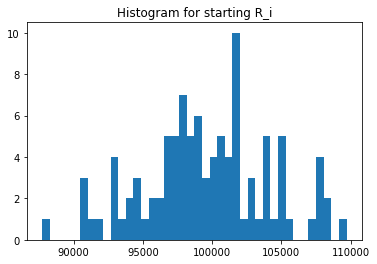

In [22]:
import matplotlib.pyplot as plt
a = starting_Ri.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_i")
plt.show()

In [23]:
experiments.UNI_Qi.unique()

array([205026.15838291, 282988.55696897, 281988.55696897, ...,
       203336.18388222, 162358.412781  , 166469.27993355])

In [24]:
experiments.UNI_Si.unique()

array([10000., 15024., 15022., 14877., 14730., 14784., 14860., 15084.,
       14801., 14724., 14811., 14456., 14962., 14789., 14949., 15085.,
       15008., 14865., 15031., 14924., 15312., 14483., 15373., 14779.,
       14923., 14794., 15240., 14917., 14921., 15125., 14418., 15399.,
       15006., 14910., 14806., 14711., 14764., 14909., 15075., 14838.,
       14636., 14849., 14810., 15076., 15249., 14874., 15262., 14752.,
       14938., 14760., 14514., 15140., 14601., 14790., 15206., 15047.,
       14964., 15284., 14816., 15067., 14961., 14885., 14349., 14574.,
       14520., 14862., 14881., 15065., 14621., 14776., 15063., 14864.,
       14473., 14933., 15279., 14471., 14561., 14968., 14913., 15155.,
       14855., 14805., 15034., 14627., 14939., 15287., 14942., 15242.,
       15306., 15171., 15096., 15393., 14823., 14763., 14691., 15275.,
       15465., 14925., 15100., 14802., 15087., 14963., 15177., 15156.,
       14826., 14808., 15323., 14999., 15456., 14585., 15073., 14990.,
      

In [25]:
experiments.UNI_Qj.unique()

array([186343.73391167, 204791.876189  , 200998.37529304, 195031.15132434,
       191614.63365474, 195587.05094042, 208744.40896725, 194419.88053961,
       188441.83084705, 190341.8112956 , 192986.85715615, 185419.76972955,
       189660.44333427, 200686.37690415, 219542.94563521, 185088.22211692,
       191115.19735429, 208022.66364409, 214522.21598615, 187929.95325289,
       229118.86602761, 186469.66319719, 202151.08681853, 208063.69890848,
       211920.45422335, 223133.84398135, 206351.53773943, 206670.25609393,
       205951.74767121, 190492.66705225, 188012.49689319, 202950.44665176,
       204789.41521803, 204785.7844915 , 202990.12488772, 205284.77391127,
       184563.46180497, 202519.09770342, 202286.14708989, 204880.30497205,
       188069.6857884 , 213499.33358316, 207264.36600799, 197779.18894769,
       207967.97701738, 187229.61370074, 201853.72420072, 202614.14280178,
       202334.60821917, 189579.06400207, 191713.89053362, 216105.28442607,
       191019.37219365, 1

In [26]:
experiments.UNI_Rj.unique()

array([ 93171.86695584, 102395.9380945 , 100499.18764652,  97515.57566217,
        95807.31682737,  97793.52547021, 104372.20448362,  97209.94026981,
        94220.91542352,  95170.9056478 ,  96493.42857807,  92709.88486477,
        94830.22166713, 100343.18845208, 109771.47281761,  92544.11105846,
        95557.59867715, 104011.33182204, 107261.10799307,  93964.97662644,
       114559.43301381,  93234.8315986 , 101075.54340927, 104031.84945424,
       105960.22711168, 111566.92199068, 103175.76886971, 103335.12804697,
       102975.87383561,  95246.33352613,  94006.2484466 , 101475.22332588,
       102394.70760902, 102392.89224575, 101495.06244386, 102642.38695564,
        92281.73090249, 101259.54885171, 101143.07354494, 102440.15248603,
        94034.8428942 , 106749.66679158, 103632.18300399,  98889.59447385,
       103983.98850869,  93614.80685037, 100926.86210036, 101307.07140089,
       101167.30410958,  94789.53200103,  95856.94526681, 108052.64221304,
        95509.68609682,  

In [27]:
starting_Rj = experiments[experiments.timestep == 0]
starting_Rj = starting_Rj['UNI_Rj']
starting_Rj.reset_index(drop=True)
starting_Rj.unique()

array([ 93171.86695584,  97515.57566217, 102395.9380945 ,  95807.31682737,
       104372.20448362,  97209.94026981,  94220.91542352, 100499.18764652,
        96493.42857807,  94830.22166713,  97793.52547021,  92544.11105846,
       109771.47281761, 100343.18845208, 107261.10799307,  93964.97662644,
        95557.59867715, 104011.33182204,  93234.8315986 , 104031.84945424,
       105960.22711168, 111566.92199068, 103335.12804697,  95170.9056478 ,
       103175.76886971, 102975.87383561,  95246.33352613,  92709.88486477,
       101075.54340927, 101495.06244386, 102392.89224575,  92281.73090249,
       101259.54885171, 101143.07354494, 106749.66679158, 103983.98850869,
       103632.18300399,  93614.80685037,  94006.2484466 ,  98889.59447385,
       100926.86210036, 102642.38695564, 101307.07140089, 101167.30410958,
       108052.64221304,  95856.94526681,  96161.77841487,  95509.68609682,
       101475.22332588,  94789.53200103, 102440.15248603, 101746.23127726,
       104148.80135547,  

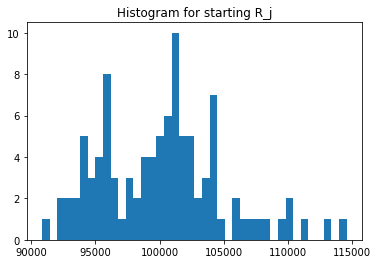

In [28]:
a = starting_Rj.unique()
_ = plt.hist(a, bins=40)  # arguments are passed to np.histogram
plt.title("Histogram for starting R_j")
plt.show()

In [29]:
experiments.UNI_Sj.unique()

array([10000], dtype=int64)

In [30]:
experiments.UNI_ij.unique()

array([102513.07919145,  98466.77848448,  97043.27335419,  98553.01252306,
       101800.46479606, 100486.26323049, 104959.25280134, 101895.05002056,
       101669.05907735,  94410.89003523, 104763.46857136, 102597.90769785,
        99932.57873647, 109697.46842654,  95893.24101737,  97038.09499273,
        98878.1631456 ,  99076.57452013, 100338.00021993,  98376.04253656,
        90545.61599107,  93128.21875062,  96552.74514085, 107598.51912228,
        94621.8066266 , 100555.8056843 ,  98908.32856475, 104995.44809824,
        97316.44990982,  97634.06196207,  97724.53202172, 105286.79281704,
        94851.98731243, 104680.38172341,  91567.2063905 , 101731.84459587,
        99423.78601802, 101632.59194111, 103758.95504834,  97443.51230388,
       100988.54597121, 100859.98339642,  97523.95035638,  96040.57295324,
        96466.94784422, 105424.31550476,  98506.68343208,  92878.31799834,
       103103.66221462, 107664.3768275 ,  97387.58207516,  94081.93986744,
       104195.7937909 , 1

In [31]:
experiments.UNI_ji.unique()

array([ 93171.86695584, 102395.9380945 , 100499.18764652,  97515.57566217,
        95807.31682737,  97793.52547021, 104372.20448362,  97209.94026981,
        94220.91542352,  95170.9056478 ,  96493.42857807,  92709.88486477,
        94830.22166713, 100343.18845208, 109771.47281761,  92544.11105846,
        95557.59867715, 104011.33182204, 107261.10799307,  93964.97662644,
       114559.43301381,  93234.8315986 , 101075.54340927, 104031.84945424,
       105960.22711168, 111566.92199068, 103175.76886971, 103335.12804697,
       102975.87383561,  95246.33352613,  94006.2484466 , 101475.22332588,
       102394.70760902, 102392.89224575, 101495.06244386, 102642.38695564,
        92281.73090249, 101259.54885171, 101143.07354494, 102440.15248603,
        94034.8428942 , 106749.66679158, 103632.18300399,  98889.59447385,
       103983.98850869,  93614.80685037, 100926.86210036, 101307.07140089,
       101167.30410958,  94789.53200103,  95856.94526681, 108052.64221304,
        95509.68609682,  

In [32]:
experiments.UNI_Sij.unique()

array([9.55133498e+09, 1.00825982e+10, 9.75277014e+09, 9.61045375e+09,
       9.75322938e+09, 9.82690594e+09, 1.09548286e+10, 9.90521173e+09,
       9.57935182e+09, 8.98516991e+09, 1.01089863e+10, 9.51184021e+09,
       9.47662859e+09, 1.10073937e+10, 1.05263423e+10, 8.98030424e+09,
       9.44855983e+09, 1.03050865e+10, 1.07623651e+10, 9.24390254e+09,
       1.03728544e+10, 8.68279379e+09, 9.75912118e+09, 1.11936729e+10,
       1.00261481e+10, 1.12187017e+10, 1.02049428e+10, 1.08497181e+10,
       1.00212465e+10, 9.29928643e+09, 9.18671664e+09, 1.06840008e+10,
       9.71234151e+09, 1.07185270e+10, 9.29361933e+09, 1.04419994e+10,
       9.17499907e+09, 1.02912704e+10, 1.04944996e+10, 9.98212826e+09,
       9.49644205e+09, 1.07667696e+10, 1.01066199e+10, 9.49741331e+09,
       1.00310180e+10, 9.86927693e+09, 9.94197045e+09, 9.40923039e+09,
       1.04307196e+10, 1.02054559e+10, 9.33527612e+09, 1.01658022e+10,
       9.95170756e+09, 9.71706418e+09, 9.98071364e+09, 9.74610495e+09,
      

In [33]:
def get_M(k, v):
    if k == 'sim_config':
        k, v = 'M', v['M']
    return k, v

config_ids = [
    dict(
        get_M(k, v) for k, v in config.__dict__.items() if k in ['simulation_id', 'run_id', 'sim_config', 'subset_id']
    ) for config in configs
]

# Agent sequences

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


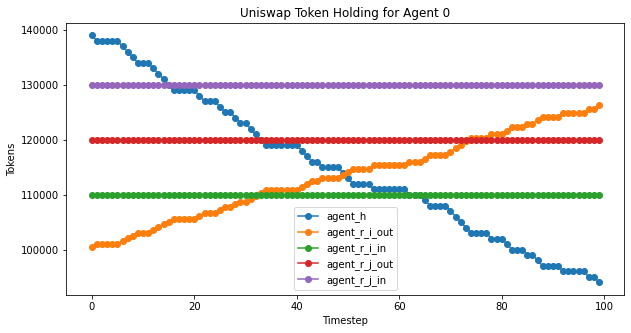

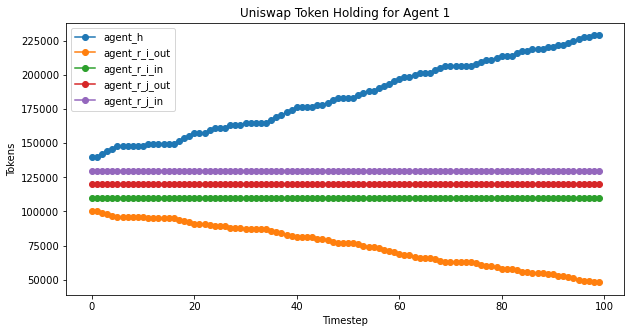

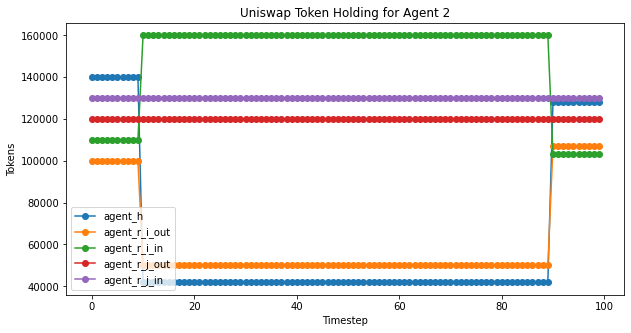

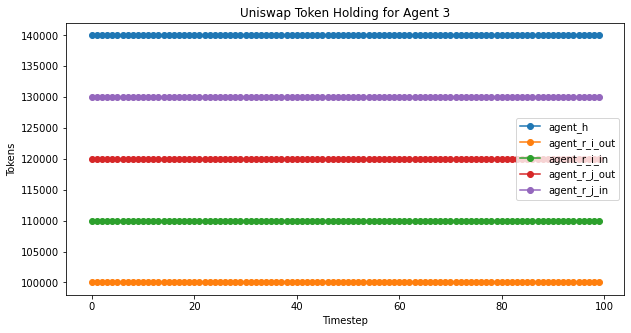

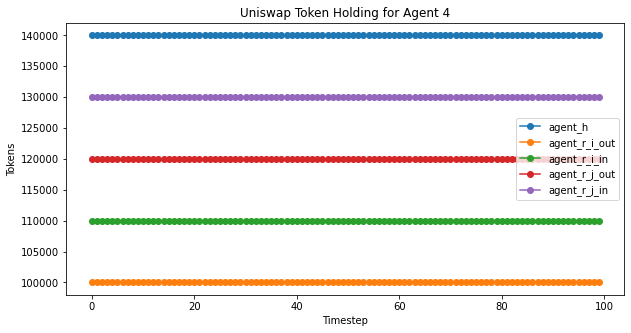

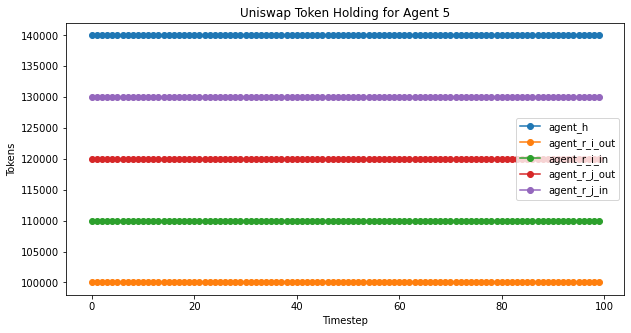

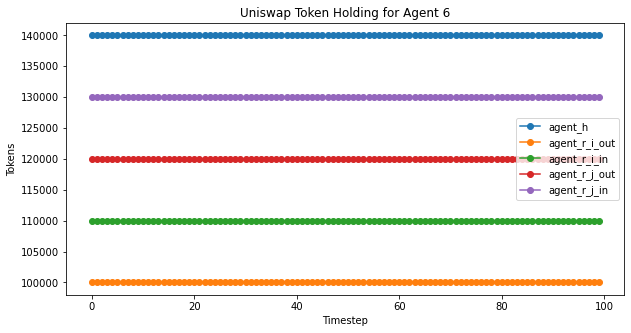

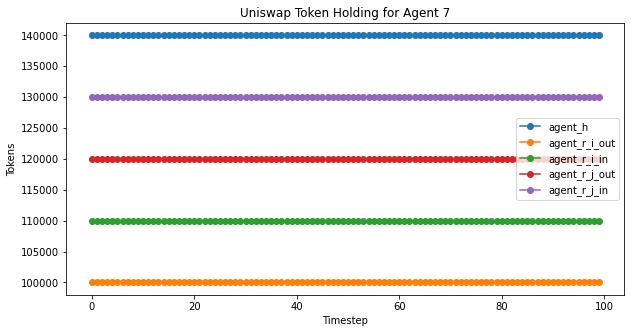

In [34]:
agent_plot(experiment2,'Uniswap Token Holding for Agent ', 100) #,4,'j')

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4459: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().fillna(


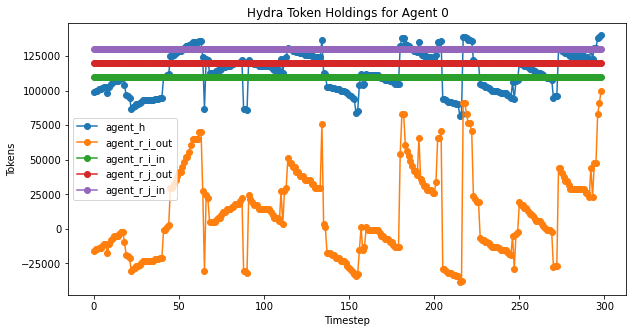

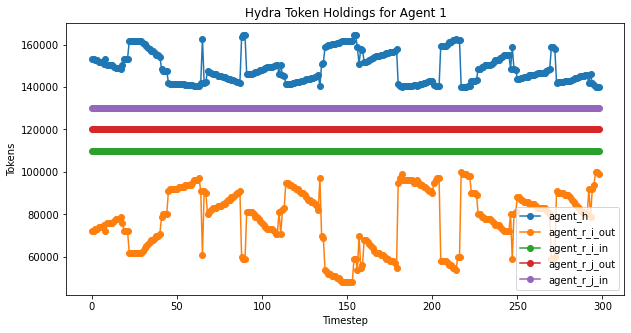

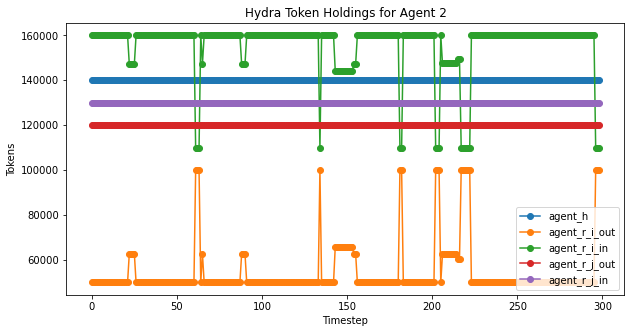

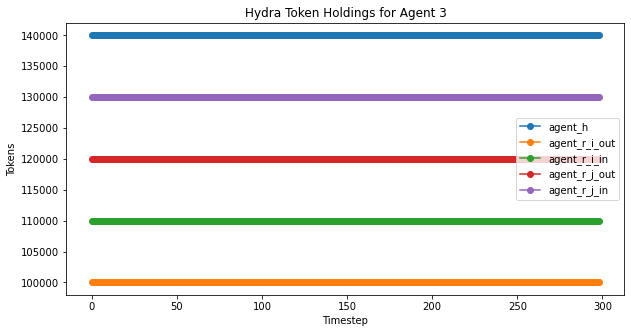

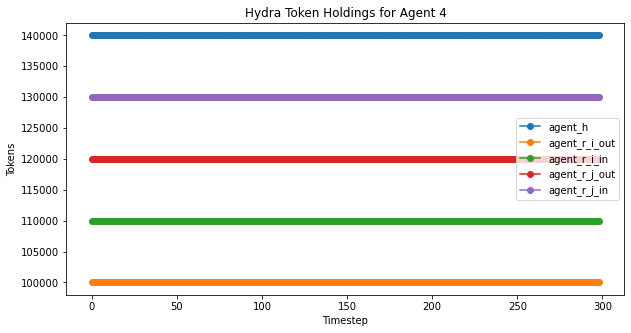

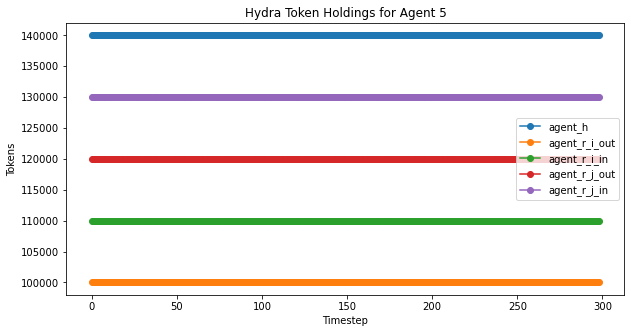

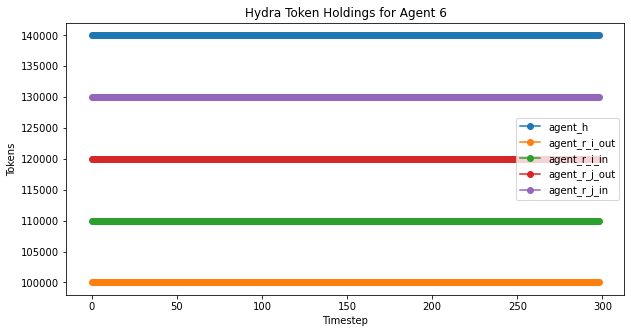

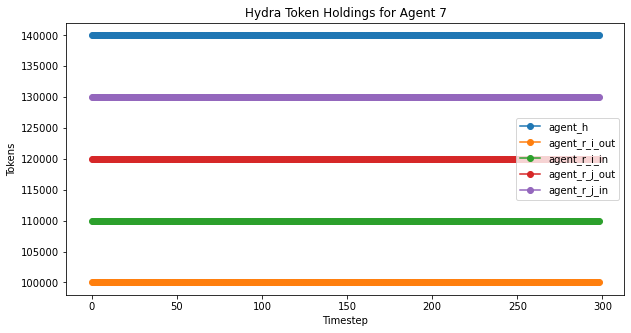

In [35]:
hydra_agent_plot(experiments,'Hydra Token Holdings for Agent ', 299)

# Liquidity dynamics

Movement of the Uniswap variables

- 'UNI_Ri', 'UNI_Qi', 'UNI_Si'
- 'UNI_Rj', 'UNI_Qj', 'UNI_Sj'
- 'UNI_ij', 'UNI_ji', 'UNI_Sij'

## Uniswap -- Ri-Q instance

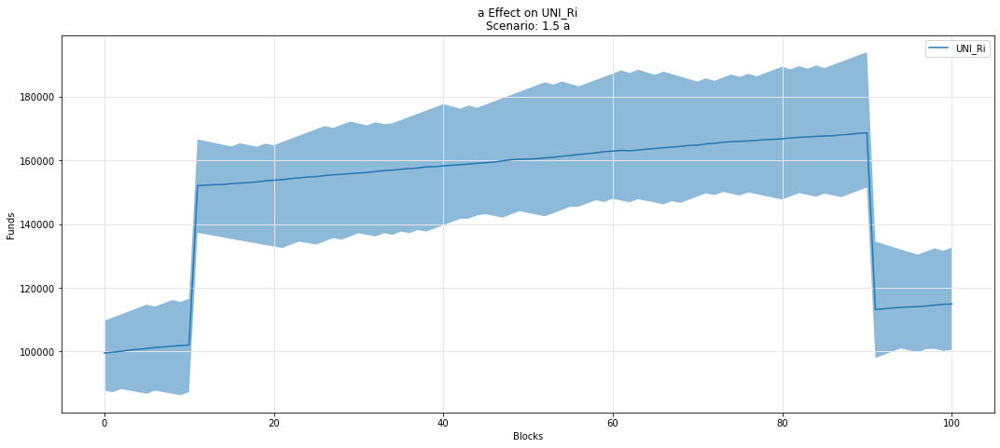

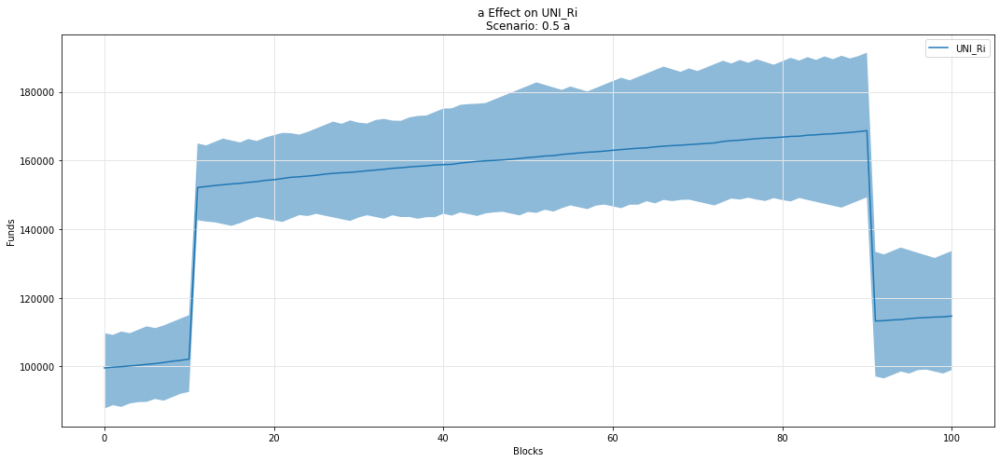

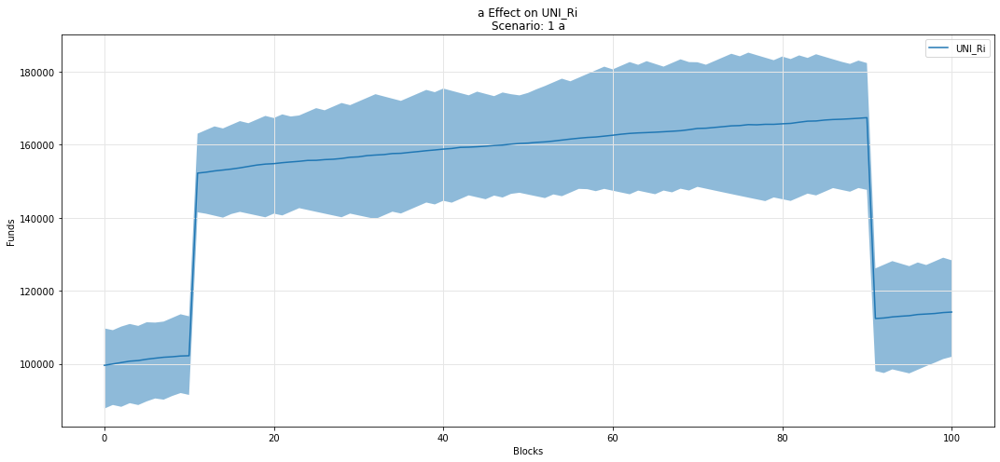

In [36]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Ri')

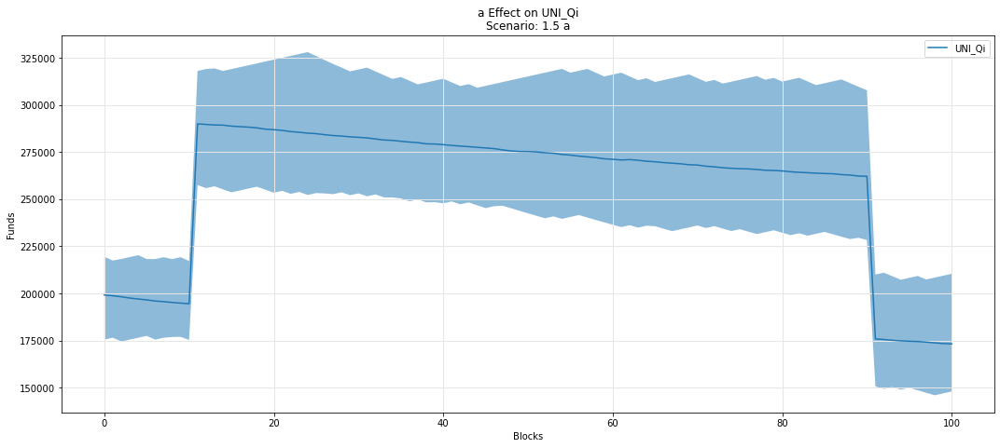

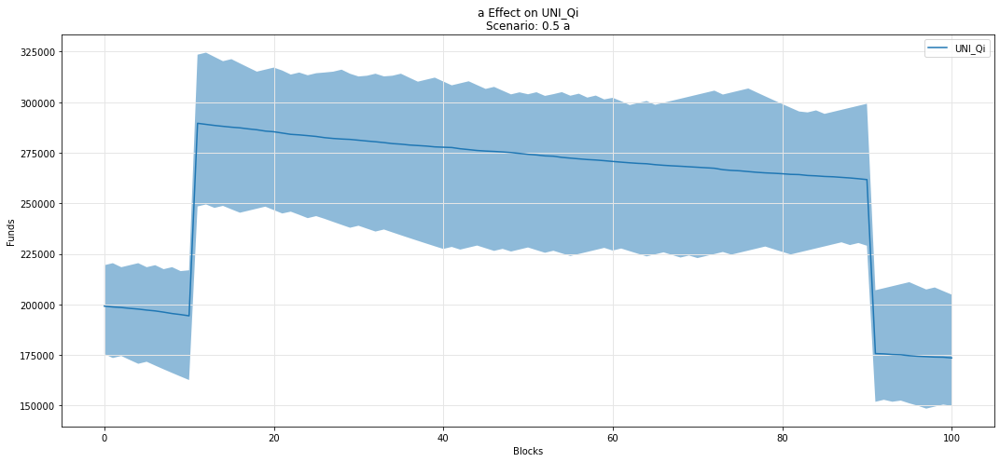

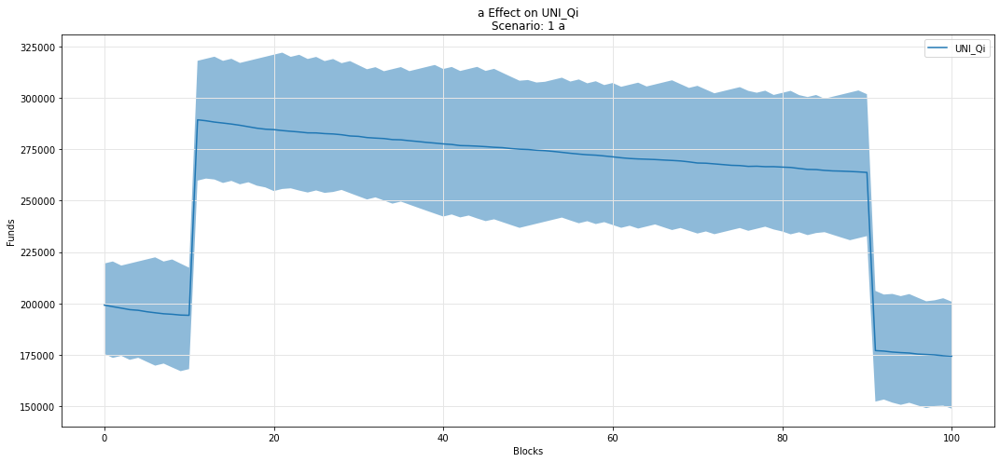

In [37]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qi')

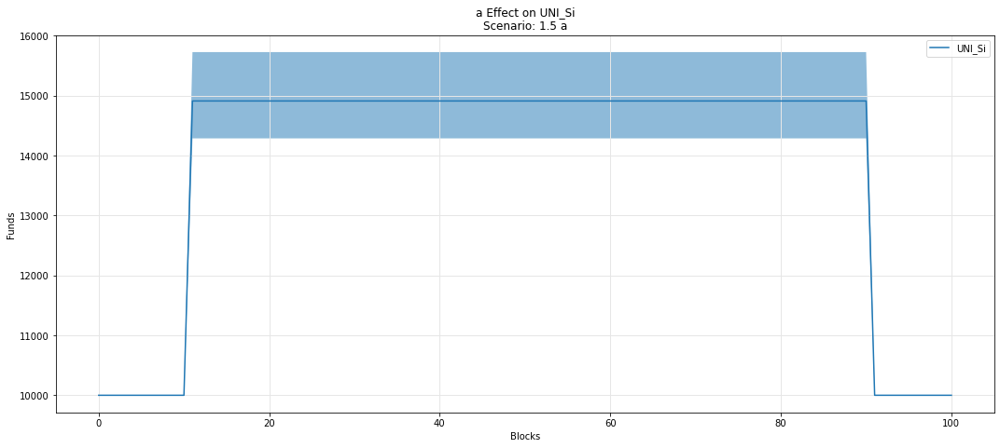

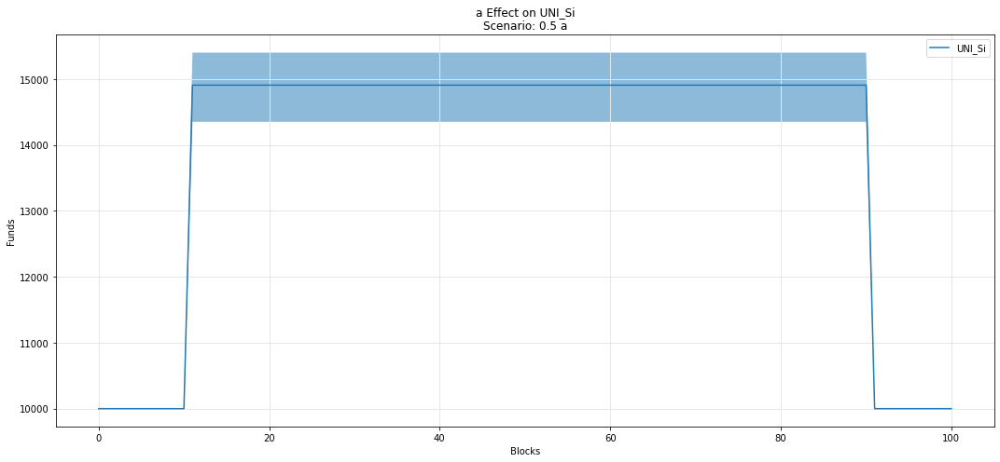

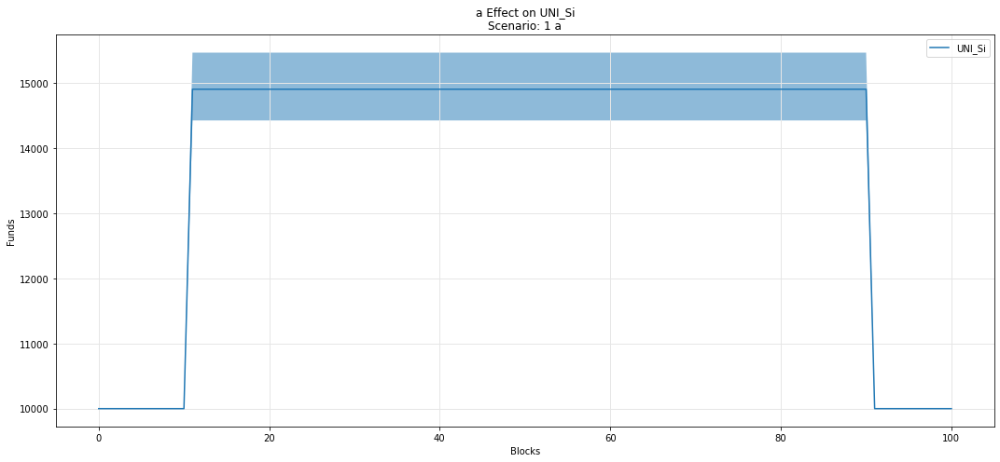

In [38]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Si')

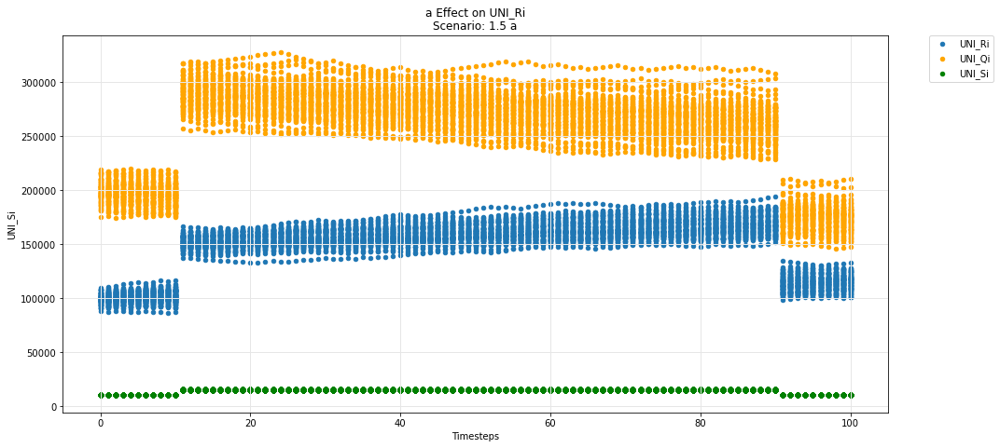

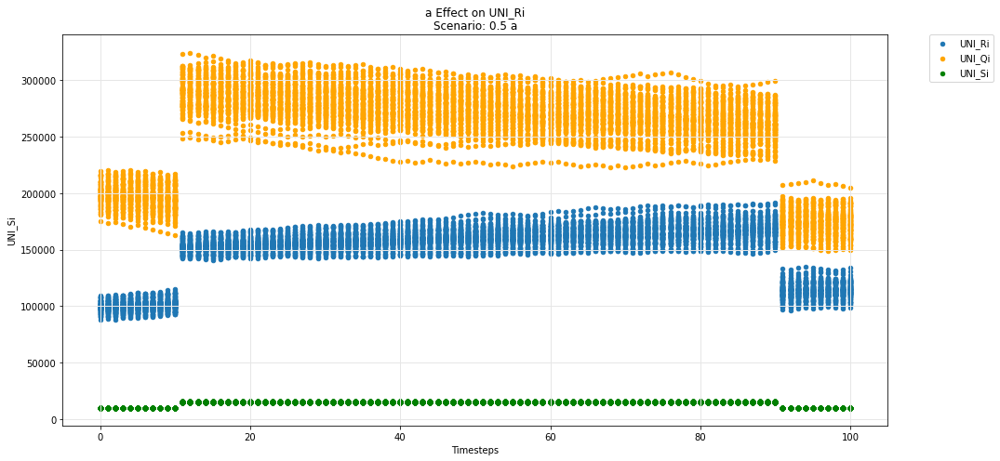

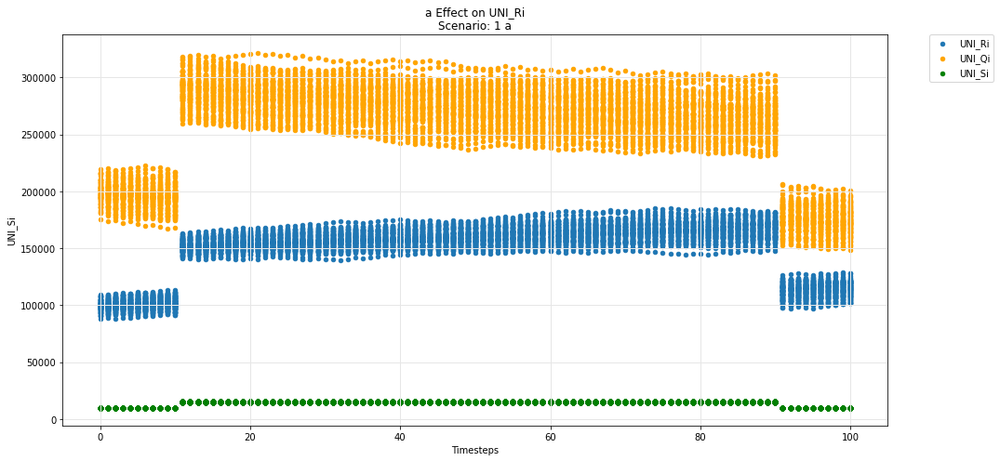

In [39]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Ri', 'UNI_Qi', 'UNI_Si')

## Uniswap -- Rj-Q instance

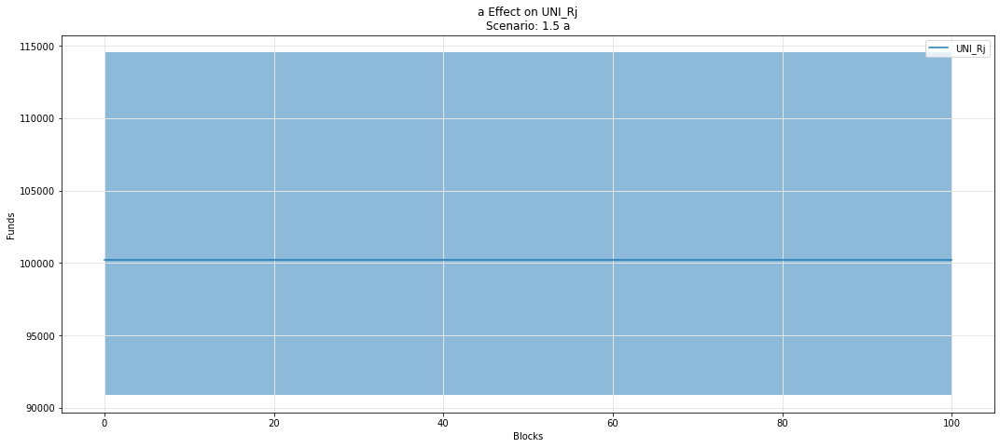

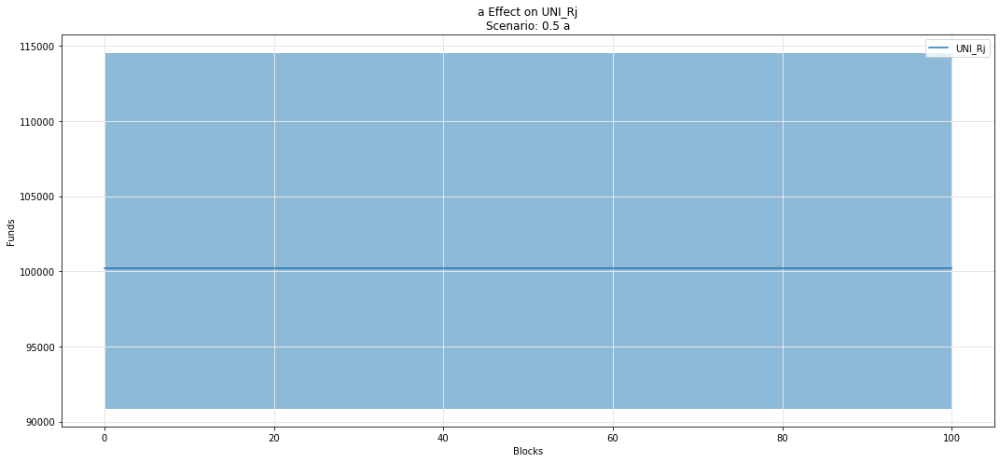

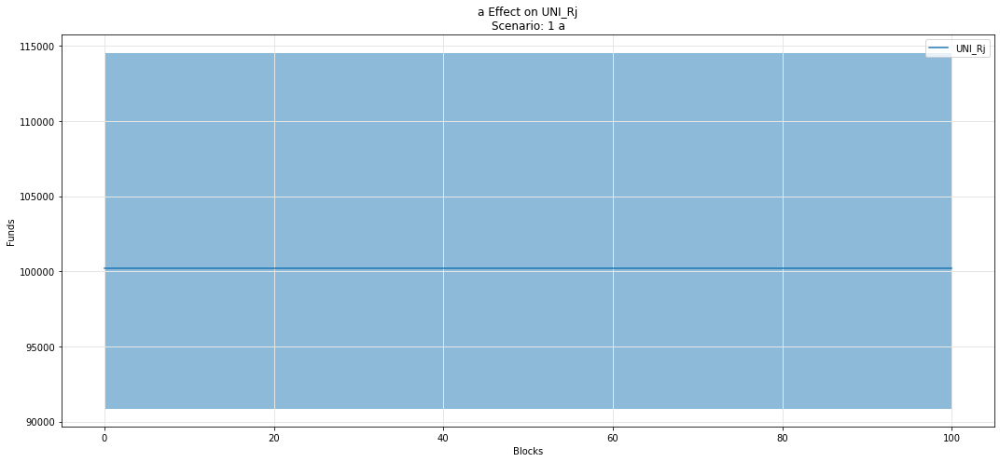

In [40]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Rj')

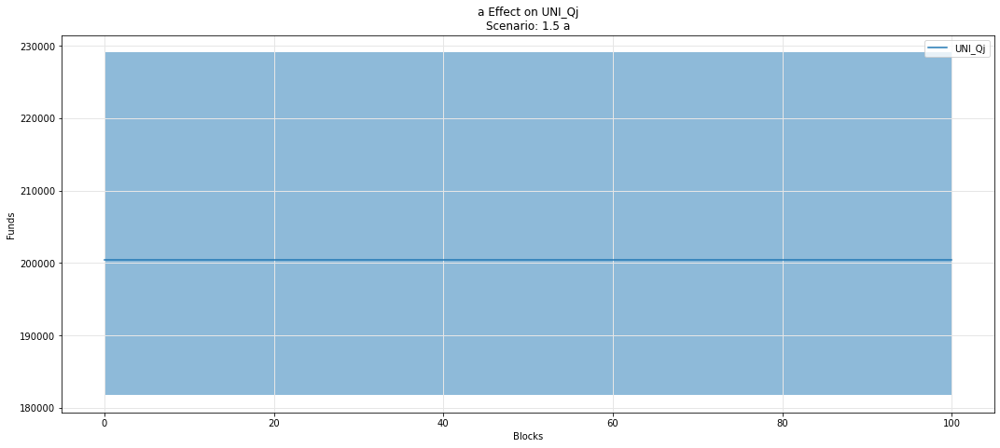

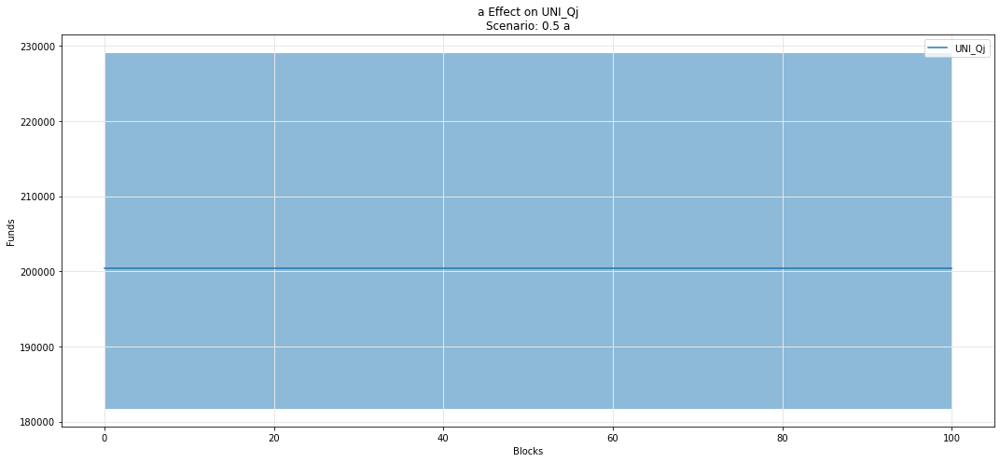

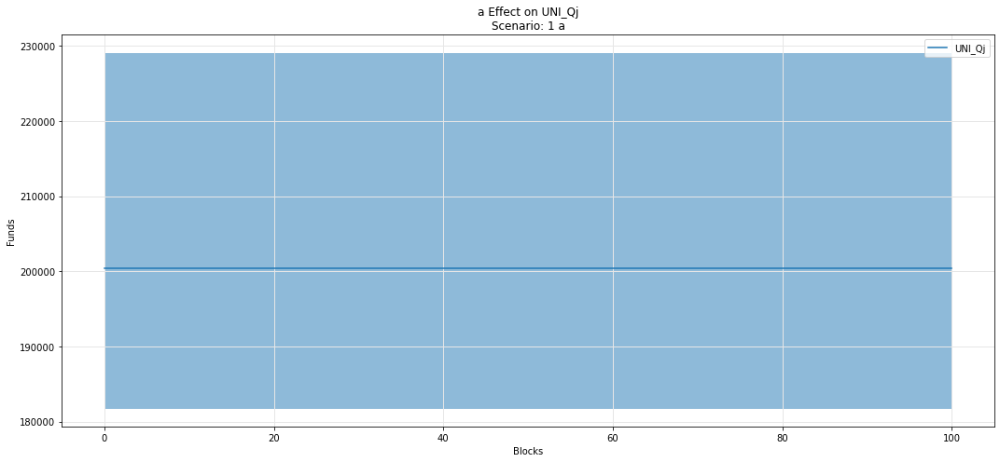

In [41]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Qj')

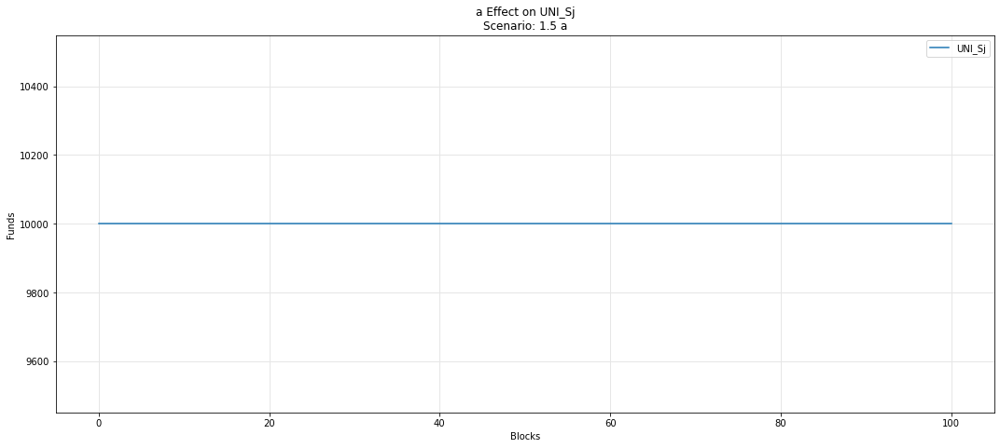

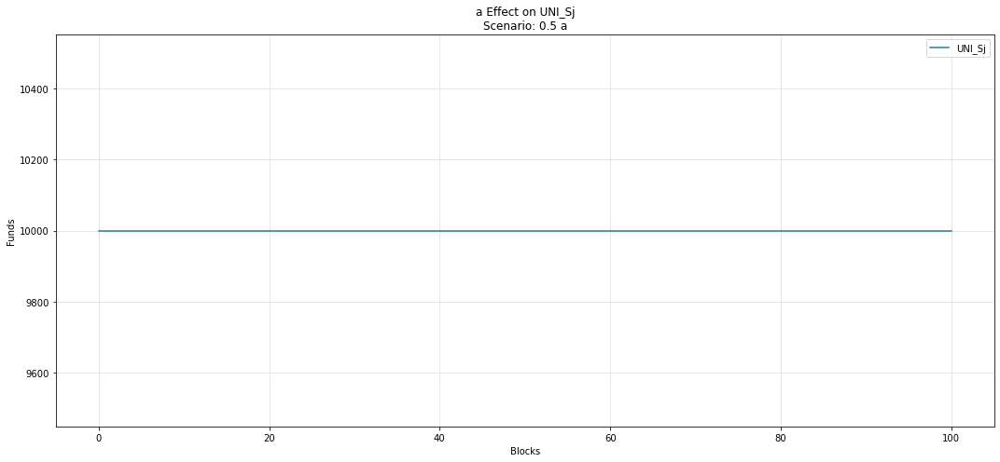

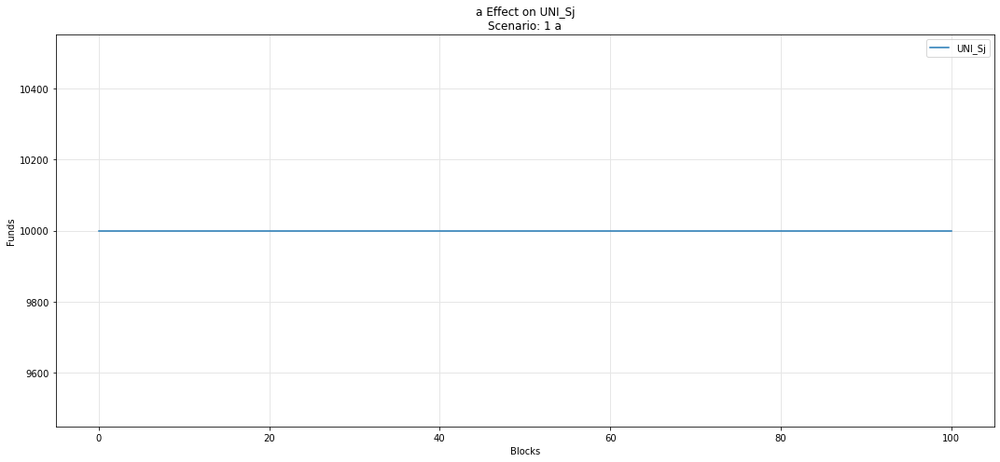

In [42]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sj')

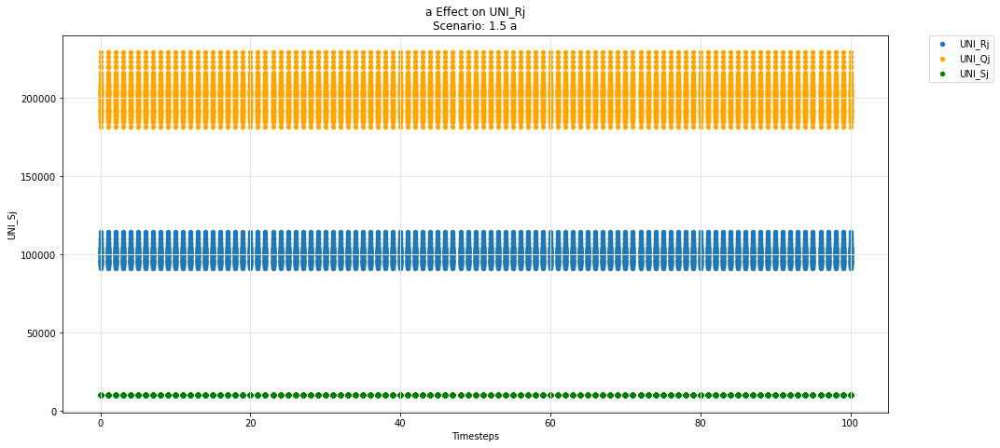

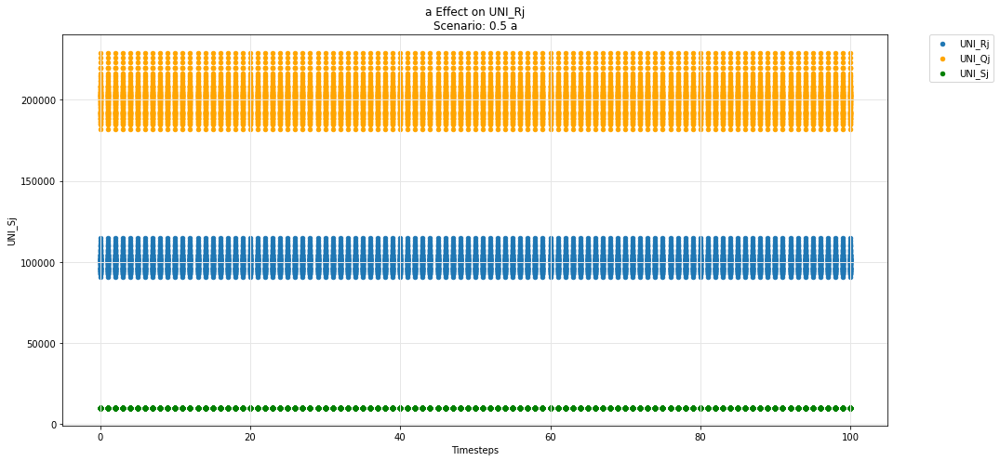

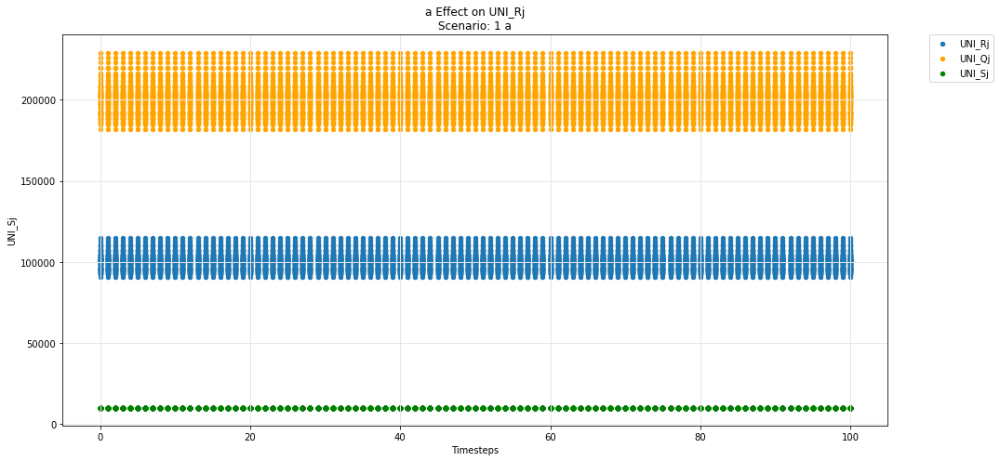

In [43]:
param_test_plot(experiments, config_ids, 'a', 'UNI_Rj', 'UNI_Qj', 'UNI_Sj')

## Uniswap -- ij-Q instance

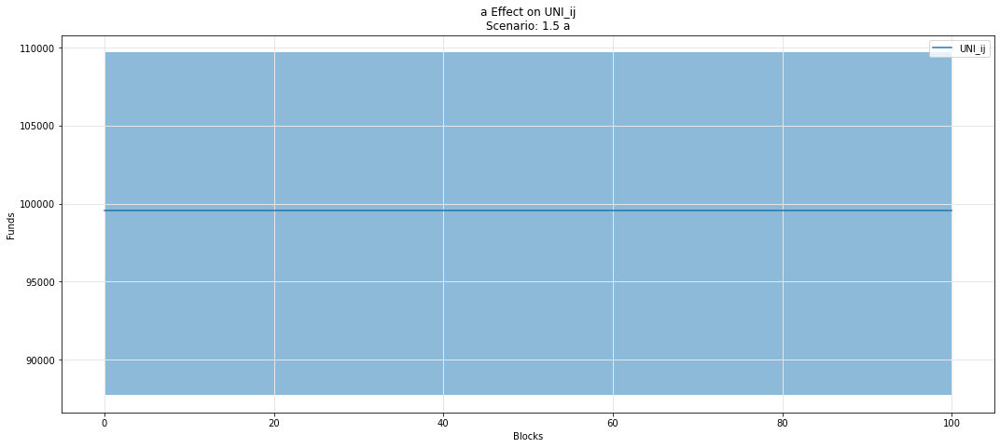

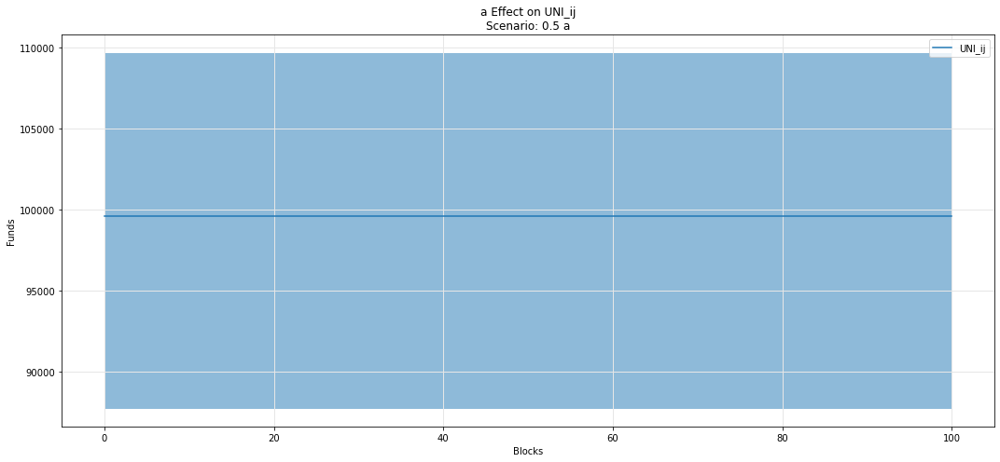

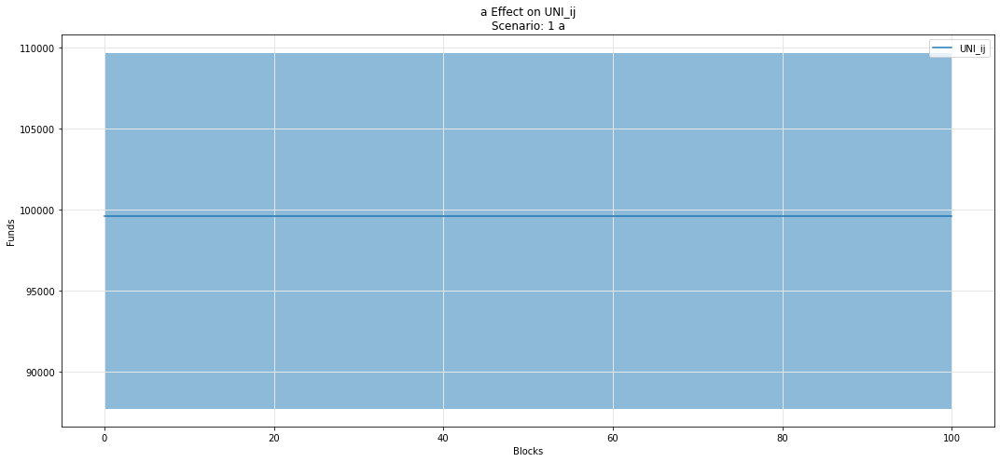

In [44]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ij')

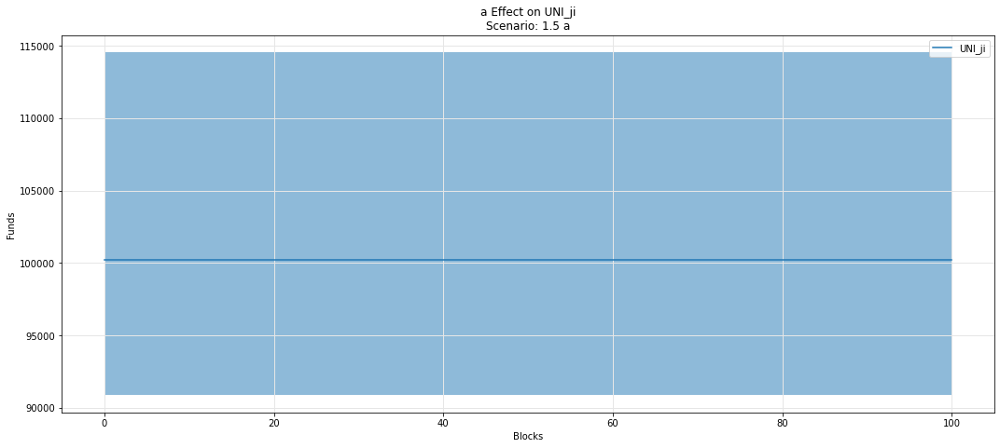

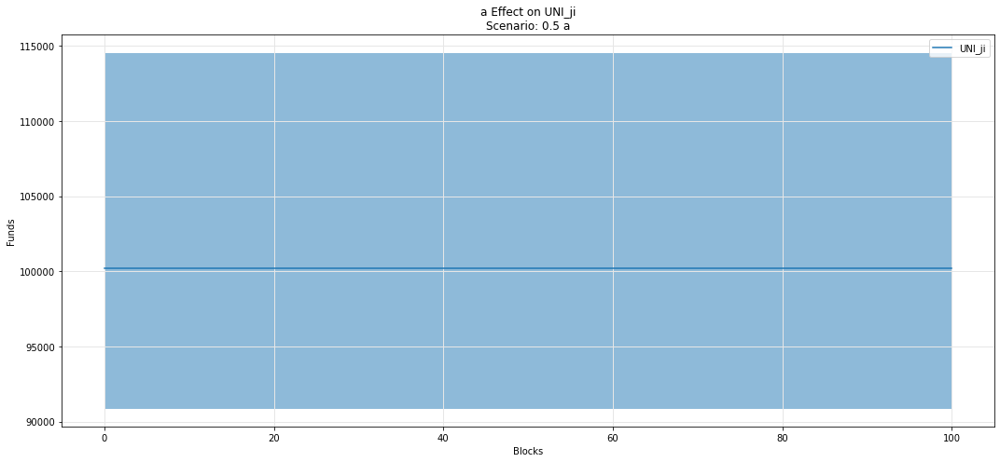

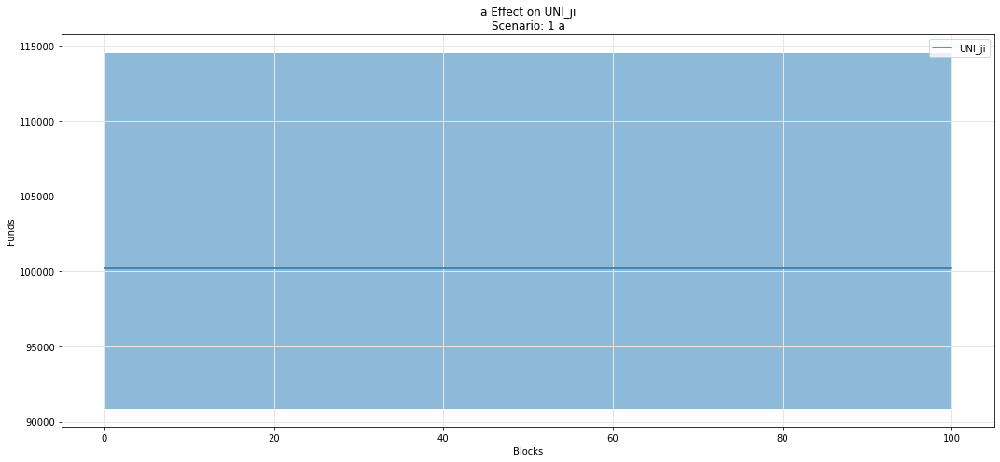

In [45]:
param_fan_plot3(experiments, config_ids, 'a','UNI_ji')

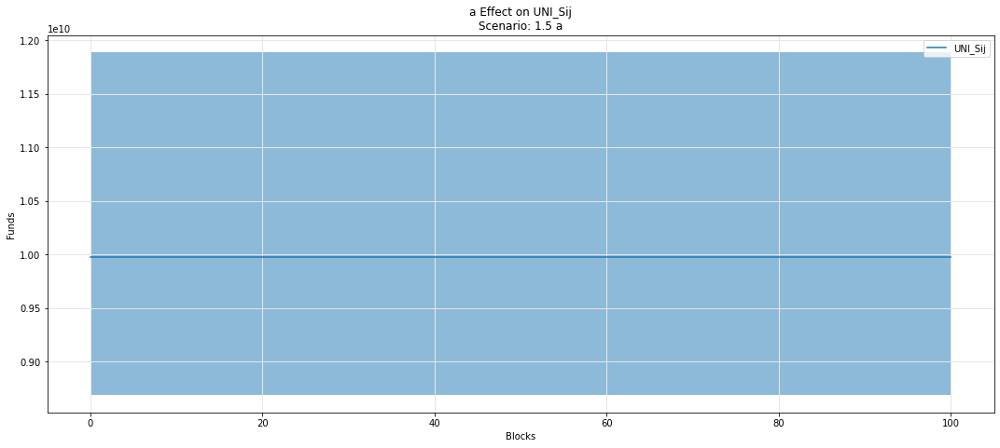

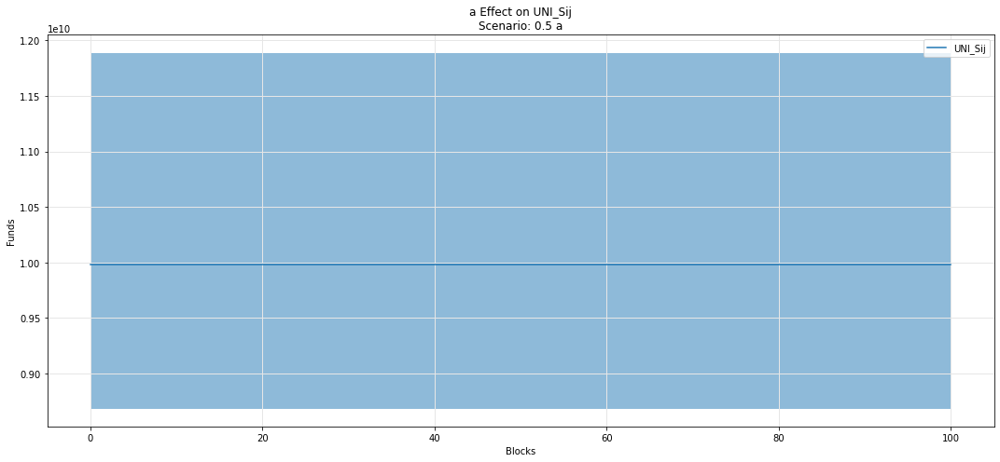

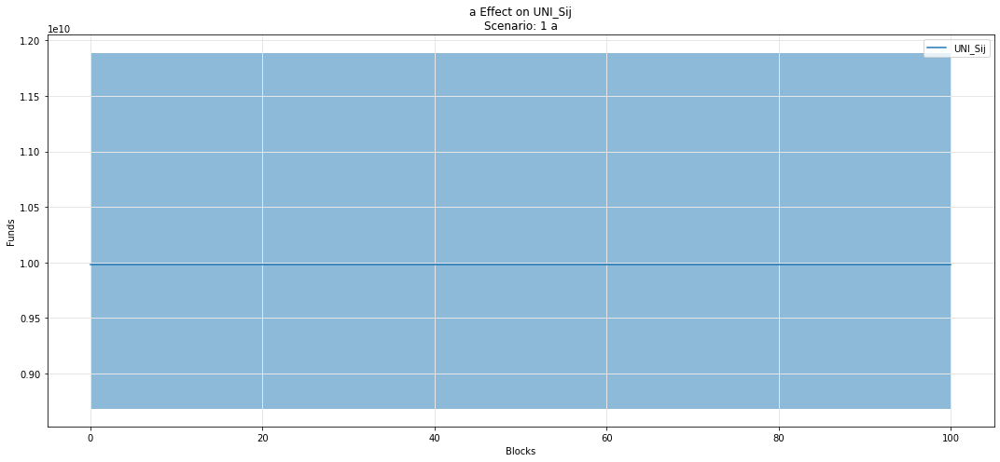

In [46]:
param_fan_plot3(experiments, config_ids, 'a','UNI_Sij')

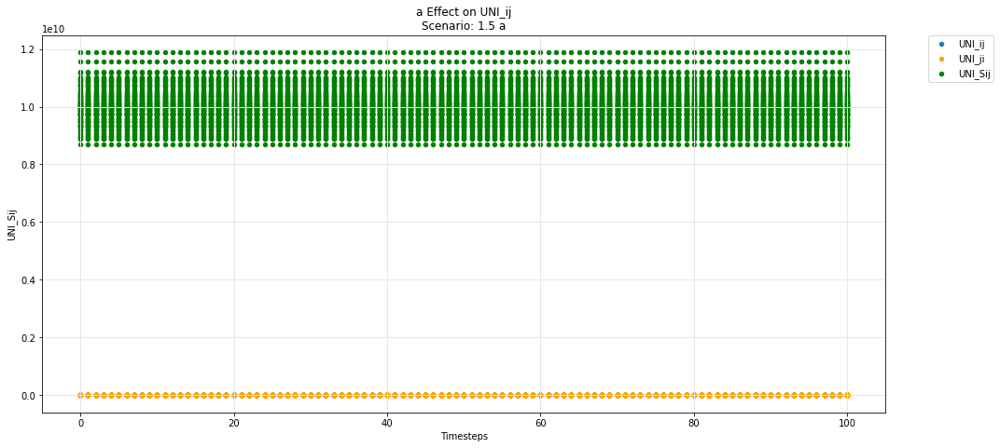

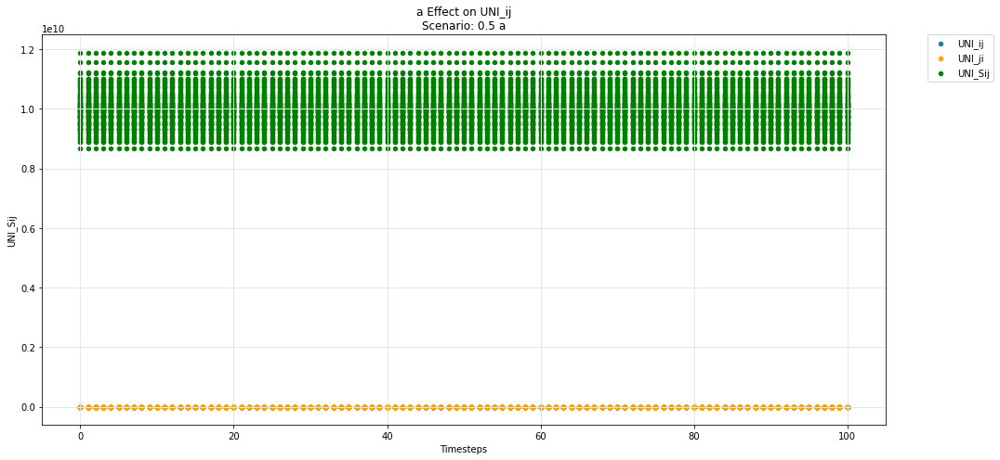

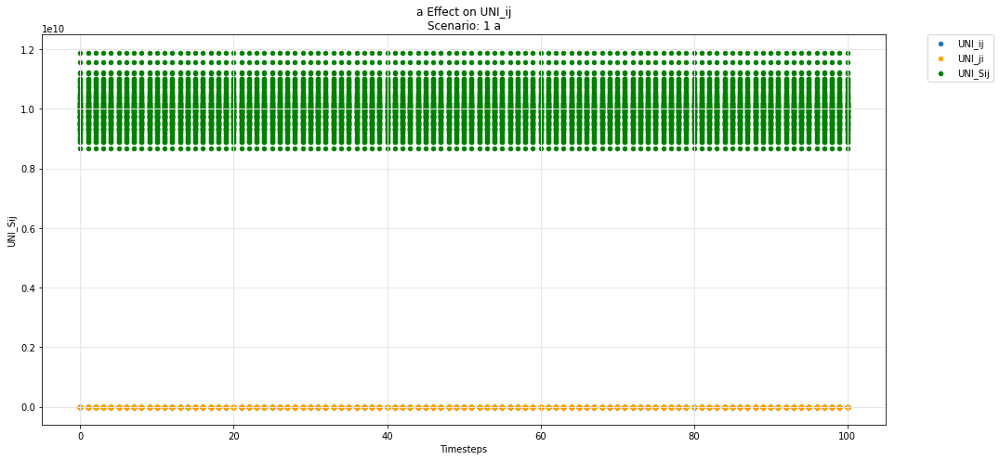

In [47]:
param_test_plot(experiments, config_ids, 'a', 'UNI_ij', 'UNI_ji', 'UNI_Sij')

## Hydra -- base

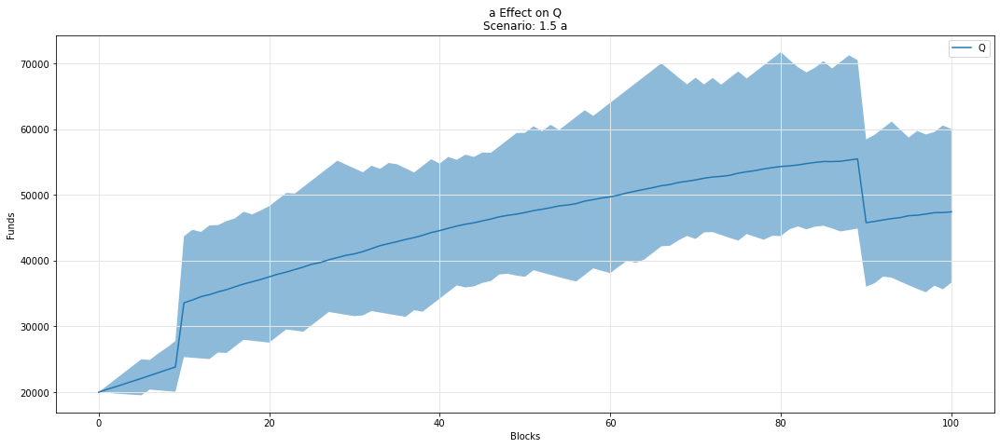

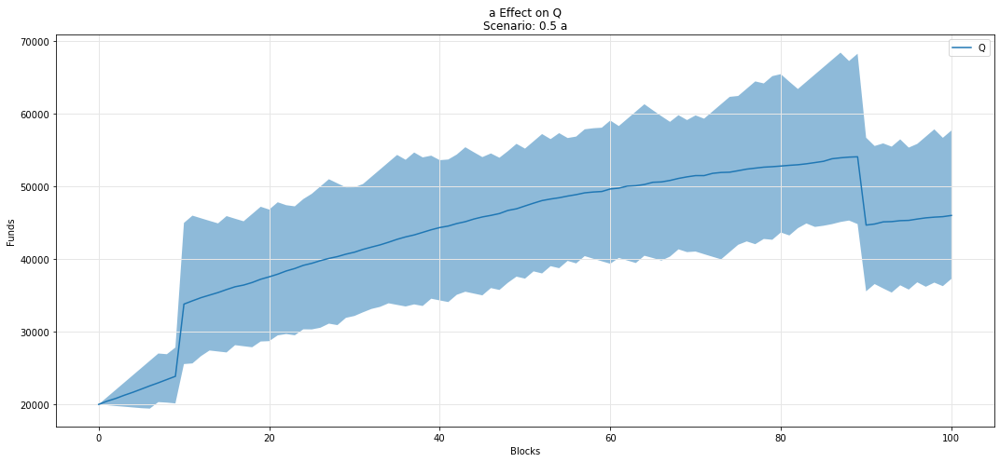

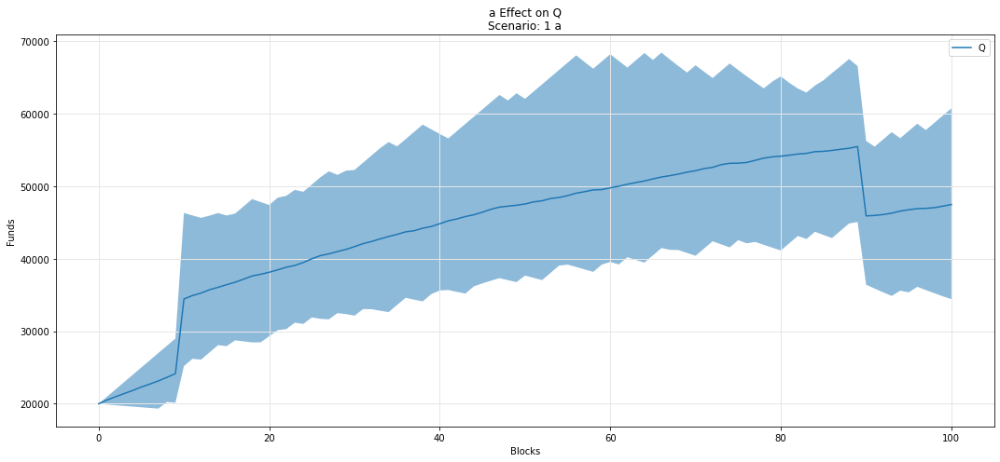

In [48]:
param_fan_plot3(experiments, config_ids, 'a','Q')

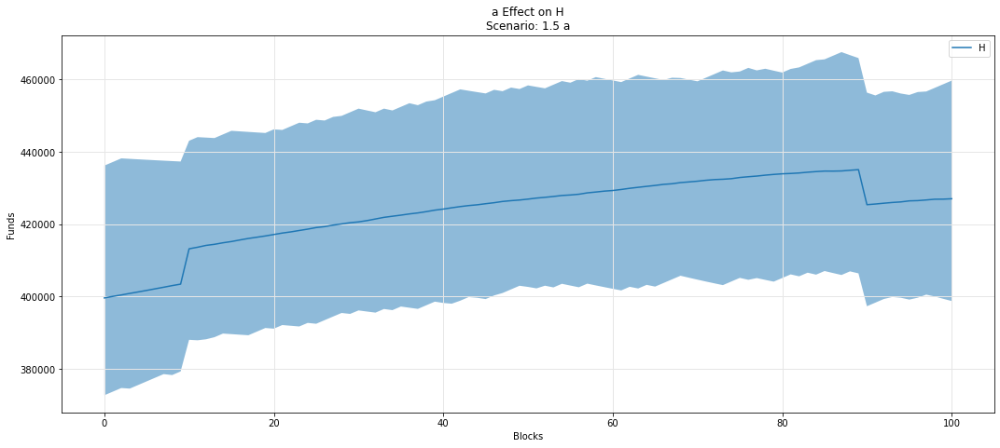

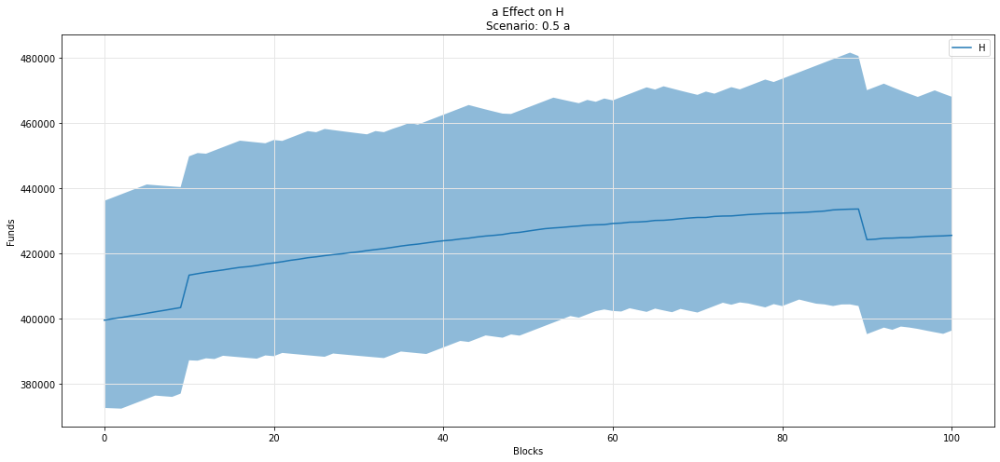

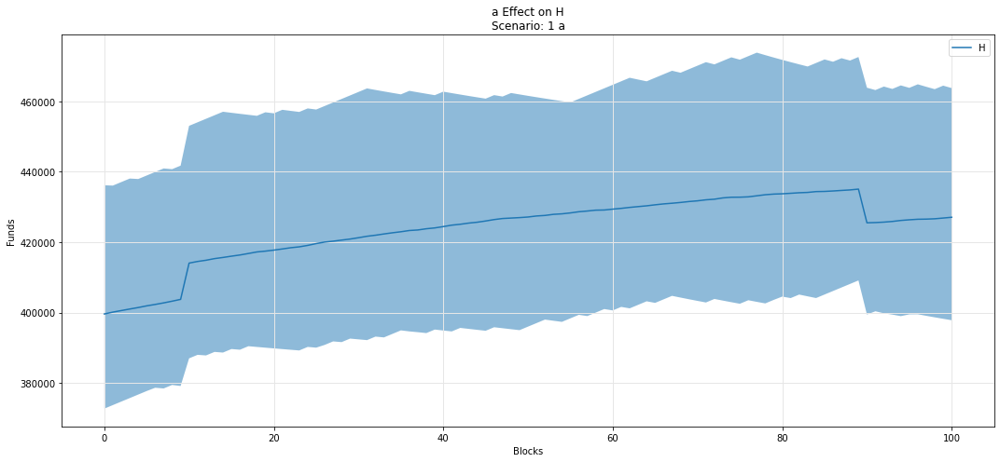

In [49]:
param_fan_plot3(experiments, config_ids, 'a','H')

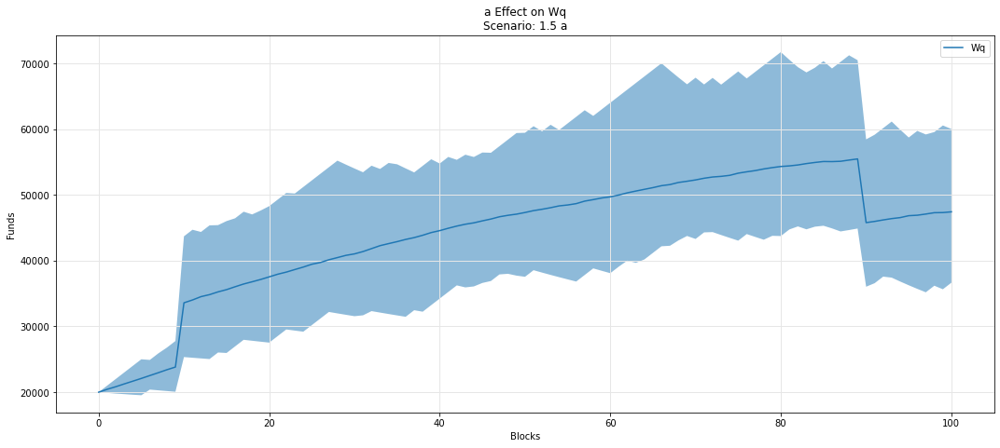

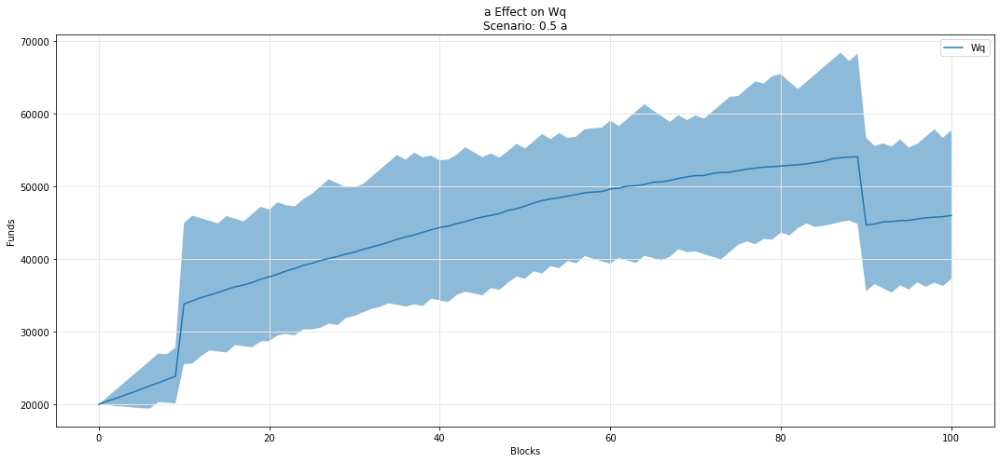

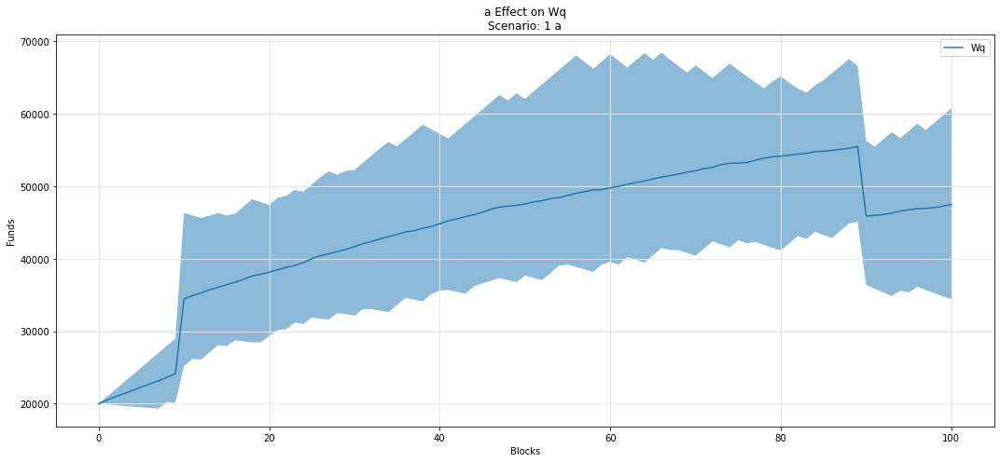

In [50]:
param_fan_plot3(experiments, config_ids, 'a','Wq')

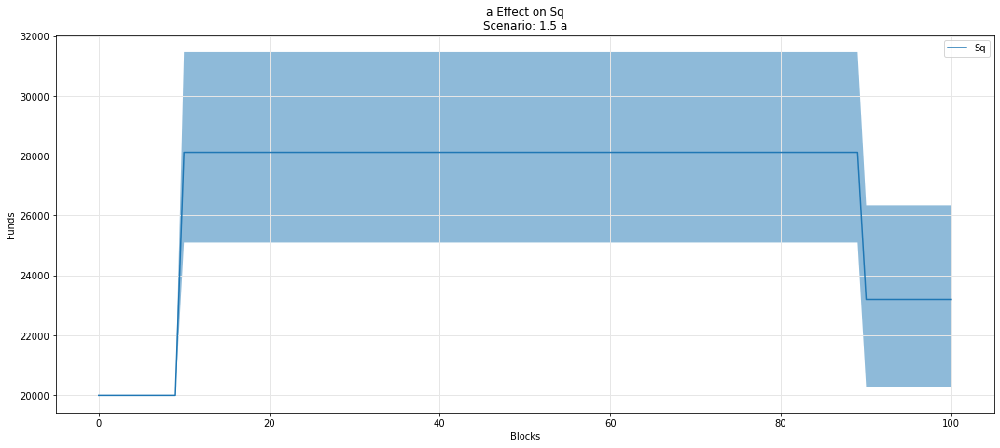

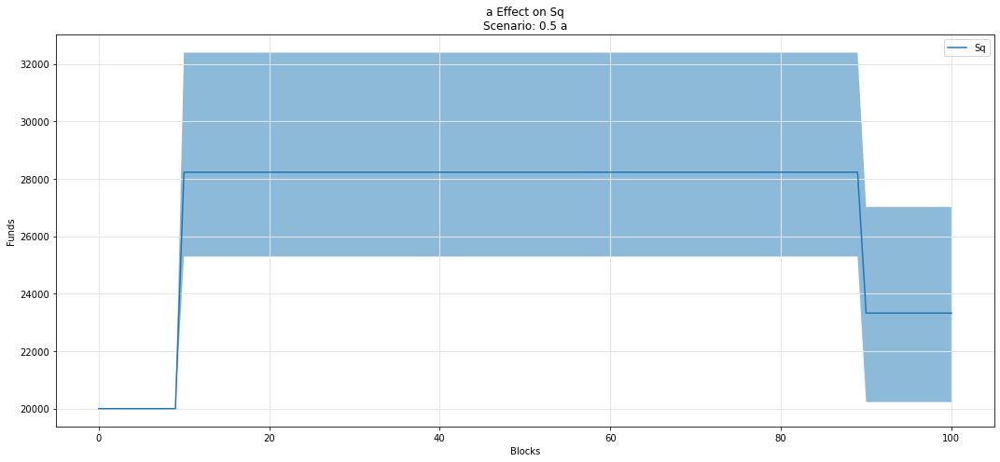

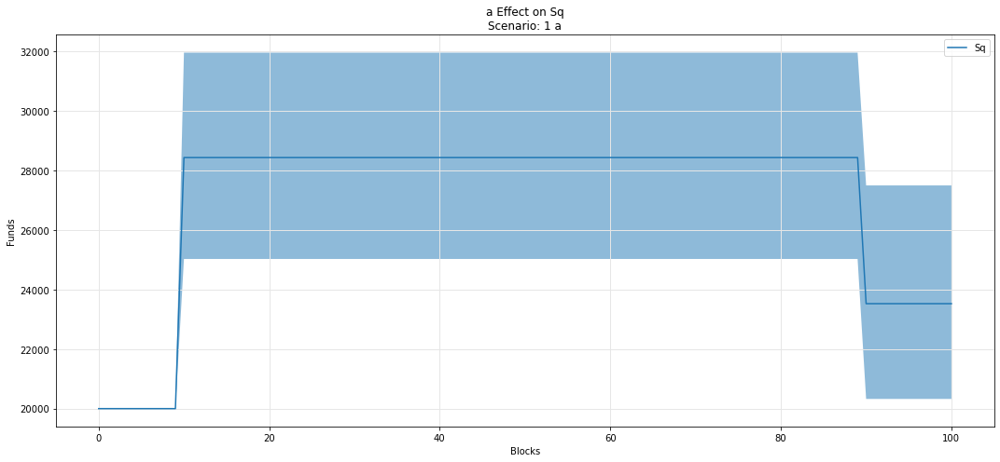

In [51]:
param_fan_plot3(experiments, config_ids, 'a','Sq')

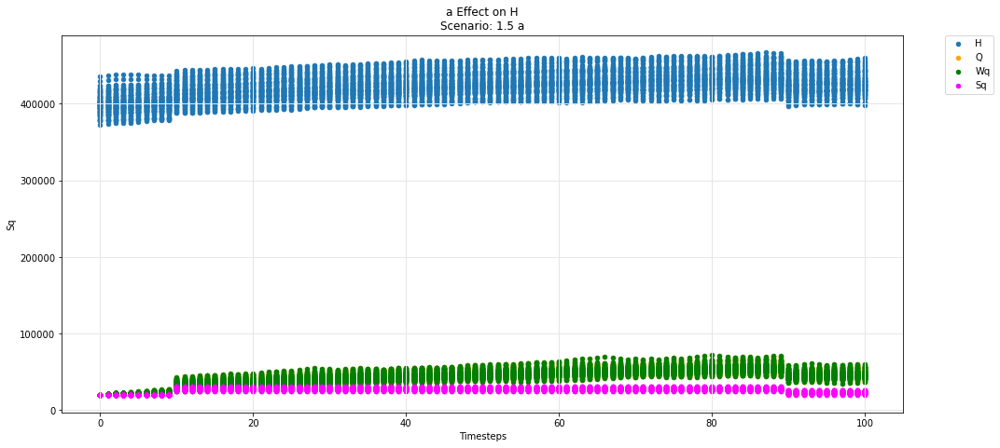

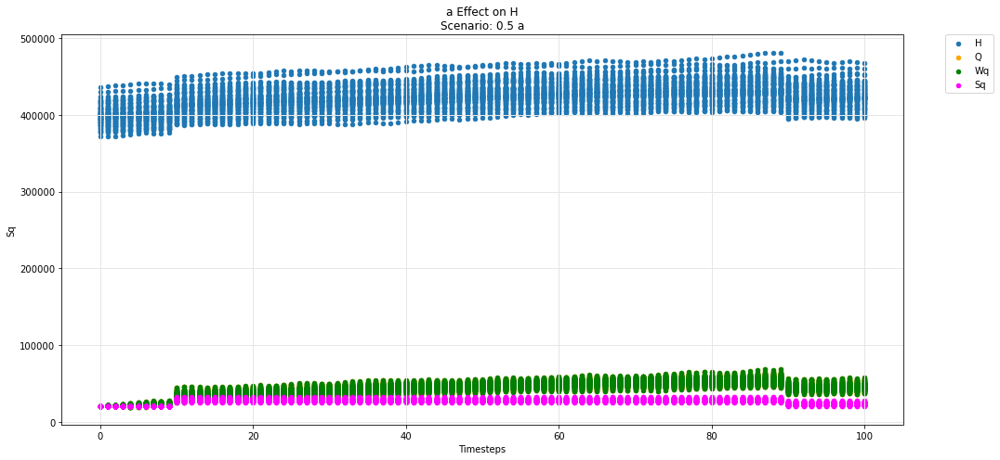

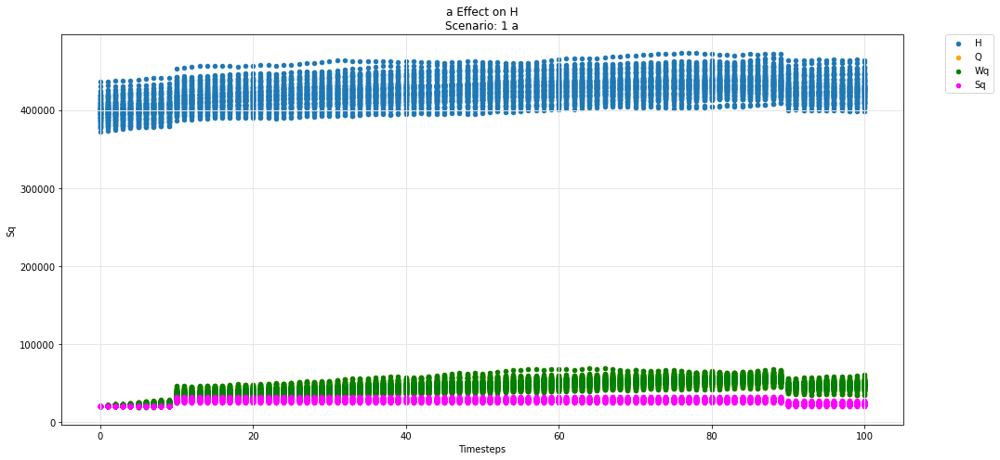

In [52]:
param_test_plot(experiments, config_ids, 'a', 'H', 'Q', 'Wq', 'Sq')

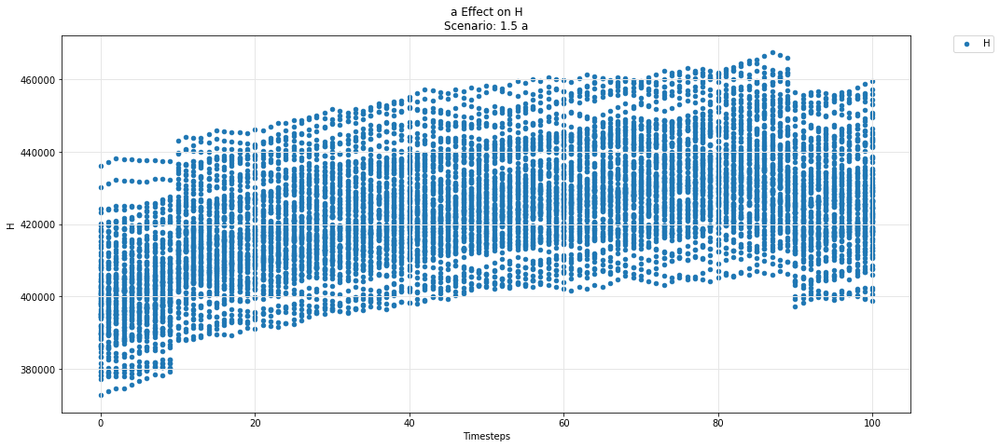

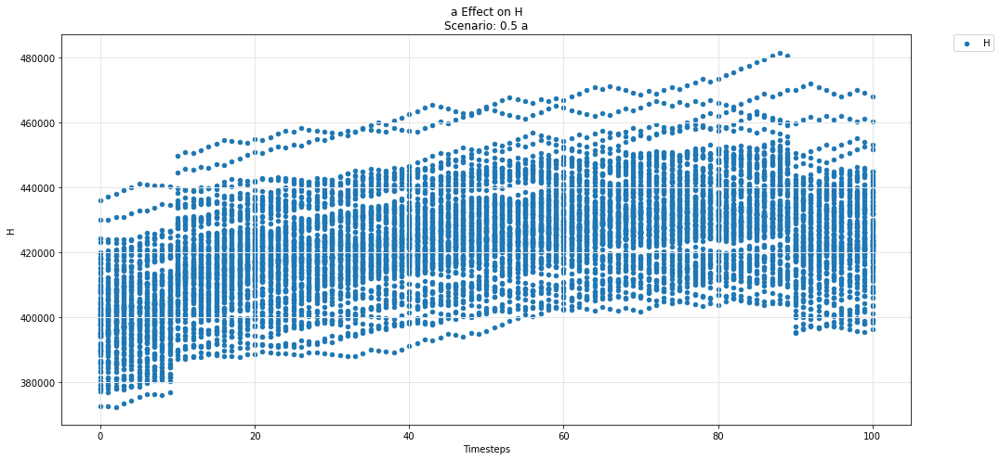

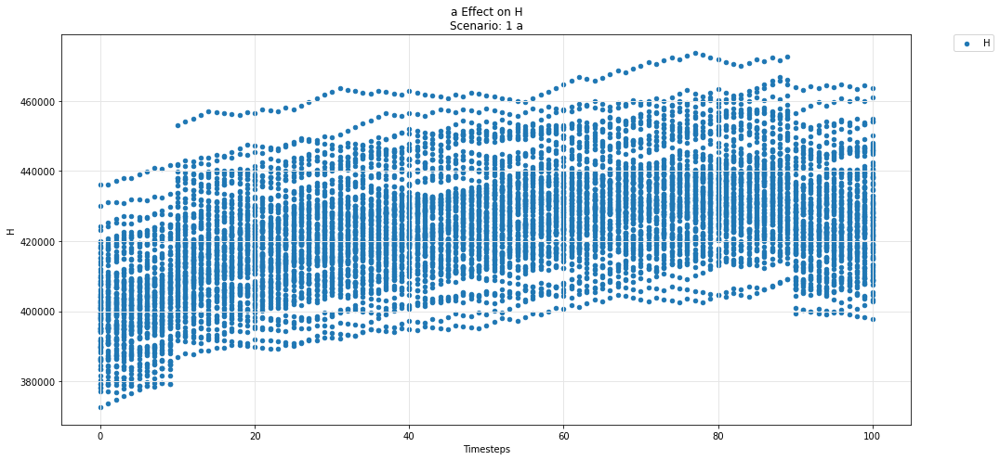

In [53]:
param_test_plot(experiments, config_ids, 'a', 'H')

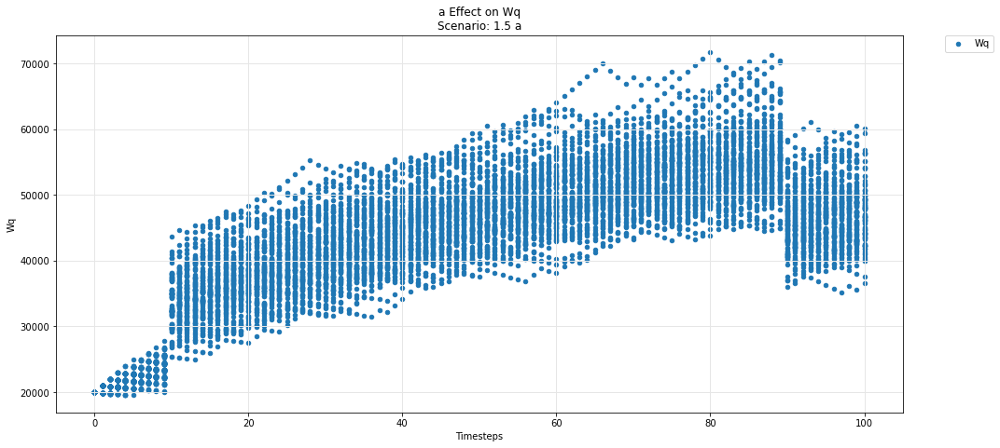

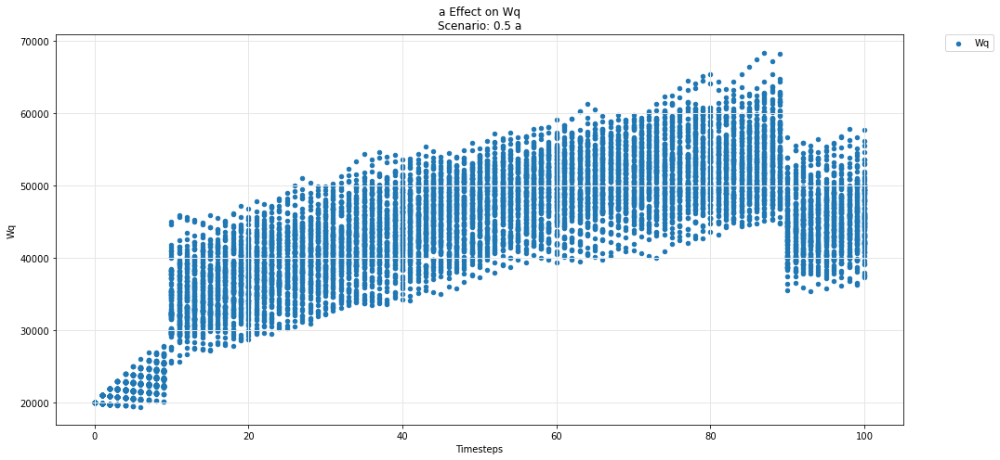

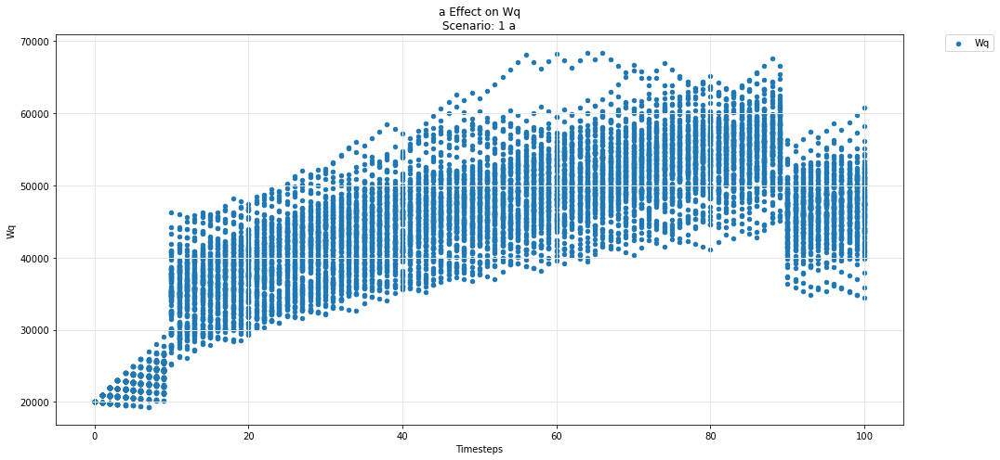

In [54]:
param_test_plot(experiments, config_ids, 'a', 'Wq')

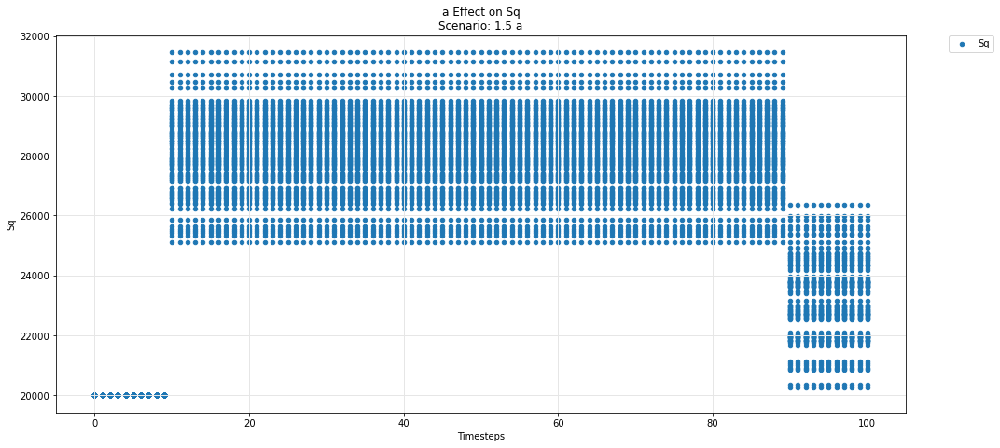

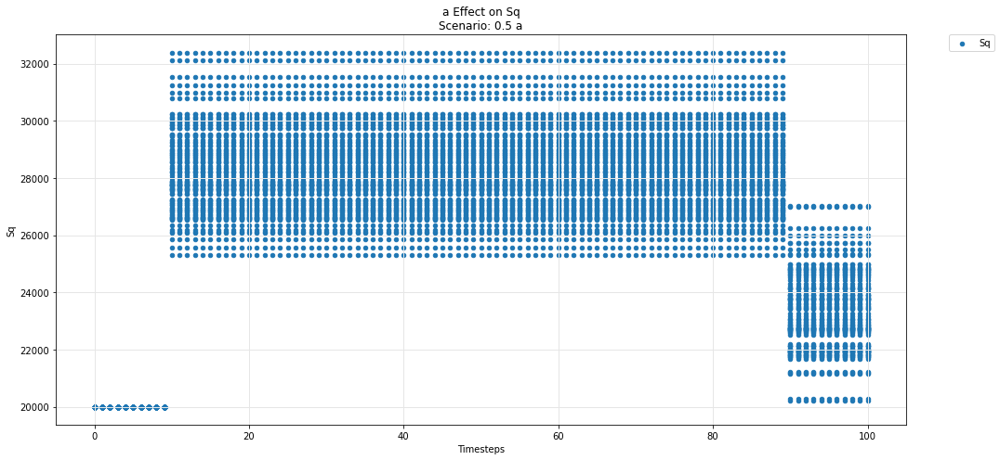

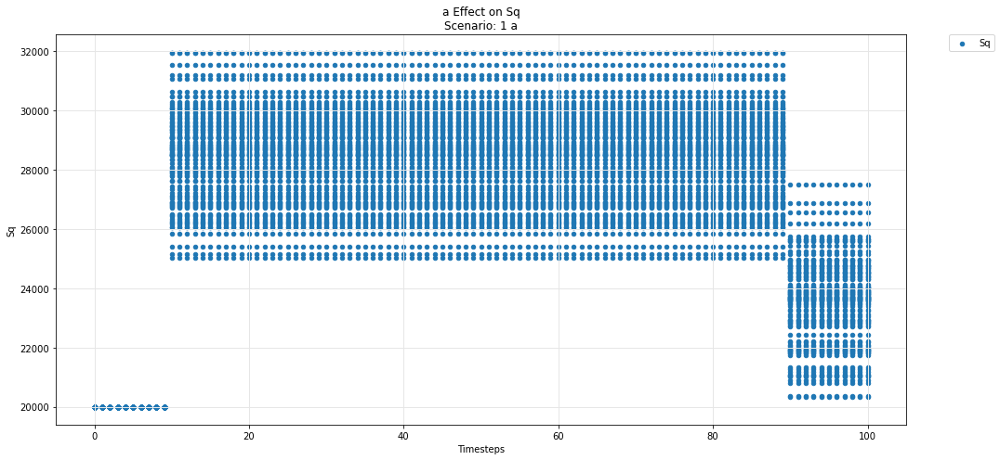

In [55]:
param_test_plot(experiments, config_ids, 'a', 'Sq')

## Hydra -- pool

Movement of the Omnipool variables
- Asset i
- Asset j
- Asset k

over the course of the simulation

In [56]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

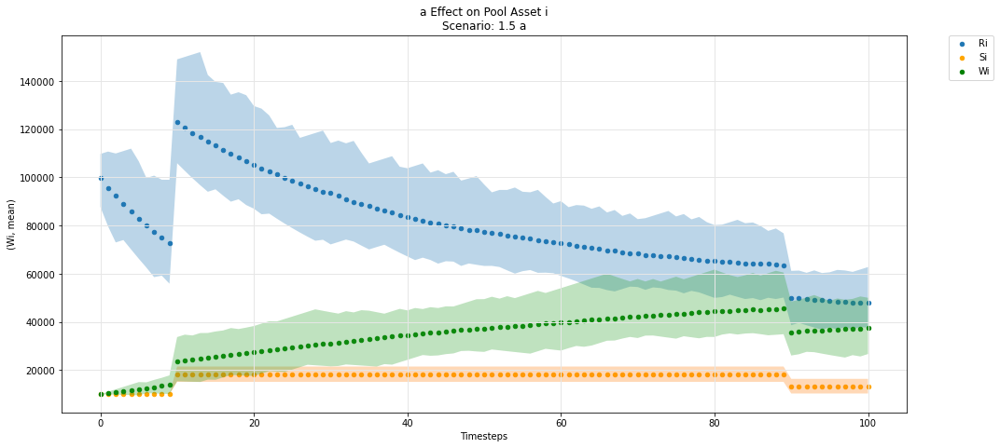

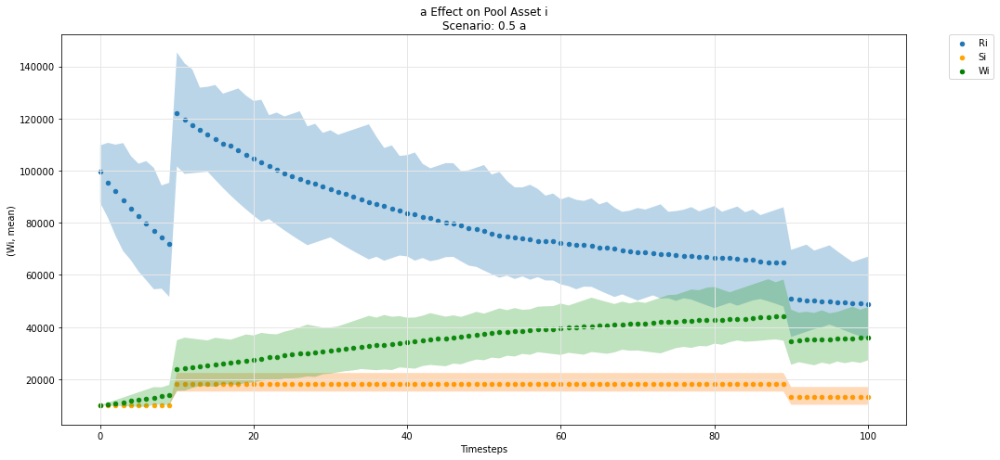

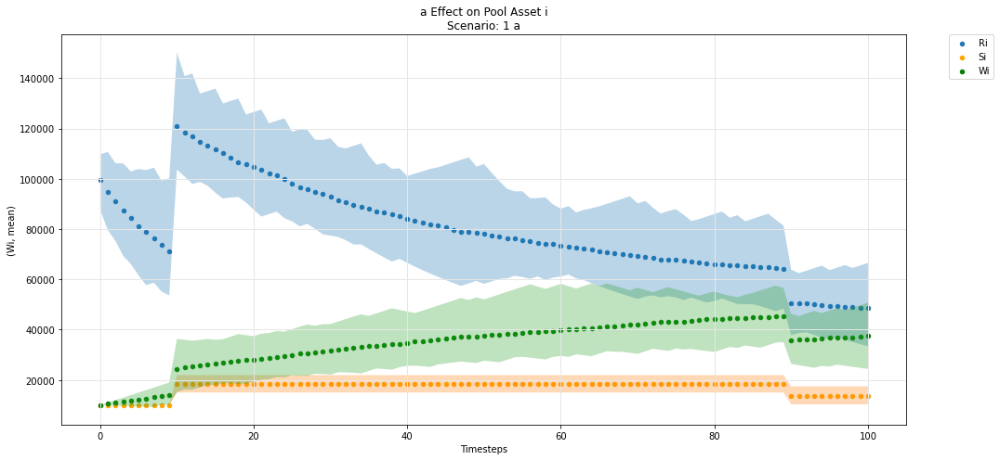

In [57]:
param_pool_simulation_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

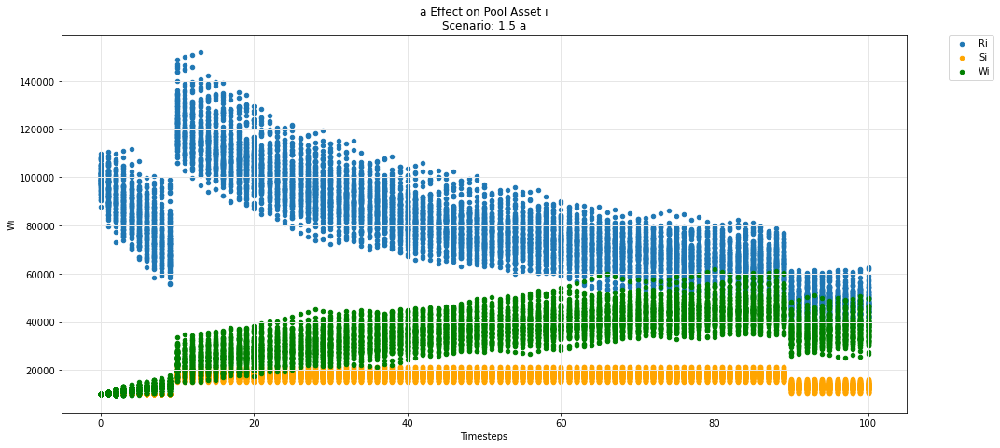

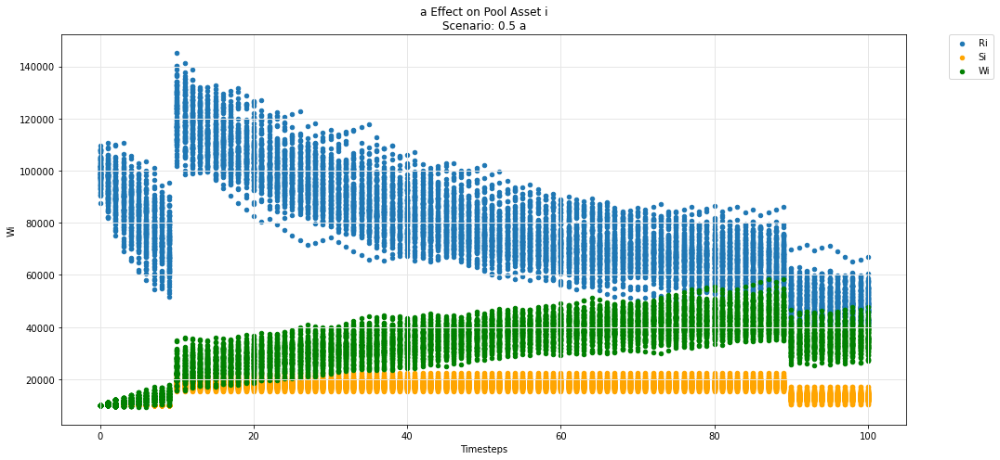

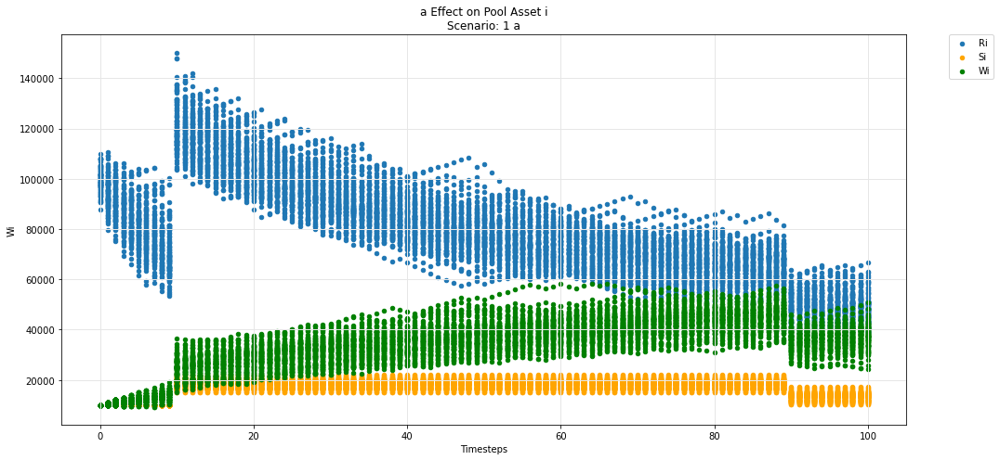

In [58]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

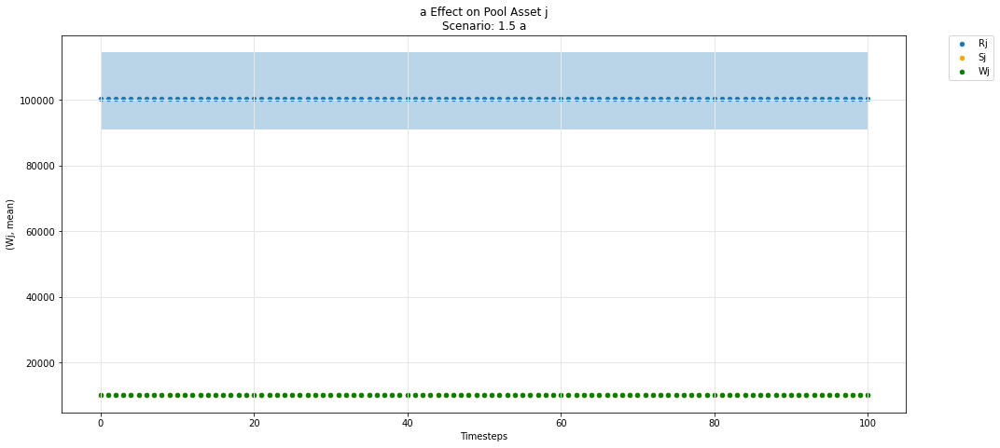

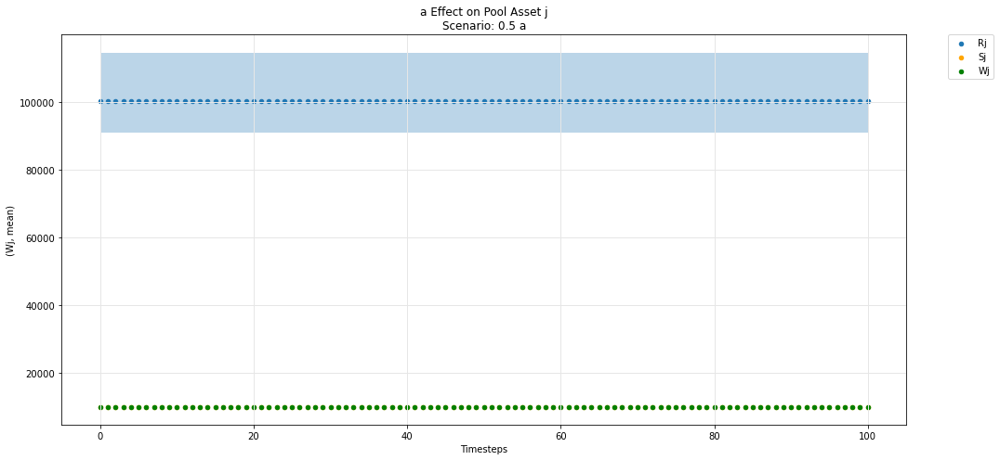

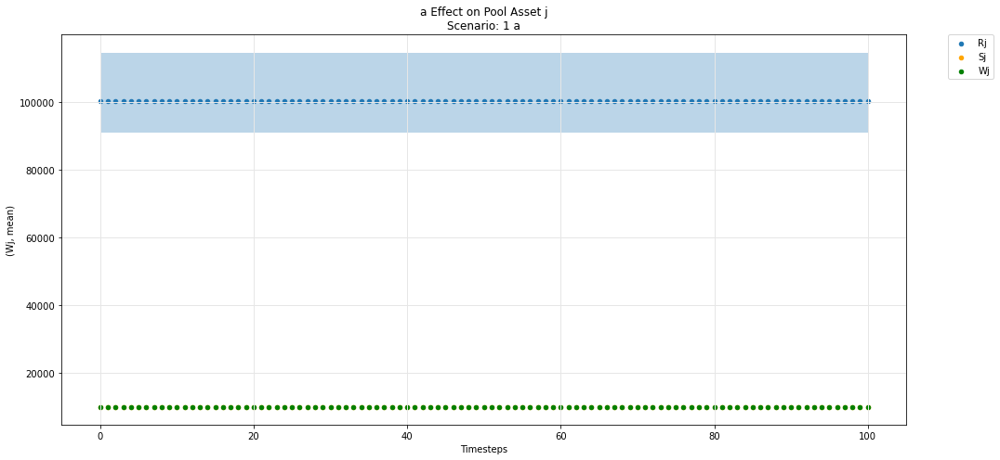

In [59]:
param_pool_simulation_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

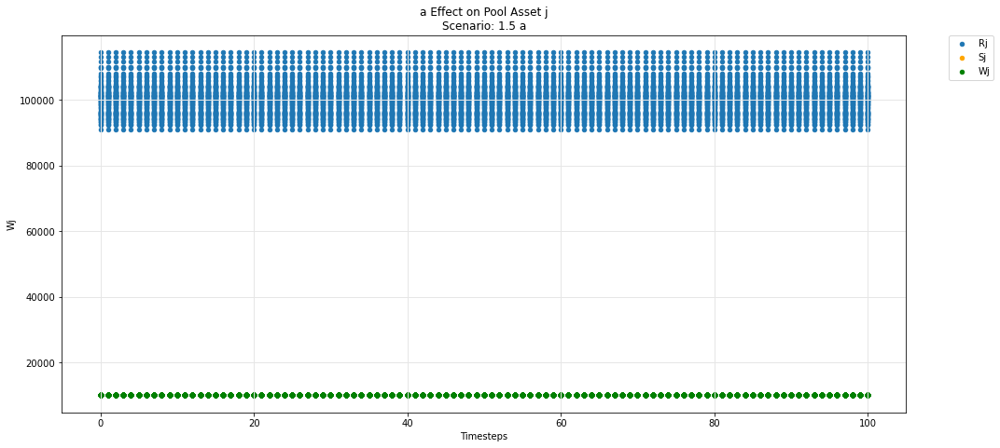

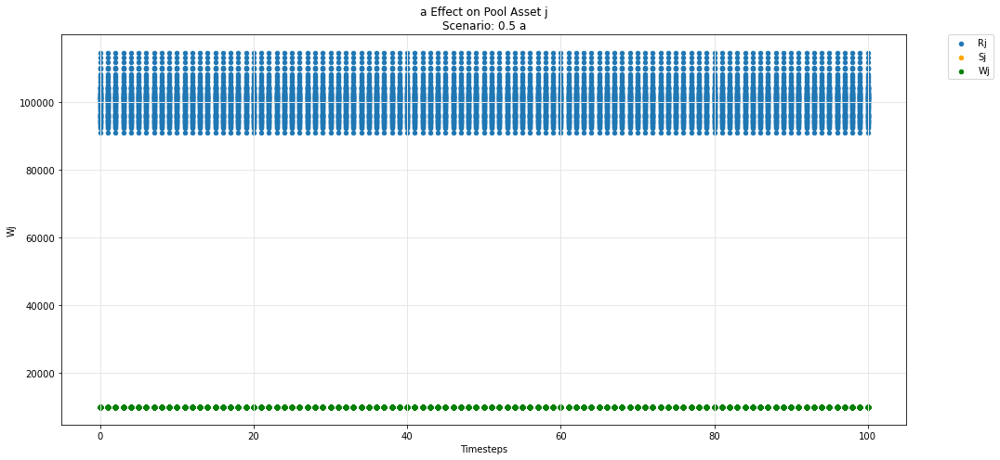

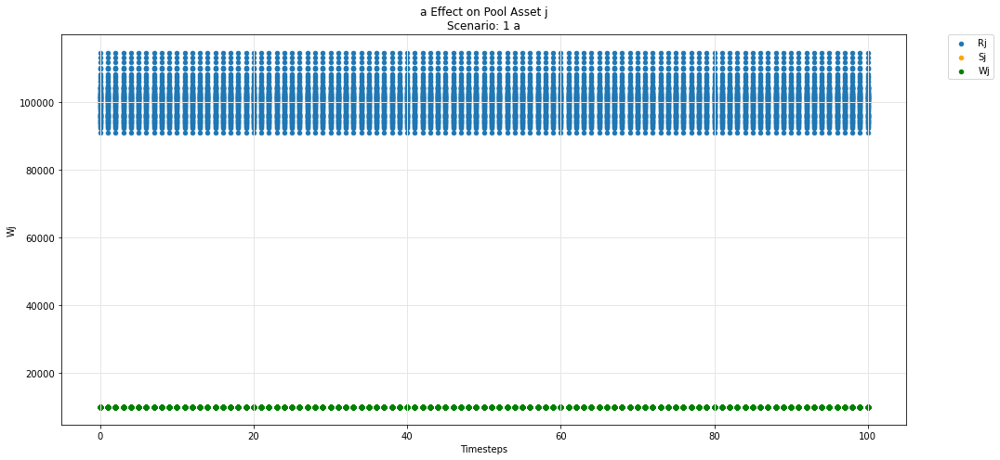

In [60]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

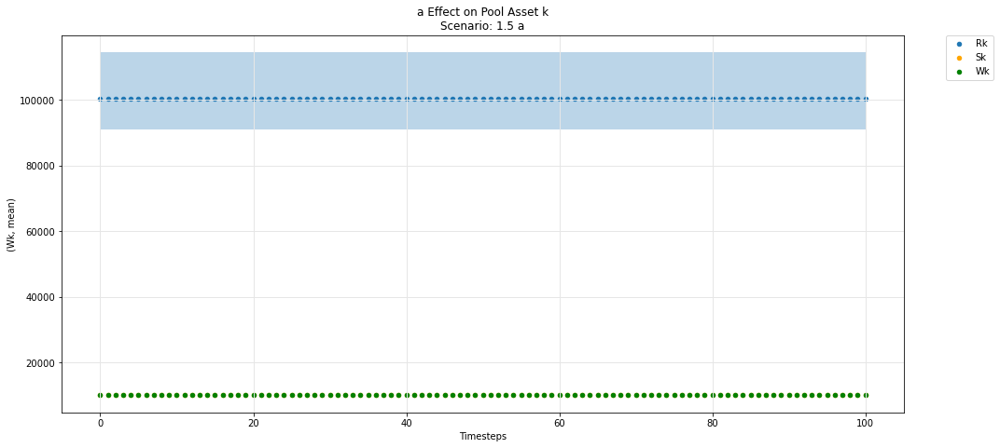

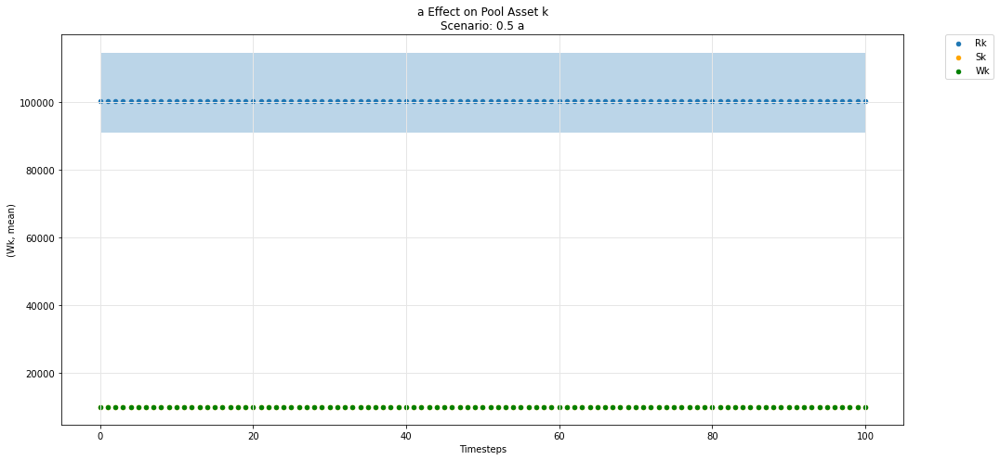

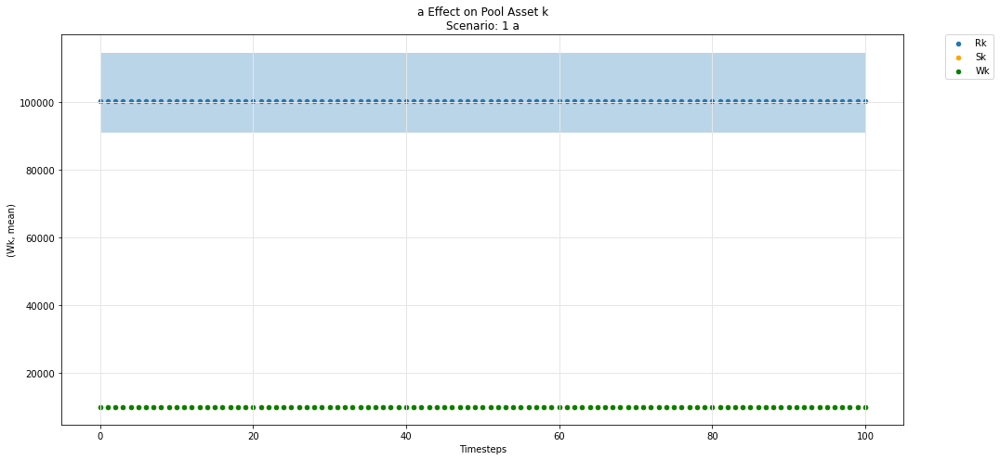

In [61]:
param_pool_simulation_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

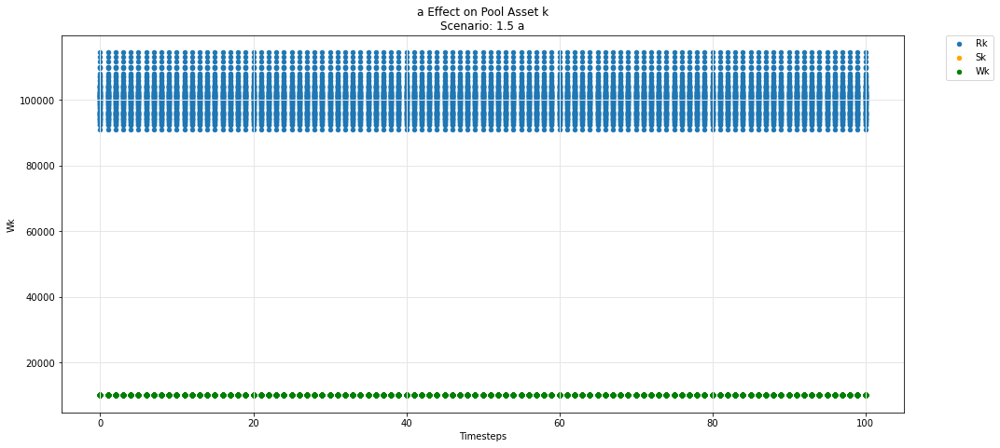

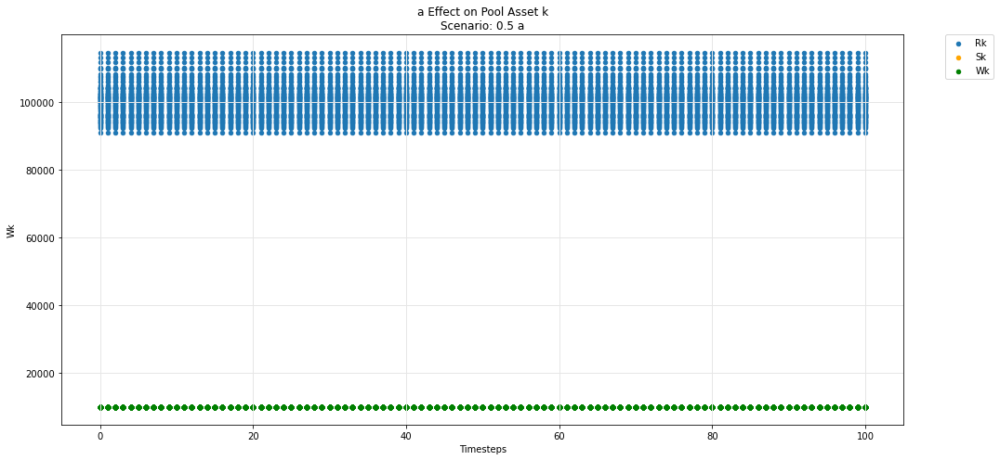

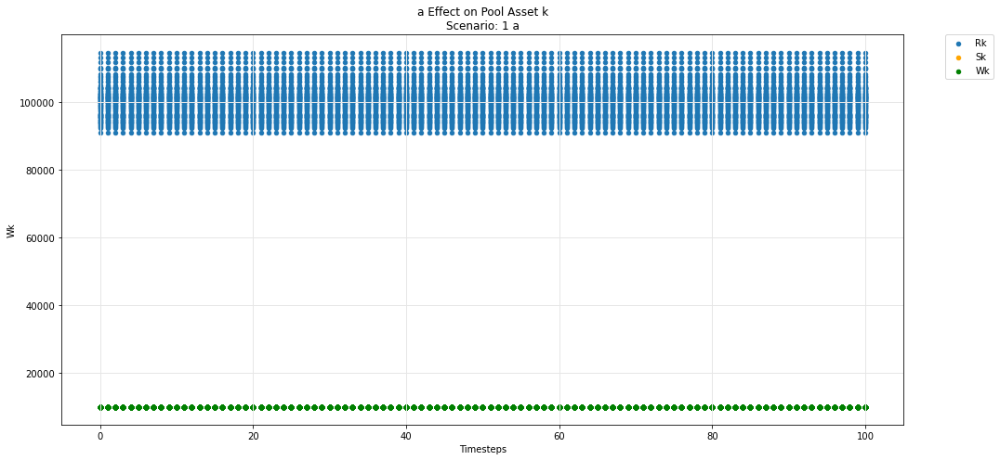

In [62]:
param_pool_plot(experiments, config_ids, 'a','k', 'R', 'S', 'W')

In [63]:
def param_pool_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=df_label, label=df_label, ax=ax, legend=True, kind ='scatter')

        for count, arg in enumerate(args):
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))

            df.plot(x='timestep', y=df_arg_label, label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

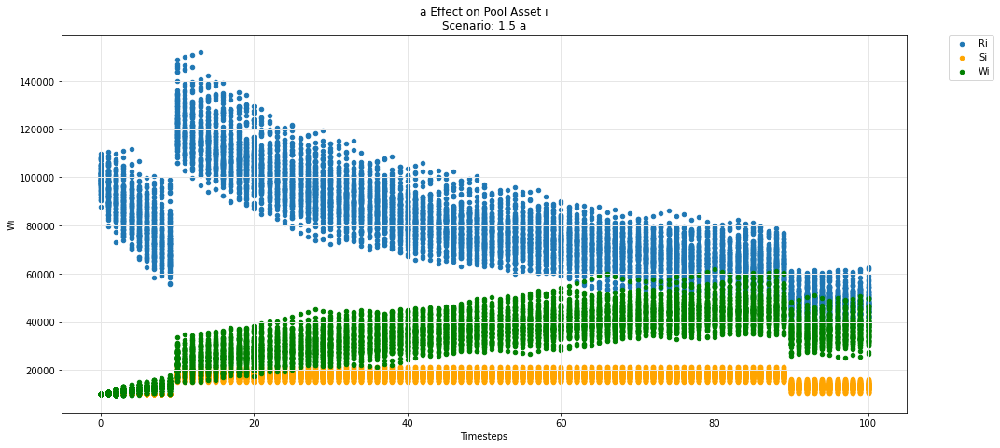

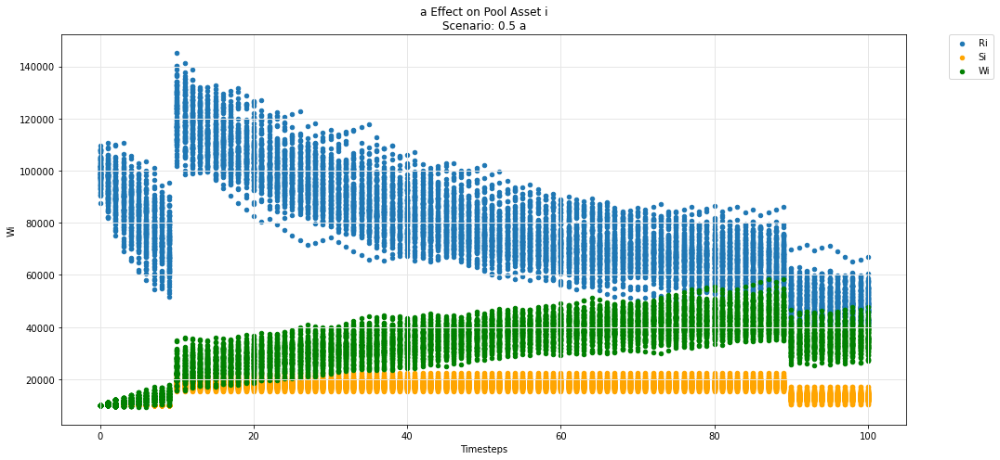

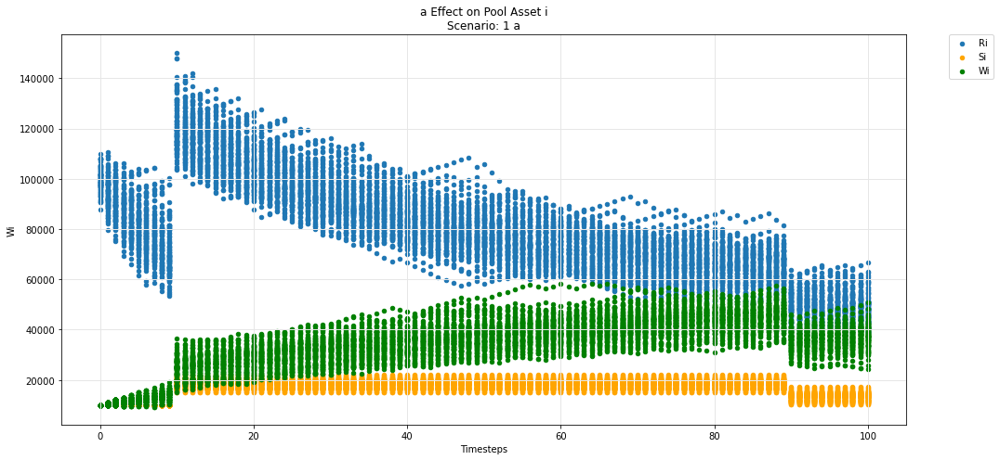

In [64]:
param_pool_plot(experiments, config_ids, 'a','i', 'R', 'S', 'W')

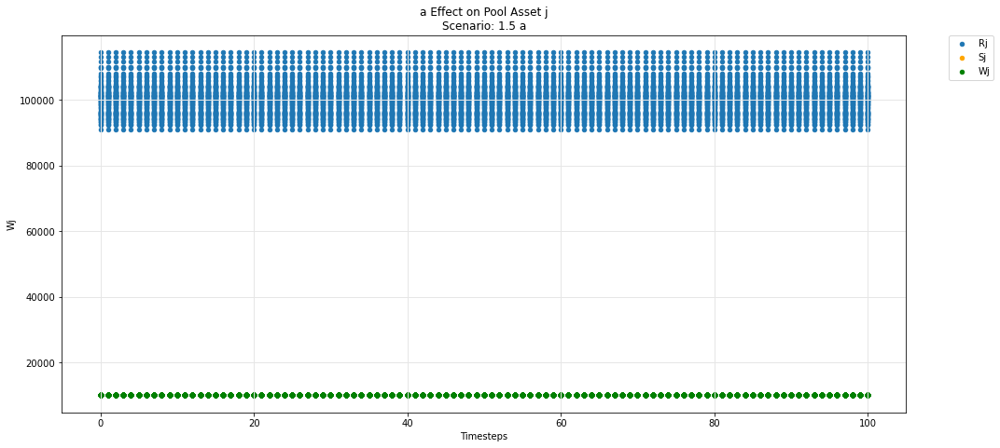

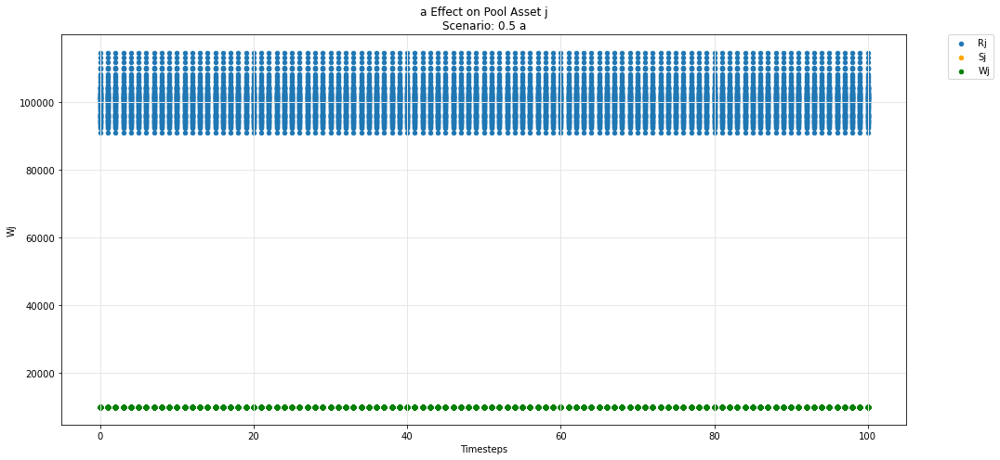

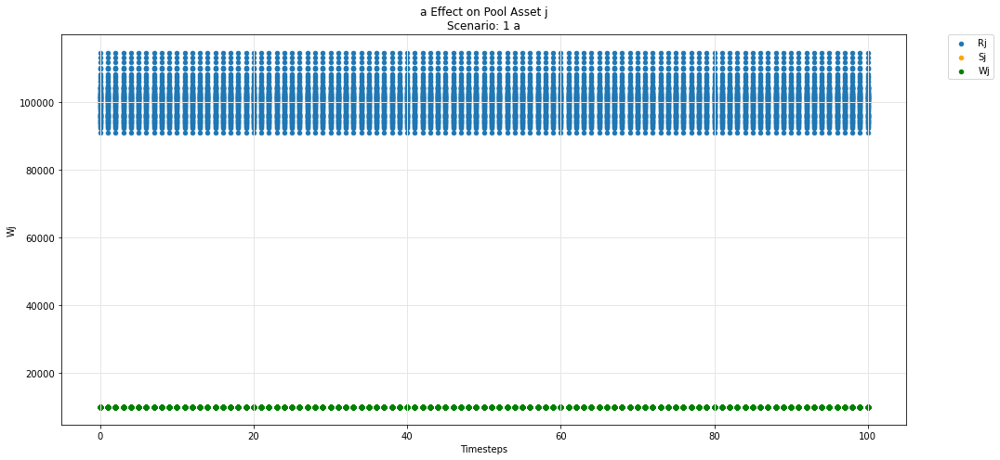

In [65]:
param_pool_plot(experiments, config_ids, 'a','j', 'R', 'S', 'W')

In [66]:
def param_pool_simulation_plot(experiments, config_ids, swept_variable, asset_id, y_variable, *args):
    """
    experiments is the simulation result dataframe.
    config_ids is the list configs executed upon in the simulation.
    swept_variable is the key (string) in config_ids that was being tested against.
    asset_id is the asset identifier in the pool (string) e.g i,j,k 
    y_variable is the state_variable (string) to be plotted against default timestep.

    *args for plotting more state_variables (string).
    """
    experiments = experiments.sort_values(by =['subset']).reset_index(drop=True)
    cols = 1
    rows = 1
    cc_idx = 0
    while cc_idx<len(experiments):
        cc = experiments.iloc[cc_idx]['subset']

        cc_label = experiments.iloc[cc_idx]['subset']

        secondary_label = [item['M'][swept_variable] for item in config_ids if  item["subset_id"]== cc_label]
        sub_experiments = experiments[experiments['subset']==cc]
        cc_idx += len(sub_experiments)
        fig, axs = plt.subplots(ncols=cols, nrows=rows, figsize=(15*cols,7*rows))

        df = sub_experiments.copy()

        df_label = y_variable + asset_id
        df[df_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][y_variable]))
        colors = ['orange', 'g', 'magenta', 'r', 'k' ]
        df = df.groupby('timestep').agg({df_label: ['min', 'mean', 'max']}).reset_index()
        ax = axs
        title = swept_variable + ' Effect on Pool Asset ' + asset_id + '\n' + 'Scenario: ' + str(secondary_label[0]) + ' ' + swept_variable
        # + 'Scenario: ' + str(cc_label)  + ' rules_price'
        ax.set_title(title)
        ax.set_ylabel('Funds')

        df.plot(x='timestep', y=(df_label,'mean'), label=df_label, ax=ax, legend=True, kind ='scatter')
        ax.fill_between(df.timestep, df[(df_label,'min')], df[(df_label,'max')], alpha=0.3)    
        for count, arg in enumerate(args):
            df = sub_experiments.copy()
            
            df_arg_label = arg + asset_id
            df[df_arg_label] = df.pool.apply(lambda x: np.array(x.pool[asset_id][arg]))
            df = df.groupby('timestep').agg({df_arg_label: ['min', 'mean', 'max']}).reset_index()

            df.plot(x='timestep', y=(df_arg_label,'mean'), label=df_arg_label, ax=ax, legend=True, color = colors[count], kind ='scatter')
            ax.fill_between(df.timestep, df[(df_arg_label,'min')], df[(df_arg_label,'max')], alpha=0.3)    

        ax.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

        ax.set_xlabel('Timesteps')
        ax.grid(color='0.9', linestyle='-', linewidth=1)

        plt.tight_layout()
            
    fig.tight_layout(rect=[0, 0, 1, .97])
    fig.patch.set_alpha(1)
    plt.close()
    return display(fig)

# Prices

## Uniswap

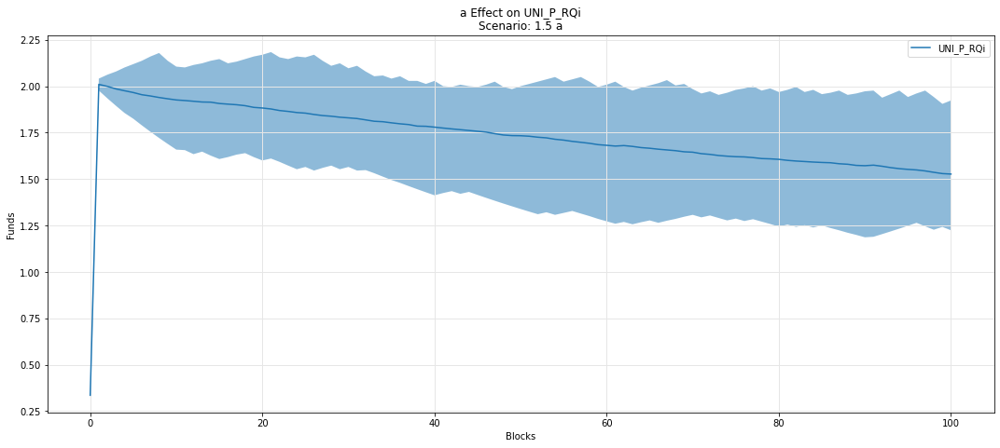

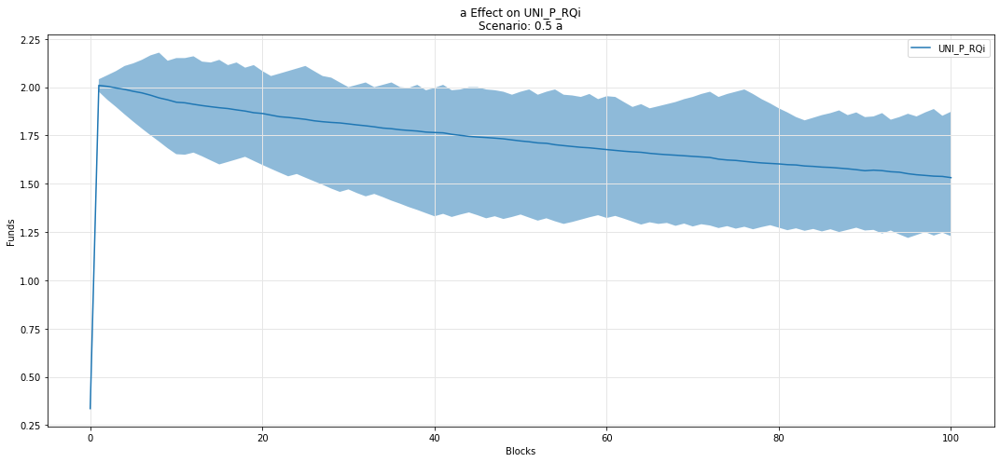

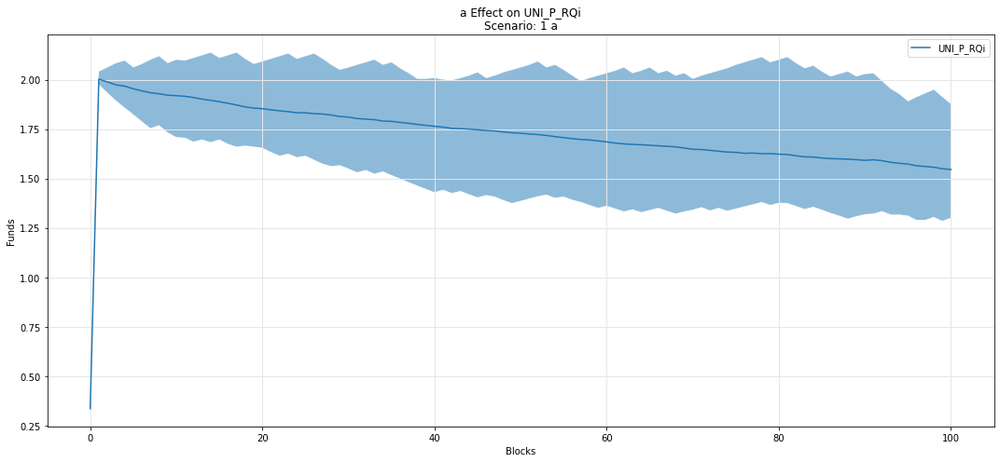

In [67]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQi')

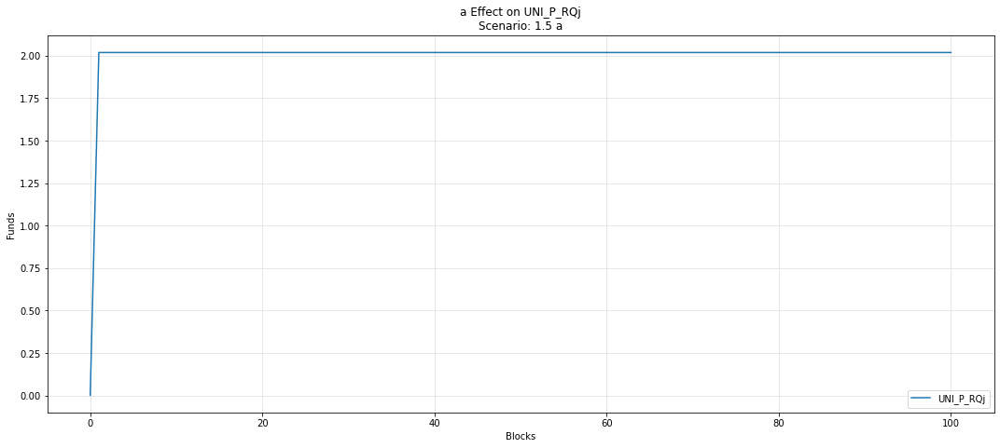

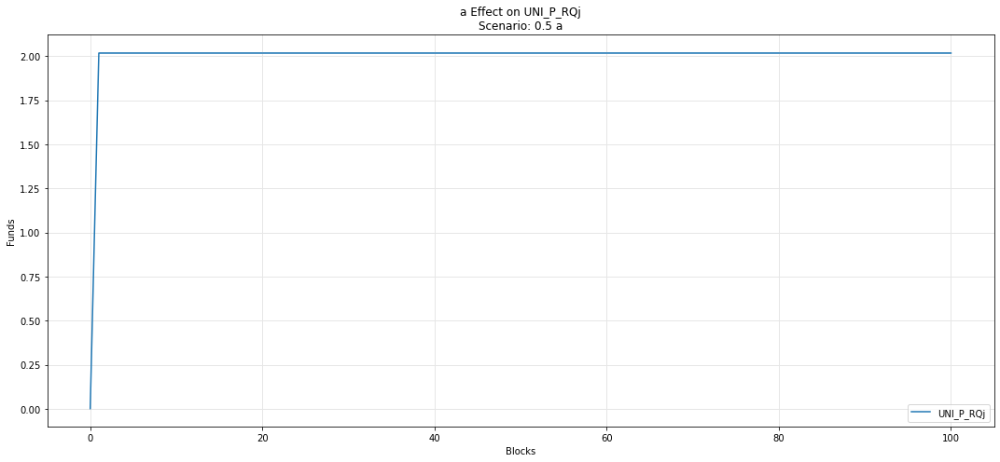

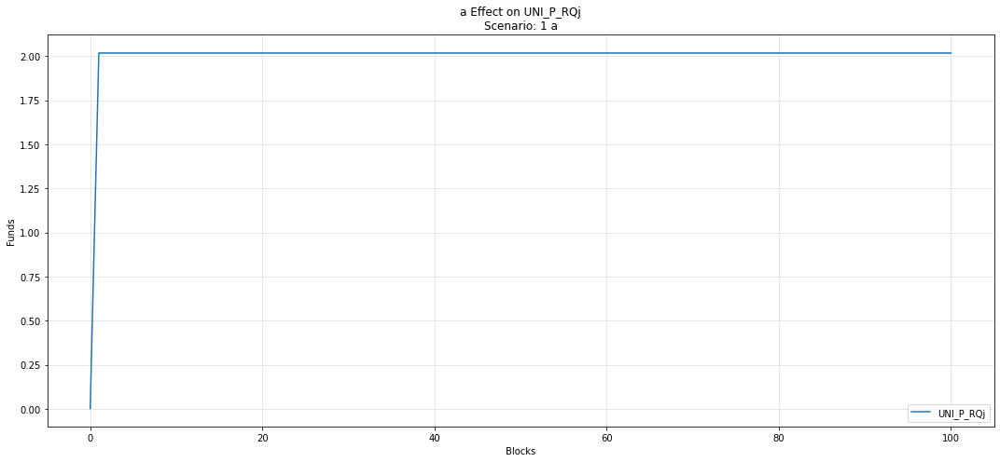

In [68]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_RQj')

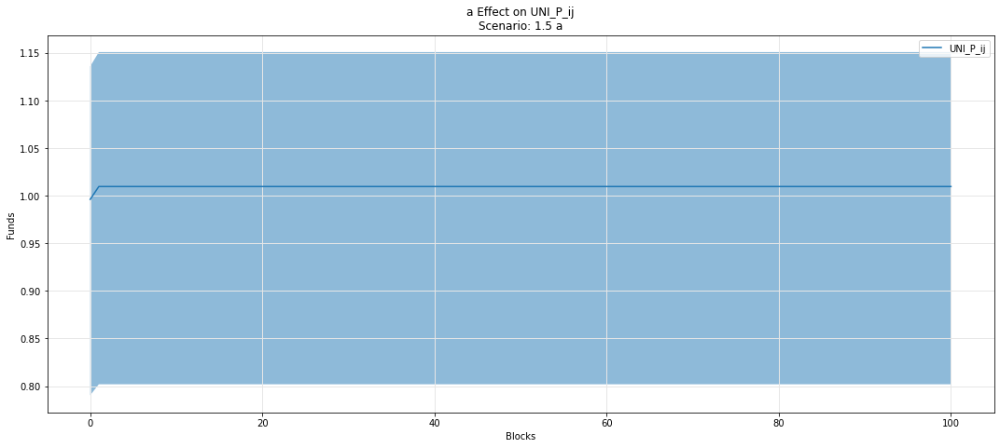

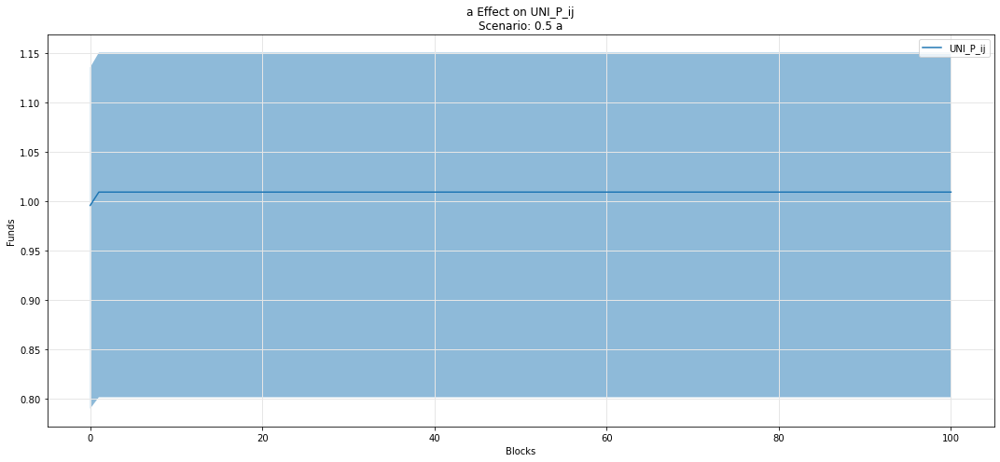

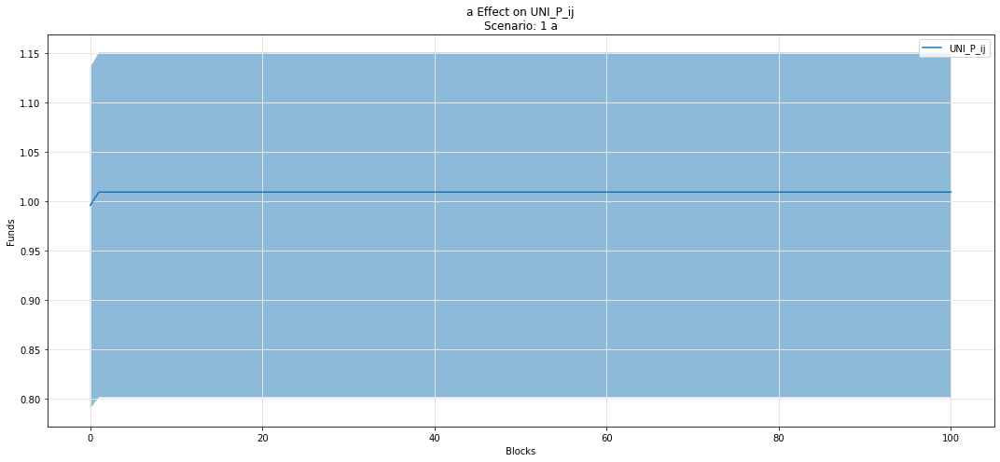

In [69]:
param_fan_plot3(experiments, config_ids, 'a', 'UNI_P_ij')

## Omnipool

## Asset i

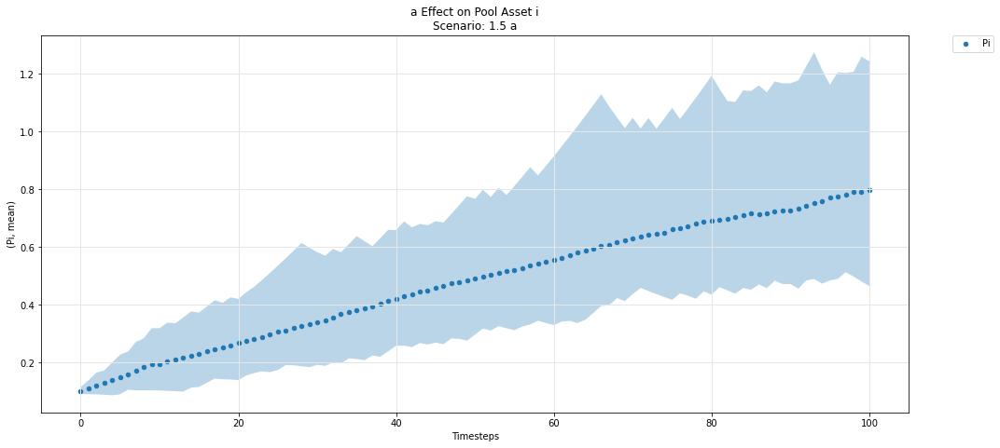

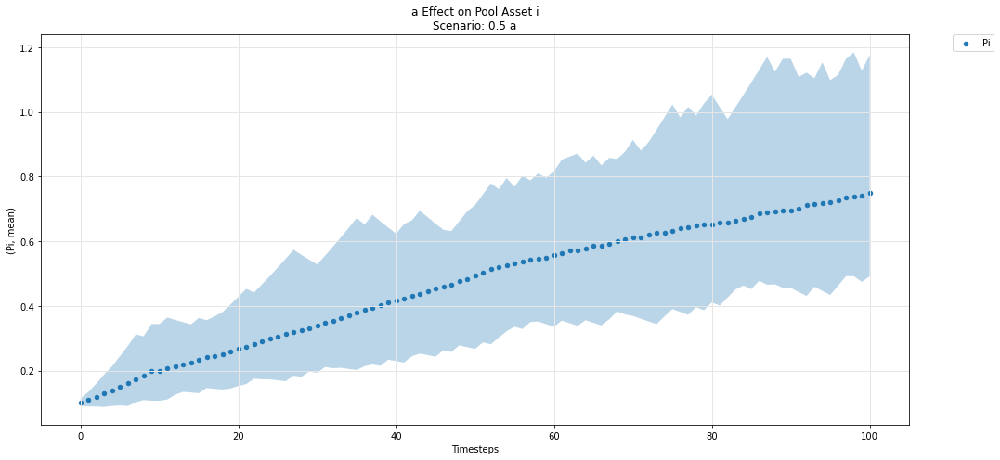

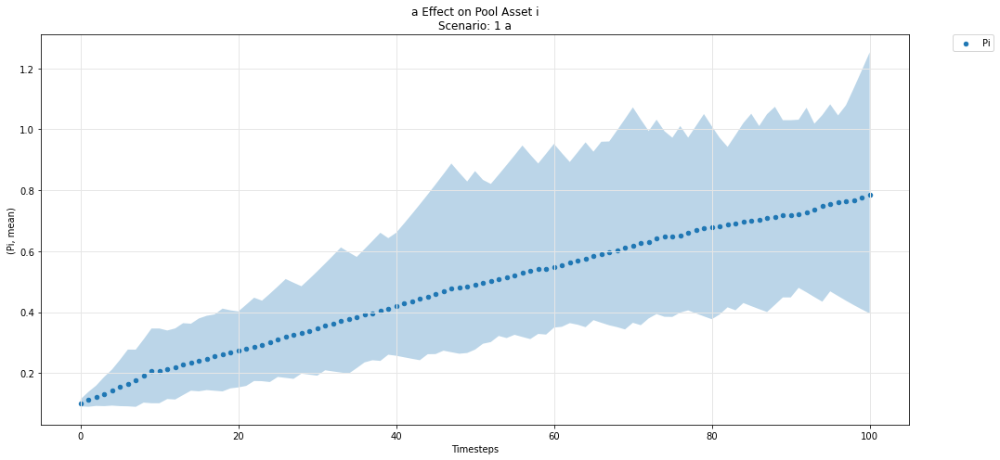

In [70]:
param_pool_simulation_plot(experiments, config_ids, 'a','i','P')

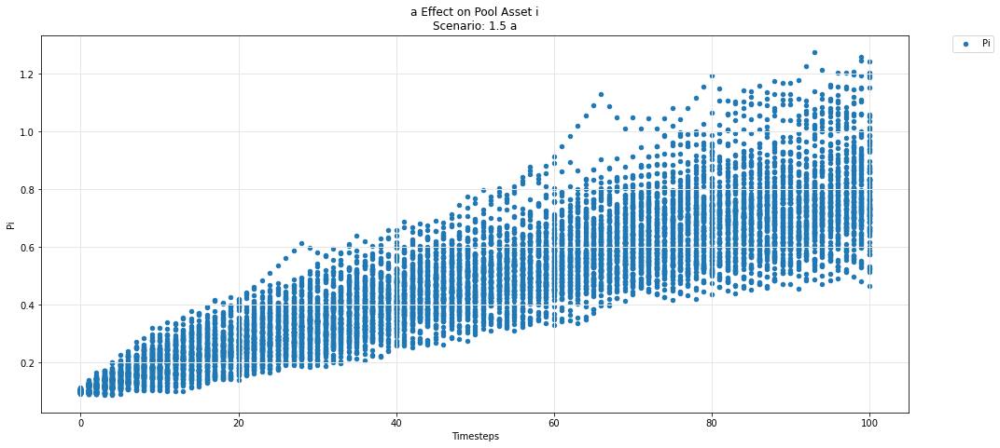

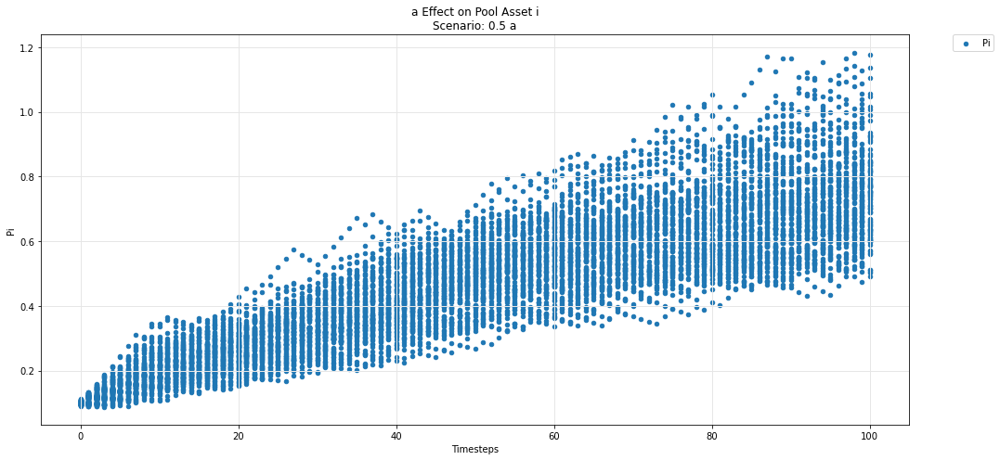

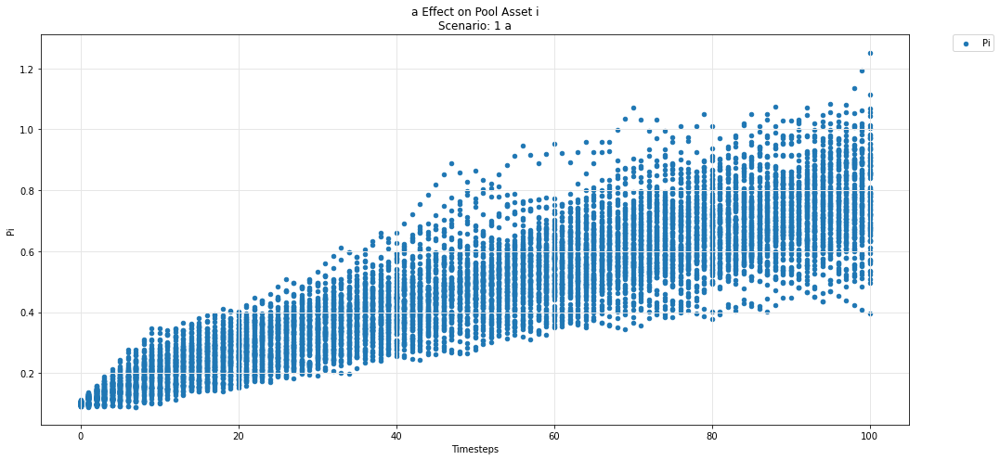

In [71]:
param_pool_plot(experiments, config_ids, 'a','i','P')

## Asset j

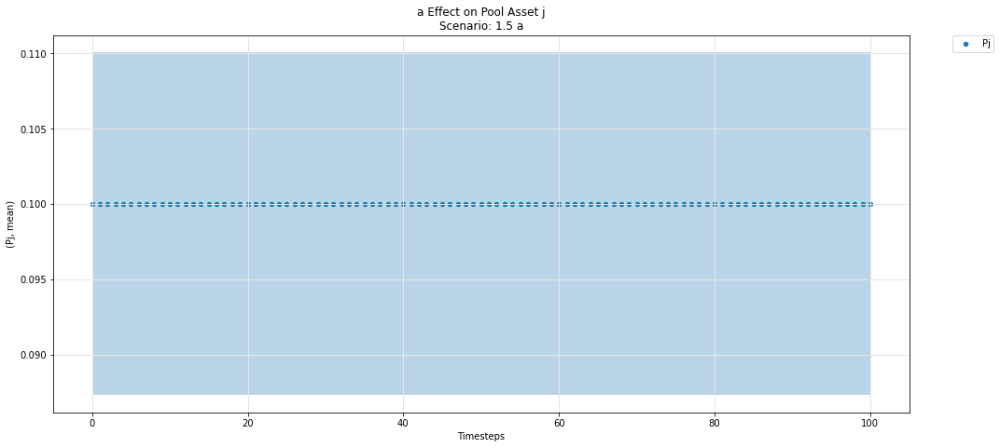

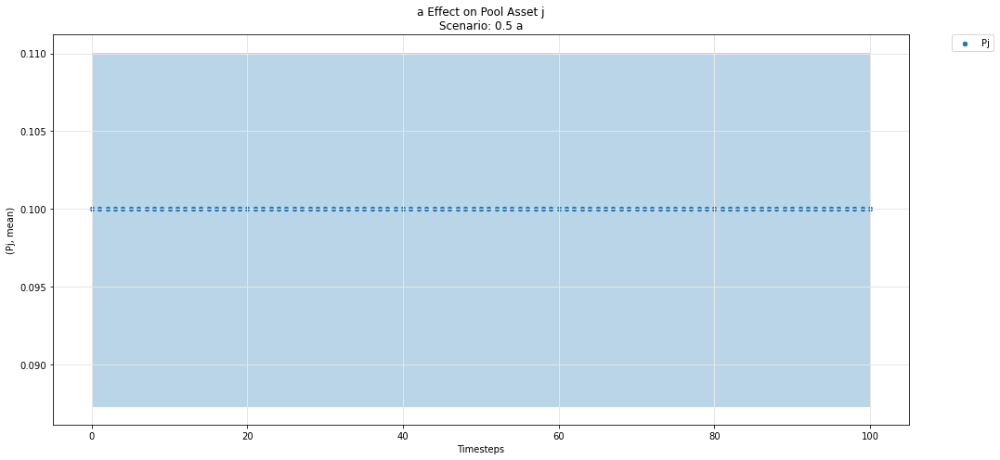

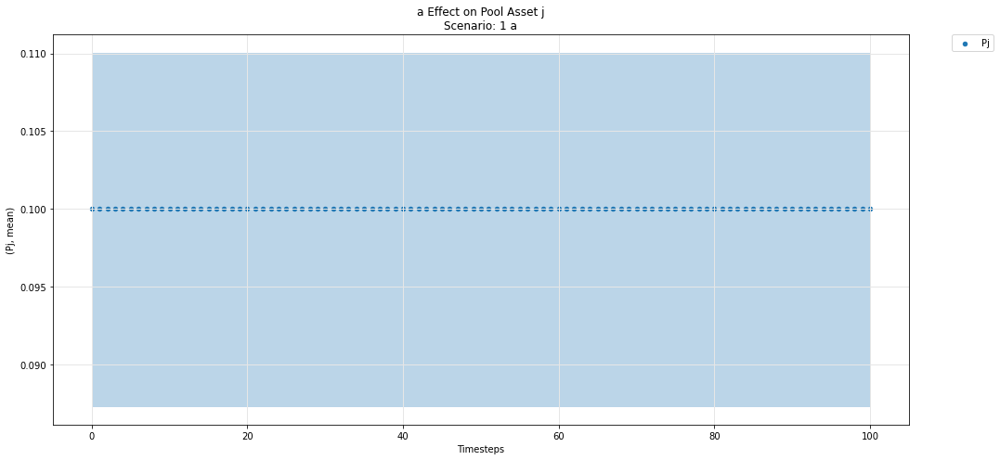

In [72]:
param_pool_simulation_plot(experiments, config_ids, 'a','j','P')

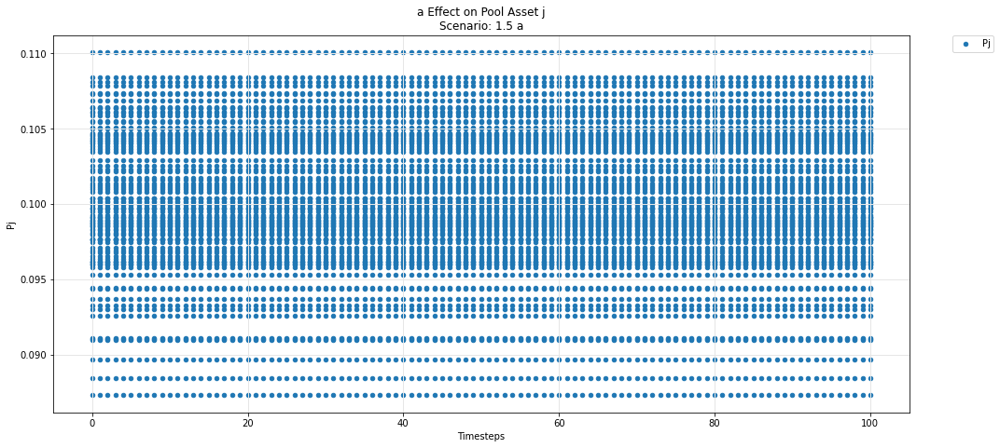

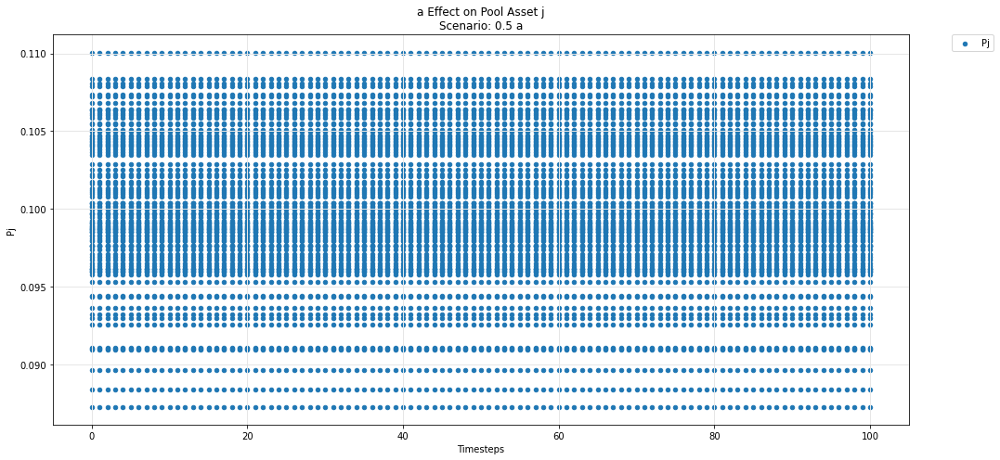

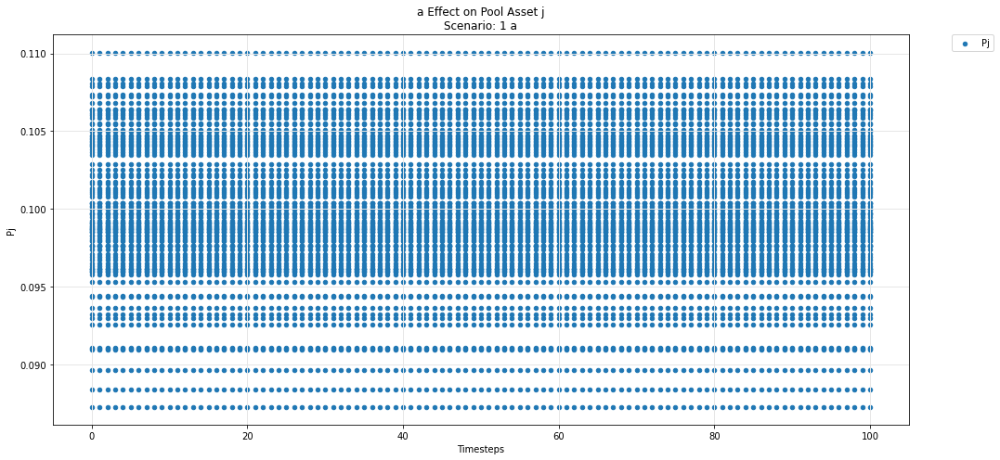

In [73]:
param_pool_plot(experiments, config_ids, 'a','j','P')

## Asset k

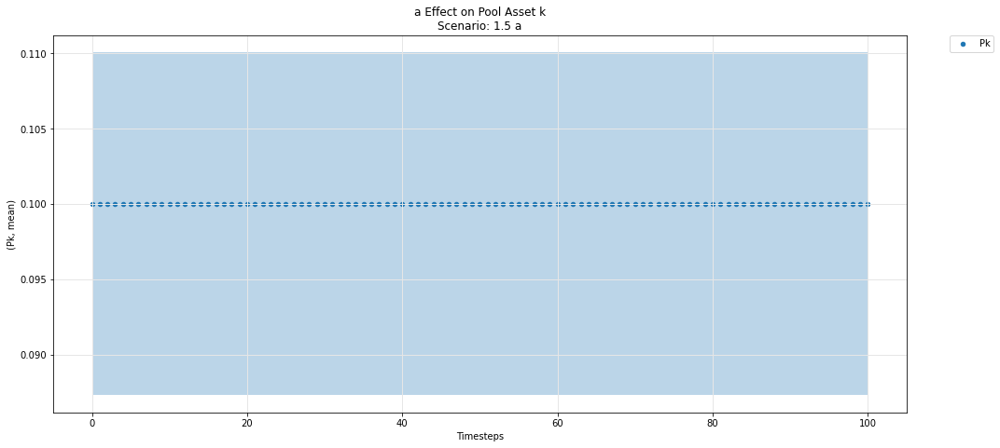

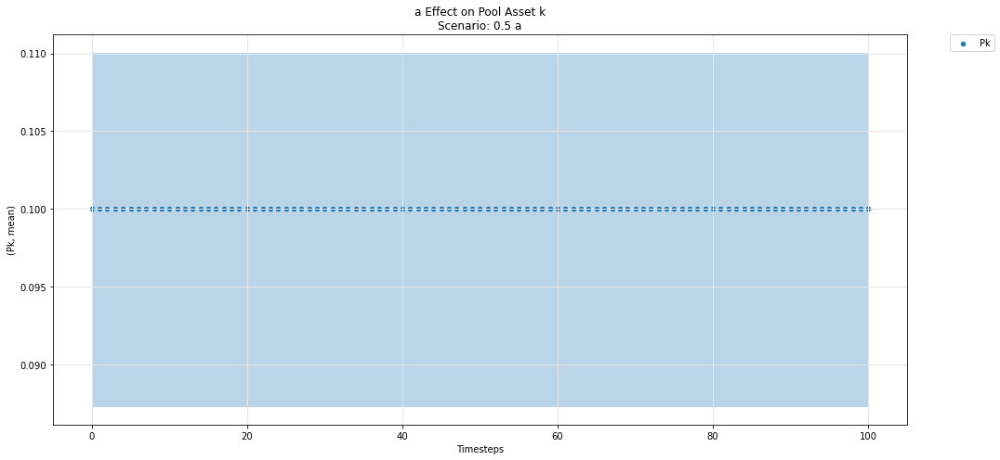

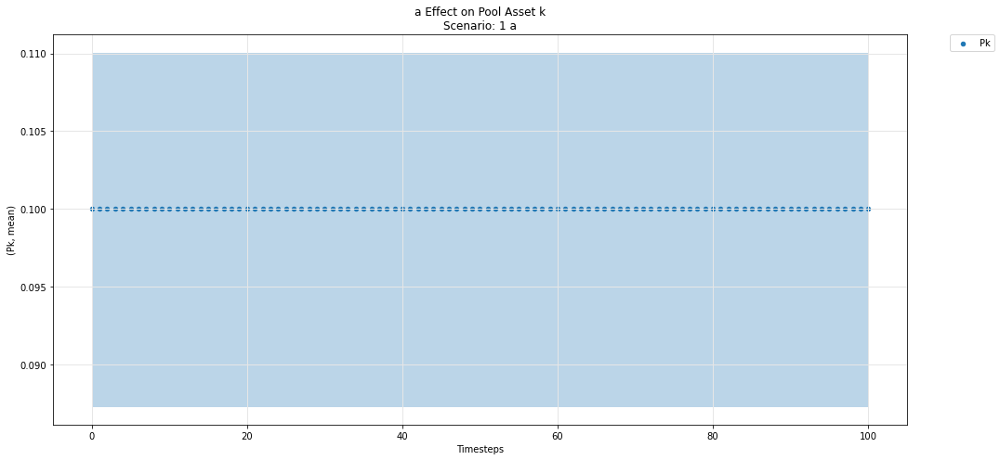

In [74]:
param_pool_simulation_plot(experiments, config_ids, 'a','k','P')

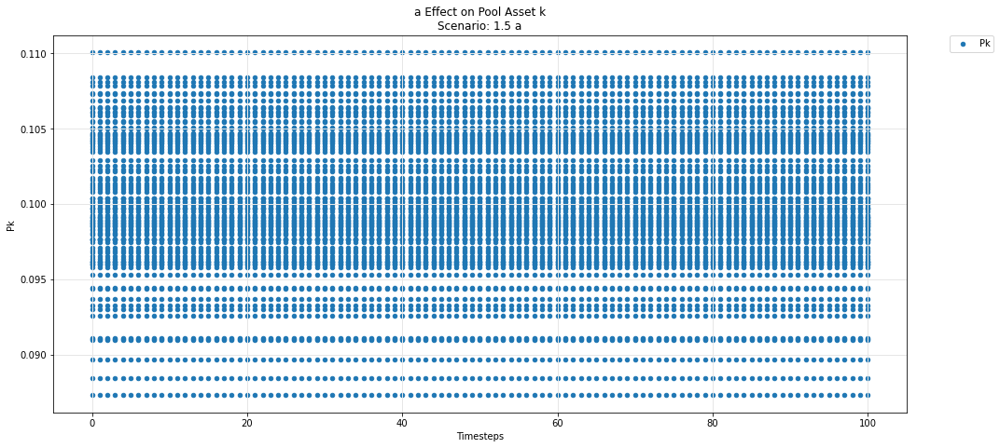

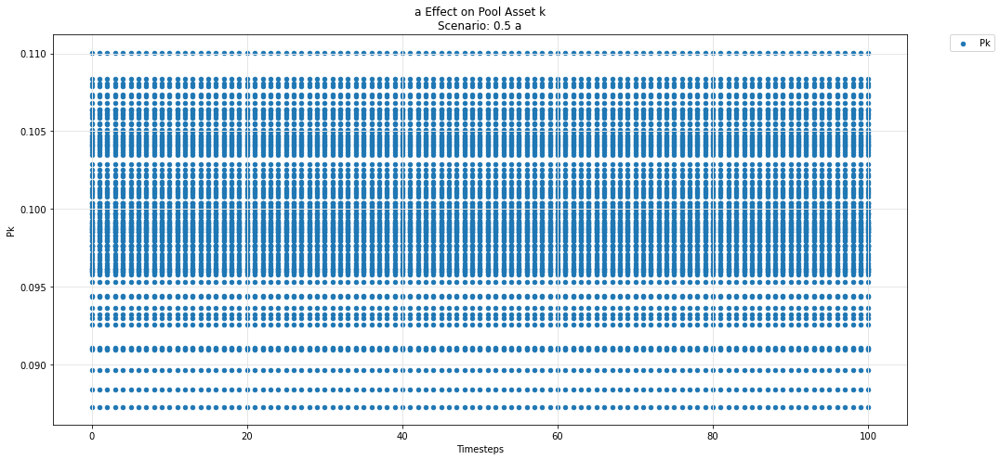

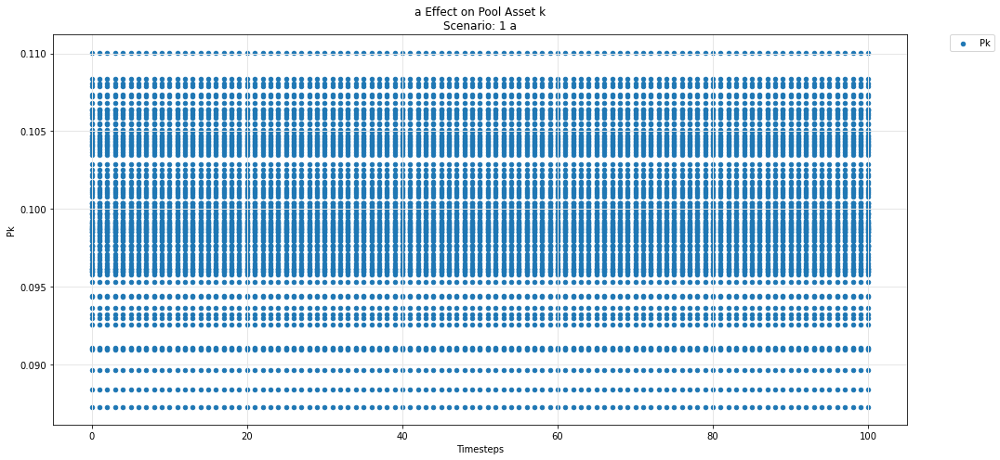

In [75]:
param_pool_plot(experiments, config_ids, 'a','k','P')